In [55]:
# Import packages and implement notebook settings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import scipy

pd.set_option('display.max_rows', 1000); pd.set_option('display.max_columns', 1000); pd.set_option('display.width', 1000)

%matplotlib inline 

sns.set_theme(style="darkgrid")


In [57]:
import numpy as np
import pandas as pd

from sklearn.model_selection import KFold

from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score
from sklearn.metrics import r2_score

import time


# GA_listings_df import and summary

In [60]:
GA_listings_df = pd.read_csv('GA_LISTINGS_SALES_V2.csv',
           index_col = 0)

GA_listings_df.head()


,latitude,longitude,full_street_address,city,county_name,beds,baths_full,baths_half,square_footage,lot_size,year_built,details,special_features,unit_count,price,transaction_type,listing_status,listing_special_features,census_state_name,census_county_name,zip
0,30.725605,-83.671772,0 Johnson Road #10026497,Quitman,Brooks-County,NaN,NaN,NaN,NaN,4.0,NaN,"Lots/Land, 4.93 Acres",0,NaN,51900,1,0,0,Georgia,"Brooks, GA",31643.0
1,30.781796,-83.558475,505 S Lee Street,Quitman,Brooks-County,3.0,1.0,NaN,1460.0,0.0,1910.0,"Detached, 3 Beds, 1 Bath, 1,460 Sq Ft",0,NaN,99000,1,1,0,Georgia,"Brooks, GA",31643.0
2,30.864096,-81.622765,33 River Oaks Street,Woodbine,Camden-County,3.0,2.0,NaN,1254.0,0.0,1985.0,"Detached, 3 Beds, 2 Baths, 1,254 Sq Ft",0,NaN,245816,1,1,0,Georgia,"Camden, GA",31569.0
3,30.796300,-81.681675,605 E Lawnwood Avenue,Kingsland,Camden-County,2.0,2.0,NaN,1016.0,0.0,2005.0,"Townhouse, 2 Beds, 2 Baths, 1,016 Sq Ft",0,NaN,155000,1,1,0,Georgia,"Camden, GA",31548.0
4,30.762972,-81.660240,84 Whippoorwill Circle,Kingsland,Camden-County,3.0,2.0,NaN,1618.0,0.0,1986.0,"Detached, 3 Beds, 2 Baths, 1,618 Sq Ft",0,NaN,200000,1,1,0,Georgia,"Camden, GA",31548.0


In [62]:
GA_listings_df.shape

(31064, 21)

In [64]:
GA_listings_df.describe()

,latitude,longitude,beds,baths_full,baths_half,square_footage,lot_size,year_built,special_features,unit_count,price,transaction_type,listing_status,listing_special_features,zip
count,31064.000000,31064.000000,14167.000000,13978.000000,5855.000000,1.267800e+04,28387.000000,16620.000000,31064.000000,219.000000,3.106400e+04,31064.0,31064.000000,31064.000000,31028.000000
mean,33.667087,-83.793974,3.600692,2.513950,1.103501,3.216709e+03,19.311093,1985.574489,2.511879,3.529680,4.942250e+05,1.0,0.958891,2.511879,30553.727246
std,0.957898,0.996623,1.366697,1.253564,0.528206,2.546856e+04,657.400055,34.329650,34.077367,6.351536,1.332321e+06,0.0,0.198545,34.077367,774.253758
min,30.361079,-85.522663,0.000000,0.000000,0.000000,0.000000e+00,0.000000,1700.000000,0.000000,1.000000,1.000000e+00,1.0,0.000000,0.000000,0.000000
25%,33.302195,-84.428492,3.000000,2.000000,1.000000,1.450000e+03,0.000000,1967.000000,0.000000,2.000000,9.000000e+04,1.0,1.000000,0.000000,30165.000000
50%,33.825564,-84.015629,3.000000,2.000000,1.000000,2.052000e+03,1.000000,1994.000000,0.000000,2.000000,2.850000e+05,1.0,1.000000,0.000000,30512.000000
75%,34.323055,-83.461731,4.000000,3.000000,1.000000,2.952000e+03,3.000000,2010.000000,0.000000,4.000000,5.229468e+05,1.0,1.000000,0.000000,30650.000000
max,34.995653,-80.841980,71.000000,56.000000,10.000000,2.090880e+06,73616.000000,2023.000000,514.000000,89.000000,1.626270e+08,1.0,1.000000,514.000000,92544.000000


# Missing Data Exploration

In [67]:
# Columns with missing data and the number of values

GA_listings_df.isnull().sum(axis=0)[GA_listings_df.isnull().sum(axis=0) > 0]

beds              16897
baths_full        17086
baths_half        25209
square_footage    18386
lot_size           2677
year_built        14444
unit_count        30845
zip                  36
dtype: int64

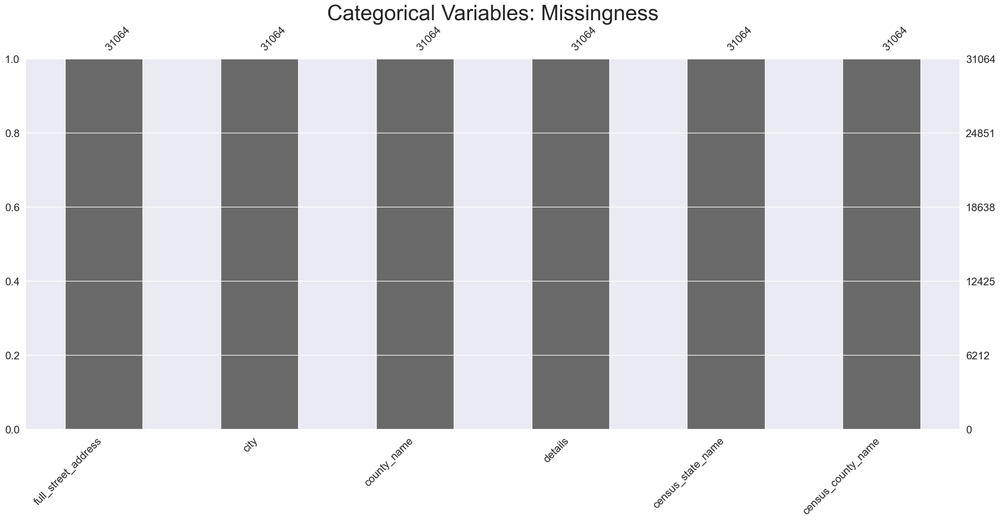

In [69]:
# Missing categorical values
sns.set_theme(style="darkgrid")

msno.bar(GA_listings_df.select_dtypes(include=['object']), sort = 'ascending')
plt.title('Categorical Variables: Missingness', fontsize = 32)
plt.show()


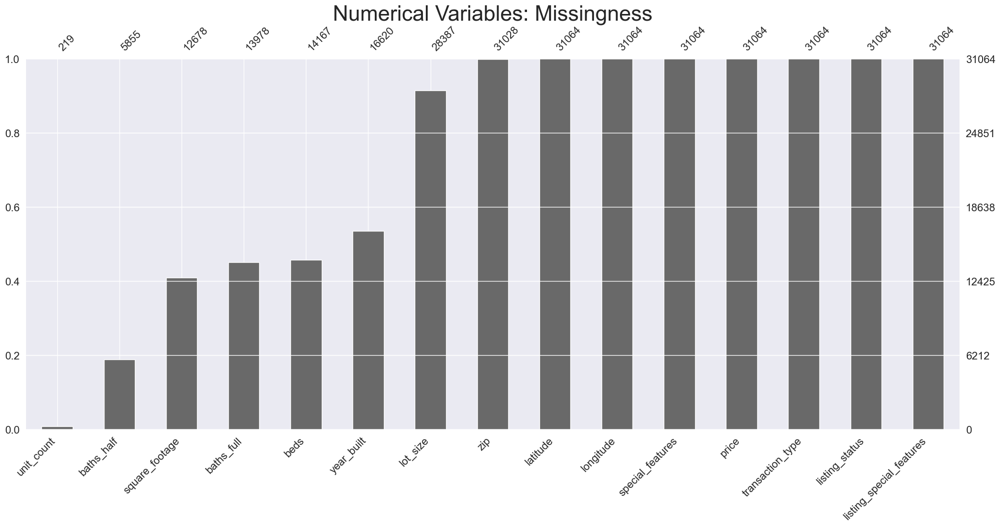

In [71]:
# Missing numerical values

msno.bar(GA_listings_df.select_dtypes(include=['int64', 'float64']), sort = 'ascending')
plt.title('Numerical Variables: Missingness', fontsize = 32)
plt.show()


In [73]:
# Imputation for missing beds, baths_half, baths_full, square_footage, year_built

GA_listings_df['beds'] = GA_listings_df['beds'].fillna(0) # fill with 0
GA_listings_df['baths_half'] = GA_listings_df['baths_half'].fillna(0) # fill with 0
GA_listings_df['baths_full'] = GA_listings_df['baths_full'].fillna(0) # fill with 0
GA_listings_df['square_footage'] = GA_listings_df['square_footage'].fillna(0) # fill with 0
GA_listings_df['year_built'] = GA_listings_df['year_built'].fillna(0) # fill with 0




In [75]:
# Imputation for lot_size

# Function that will extract acreage from 'details' column
def extract_acres(row):
    for item in row.split(','):
        if 'Acres' in item:
            return item.strip().split(' Acres')[0]
        
# Replace 'lot_size' column with full acreage value (no rounding) and fill with 0 if no information present
GA_listings_df['lot_size'] = GA_listings_df['details'].apply(extract_acres).fillna(0).astype(float)


In [77]:
# Imputation for unit_count
# If number of beds are greater than 1 but unit_count is missing value, assigning it a value of 1.
# Otherwise, filling value with 0.

GA_listings_df['unit_count'] = np.where(GA_listings_df['beds'] >= 1, GA_listings_df['unit_count'].fillna(1), GA_listings_df['unit_count'].fillna(0))


In [79]:
# Imputation for zip

from geopy.geocoders import Nominatim

# Define the function to get ZIP code from latitude and longitude
def get_zipcode(latitude, longitude):
    geolocator = Nominatim(user_agent="zipcode_locator")
    location = geolocator.reverse((latitude, longitude), exactly_one=True)
    address = location.raw['address']
    return address.get('postcode')

# Apply the function only to rows with missing ZIP code values
missing_zip_rows = GA_listings_df[GA_listings_df['zip'].isna()]

# Using .loc to ensure the DataFrame is modified in place
GA_listings_df.loc[GA_listings_df['zip'].isna(), 'zip'] = missing_zip_rows.apply(
    lambda row: get_zipcode(row['latitude'], row['longitude']), axis=1
)

# Convert 'zip' column to int64, handling any remaining NaNs
GA_listings_df['zip'] = GA_listings_df['zip'].fillna(0).astype('int64')

/var/folders/y7/3944zvgd1vl909042ycfg4fw0000gn/T/ipykernel_2216/1892351367.py:16: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '['30680' '30120' '31566' '31566' '30108' '31322' '31012' '30092' '30531'
 '30531' '30531' '30531' '30531' '30531' '30531' None '30281' '30281'
 '30281' '30281' '30434' '30442' '31028' '31028' '31028' '31028' '31028'
 '31028' '31322' '30531' '30531' '30531' '30531' '30531' '30531' '30531']' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  GA_listings_df.loc[GA_listings_df['zip'].isna(), 'zip'] = missing_zip_rows.apply(


In [80]:
# # Imputation for zip

# from geopy.geocoders import Nominatim

# # Define the function to get ZIP code from latitude and longitude
# def get_zipcode(latitude, longitude):
#     geolocator = Nominatim(user_agent="zipcode_locator")
#     location = geolocator.reverse((latitude, longitude), exactly_one=True)
#     address = location.raw['address']
#     return address.get('postcode')


# # Apply the function only to rows with missing ZIP code values
# missing_zip_rows = GA_listings_df[GA_listings_df['zip'].isna()]
# missing_zip_rows['zip'] = missing_zip_rows.apply(lambda row: get_zipcode(row['latitude'], row['longitude']), axis=1)

# # Update the original DataFrame with the imputed ZIP codes
# GA_listings_df.update(missing_zip_rows)

# GA_listings_df['zip'] = GA_listings_df['zip'].astype('int64')


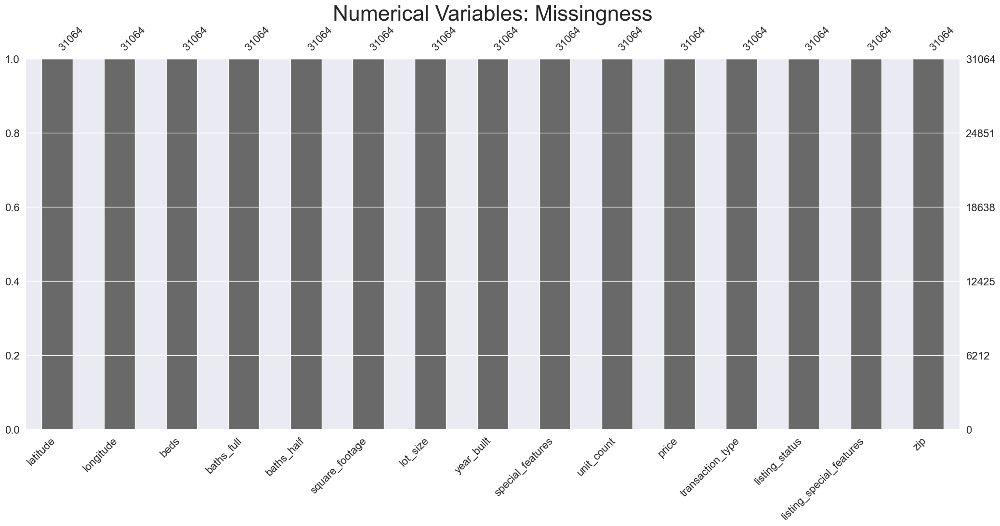

In [81]:
# Missing categorical values
sns.set_theme(style="darkgrid")

msno.bar(GA_listings_df.select_dtypes(include=['int64', 'float64']), sort = 'ascending')
plt.title('Numerical Variables: Missingness', fontsize = 32)
plt.show()


# Feature Engineering

In [87]:
# Extracting first descriptor in details column

GA_listings_df['property_type'] = GA_listings_df['details'].str.split(',').str[0] 

GA_listings_df.head()

,latitude,longitude,full_street_address,city,county_name,beds,baths_full,baths_half,square_footage,lot_size,year_built,details,special_features,unit_count,price,transaction_type,listing_status,listing_special_features,census_state_name,census_county_name,zip,property_type
0,30.725605,-83.671772,0 Johnson Road #10026497,Quitman,Brooks-County,0.0,0.0,0.0,0.0,4.93,0.0,"Lots/Land, 4.93 Acres",0,0.0,51900,1,0,0,Georgia,"Brooks, GA",31643,Lots/Land
1,30.781796,-83.558475,505 S Lee Street,Quitman,Brooks-County,3.0,1.0,0.0,1460.0,0.00,1910.0,"Detached, 3 Beds, 1 Bath, 1,460 Sq Ft",0,1.0,99000,1,1,0,Georgia,"Brooks, GA",31643,Detached
2,30.864096,-81.622765,33 River Oaks Street,Woodbine,Camden-County,3.0,2.0,0.0,1254.0,0.00,1985.0,"Detached, 3 Beds, 2 Baths, 1,254 Sq Ft",0,1.0,245816,1,1,0,Georgia,"Camden, GA",31569,Detached
3,30.796300,-81.681675,605 E Lawnwood Avenue,Kingsland,Camden-County,2.0,2.0,0.0,1016.0,0.00,2005.0,"Townhouse, 2 Beds, 2 Baths, 1,016 Sq Ft",0,1.0,155000,1,1,0,Georgia,"Camden, GA",31548,Townhouse
4,30.762972,-81.660240,84 Whippoorwill Circle,Kingsland,Camden-County,3.0,2.0,0.0,1618.0,0.00,1986.0,"Detached, 3 Beds, 2 Baths, 1,618 Sq Ft",0,1.0,200000,1,1,0,Georgia,"Camden, GA",31548,Detached


In [89]:
GA_listings_df[['details','property_type']].head()

,details,property_type
0,"Lots/Land, 4.93 Acres",Lots/Land
1,"Detached, 3 Beds, 1 Bath, 1,460 Sq Ft",Detached
2,"Detached, 3 Beds, 2 Baths, 1,254 Sq Ft",Detached
3,"Townhouse, 2 Beds, 2 Baths, 1,016 Sq Ft",Townhouse
4,"Detached, 3 Beds, 2 Baths, 1,618 Sq Ft",Detached


In [91]:
GA_listings_df.shape

(31064, 22)

# crime_rating_zipcode import and summary


In [94]:
crime_rating_df = pd.read_csv('crime_rating_zipcode.csv')
crime_rating_df = crime_rating_df.drop(columns = 'Unnamed: 0')

crime_rating_df.head()


,census_state_abbr,census_zcta5_geoid,census_cbsa_geoid_count,census_cbsa_geoid_list,overall_crime_grade,violent_crime_grade,violent_crime_total_rate,violent_crime_assault_rate,violent_crime_robbery_rate,violent_crime_rape_rate,violent_crime_murder_rate,property_crime_grade,property_crime_total_rate,property_crime_theft_rate,property_crime_vehicle_theft_rate,property_crime_burglary_rate,property_crime_arson_rate,other_crime_grade,other_crime_total_rate,other_crime_kidnapping_rate,other_crime_drug_crimes_rate,other_crime_vandalism_rate,other_crime_identity_theft_rate,other_crime_animal_cruelty_rate,crime_safety_paragraph,interpreting_crime_map_paragraph
0,GA,30002,1,12060,D-,C,3.106,1.7060,1.0670,0.2545,0.0783,F,52.09,43.96,3.687,4.337,0.1075,B+,5.987,0.1236,0.9456,3.981,0.8824,0.0542,The D- grade means the rate of crime is much h...,"When looking at the crime map for 30002, remem..."
1,GA,30004,1,12060,C-,A-,1.553,0.9140,0.3858,0.2240,0.0296,D-,32.63,29.14,1.124,2.263,0.1017,A+,3.171,0.0404,0.7863,1.524,0.8159,0.0042,The C- grade means the rate of crime is slight...,"When looking at the crime map for 30004, remem..."
2,GA,30005,1,12060,B+,A-,1.480,0.7977,0.4288,0.2256,0.0275,C,15.39,11.97,1.468,1.844,0.1118,A+,2.709,0.0512,0.3942,1.394,0.8653,0.0041,The B+ grade means the rate of crime is lower ...,"When looking at the crime map for 30005, remem..."
3,GA,30008,1,12060,D+,C,2.910,1.2040,1.3940,0.2531,0.0594,D,28.26,20.84,2.066,5.261,0.0946,B-,7.648,0.0883,0.9090,5.777,0.8214,0.0522,The D+ grade means the rate of crime is higher...,"When looking at the crime map for 30008, remem..."
4,GA,30009,1,12060,D-,A-,1.611,1.0460,0.2950,0.2294,0.0400,F,58.32,54.14,1.474,2.584,0.1224,A,4.314,0.0453,0.8082,2.565,0.8910,0.0044,The D- grade means the rate of crime is much h...,"When looking at the crime map for 30009, remem..."


In [96]:
crime_rating_df.columns

Index(['census_state_abbr', 'census_zcta5_geoid', 'census_cbsa_geoid_count', 'census_cbsa_geoid_list', 'overall_crime_grade', 'violent_crime_grade', 'violent_crime_total_rate', 'violent_crime_assault_rate', 'violent_crime_robbery_rate', 'violent_crime_rape_rate', 'violent_crime_murder_rate', 'property_crime_grade', 'property_crime_total_rate', 'property_crime_theft_rate', 'property_crime_vehicle_theft_rate', 'property_crime_burglary_rate', 'property_crime_arson_rate', 'other_crime_grade', 'other_crime_total_rate', 'other_crime_kidnapping_rate', 'other_crime_drug_crimes_rate', 'other_crime_vandalism_rate', 'other_crime_identity_theft_rate', 'other_crime_animal_cruelty_rate', 'crime_safety_paragraph', 'interpreting_crime_map_paragraph'], dtype='object')

In [98]:
crime_rating_df.shape

(726, 26)

In [100]:
crime_rating_df['census_zcta5_geoid'].duplicated().any()

False

In [102]:
crime_rating_df.describe()

,census_zcta5_geoid,census_cbsa_geoid_count,violent_crime_total_rate,violent_crime_assault_rate,violent_crime_robbery_rate,violent_crime_rape_rate,violent_crime_murder_rate,property_crime_total_rate,property_crime_theft_rate,property_crime_vehicle_theft_rate,property_crime_burglary_rate,property_crime_arson_rate,other_crime_total_rate,other_crime_kidnapping_rate,other_crime_drug_crimes_rate,other_crime_vandalism_rate,other_crime_identity_theft_rate,other_crime_animal_cruelty_rate
count,726.000000,726.000000,726.000000,726.000000,726.000000,726.000000,726.000000,726.000000,726.000000,726.000000,726.000000,726.000000,725.000000,726.000000,726.000000,725.000000,726.000000,726.000000
mean,31192.415978,1.057851,3.628924,2.415621,0.909414,0.256657,0.047235,30.323595,21.552821,2.232393,6.452248,0.086279,10.496128,0.158867,2.227102,7.233889,0.837094,0.043337
std,1886.384965,0.602947,2.636762,2.004043,0.972578,0.060357,0.078517,28.738825,24.986148,2.807408,6.357703,0.078180,10.331241,0.222260,2.257033,9.603389,0.156147,0.041284
min,30002.000000,0.000000,0.943800,0.077100,0.009800,0.220900,0.001000,5.376000,0.611900,0.571400,1.704000,0.019300,1.960000,0.004900,0.006000,0.168400,0.733200,0.002100
25%,30315.250000,1.000000,2.210250,1.394250,0.309775,0.241725,0.025400,17.155000,10.130000,1.132000,4.570000,0.056725,5.755000,0.050225,0.900700,3.363000,0.750025,0.008525
50%,30723.000000,1.000000,2.911500,1.936500,0.622250,0.250000,0.030250,22.940000,14.805000,1.532000,5.796500,0.074350,8.380000,0.080950,1.516000,5.303000,0.785000,0.032700
75%,31515.250000,1.000000,4.283750,2.838500,1.195750,0.261375,0.039550,33.357500,24.150000,2.246500,6.846000,0.094975,12.530000,0.156800,2.755750,8.589000,0.868625,0.063000
max,39897.000000,4.000000,34.390000,29.960000,15.250000,1.706000,1.145000,465.300000,402.000000,24.050000,101.100000,1.670000,189.400000,2.568000,16.620000,186.500000,3.055000,0.229300


# Join GA_listings_df and criming_rating_df

In [105]:
GA_listings_crime_merged = pd.merge(left = GA_listings_df, 
         right = crime_rating_df,
         left_on = 'zip',
         right_on = 'census_zcta5_geoid',
         how = 'left'
        )

GA_listings_crime_merged = GA_listings_crime_merged.drop(columns = ['census_cbsa_geoid_list', 'interpreting_crime_map_paragraph','crime_safety_paragraph']) # lots of missing data

In [107]:

GA_listings_crime_merged.isnull().sum(axis=0)[GA_listings_crime_merged.isnull().sum(axis=0) > 0]

census_state_abbr                    43
census_zcta5_geoid                   43
census_cbsa_geoid_count              43
overall_crime_grade                  43
violent_crime_grade                  43
violent_crime_total_rate             43
violent_crime_assault_rate           43
violent_crime_robbery_rate           43
violent_crime_rape_rate              43
violent_crime_murder_rate            43
property_crime_grade                 43
property_crime_total_rate            43
property_crime_theft_rate            43
property_crime_vehicle_theft_rate    43
property_crime_burglary_rate         43
property_crime_arson_rate            43
other_crime_grade                    43
other_crime_total_rate               43
other_crime_kidnapping_rate          43
other_crime_drug_crimes_rate         43
other_crime_vandalism_rate           43
other_crime_identity_theft_rate      43
other_crime_animal_cruelty_rate      43
dtype: int64

In [109]:
GA_listings_crime_merged.shape[0]-42

31022

In [111]:
# Drop 42 rows of data without crime data

GA_listings_crime_merged = GA_listings_crime_merged[~GA_listings_crime_merged.isna().any(axis=1)]

In [113]:
GA_listings_crime_merged.isnull().sum(axis=0)[GA_listings_crime_merged.isnull().sum(axis=0) > 0]

Series([], dtype: int64)

In [115]:
GA_listings_crime_merged = GA_listings_crime_merged.reset_index().drop(columns = 'index')

GA_listings_crime_merged.head()

,latitude,longitude,full_street_address,city,county_name,beds,baths_full,baths_half,square_footage,lot_size,year_built,details,special_features,unit_count,price,transaction_type,listing_status,listing_special_features,census_state_name,census_county_name,zip,property_type,census_state_abbr,census_zcta5_geoid,census_cbsa_geoid_count,overall_crime_grade,violent_crime_grade,violent_crime_total_rate,violent_crime_assault_rate,violent_crime_robbery_rate,violent_crime_rape_rate,violent_crime_murder_rate,property_crime_grade,property_crime_total_rate,property_crime_theft_rate,property_crime_vehicle_theft_rate,property_crime_burglary_rate,property_crime_arson_rate,other_crime_grade,other_crime_total_rate,other_crime_kidnapping_rate,other_crime_drug_crimes_rate,other_crime_vandalism_rate,other_crime_identity_theft_rate,other_crime_animal_cruelty_rate
0,30.725605,-83.671772,0 Johnson Road #10026497,Quitman,Brooks-County,0.0,0.0,0.0,0.0,4.93,0.0,"Lots/Land, 4.93 Acres",0,0.0,51900,1,0,0,Georgia,"Brooks, GA",31643,Lots/Land,GA,31643.0,1.0,D-,D,4.708,3.334,1.0670,0.2660,0.0411,D-,38.96,28.720,1.422,8.751,0.0656,D+,14.060,0.1256,1.8120,11.280,0.7543,0.0842
1,30.781796,-83.558475,505 S Lee Street,Quitman,Brooks-County,3.0,1.0,0.0,1460.0,0.00,1910.0,"Detached, 3 Beds, 1 Bath, 1,460 Sq Ft",0,1.0,99000,1,1,0,Georgia,"Brooks, GA",31643,Detached,GA,31643.0,1.0,D-,D,4.708,3.334,1.0670,0.2660,0.0411,D-,38.96,28.720,1.422,8.751,0.0656,D+,14.060,0.1256,1.8120,11.280,0.7543,0.0842
2,30.864096,-81.622765,33 River Oaks Street,Woodbine,Camden-County,3.0,2.0,0.0,1254.0,0.00,1985.0,"Detached, 3 Beds, 2 Baths, 1,254 Sq Ft",0,1.0,245816,1,1,0,Georgia,"Camden, GA",31569,Detached,GA,31569.0,1.0,D+,C+,2.600,1.778,0.5553,0.2425,0.0247,D-,32.39,26.210,1.025,5.105,0.0454,B+,5.921,0.0802,1.9190,2.944,0.9281,0.0502
3,30.796300,-81.681675,605 E Lawnwood Avenue,Kingsland,Camden-County,2.0,2.0,0.0,1016.0,0.00,2005.0,"Townhouse, 2 Beds, 2 Baths, 1,016 Sq Ft",0,1.0,155000,1,1,0,Georgia,"Camden, GA",31548,Townhouse,GA,31548.0,1.0,B-,C-,3.523,2.798,0.4458,0.2418,0.0372,C+,14.37,9.055,1.113,4.111,0.0887,B+,6.365,0.0730,0.6743,4.642,0.9703,0.0057
4,30.762972,-81.660240,84 Whippoorwill Circle,Kingsland,Camden-County,3.0,2.0,0.0,1618.0,0.00,1986.0,"Detached, 3 Beds, 2 Baths, 1,618 Sq Ft",0,1.0,200000,1,1,0,Georgia,"Camden, GA",31548,Detached,GA,31548.0,1.0,B-,C-,3.523,2.798,0.4458,0.2418,0.0372,C+,14.37,9.055,1.113,4.111,0.0887,B+,6.365,0.0730,0.6743,4.642,0.9703,0.0057


# high_schools import and summary


In [118]:
high_schools_df = pd.read_csv('high_schools.csv')
high_schools_df = high_schools_df.drop(columns = 'Unnamed: 0')

high_schools_df.head()


,id,districtID,districtName,districtCity,lat,long,name,gradeLevels,address,rating,ratingScale,schoolType,zipcode,studentsPerTeacher,parentRating
0,371,32,Chatham County School District,Savannah,32.045994,-81.092880,Savannah Arts Academy,9-12,"500 Washington Avenue, 31405, Savannah",10.0,Above average,public,31405,15.0,5
1,544,41,Cobb County School District,Marietta,34.043900,-84.474358,Lassiter High School,9-12,"2601 Shallowford Road, 30066, Marietta",10.0,Above average,public,30066,19.0,4
2,1036,73,Fulton County School District,Atlanta,34.049118,-84.208221,Chattahoochee High School,9-12,"5230 Taylor Rd, 30022, Alpharetta",9.0,Above average,public,30022,17.0,4
3,1125,82,Gwinnett County School District,Lawrenceville,34.084606,-84.071609,North Gwinnett High School,9-12,"20 Level Creek Road, 30024, Suwanee",9.0,Above average,public,30024,21.0,3
4,1295,91,Houston County School District,Perry,32.553894,-83.675148,Houston County High School,9-12,"920 State Route 96, 31088, Warner Robins",9.0,Above average,public,31088,17.0,3


In [120]:
high_schools_df.columns

Index(['id', 'districtID', 'districtName', 'districtCity', 'lat', 'long', 'name', 'gradeLevels', 'address', 'rating', 'ratingScale', 'schoolType', 'zipcode', 'studentsPerTeacher', 'parentRating'], dtype='object')

# Find distances between homes and high schools

In [123]:
from scipy.spatial.distance import cdist

def haversine_distance(lat1, lon1, lat2, lon2):
    """
    Calculate the great-circle distance between two points
    on the Earth's surface given their latitudes and longitudes
    in decimal degrees.
    """
    # Convert decimal degrees to radians
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])

    # Haversine formula
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat / 2) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2) ** 2
    c = 2 * np.arcsin(np.sqrt(a))

    # Radius of the Earth in kilometers
    R = 6371.0

    # Calculate the distance
    distance = R * c

    return distance




In [125]:
# Create empty matrix to capture distances between listings and high_schools

hs_radius_matrix = np.zeros((len(GA_listings_crime_merged), len(high_schools_df)))

# Loop though each row of both listings and high_schools dataframes and 
# capture distance using haversine formula

for i in range(0,GA_listings_crime_merged.shape[0]):
    for j in range(0,high_schools_df.shape[0]):
        distance = haversine_distance(GA_listings_crime_merged['latitude'][i],
                                      GA_listings_crime_merged['longitude'][i],
                                      high_schools_df['lat'][j], 
                                      high_schools_df['long'][j])
        hs_radius_matrix[i, j] = distance

hs_radius_matrix

array([[285.43904195, 376.59072239, 372.97275172, ..., 375.28652638,
        278.11771534, 341.43738999],
       [272.94410634, 372.77331412, 368.39047684, ..., 370.68938347,
        274.85083973, 337.42272777],
       [140.70388589, 443.3527779 , 429.22985144, ..., 431.08852254,
        363.58666144, 409.13277201],
       ...,
       [344.89796636, 123.25915631, 101.81640257, ..., 100.43712497,
        185.26793462, 131.77995939],
       [344.51318205, 123.3148869 , 101.83152073, ..., 100.45951044,
        185.12710147, 131.73078291],
       [337.00212101, 133.90636405, 111.82904055, ..., 110.57820629,
        191.54358823, 140.46538661]])

In [127]:
# Capture high school statistics within user-defined radius

radius = 4 # Radius of interest

# Boolean dataframe that's True if within radius or False if outside
temp_distance_df = pd.DataFrame(hs_radius_matrix) < radius 

# Create empty lists to capture stats
school_count = []
public_school_count = []
private_school_count = []
charter_school_count = []
average_public_studentsPerTeacher = []
average_public_rating = []
average_parent_rating = []
average_public_parent_rating = []
average_private_parent_rating = []
average_charter_parent_rating = []


# Loop through each row of the matrix of distances between each listing and high schoool
for i in range(len(hs_radius_matrix)):
    school_indexes_in_radius = temp_distance_df.loc[i,:][temp_distance_df.loc[i,:]==True].index # getting high_school_df indexes for high schools within set radius
    
    # If there are any schools within radius
    if len(school_indexes_in_radius) > 0:
        
        temp_high_school_df = high_schools_df.iloc[school_indexes_in_radius, :] # slicing high_school_df with those indexes
    
        school_count.append((i,len(school_indexes_in_radius))) # school count within radius per house
    
        school_type_count_summary = temp_high_school_df.groupby('schoolType')['schoolType'].count() # Get counts of schools per type (public, private, charter)
        try:
            public_school_count.append((i,school_type_count_summary['public']))
        except:
            public_school_count.append((i,0))
        try:
            private_school_count.append((i,school_type_count_summary['private']))
        except:
            private_school_count.append((i,0))
        try:
            charter_school_count.append((i,school_type_count_summary['charter']))
        except:
            charter_school_count.append((i,0))
    
        average_public_studentsPerTeacher.append((i,temp_high_school_df['studentsPerTeacher'].mean())) # Average public schools' students per teacher
    
        average_public_rating.append((i,temp_high_school_df['rating'].mean())) # Average public school ratings
        
        average_parent_rating.append((i,temp_high_school_df['parentRating'].mean())) # Average overall parent ratings
        
        school_type_parentRating_summary = temp_high_school_df.groupby('schoolType')['parentRating'].mean() # Get average parent ratings per school type (public, private, charter)
        try:
            average_public_parent_rating.append((i,school_type_parentRating_summary['public']))
        except:
            average_public_parent_rating.append((i,0))
        try:
            average_private_parent_rating.append((i,school_type_parentRating_summary['private']))
        except:
            average_private_parent_rating.append((i,0))
        try:
            average_charter_parent_rating.append((i,school_type_parentRating_summary['charter']))
        except:
            average_charter_parent_rating.append((i,0))
    
    # If there aren't any schools within radius for that listing, insert 0 into the count stats. 
    # Note: did not insert 0 into non-count stats. Instead, will impute mean downstream of this code
    
    else:
        school_count.append((i,0))
        public_school_count.append((i,0))
        private_school_count.append((i,0))
        charter_school_count.append((i,0))


In [129]:
# Creating dataframes for each list of high school statistics

school_count_df = pd.DataFrame(data = school_count, columns = ['home_index', 'hs_school_count'])
public_school_count_df = pd.DataFrame(data = public_school_count, columns = ['home_index', 'hs_public_school_count'])
private_school_count_df = pd.DataFrame(data = private_school_count, columns = ['home_index', 'hs_private_school_count'])
charter_school_count_df = pd.DataFrame(data = charter_school_count, columns = ['home_index', 'hs_charter_school_count'])
average_public_studentsPerTeacher_df = pd.DataFrame(data = average_public_studentsPerTeacher, columns = ['home_index', 'hs_average_public_students_per_teacher'])
average_public_rating_df = pd.DataFrame(data = average_public_rating, columns = ['home_index', 'hs_average_public_rating'])
average_parent_rating_df = pd.DataFrame(data = average_parent_rating, columns = ['home_index', 'hs_average_parent_rating'])
average_public_parent_rating_df = pd.DataFrame(data = average_public_parent_rating, columns = ['home_index', 'hs_average_public_parent_rating'])
average_private_parent_rating_df = pd.DataFrame(data = average_private_parent_rating, columns = ['home_index', 'hs_average_private_parent_rating'])
average_charter_parent_rating_df = pd.DataFrame(data = average_charter_parent_rating, columns = ['home_index', 'hs_average_charter_parent_rating'])


In [131]:
# Merging each high school statistic dataframe on 'home_index'

high_school_statistics_df = pd.merge(
    left = school_count_df, 
    right = public_school_count_df, 
    on = 'home_index', 
    how = 'left')

high_school_statistics_df = pd.merge(
    left = high_school_statistics_df, 
    right = private_school_count_df, 
    on = 'home_index', 
    how = 'left')

high_school_statistics_df = pd.merge(
    left = high_school_statistics_df, 
    right = charter_school_count_df, 
    on = 'home_index', 
    how = 'left')

high_school_statistics_df = pd.merge(
    left = high_school_statistics_df, 
    right = average_public_studentsPerTeacher_df, 
    on = 'home_index', 
    how = 'left')

high_school_statistics_df = pd.merge(
    left = high_school_statistics_df, 
    right = average_public_rating_df, 
    on = 'home_index', 
    how = 'left')

high_school_statistics_df = pd.merge(
    left = high_school_statistics_df, 
    right = average_parent_rating_df, 
    on = 'home_index', 
    how = 'left')

high_school_statistics_df = pd.merge(
    left = high_school_statistics_df, 
    right = average_public_parent_rating_df, 
    on = 'home_index', 
    how = 'left')

high_school_statistics_df = pd.merge(
    left = high_school_statistics_df, 
    right = average_private_parent_rating_df, 
    on = 'home_index', 
    how = 'left')

high_school_statistics_df = pd.merge(
    left = high_school_statistics_df, 
    right = average_charter_parent_rating_df, 
    on = 'home_index', 
    how = 'left')

high_school_statistics_df.head()

,home_index,hs_school_count,hs_public_school_count,hs_private_school_count,hs_charter_school_count,hs_average_public_students_per_teacher,hs_average_public_rating,hs_average_parent_rating,hs_average_public_parent_rating,hs_average_private_parent_rating,hs_average_charter_parent_rating
0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
1,1,2,2,0,0,19.5,2.5,2.0,2.0,0.0,0.0
2,2,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
3,3,2,0,2,0,NaN,NaN,2.5,0.0,2.5,0.0
4,4,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


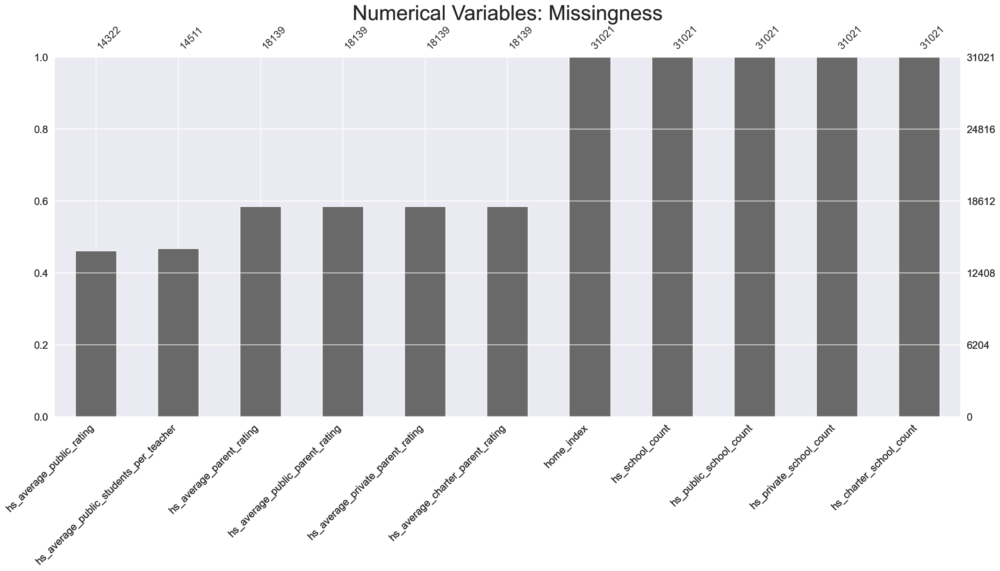

In [135]:
# Missing numerical values

msno.bar(high_school_statistics_df.select_dtypes(include=['int64', 'float64']), sort = 'ascending')
plt.title('Numerical Variables: Missingness', fontsize = 32)
plt.show()

In [137]:
# Imputation of mean for average_public_students_per_teacher, average_public_rating, and average_parent_rating

high_school_statistics_df['hs_average_public_students_per_teacher'] = high_school_statistics_df['hs_average_public_students_per_teacher'].fillna(high_school_statistics_df['hs_average_public_students_per_teacher'].mean())
high_school_statistics_df['hs_average_public_rating'] = high_school_statistics_df['hs_average_public_rating'].fillna(high_school_statistics_df['hs_average_public_rating'].mean())
high_school_statistics_df['hs_average_parent_rating'] = high_school_statistics_df['hs_average_parent_rating'].fillna(high_school_statistics_df['hs_average_parent_rating'].mean())
high_school_statistics_df['hs_average_public_parent_rating'] = high_school_statistics_df['hs_average_public_parent_rating'].fillna(high_school_statistics_df['hs_average_public_parent_rating'].mean())
high_school_statistics_df['hs_average_private_parent_rating'] = high_school_statistics_df['hs_average_private_parent_rating'].fillna(high_school_statistics_df['hs_average_private_parent_rating'].mean())
high_school_statistics_df['hs_average_charter_parent_rating'] = high_school_statistics_df['hs_average_charter_parent_rating'].fillna(high_school_statistics_df['hs_average_charter_parent_rating'].mean())




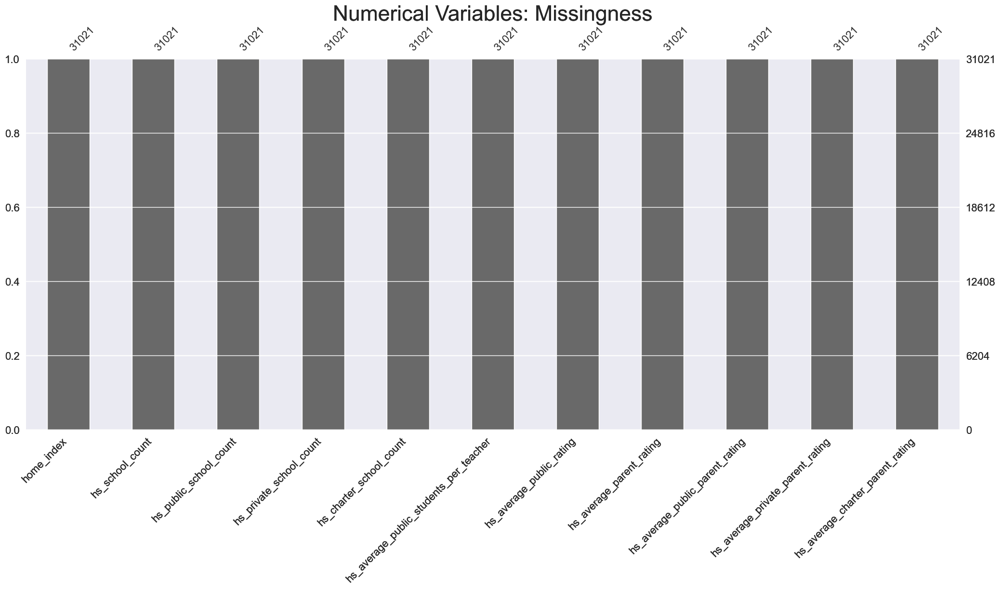

In [141]:
# Missing numerical values

msno.bar(high_school_statistics_df.select_dtypes(include=['int64', 'float64']), sort = 'ascending')
plt.title('Numerical Variables: Missingness', fontsize = 32)
plt.show()


# middle_schools import and summary

In [144]:
middle_schools_df = pd.read_csv('middle_schools.csv')
middle_schools_df = middle_schools_df.drop(columns = 'Unnamed: 0')

middle_schools_df.head()


,id,districtID,districtName,districtCity,lat,long,name,gradeLevels,address,rating,ratingScale,schoolType,zipcode,studentsPerTeacher,parentRating
0,2753,58,Dougherty County School District,Albany,31.573450,-84.249695,Robert A. Cross Middle Magnet,6-8,"324 Lockett Station Road, 31721, Albany",10.0,Above average,public,31721,15.0,3
1,931,69,Fayette County School District,Fayetteville,33.342094,-84.519585,Rising Starr Middle School,6-8,"183 Panther Path, 30215, Fayetteville",10.0,Above average,public,30215,15.0,3
2,1012,73,Fulton County School District,Atlanta,34.067436,-84.231171,Webb Bridge Middle School,6-8,"4455 Webb Bridge Road, 30005, Alpharetta",9.0,Above average,public,30005,14.0,5
3,1033,73,Fulton County School District,Atlanta,34.052856,-84.209183,Taylor Road Middle School,6-8,"5150 Taylor Rd, 30022, Alpharetta",9.0,Above average,public,30022,15.0,3
4,1614,138,Richmond County School District,Augusta,33.473846,-81.975899,Davidson Magnet School,6-12,"615 12th Street, 30901, Augusta",9.0,Above average,public,30901,18.0,5


# Find distances between homes and middle schools

In [147]:
# Create empty matrix to capture distances between listings and middle_schools

ms_radius_matrix = np.zeros((len(GA_listings_crime_merged), len(middle_schools_df)))

# Loop though each row of both listings and middle_schools dataframes and 
# capture distance using haversine formula

for i in range(0,GA_listings_crime_merged.shape[0]):
    for j in range(0,middle_schools_df.shape[0]):
        distance = haversine_distance(GA_listings_crime_merged['latitude'][i],
                                      GA_listings_crime_merged['longitude'][i],
                                      middle_schools_df['lat'][j], 
                                      middle_schools_df['long'][j])
        ms_radius_matrix[i, j] = distance

ms_radius_matrix

array([[109.1444125 , 301.71296641, 375.28566206, ..., 402.63119263,
        375.28652638, 278.11771534],
       [109.87719168, 298.74660576, 370.75887993, ..., 397.41297095,
        370.68938347, 274.85083973],
       [261.95160628, 387.74317918, 432.1125184 , ..., 446.37994832,
        431.08852254, 363.58666144],
       ...,
       [343.18785583, 176.41546671, 102.49406149, ...,  71.73795379,
        100.43712497, 185.26793462],
       [342.94390698, 176.32164997, 102.51992258, ...,  71.84332158,
        100.45951044, 185.12710147],
       [345.80921428, 183.97517347, 112.69010972, ...,  83.11585714,
        110.57820629, 191.54358823]])

In [149]:
# Capture middle school statistics within user-defined radius

radius = 4 # Radius of interest
temp_distance_df = pd.DataFrame(ms_radius_matrix) < radius # Boolean dataframe that's True if within radius or False if outside

# Create empty lists to capture stats
school_count = []
public_school_count = []
private_school_count = []
charter_school_count = []
average_public_studentsPerTeacher = []
average_public_rating = []
average_parent_rating = []
average_public_parent_rating = []
average_private_parent_rating = []
average_charter_parent_rating = []


# Loop through each row of the matrix of distances between each listing and middle schoool
for i in range(len(ms_radius_matrix)):
    school_indexes_in_radius = temp_distance_df.loc[i,:][temp_distance_df.loc[i,:]==True].index # getting middle_school_df indexes for middle schools within set radius
    
    # If there are any schools within radius
    if len(school_indexes_in_radius) > 0:
        
        temp_middle_school_df = middle_schools_df.iloc[school_indexes_in_radius, :] # slicing middle_school_df with those indexes
    
        school_count.append((i,len(school_indexes_in_radius))) # school count within radius per house
    
        school_type_count_summary = temp_middle_school_df.groupby('schoolType')['schoolType'].count() # Get counts of schools per type (public, private, charter)
        try:
            public_school_count.append((i,school_type_count_summary['public']))
        except:
            public_school_count.append((i,0))
        try:
            private_school_count.append((i,school_type_count_summary['private']))
        except:
            private_school_count.append((i,0))
        try:
            charter_school_count.append((i,school_type_count_summary['charter']))
        except:
            charter_school_count.append((i,0))
    
        average_public_studentsPerTeacher.append((i,temp_middle_school_df['studentsPerTeacher'].mean())) # Average public schools' students per teacher
    
        average_public_rating.append((i,temp_middle_school_df['rating'].mean())) # Average public school ratings
        
        average_parent_rating.append((i,temp_middle_school_df['parentRating'].mean())) # Average overall parent ratings
        
        school_type_parentRating_summary = temp_middle_school_df.groupby('schoolType')['parentRating'].mean() # Get average parent ratings per school type (public, private, charter)
        try:
            average_public_parent_rating.append((i,school_type_parentRating_summary['public']))
        except:
            average_public_parent_rating.append((i,0))
        try:
            average_private_parent_rating.append((i,school_type_parentRating_summary['private']))
        except:
            average_private_parent_rating.append((i,0))
        try:
            average_charter_parent_rating.append((i,school_type_parentRating_summary['charter']))
        except:
            average_charter_parent_rating.append((i,0))
    
    # If there aren't any schools within radius for that listing, insert 0 into the count stats. 
    # Note: did not insert 0 into non-count stats. Instead, will impute mean downstream of this code
    
    else:
        school_count.append((i,0))
        public_school_count.append((i,0))
        private_school_count.append((i,0))
        charter_school_count.append((i,0))


In [150]:
# Creating dataframes for each list of middle school statistics

school_count_df = pd.DataFrame(data = school_count, columns = ['home_index', 'ms_school_count'])
public_school_count_df = pd.DataFrame(data = public_school_count, columns = ['home_index', 'ms_public_school_count'])
private_school_count_df = pd.DataFrame(data = private_school_count, columns = ['home_index', 'ms_private_school_count'])
charter_school_count_df = pd.DataFrame(data = charter_school_count, columns = ['home_index', 'ms_charter_school_count'])
average_public_studentsPerTeacher_df = pd.DataFrame(data = average_public_studentsPerTeacher, columns = ['home_index', 'ms_average_public_students_per_teacher'])
average_public_rating_df = pd.DataFrame(data = average_public_rating, columns = ['home_index', 'ms_average_public_rating'])
average_parent_rating_df = pd.DataFrame(data = average_parent_rating, columns = ['home_index', 'ms_average_parent_rating'])
average_public_parent_rating_df = pd.DataFrame(data = average_public_parent_rating, columns = ['home_index', 'ms_average_public_parent_rating'])
average_private_parent_rating_df = pd.DataFrame(data = average_private_parent_rating, columns = ['home_index', 'ms_average_private_parent_rating'])
average_charter_parent_rating_df = pd.DataFrame(data = average_charter_parent_rating, columns = ['home_index', 'ms_average_charter_parent_rating'])


In [151]:
# Merging each middle school statistic dataframe on 'home_index'

middle_school_statistics_df = pd.merge(
    left = school_count_df, 
    right = public_school_count_df, 
    on = 'home_index', 
    how = 'left')

middle_school_statistics_df = pd.merge(
    left = middle_school_statistics_df, 
    right = private_school_count_df, 
    on = 'home_index', 
    how = 'left')

middle_school_statistics_df = pd.merge(
    left = middle_school_statistics_df, 
    right = charter_school_count_df, 
    on = 'home_index', 
    how = 'left')

middle_school_statistics_df = pd.merge(
    left = middle_school_statistics_df, 
    right = average_public_studentsPerTeacher_df, 
    on = 'home_index', 
    how = 'left')

middle_school_statistics_df = pd.merge(
    left = middle_school_statistics_df, 
    right = average_public_rating_df, 
    on = 'home_index', 
    how = 'left')

middle_school_statistics_df = pd.merge(
    left = middle_school_statistics_df, 
    right = average_parent_rating_df, 
    on = 'home_index', 
    how = 'left')

middle_school_statistics_df = pd.merge(
    left = middle_school_statistics_df, 
    right = average_public_parent_rating_df, 
    on = 'home_index', 
    how = 'left')

middle_school_statistics_df = pd.merge(
    left = middle_school_statistics_df, 
    right = average_private_parent_rating_df, 
    on = 'home_index', 
    how = 'left')

middle_school_statistics_df = pd.merge(
    left = middle_school_statistics_df, 
    right = average_charter_parent_rating_df, 
    on = 'home_index', 
    how = 'left')

middle_school_statistics_df.head()

,home_index,ms_school_count,ms_public_school_count,ms_private_school_count,ms_charter_school_count,ms_average_public_students_per_teacher,ms_average_public_rating,ms_average_parent_rating,ms_average_public_parent_rating,ms_average_private_parent_rating,ms_average_charter_parent_rating
0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
1,1,2,2,0,0,18.5,2.0,1.500000,1.5,0.0,0.0
2,2,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
3,3,3,1,2,0,16.0,6.0,2.666667,3.0,2.5,0.0
4,4,1,1,0,0,16.0,6.0,3.000000,3.0,0.0,0.0


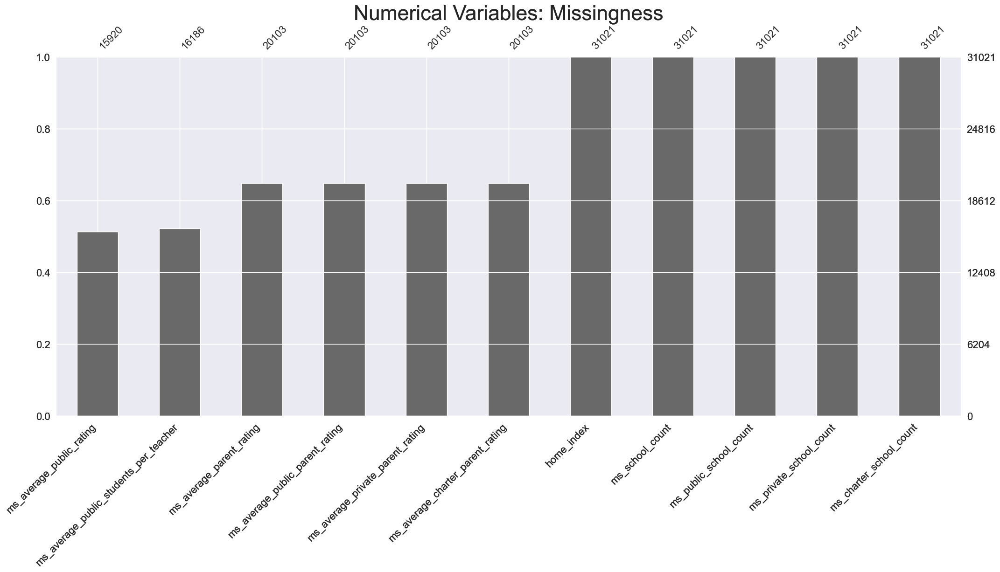

In [157]:
# Missing numerical values

msno.bar(middle_school_statistics_df.select_dtypes(include=['int64', 'float64']), sort = 'ascending')
plt.title('Numerical Variables: Missingness', fontsize = 32)
plt.show()


In [159]:
# Imputation of mean for average_public_students_per_teacher, average_public_rating, and average_parent_rating

middle_school_statistics_df['ms_average_public_students_per_teacher'] = middle_school_statistics_df['ms_average_public_students_per_teacher'].fillna(middle_school_statistics_df['ms_average_public_students_per_teacher'].mean())
middle_school_statistics_df['ms_average_public_rating'] = middle_school_statistics_df['ms_average_public_rating'].fillna(middle_school_statistics_df['ms_average_public_rating'].mean())
middle_school_statistics_df['ms_average_parent_rating'] = middle_school_statistics_df['ms_average_parent_rating'].fillna(middle_school_statistics_df['ms_average_parent_rating'].mean())
middle_school_statistics_df['ms_average_public_parent_rating'] = middle_school_statistics_df['ms_average_public_parent_rating'].fillna(middle_school_statistics_df['ms_average_public_parent_rating'].mean())
middle_school_statistics_df['ms_average_private_parent_rating'] = middle_school_statistics_df['ms_average_private_parent_rating'].fillna(middle_school_statistics_df['ms_average_private_parent_rating'].mean())
middle_school_statistics_df['ms_average_charter_parent_rating'] = middle_school_statistics_df['ms_average_charter_parent_rating'].fillna(middle_school_statistics_df['ms_average_charter_parent_rating'].mean())




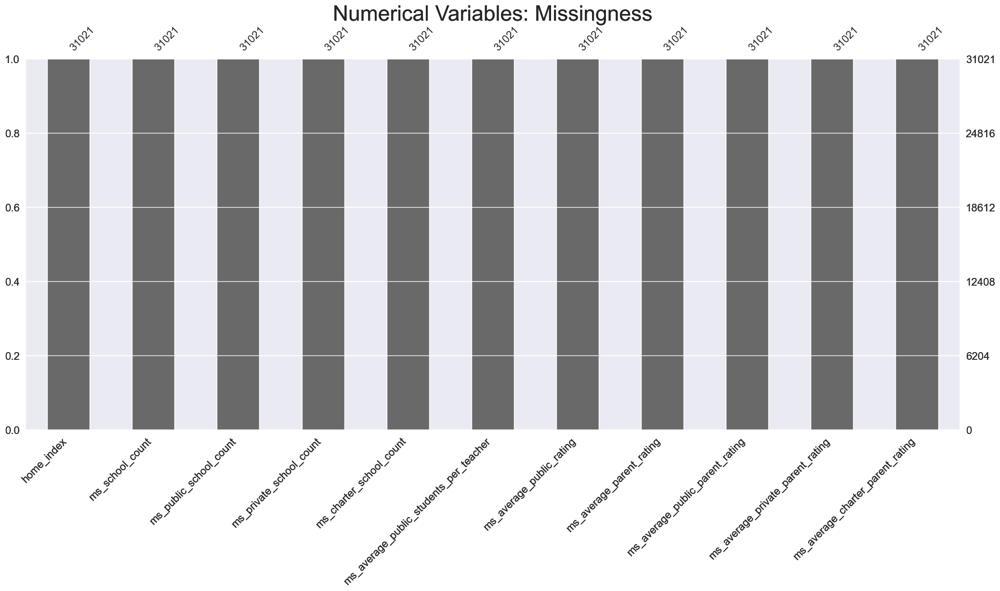

In [163]:
# Missing numerical values

msno.bar(middle_school_statistics_df.select_dtypes(include=['int64', 'float64']), sort = 'ascending')
plt.title('Numerical Variables: Missingness', fontsize = 32)
plt.show()


# elementary_schools import and summary

In [166]:
elementary_schools_df = pd.read_csv('elementary_schools.csv')
elementary_schools_df = elementary_schools_df.drop(columns = 'Unnamed: 0')

elementary_schools_df.head()


,id,districtID,districtName,districtCity,lat,long,name,gradeLevels,address,rating,ratingScale,schoolType,zipcode,studentsPerTeacher,parentRating
0,1038,73,Fulton County School District,Atlanta,34.071564,-84.363319,Sweet Apple Elementary School,PK-5,"12025 Etris Road, 30075, Roswell",10.0,Above average,public,30075,15.0,4
1,1108,82,Gwinnett County School District,Lawrenceville,34.044102,-83.924065,Fort Daniel Elementary School,PK-5,"1725 Auburn Road, 30019, Dacula",10.0,Above average,public,30019,14.0,5
2,1111,82,Gwinnett County School District,Lawrenceville,33.996933,-83.937210,Dyer Elementary School,PK-5,"1707 Hurricane Shoals Road Northeast, 30019, D...",10.0,Above average,public,30019,15.0,3
3,1503,124,Oconee County Schools,Watkinsville,33.914272,-83.506477,Malcom Bridge Elementary School,K-5,"2600 Malcom Bridge Road, 30622, Bogart",10.0,Above average,public,30622,16.0,4
4,3690,44,Columbia County School District,Evans,33.573559,-82.107941,River Ridge Elementary School,PK-5,"4109 Mullikin Road, 30809, Evans",10.0,Above average,public,30809,15.0,4


# Find distances between homes and elementary schools

In [169]:
# Create empty matrix to capture distances between listings and elementary_schools

es_radius_matrix = np.zeros((len(GA_listings_crime_merged), len(elementary_schools_df)))

# Loop though each row of both listings and elementary_schools dataframes and 
# capture distance using haversine formula

for i in range(0,GA_listings_crime_merged.shape[0]):
    for j in range(0,elementary_schools_df.shape[0]):
        distance = haversine_distance(GA_listings_crime_merged['latitude'][i],
                                      GA_listings_crime_merged['longitude'][i],
                                      elementary_schools_df['lat'][j], 
                                      elementary_schools_df['long'][j])
        es_radius_matrix[i, j] = distance

es_radius_matrix

array([[377.67283631, 369.75926706, 364.60794623, ..., 409.22609377,
        422.83407047, 406.892267  ],
       [373.51912249, 364.37066026, 359.27023489, ..., 407.18934783,
        420.60901328, 399.72752927],
       [439.61627823, 414.28241115, 410.49664396, ..., 496.86976587,
        507.13341405, 417.60104619],
       ...,
       [112.78467567,  81.64590216,  86.20435281, ..., 178.75240914,
        174.71770201,  21.0380362 ],
       [112.83369073,  81.59077932,  86.13621042, ..., 178.89898817,
        174.89271812,  20.68455587],
       [123.34043428,  90.35484668,  94.60582654, ..., 190.50710664,
        186.70898137,  21.19205783]])

In [170]:
# Capture elementary school statistics within user-defined radius

radius = 4 # Radius of interest
temp_distance_df = pd.DataFrame(es_radius_matrix) < radius # Boolean dataframe that's True if within radius or False if outside

# Create empty lists to capture stats
school_count = []
public_school_count = []
private_school_count = []
charter_school_count = []
average_public_studentsPerTeacher = []
average_public_rating = []
average_parent_rating = []
average_public_parent_rating = []
average_private_parent_rating = []
average_charter_parent_rating = []


# Loop through each row of the matrix of distances between each listing and elementary schoool
for i in range(len(es_radius_matrix)):
    school_indexes_in_radius = temp_distance_df.loc[i,:][temp_distance_df.loc[i,:]==True].index # getting elementary_school_df indexes for elementary schools within set radius
    
    # If there are any schools within radius
    if len(school_indexes_in_radius) > 0:
        
        temp_elementary_school_df = elementary_schools_df.iloc[school_indexes_in_radius, :] # slicing elementary_school_df with those indexes
    
        school_count.append((i,len(school_indexes_in_radius))) # school count within radius per house
    
        school_type_count_summary = temp_elementary_school_df.groupby('schoolType')['schoolType'].count() # Get counts of schools per type (public, private, charter)
        try:
            public_school_count.append((i,school_type_count_summary['public']))
        except:
            public_school_count.append((i,0))
        try:
            private_school_count.append((i,school_type_count_summary['private']))
        except:
            private_school_count.append((i,0))
        try:
            charter_school_count.append((i,school_type_count_summary['charter']))
        except:
            charter_school_count.append((i,0))
    
        average_public_studentsPerTeacher.append((i,temp_elementary_school_df['studentsPerTeacher'].mean())) # Average public schools' students per teacher
    
        average_public_rating.append((i,temp_elementary_school_df['rating'].mean())) # Average public school ratings
        
        average_parent_rating.append((i,temp_elementary_school_df['parentRating'].mean())) # Average overall parent ratings
        
        school_type_parentRating_summary = temp_elementary_school_df.groupby('schoolType')['parentRating'].mean() # Get average parent ratings per school type (public, private, charter)
        try:
            average_public_parent_rating.append((i,school_type_parentRating_summary['public']))
        except:
            average_public_parent_rating.append((i,0))
        try:
            average_private_parent_rating.append((i,school_type_parentRating_summary['private']))
        except:
            average_private_parent_rating.append((i,0))
        try:
            average_charter_parent_rating.append((i,school_type_parentRating_summary['charter']))
        except:
            average_charter_parent_rating.append((i,0))
    
    # If there aren't any schools within radius for that listing, insert 0 into the count stats. 
    # Note: did not insert 0 into non-count stats. Instead, will impute mean downstream of this code
    
    else:
        school_count.append((i,0))
        public_school_count.append((i,0))
        private_school_count.append((i,0))
        charter_school_count.append((i,0))


In [171]:
# Creating dataframes for each list of elementary school statistics

school_count_df = pd.DataFrame(data = school_count, columns = ['home_index', 'es_school_count'])
public_school_count_df = pd.DataFrame(data = public_school_count, columns = ['home_index', 'es_public_school_count'])
private_school_count_df = pd.DataFrame(data = private_school_count, columns = ['home_index', 'es_private_school_count'])
charter_school_count_df = pd.DataFrame(data = charter_school_count, columns = ['home_index', 'es_harter_school_count'])
average_public_studentsPerTeacher_df = pd.DataFrame(data = average_public_studentsPerTeacher, columns = ['home_index', 'es_average_public_students_per_teacher'])
average_public_rating_df = pd.DataFrame(data = average_public_rating, columns = ['home_index', 'es_average_public_rating'])
average_parent_rating_df = pd.DataFrame(data = average_parent_rating, columns = ['home_index', 'es_average_parent_rating'])
average_public_parent_rating_df = pd.DataFrame(data = average_public_parent_rating, columns = ['home_index', 'es_average_public_parent_rating'])
average_private_parent_rating_df = pd.DataFrame(data = average_private_parent_rating, columns = ['home_index', 'es_average_private_parent_rating'])
average_charter_parent_rating_df = pd.DataFrame(data = average_charter_parent_rating, columns = ['home_index', 'es_average_charter_parent_rating'])


In [172]:
# Merging each elementary school statistic dataframe on 'home_index'

elementary_school_statistics_df = pd.merge(
    left = school_count_df, 
    right = public_school_count_df, 
    on = 'home_index', 
    how = 'left')

elementary_school_statistics_df = pd.merge(
    left = elementary_school_statistics_df, 
    right = private_school_count_df, 
    on = 'home_index', 
    how = 'left')

elementary_school_statistics_df = pd.merge(
    left = elementary_school_statistics_df, 
    right = charter_school_count_df, 
    on = 'home_index', 
    how = 'left')

elementary_school_statistics_df = pd.merge(
    left = elementary_school_statistics_df, 
    right = average_public_studentsPerTeacher_df, 
    on = 'home_index', 
    how = 'left')

elementary_school_statistics_df = pd.merge(
    left = elementary_school_statistics_df, 
    right = average_public_rating_df, 
    on = 'home_index', 
    how = 'left')

elementary_school_statistics_df = pd.merge(
    left = elementary_school_statistics_df, 
    right = average_parent_rating_df, 
    on = 'home_index', 
    how = 'left')

elementary_school_statistics_df = pd.merge(
    left = elementary_school_statistics_df, 
    right = average_public_parent_rating_df, 
    on = 'home_index', 
    how = 'left')

elementary_school_statistics_df = pd.merge(
    left = elementary_school_statistics_df, 
    right = average_private_parent_rating_df, 
    on = 'home_index', 
    how = 'left')

elementary_school_statistics_df = pd.merge(
    left = elementary_school_statistics_df, 
    right = average_charter_parent_rating_df, 
    on = 'home_index', 
    how = 'left')

elementary_school_statistics_df.head()

,home_index,es_school_count,es_public_school_count,es_private_school_count,es_harter_school_count,es_average_public_students_per_teacher,es_average_public_rating,es_average_parent_rating,es_average_public_parent_rating,es_average_private_parent_rating,es_average_charter_parent_rating
0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
1,1,3,1,2,0,14.000000,1.000000,3.0,4.0,2.5,0.0
2,2,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
3,3,6,3,3,0,16.666667,7.333333,3.0,4.0,2.0,0.0
4,4,2,2,0,0,16.500000,7.500000,4.0,4.0,0.0,0.0


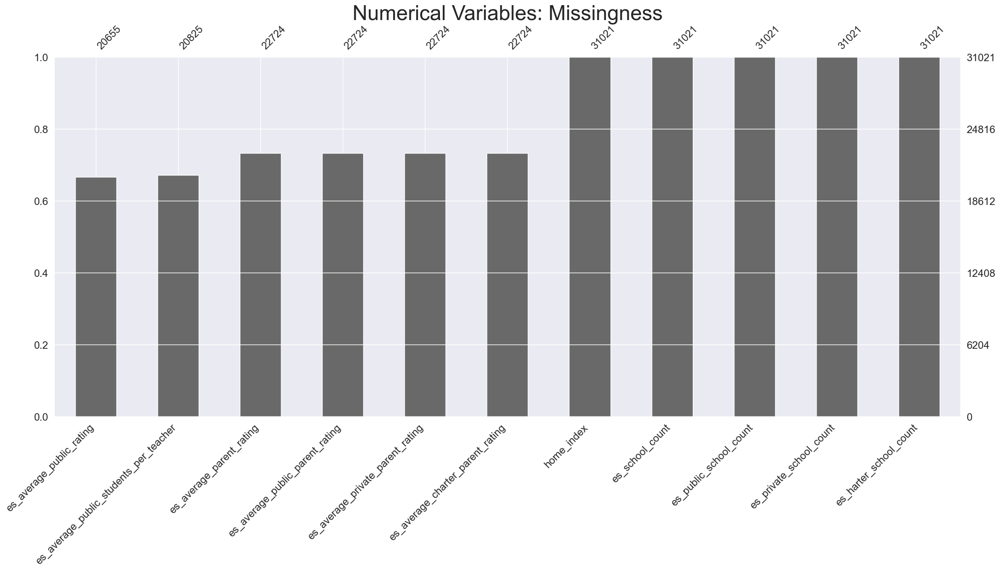

In [173]:
# Missing numerical values

msno.bar(elementary_school_statistics_df.select_dtypes(include=['int64', 'float64']), sort = 'ascending')
plt.title('Numerical Variables: Missingness', fontsize = 32)
plt.show()


In [174]:
# Imputation of mean for average_public_students_per_teacher, average_public_rating, and average_parent_rating

elementary_school_statistics_df['es_average_public_students_per_teacher'] = elementary_school_statistics_df['es_average_public_students_per_teacher'].fillna(elementary_school_statistics_df['es_average_public_students_per_teacher'].mean())
elementary_school_statistics_df['es_average_public_rating'] = elementary_school_statistics_df['es_average_public_rating'].fillna(elementary_school_statistics_df['es_average_public_rating'].mean())
elementary_school_statistics_df['es_average_parent_rating'] = elementary_school_statistics_df['es_average_parent_rating'].fillna(elementary_school_statistics_df['es_average_parent_rating'].mean())
elementary_school_statistics_df['es_average_public_parent_rating'] = elementary_school_statistics_df['es_average_public_parent_rating'].fillna(elementary_school_statistics_df['es_average_public_parent_rating'].mean())
elementary_school_statistics_df['es_average_private_parent_rating'] = elementary_school_statistics_df['es_average_private_parent_rating'].fillna(elementary_school_statistics_df['es_average_private_parent_rating'].mean())
elementary_school_statistics_df['es_average_charter_parent_rating'] = elementary_school_statistics_df['es_average_charter_parent_rating'].fillna(elementary_school_statistics_df['es_average_charter_parent_rating'].mean())




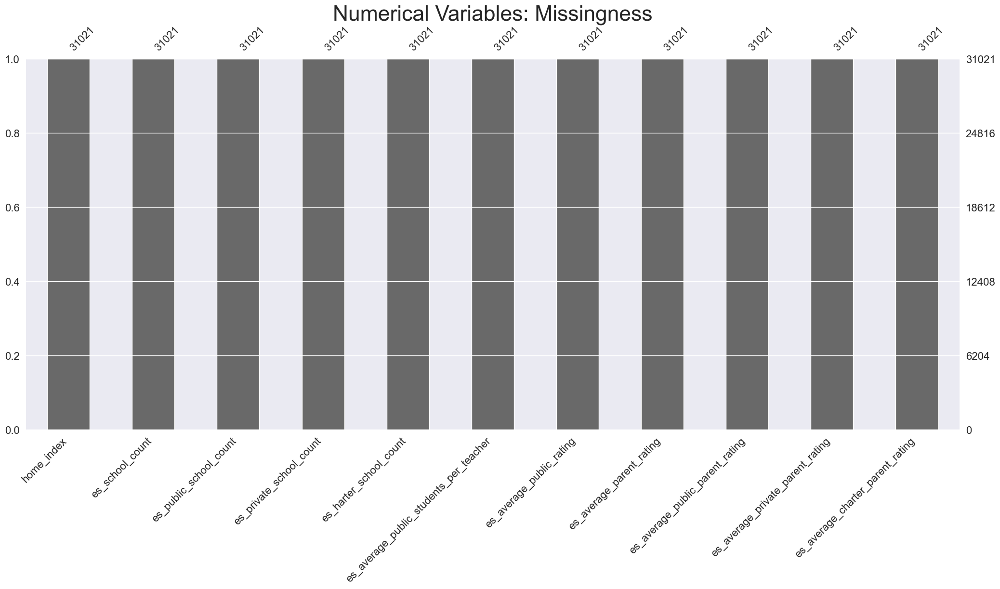

In [175]:
# Missing numerical values

msno.bar(elementary_school_statistics_df.select_dtypes(include=['int64', 'float64']), sort = 'ascending')
plt.title('Numerical Variables: Missingness', fontsize = 32)
plt.show()


# Join school statistics to main dataframe

In [184]:
GA_listings_crime_schools_merged = pd.merge(left = GA_listings_crime_merged.reset_index(names = 'home_index'),
         right = high_school_statistics_df,
         how = 'left',
         on = 'home_index'
        )
GA_listings_crime_schools_merged = pd.merge(left = GA_listings_crime_schools_merged,
         right = middle_school_statistics_df,
         how = 'left',
         on = 'home_index'
        )
GA_listings_crime_schools_merged = pd.merge(left = GA_listings_crime_schools_merged,
         right = elementary_school_statistics_df,
         how = 'left',
         on = 'home_index'
        )

GA_listings_crime_schools_merged.head()

,home_index,latitude,longitude,full_street_address,city,county_name,beds,baths_full,baths_half,square_footage,lot_size,year_built,details,special_features,unit_count,price,transaction_type,listing_status,listing_special_features,census_state_name,census_county_name,zip,property_type,census_state_abbr,census_zcta5_geoid,census_cbsa_geoid_count,overall_crime_grade,violent_crime_grade,violent_crime_total_rate,violent_crime_assault_rate,violent_crime_robbery_rate,violent_crime_rape_rate,violent_crime_murder_rate,property_crime_grade,property_crime_total_rate,property_crime_theft_rate,property_crime_vehicle_theft_rate,property_crime_burglary_rate,property_crime_arson_rate,other_crime_grade,other_crime_total_rate,other_crime_kidnapping_rate,other_crime_drug_crimes_rate,other_crime_vandalism_rate,other_crime_identity_theft_rate,other_crime_animal_cruelty_rate,hs_school_count,hs_public_school_count,hs_private_school_count,hs_charter_school_count,hs_average_public_students_per_teacher,hs_average_public_rating,hs_average_parent_rating,hs_average_public_parent_rating,hs_average_private_parent_rating,hs_average_charter_parent_rating,ms_school_count,ms_public_school_count,ms_private_school_count,ms_charter_school_count,ms_average_public_students_per_teacher,ms_average_public_rating,ms_average_parent_rating,ms_average_public_parent_rating,ms_average_private_parent_rating,ms_average_charter_parent_rating,es_school_count,es_public_school_count,es_private_school_count,es_harter_school_count,es_average_public_students_per_teacher,es_average_public_rating,es_average_parent_rating,es_average_public_parent_rating,es_average_private_parent_rating,es_average_charter_parent_rating
0,0,30.725605,-83.671772,0 Johnson Road #10026497,Quitman,Brooks-County,0.0,0.0,0.0,0.0,4.93,0.0,"Lots/Land, 4.93 Acres",0,0.0,51900,1,0,0,Georgia,"Brooks, GA",31643,Lots/Land,GA,31643.0,1.0,D-,D,4.708,3.334,1.0670,0.2660,0.0411,D-,38.96,28.720,1.422,8.751,0.0656,D+,14.060,0.1256,1.8120,11.280,0.7543,0.0842,0,0,0,0,15.955013,5.234865,2.65791,2.293261,1.708354,0.301422,0,0,0,0,14.682949,5.436522,2.682297,2.257084,1.78663,0.628346,0,0,0,0,14.462738,5.391010,2.956261,3.298947,1.554504,0.527982
1,1,30.781796,-83.558475,505 S Lee Street,Quitman,Brooks-County,3.0,1.0,0.0,1460.0,0.00,1910.0,"Detached, 3 Beds, 1 Bath, 1,460 Sq Ft",0,1.0,99000,1,1,0,Georgia,"Brooks, GA",31643,Detached,GA,31643.0,1.0,D-,D,4.708,3.334,1.0670,0.2660,0.0411,D-,38.96,28.720,1.422,8.751,0.0656,D+,14.060,0.1256,1.8120,11.280,0.7543,0.0842,2,2,0,0,19.500000,2.500000,2.00000,2.000000,0.000000,0.000000,2,2,0,0,18.500000,2.000000,1.500000,1.500000,0.00000,0.000000,3,1,2,0,14.000000,1.000000,3.000000,4.000000,2.500000,0.000000
2,2,30.864096,-81.622765,33 River Oaks Street,Woodbine,Camden-County,3.0,2.0,0.0,1254.0,0.00,1985.0,"Detached, 3 Beds, 2 Baths, 1,254 Sq Ft",0,1.0,245816,1,1,0,Georgia,"Camden, GA",31569,Detached,GA,31569.0,1.0,D+,C+,2.600,1.778,0.5553,0.2425,0.0247,D-,32.39,26.210,1.025,5.105,0.0454,B+,5.921,0.0802,1.9190,2.944,0.9281,0.0502,0,0,0,0,15.955013,5.234865,2.65791,2.293261,1.708354,0.301422,0,0,0,0,14.682949,5.436522,2.682297,2.257084,1.78663,0.628346,0,0,0,0,14.462738,5.391010,2.956261,3.298947,1.554504,0.527982
3,3,30.796300,-81.681675,605 E Lawnwood Avenue,Kingsland,Camden-County,2.0,2.0,0.0,1016.0,0.00,2005.0,"Townhouse, 2 Beds, 2 Baths, 1,016 Sq Ft",0,1.0,155000,1,1,0,Georgia,"Camden, GA",31548,Townhouse,GA,31548.0,1.0,B-,C-,3.523,2.798,0.4458,0.2418,0.0372,C+,14.37,9.055,1.113,4.111,0.0887,B+,6.365,0.0730,0.6743,4.642,0.9703,0.0057,2,0,2,0,15.955013,5.234865,2.50000,0.000000,2.500000,0.000000,3,1,2,0,16.000000,6.000000,2.666667,3.000000,2.50000,0.000000,6,3,3,0,16.666667,7.333333,3.000000,4.000000,2.000000,0.000000
4,4,30.762972,-81.660240,84 Whippoorwill Circle,Kingsland,Camden-County,3.0,2.0,0.0,1618.0,0.00,1986.0,"Detached, 3 Beds, 2 Baths, 1,618 Sq Ft",0,1.0,200000,1,1,0,Georgia,"Camden, GA",31548,Detached,GA,31548.0,1.0,B-,C-,3.523,2.798,0.4458,0.2418,0.0372,C+,14.37,9.055,1.113,4.

# Data Export

In [187]:
import os

current_directory = os.getcwd()

dataframes = {'GA_listings_crime_schools_merged': GA_listings_crime_schools_merged}


for name, df in dataframes.items():

    file_path = os.path.join(current_directory, f"{name}.csv")
    
    # Save the dataframe to a CSV file
    df.to_csv(file_path, sep='\t', index=False)

# Data Import

In [190]:
import os

current_directory = os.getcwd()

dataframes = ['GA_listings_crime_schools_merged.csv']

loaded_dataframes = {}

for file_name in dataframes:
    
    df_name = file_name.split('.csv')[0]
    file_path = os.path.join(current_directory, file_name)
    loaded_dataframes[df_name] = pd.read_csv(file_path, sep='\t')



In [192]:
GA_listings_crime_schools_merged = loaded_dataframes['GA_listings_crime_schools_merged']


In [194]:
# Converting zip code to object dtype

GA_listings_crime_schools_merged = GA_listings_crime_schools_merged.astype({'zip': 'object'})

# Outlier Inspection


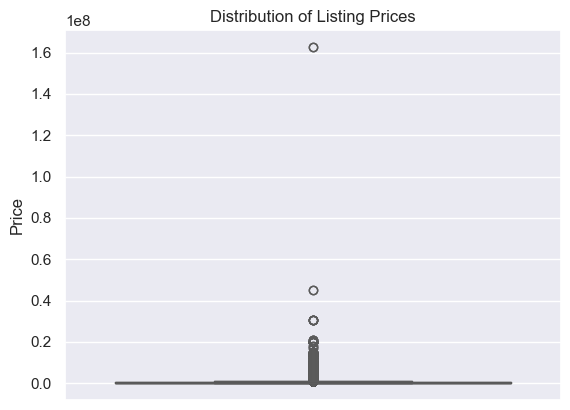

In [199]:
sns.boxplot(data = GA_listings_crime_schools_merged, y = 'price')
plt.ylabel('Price')
plt.title('Distribution of Listing Prices')
plt.show()


In [201]:
# Removing extremely high data points due to sparcity

GA_listings_crime_schools_merged = GA_listings_crime_schools_merged[GA_listings_crime_schools_merged['price'] < 30000000]

GA_listings_crime_schools_merged.shape

(31016, 76)

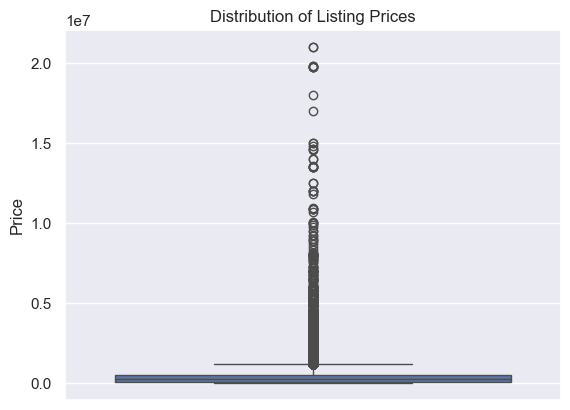

In [203]:
sns.boxplot(data = GA_listings_crime_schools_merged, y = 'price')
plt.ylabel('Price')
plt.title('Distribution of Listing Prices')
plt.show()


In [205]:
# Calculate quantiles and maximum/minimum values

q1 = np.percentile(GA_listings_crime_schools_merged['price'], 25)
q3 = np.percentile(GA_listings_crime_schools_merged['price'], 75)
IQR = q3 - q1

outlier_maximum_level = q3 + 1.5*IQR
outlier_minimum_level = q1 - 1.5*IQR

print("Maximum level: " + str(outlier_maximum_level))
print("Minimum level: " + str(outlier_minimum_level))



Maximum level: 1170000.0
Minimum level: -558000.0


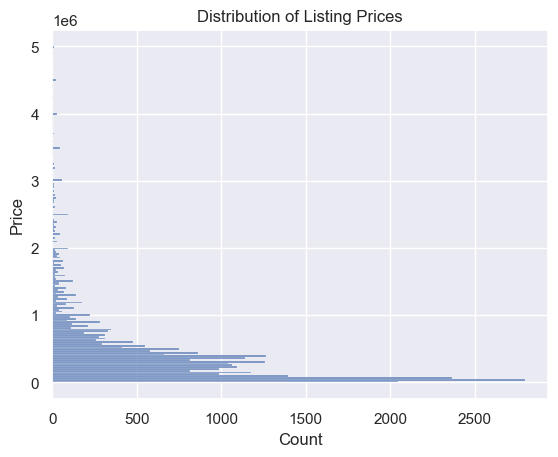

In [207]:
sns.histplot(data = GA_listings_crime_schools_merged.loc[GA_listings_crime_schools_merged['price'] < 5000000, :], y = 'price', log_scale = False)
plt.ylabel('Price')
plt.title('Distribution of Listing Prices')
plt.show()


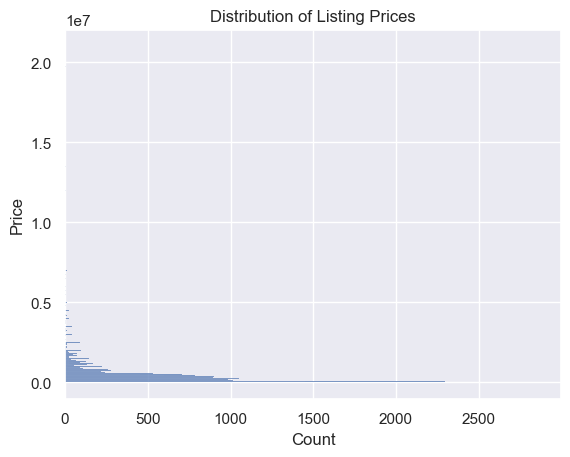

In [209]:
sns.histplot(data = GA_listings_crime_schools_merged, y = 'price', log_scale = False)
plt.ylabel('Price')
plt.title('Distribution of Listing Prices')
plt.show()


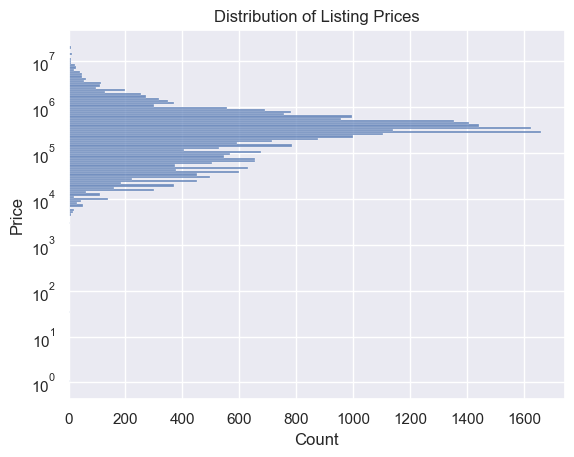

In [211]:
sns.histplot(data = GA_listings_crime_schools_merged, y = 'price', log_scale = True)
plt.ylabel('Price')
plt.title('Distribution of Listing Prices')
plt.show()


In [213]:
# Removing extremely low log data points due to sparcity

GA_listings_crime_schools_merged = GA_listings_crime_schools_merged[np.log(GA_listings_crime_schools_merged['price']) > 5]

GA_listings_crime_schools_merged.shape

(31005, 76)

# Feature Reduction

In [216]:
GA_listings_crime_schools_merged_reduced = GA_listings_crime_schools_merged.drop(columns = ['home_index', 'full_street_address','details','census_state_name','census_county_name','census_state_abbr','census_zcta5_geoid','census_cbsa_geoid_count'])

GA_listings_crime_schools_merged_reduced.shape

(31005, 68)

# Multicolinearity


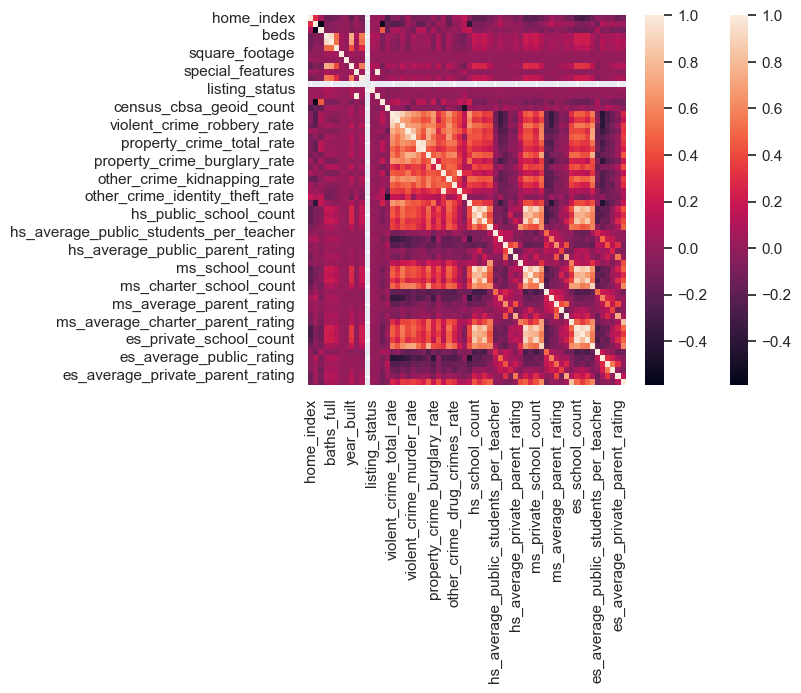

In [221]:
numerical_cols = []

for col in GA_listings_crime_schools_merged.drop(columns= 'price').columns:
    if str(GA_listings_crime_schools_merged[col].dtype) == 'float64' or str(GA_listings_crime_schools_merged[col].dtype) == 'int64':
        numerical_cols.append(col)


sns.heatmap(GA_listings_crime_schools_merged[numerical_cols].corr())
plt.show()


In [225]:
correlations = []
corr_threshold = 0.70

for i, col_x in enumerate(GA_listings_crime_schools_merged[numerical_cols].columns):
    for col_y in GA_listings_crime_schools_merged[numerical_cols].columns[i+1:]:
        correlation = GA_listings_crime_schools_merged[numerical_cols][col_x].corr(GA_listings_crime_schools_merged[numerical_cols][col_y])
        if abs(correlation) >= corr_threshold:
            correlations.append((col_x, col_y, correlation))
        
correlations

/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2897: RuntimeWarn

[('beds', 'baths_full', 0.9208983572539197),
 ('beds', 'year_built', 0.7580545956481678),
 ('baths_full', 'year_built', 0.7010280057504575),
 ('special_features', 'listing_special_features', 1.0),
 ('violent_crime_total_rate',
  'violent_crime_assault_rate',
  0.9515768597384262),
 ('violent_crime_total_rate',
  'violent_crime_robbery_rate',
  0.8819571079896411),
 ('violent_crime_total_rate', 'violent_crime_rape_rate', 0.7492699431037348),
 ('violent_crime_robbery_rate', 'violent_crime_rape_rate', 0.7055037947640208),
 ('violent_crime_rape_rate', 'violent_crime_murder_rate', 0.8253099160505778),
 ('violent_crime_rape_rate',
  'property_crime_vehicle_theft_rate',
  0.7680102101969881),
 ('violent_crime_murder_rate',
  'property_crime_vehicle_theft_rate',
  0.7508639615766471),
 ('violent_crime_murder_rate', 'es_harter_school_count', 0.7259794903223429),
 ('property_crime_total_rate',
  'property_crime_theft_rate',
  0.9605499963983015),
 ('property_crime_vehicle_theft_rate',
  'es_hart

# Exploratory Data Analysis


Skewness: 8.587
Kurtosis: 124.065


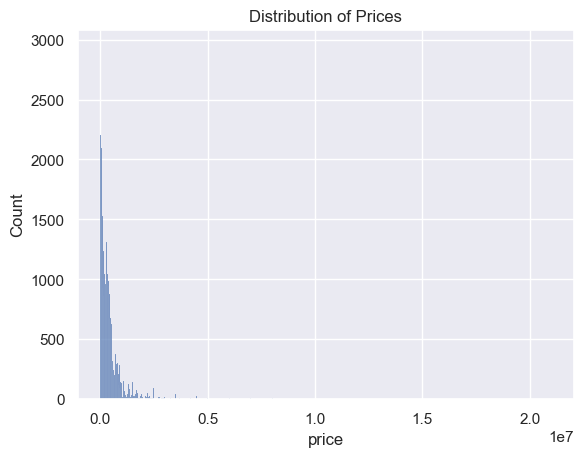

In [228]:

sns.histplot(data = GA_listings_crime_schools_merged, x = 'price')
plt.title('Distribution of Prices')

print('Skewness: ' + str(round(scipy.stats.skew(GA_listings_crime_schools_merged['price'], axis=0, bias=True),3)))
print('Kurtosis: ' + str(round(scipy.stats.kurtosis(GA_listings_crime_schools_merged['price'], axis=0, fisher=True, bias=True),3)))

# Skewness > 0 signifies more weight on the left tail of the distribution, so it is positively skewed.
# Kurtosis > 0 signifies it's a leptokurtic distribution, meaning there's a greater chance of extreme 
# positive or negative values

plt.show()

Skewness: -0.281
Kurtosis: -0.073


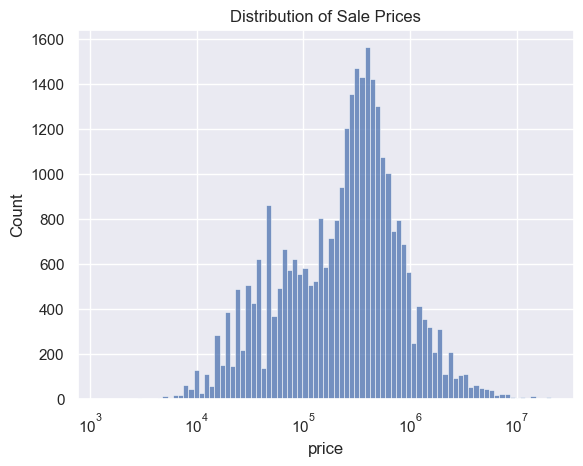

In [230]:

sns.histplot(data = GA_listings_crime_schools_merged, x = 'price', log_scale = True)
plt.title('Distribution of Sale Prices')

print('Skewness: ' + str(round(scipy.stats.skew(np.log10(GA_listings_crime_schools_merged['price']), axis=0, bias=True),3)))
print('Kurtosis: ' + str(round(scipy.stats.kurtosis(np.log10(GA_listings_crime_schools_merged['price']), axis=0, fisher=True, bias=True),3)))

# Skewness > 0 signifies more weight on the left tail of the distribution, so it is positively skewed.
# Kurtosis > 0 signifies it's a leptokurtic distribution, meaning there's a greater chance of extreme 
# positive or negative values
# Overall, both metrics were significantly reduce by getting the log of price

plt.show()


In [232]:
# Cycle through each column, fit an OLS model, and save the R2 value

import statsmodels.api as sm

rsquared_list = []
pvalue_list = []

for col in GA_listings_crime_schools_merged_reduced.drop(columns = ['price']).columns:
    temp_df = GA_listings_crime_schools_merged_reduced[[col]]
    if str(GA_listings_crime_schools_merged_reduced[col].dtype) == 'object':
        temp_df = pd.get_dummies(temp_df, columns=[col], drop_first=True)
        temp_df = temp_df.replace({False: 0, True: 1})
        
    temp_df = sm.add_constant(temp_df)
    model = sm.OLS(GA_listings_crime_schools_merged_reduced['price'], temp_df).fit()
    rsquared_list.append((col, model.rsquared))  
    pvalue_list.append((col, model.f_pvalue))
    
sorted_rsquared_list = sorted(rsquared_list, key=lambda x: x[1],reverse= True)
sorted_pvalue_list = sorted(pvalue_list, key=lambda x: x[1],reverse= False)

# Create column list for top x% of R2 values

top_percent = 0.25
top_rsquared_list = []

for i in list(range(round(top_percent * len(sorted_rsquared_list)))):
    top_rsquared_list.append(sorted_rsquared_list[i][0])

top_rsquared_list

/var/folders/y7/3944zvgd1vl909042ycfg4fw0000gn/T/ipykernel_2216/4193218100.py:12: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  temp_df = temp_df.replace({False: 0, True: 1})
/var/folders/y7/3944zvgd1vl909042ycfg4fw0000gn/T/ipykernel_2216/4193218100.py:12: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  temp_df = temp_df.replace({False: 0, True: 1})
/var/folders/y7/3944zvgd1vl909042ycfg4fw0000gn/T/ipykernel_2216/4193218100.py:12: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. 

['zip',
 'city',
 'baths_full',
 'county_name',
 'baths_half',
 'property_type',
 'beds',
 'year_built',
 'other_crime_grade',
 'overall_crime_grade',
 'violent_crime_grade',
 'hs_private_school_count',
 'es_private_school_count',
 'ms_private_school_count',
 'hs_average_public_rating',
 'hs_school_count',
 'ms_school_count']

/var/folders/y7/3944zvgd1vl909042ycfg4fw0000gn/T/ipykernel_2216/3973353601.py:11: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  plot.set_xticklabels(plot.get_xticklabels(), rotation=45)


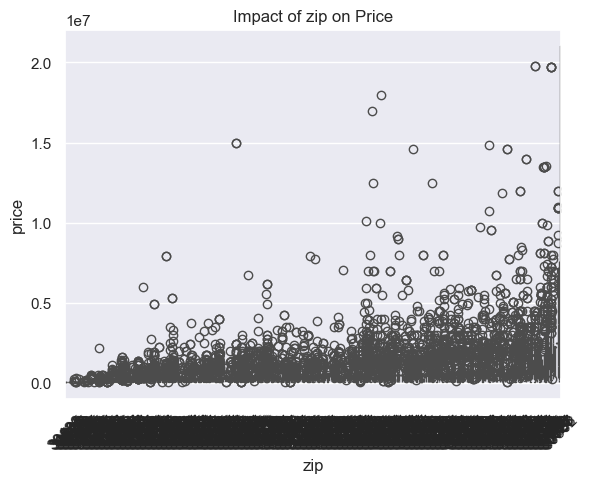

/var/folders/y7/3944zvgd1vl909042ycfg4fw0000gn/T/ipykernel_2216/3973353601.py:11: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  plot.set_xticklabels(plot.get_xticklabels(), rotation=45)


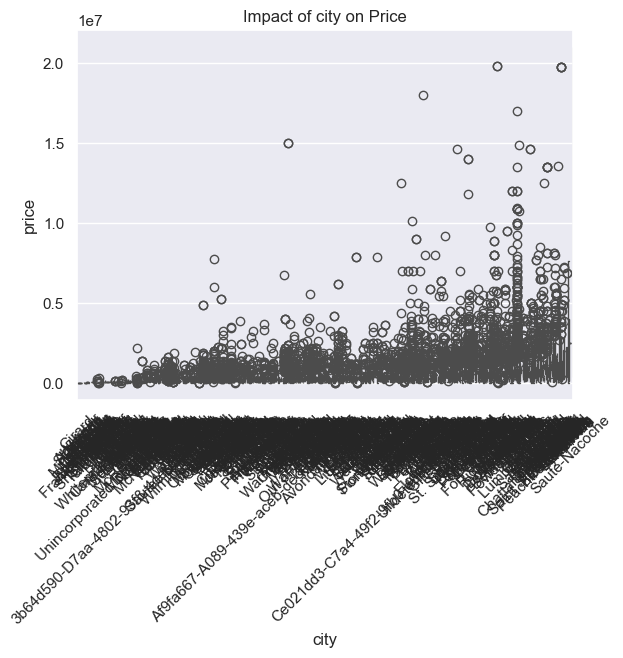

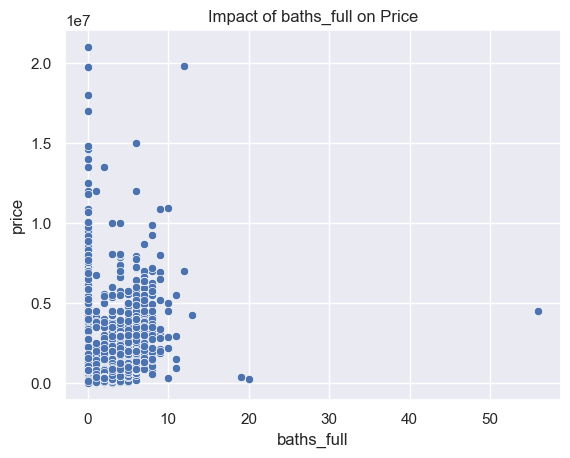

/var/folders/y7/3944zvgd1vl909042ycfg4fw0000gn/T/ipykernel_2216/3973353601.py:11: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  plot.set_xticklabels(plot.get_xticklabels(), rotation=45)


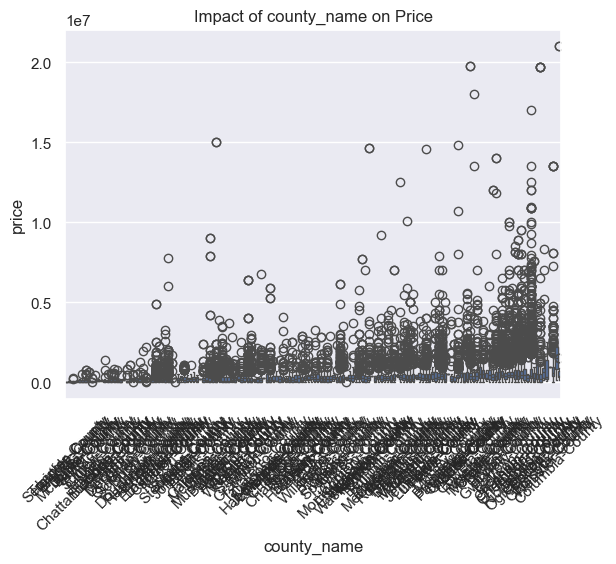

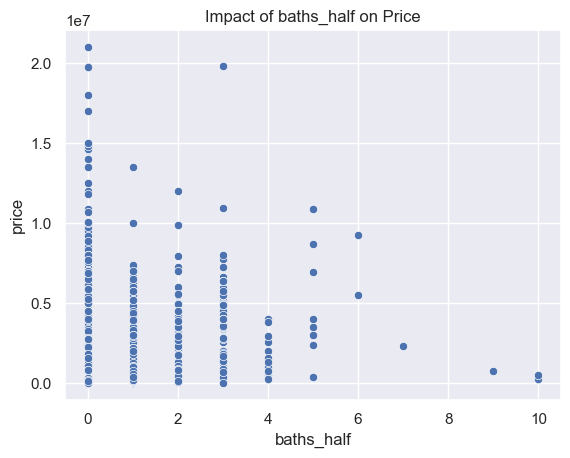

/var/folders/y7/3944zvgd1vl909042ycfg4fw0000gn/T/ipykernel_2216/3973353601.py:11: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  plot.set_xticklabels(plot.get_xticklabels(), rotation=45)


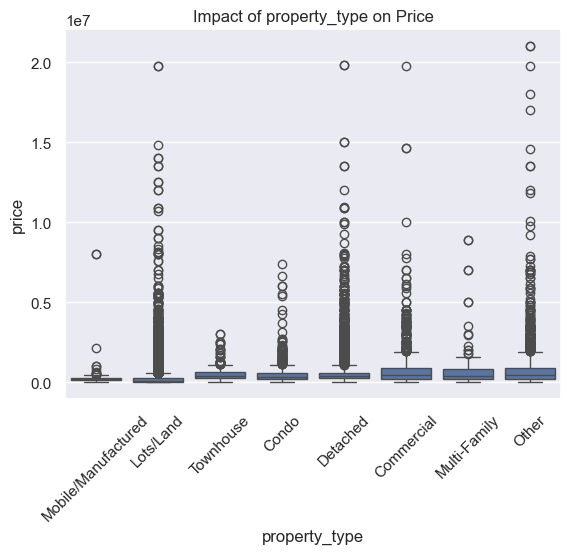

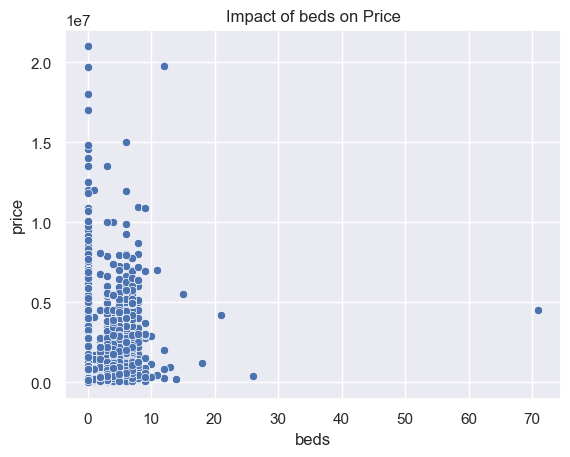

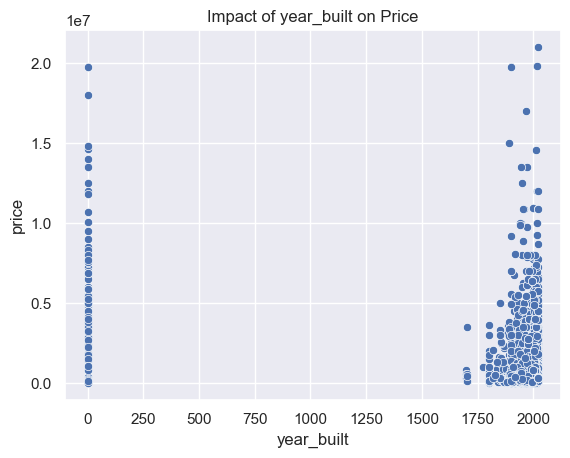

/var/folders/y7/3944zvgd1vl909042ycfg4fw0000gn/T/ipykernel_2216/3973353601.py:11: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  plot.set_xticklabels(plot.get_xticklabels(), rotation=45)


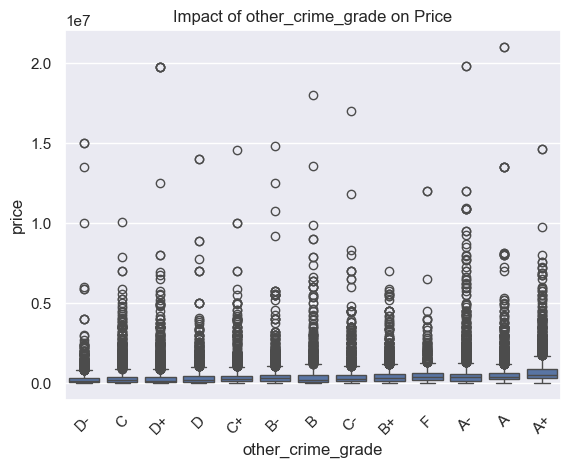

/var/folders/y7/3944zvgd1vl909042ycfg4fw0000gn/T/ipykernel_2216/3973353601.py:11: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  plot.set_xticklabels(plot.get_xticklabels(), rotation=45)


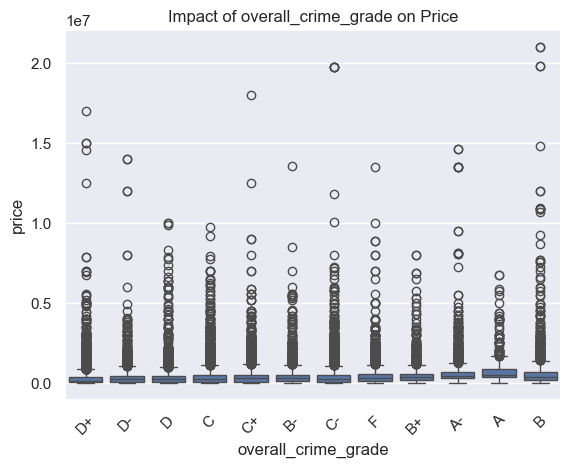

/var/folders/y7/3944zvgd1vl909042ycfg4fw0000gn/T/ipykernel_2216/3973353601.py:11: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  plot.set_xticklabels(plot.get_xticklabels(), rotation=45)


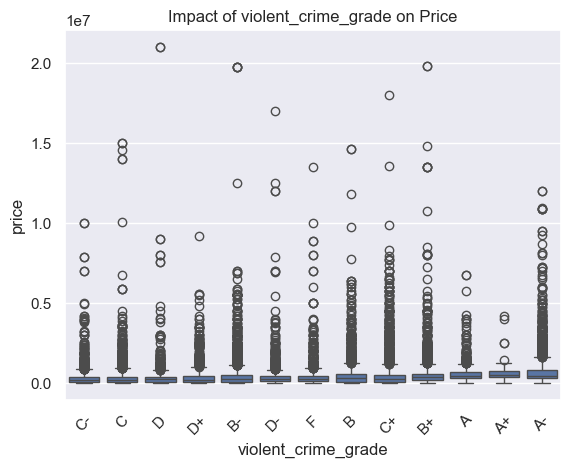

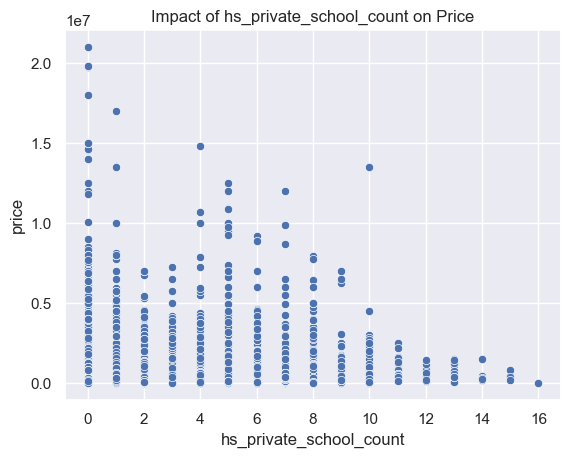

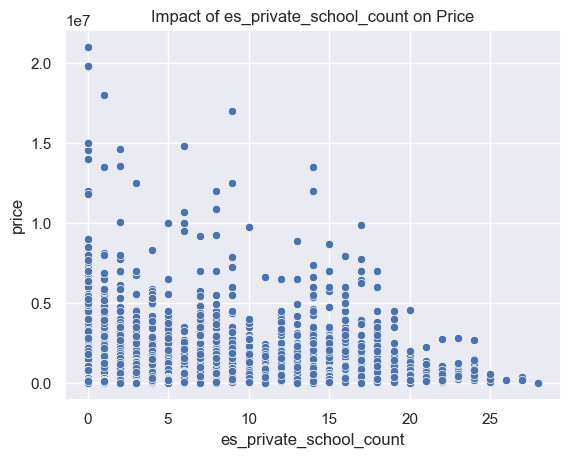

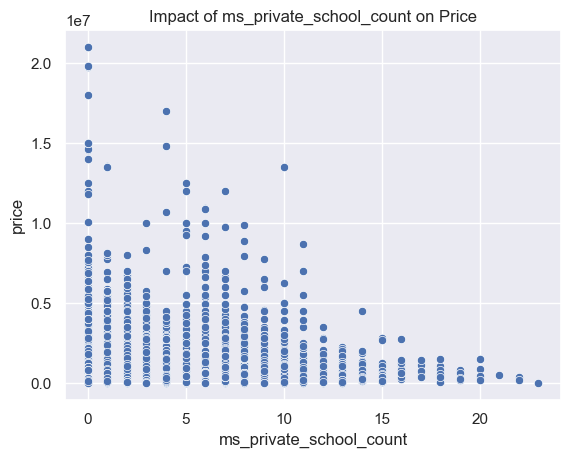

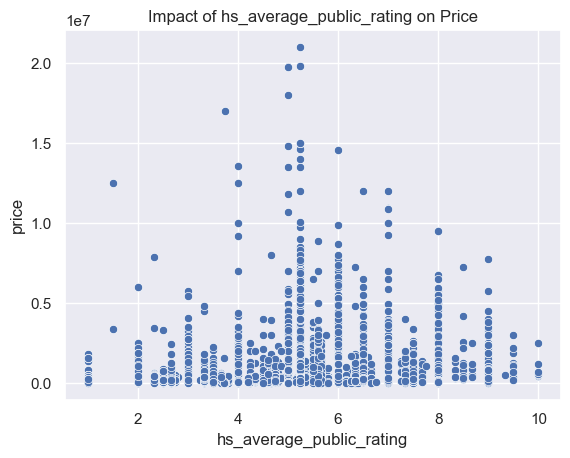

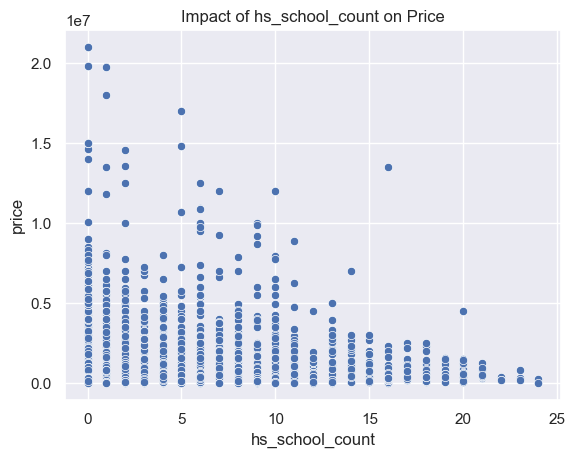

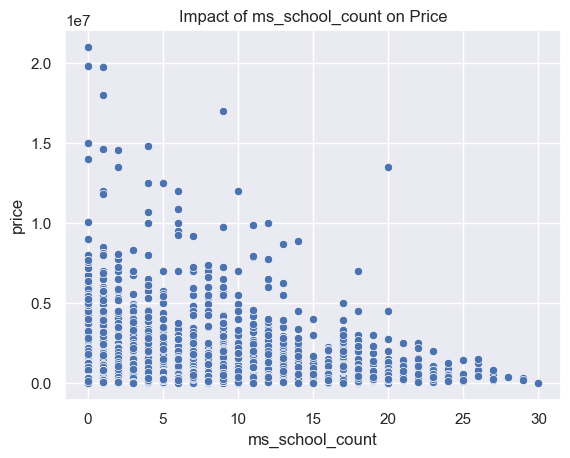

In [234]:
# Looping through top_rsquared_list and creating boxplots for categorical variables and 
# scatterplots for numerical variables

for col in top_rsquared_list:
    if GA_listings_crime_schools_merged_reduced[col].dtype == 'object':
        temp_df = GA_listings_crime_schools_merged_reduced.loc[:, [col,'price']]
        sorted_categories = temp_df.groupby(col)['price'].mean().sort_values().index
        temp_df[col] = pd.Categorical(temp_df[col], categories=sorted_categories, ordered=True)
        temp_df_sorted = temp_df.sort_values(by=col)
        plot = sns.boxplot(data = temp_df_sorted, x = col, y = 'price' )
        plot.set_xticklabels(plot.get_xticklabels(), rotation=45)
        plt.title('Impact of ' + col + ' on Price')
        plt.show()
        
    elif GA_listings_crime_schools_merged_reduced[col].dtype in ['int64', 'float64']:
        temp_df = GA_listings_crime_schools_merged.loc[:, [col,'price']]
        sns.scatterplot(data = temp_df, x = col, y = 'price' )
        plt.title('Impact of ' + col + ' on Price')
        plt.show()

# Separation of Response and Features


In [237]:
# Create features and response columns for modeling

features = GA_listings_crime_schools_merged_reduced.drop(columns = 'price')

response = GA_listings_crime_schools_merged_reduced['price']

In [239]:
# Create a no zip code feature dataframe
features_nozip = features.drop(columns = 'zip')

# Dummification for Linear Model

In [242]:
#Dummification of Categorical Features

cat_features = features.select_dtypes(include=['object'])
cat_features = pd.get_dummies(data = cat_features, drop_first = True)
cat_features = cat_features.replace({False: 0, True: 1})

# Separating numerical features from dataframe 

num_features = features.select_dtypes(include=['int64', 'float64'])
num_features.shape

# Concatenating dummified categorical features with numerical features

features_dum_drop = pd.concat([cat_features, num_features],axis = 1)
features_dum_drop.shape

/var/folders/y7/3944zvgd1vl909042ycfg4fw0000gn/T/ipykernel_2216/178762518.py:5: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  cat_features = cat_features.replace({False: 0, True: 1})


(31005, 1423)

In [244]:
#Dummification of Categorical Features for No Zip Dataframe

cat_features_nozip = features_nozip.select_dtypes(include=['object'])
cat_features_nozip = pd.get_dummies(data = cat_features_nozip, drop_first = True)
cat_features_nozip = cat_features_nozip.replace({False: 0, True: 1})

# Separating numerical features from dataframe 

num_features_nozip = features_nozip.select_dtypes(include=['int64', 'float64'])
num_features_nozip.shape

# Concatenating dummified categorical features with numerical features

features_dum_drop_nozip = pd.concat([cat_features_nozip, num_features_nozip],axis = 1)
features_dum_drop_nozip.shape

/var/folders/y7/3944zvgd1vl909042ycfg4fw0000gn/T/ipykernel_2216/3261312043.py:5: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  cat_features_nozip = cat_features_nozip.replace({False: 0, True: 1})


(31005, 832)

In [246]:
features_dum_drop.head()

,city_Abbeville,city_Acworth,city_Adairsville,city_Adrian,city_Af9fa667-A089-439e-aceb-dece9bbc6457,city_Alamo,city_Alanta,city_Albany,city_Allenhurst,city_Alma,city_Alpharetta,city_Alto,city_Americus,city_Appling,city_Arabi,city_Aragon,city_Arcade,city_Arlington,city_Armuchee,city_Arnoldsville,city_Ashburn,city_Athens,city_Atlanta,city_Attapulgus,city_Auburn,city_Augusta,city_Austell,city_Avalon,city_Avera,city_Avondale Estates,city_Baconton,city_Bainbridge,city_Baldwin,city_Ball Ground,city_Ballground,city_Barnesville,city_Bartow,city_Baxley,city_Berkeley Lake,city_Bethlehem,city_Big Canoe,city_Bishop,city_Black Creek,city_Blackshear,city_Blairesville,city_Blairsville,city_Blakely,city_Blalirsville,city_Bloomingdale,city_Blue Ridge,city_Bogart,city_Bonaire,city_Bostwick,city_Bowdon,city_Bowersville,city_Bowman,city_Box Springs,city_Braselton,city_Braswell,city_Bremen,city_Bridgeboro,city_Brookhaven,city_Brooklet,city_Brooks,city_Brunswick,city_Buchanan,city_Buckhead,city_Buena Vista,city_Buford,city_Butler,city_Byromville,city_Byron,city_Cadwell,city_Cairo,city_Calhoun,city_Camilla,city_Candall,city_Candler-McAfee,city_Canon,city_Canton,city_Carlton,city_Carnesville,city_Carrollton,city_Cartersville,city_Cataula,city_Cave Spring,city_Ce021dd3-C7a4-49f2-9fb0-d06df67b6323,city_Cedartown,city_Centerville,city_Chamblee,city_Chatsworth,city_Chatt Hills,city_Chattahoochee Hills,city_Cherry Log,city_Chester,city_Chickamauga,city_Chula,city_Cisco,city_Clarkesville,city_Clarkston,city_Clarksville,city_Claxton,city_Clayton,city_Clermont,city_Cleveland,city_Clevleand,city_Clevlen,city_Cliftondale,city_Cloudland,city_Clyo,city_Cobb,city_Cobbtown,city_Cochran,city_Cohutta,city_Colbert,city_Coleman,city_College Park,city_Collins,city_Columbus,city_Comer,city_Commerce,city_Concord,city_Conley,city_Conyers,city_Cordele,city_Cornelia,city_Covington,city_Crandall,city_Crawford,city_Crawfordville,city_Culloden,city_Cumming,city_Cusseta,city_Dacula,city_Dahlonega,city_Dallas,city_Dalton,city_Damascus,city_Danielsville,city_Danville,city_Darien,city_Davisboro,city_Dawson,city_Dawsonville,city_Decatur,city_Dekalb,city_Demorest,city_Dewy Rose,city_Dexter,city_Dillard,city_Dock Junction,city_Doraville,city_Douglas,city_Douglasville,city_Dry Branch,city_Dublin,city_Dudley,city_Duluth,city_Dunwoody,city_East Baldwin,city_East Cobb,city_East Dublin,city_East Ellijay,city_East Point,city_Eastanollee,city_Eastman,city_Eatonton,city_Elberton,city_Elko,city_Ellabell,city_Ellaville,city_Ellenwood,city_Ellerslie,city_Elliajy,city_Ellijay,city_Emerson,city_Epworth,city_Euharlee,city_Evans,city_Experiment,city_Fairburn,city_Fairmount,city_Farmington,city_Fayetteville,city_Fitzgerald,city_Flintstone,city_Flovilla,city_Flowery Br,city_Flowery Branch,city_Folkston,city_Forest Park,city_Forsyth,city_Fort Gaines,city_Fort Oglethorpe,city_Fort Valley,city_Fortson,city_Forysth,city_Franklin,city_Franklin Springs,city_Gainesville,city_Garden City,city_Garfield,city_Gay,city_Georgetown,city_Gibson,city_Gillem Enclave,city_Gillsville,city_Girard,city_Glennville,city_Good Hope,city_Gordon,city_Grantville,city_Gray,city_Grayson,city_Greensboro,city_Greenville,city_Griffin,city_Grovetown,city_Gumbranch,city_Gumlog,city_Guyton,city_Haddock,city_Hagan,city_Hahira,city_Hamilton,city_Hampton,city_Hapeville,city_Harlem,city_Harrison,city_Hartsfield,city_Hartwell,city_Hawkinsville,city_Hazlehurst,city_Helen,city_Helena,city_Hephzibah,city_Hiawassee,city_Hillsboro,city_Hinesville,city_Hiram,city_Hoboken,city_Hogansville,city_Holly Springs,city_Homer,city_Homerville,city_Hortense,city_Hoschton,city_Huber,city_Hull,city_Ideal,city_Irondale,city_Irwinton,city_Jackson,city_Jasper,city_Jefferson,city_Jeffersonville,city_Jenkinsburg,city_Jesup,city_Johns Creek,city_Jonesboro,city_Juliette,city_Junction City,city_Juniper,city_Kathleen,city_Kennesaw,city_Kingsland,city_Kingston,city_Kite,city_La Fayette,city_La Grange,city_Lafayette,city_Lagrange,city_Lake Park,city_Lakeland,city_Lakemo

In [248]:
features_dum_drop_nozip.head()

,city_Abbeville,city_Acworth,city_Adairsville,city_Adrian,city_Af9fa667-A089-439e-aceb-dece9bbc6457,city_Alamo,city_Alanta,city_Albany,city_Allenhurst,city_Alma,city_Alpharetta,city_Alto,city_Americus,city_Appling,city_Arabi,city_Aragon,city_Arcade,city_Arlington,city_Armuchee,city_Arnoldsville,city_Ashburn,city_Athens,city_Atlanta,city_Attapulgus,city_Auburn,city_Augusta,city_Austell,city_Avalon,city_Avera,city_Avondale Estates,city_Baconton,city_Bainbridge,city_Baldwin,city_Ball Ground,city_Ballground,city_Barnesville,city_Bartow,city_Baxley,city_Berkeley Lake,city_Bethlehem,city_Big Canoe,city_Bishop,city_Black Creek,city_Blackshear,city_Blairesville,city_Blairsville,city_Blakely,city_Blalirsville,city_Bloomingdale,city_Blue Ridge,city_Bogart,city_Bonaire,city_Bostwick,city_Bowdon,city_Bowersville,city_Bowman,city_Box Springs,city_Braselton,city_Braswell,city_Bremen,city_Bridgeboro,city_Brookhaven,city_Brooklet,city_Brooks,city_Brunswick,city_Buchanan,city_Buckhead,city_Buena Vista,city_Buford,city_Butler,city_Byromville,city_Byron,city_Cadwell,city_Cairo,city_Calhoun,city_Camilla,city_Candall,city_Candler-McAfee,city_Canon,city_Canton,city_Carlton,city_Carnesville,city_Carrollton,city_Cartersville,city_Cataula,city_Cave Spring,city_Ce021dd3-C7a4-49f2-9fb0-d06df67b6323,city_Cedartown,city_Centerville,city_Chamblee,city_Chatsworth,city_Chatt Hills,city_Chattahoochee Hills,city_Cherry Log,city_Chester,city_Chickamauga,city_Chula,city_Cisco,city_Clarkesville,city_Clarkston,city_Clarksville,city_Claxton,city_Clayton,city_Clermont,city_Cleveland,city_Clevleand,city_Clevlen,city_Cliftondale,city_Cloudland,city_Clyo,city_Cobb,city_Cobbtown,city_Cochran,city_Cohutta,city_Colbert,city_Coleman,city_College Park,city_Collins,city_Columbus,city_Comer,city_Commerce,city_Concord,city_Conley,city_Conyers,city_Cordele,city_Cornelia,city_Covington,city_Crandall,city_Crawford,city_Crawfordville,city_Culloden,city_Cumming,city_Cusseta,city_Dacula,city_Dahlonega,city_Dallas,city_Dalton,city_Damascus,city_Danielsville,city_Danville,city_Darien,city_Davisboro,city_Dawson,city_Dawsonville,city_Decatur,city_Dekalb,city_Demorest,city_Dewy Rose,city_Dexter,city_Dillard,city_Dock Junction,city_Doraville,city_Douglas,city_Douglasville,city_Dry Branch,city_Dublin,city_Dudley,city_Duluth,city_Dunwoody,city_East Baldwin,city_East Cobb,city_East Dublin,city_East Ellijay,city_East Point,city_Eastanollee,city_Eastman,city_Eatonton,city_Elberton,city_Elko,city_Ellabell,city_Ellaville,city_Ellenwood,city_Ellerslie,city_Elliajy,city_Ellijay,city_Emerson,city_Epworth,city_Euharlee,city_Evans,city_Experiment,city_Fairburn,city_Fairmount,city_Farmington,city_Fayetteville,city_Fitzgerald,city_Flintstone,city_Flovilla,city_Flowery Br,city_Flowery Branch,city_Folkston,city_Forest Park,city_Forsyth,city_Fort Gaines,city_Fort Oglethorpe,city_Fort Valley,city_Fortson,city_Forysth,city_Franklin,city_Franklin Springs,city_Gainesville,city_Garden City,city_Garfield,city_Gay,city_Georgetown,city_Gibson,city_Gillem Enclave,city_Gillsville,city_Girard,city_Glennville,city_Good Hope,city_Gordon,city_Grantville,city_Gray,city_Grayson,city_Greensboro,city_Greenville,city_Griffin,city_Grovetown,city_Gumbranch,city_Gumlog,city_Guyton,city_Haddock,city_Hagan,city_Hahira,city_Hamilton,city_Hampton,city_Hapeville,city_Harlem,city_Harrison,city_Hartsfield,city_Hartwell,city_Hawkinsville,city_Hazlehurst,city_Helen,city_Helena,city_Hephzibah,city_Hiawassee,city_Hillsboro,city_Hinesville,city_Hiram,city_Hoboken,city_Hogansville,city_Holly Springs,city_Homer,city_Homerville,city_Hortense,city_Hoschton,city_Huber,city_Hull,city_Ideal,city_Irondale,city_Irwinton,city_Jackson,city_Jasper,city_Jefferson,city_Jeffersonville,city_Jenkinsburg,city_Jesup,city_Johns Creek,city_Jonesboro,city_Juliette,city_Junction City,city_Juniper,city_Kathleen,city_Kennesaw,city_Kingsland,city_Kingston,city_Kite,city_La Fayette,city_La Grange,city_Lafayette,city_Lagrange,city_Lake Park,city_Lakeland,city_Lakemo

# LabelEncoding and OrdinalEncoding

In [251]:
features.select_dtypes(include=['object']).head()

,city,county_name,zip,property_type,overall_crime_grade,violent_crime_grade,property_crime_grade,other_crime_grade
0,Quitman,Brooks-County,31643,Lots/Land,D-,D,D-,D+
1,Quitman,Brooks-County,31643,Detached,D-,D,D-,D+
2,Woodbine,Camden-County,31569,Detached,D+,C+,D-,B+
3,Kingsland,Camden-County,31548,Townhouse,B-,C-,C+,B+
4,Kingsland,Camden-County,31548,Detached,B-,C-,C+,B+


In [253]:
features_encoded = features.copy()
features_encoded_nozip = features_nozip.copy()

In [255]:
# OrdinalEncoding for crime grades

from sklearn.preprocessing import OrdinalEncoder

grade_order = [['F', 'D-', 'D', 'D+', 'C-', 'C', 'C+', 'B-', 'B', 'B+', 'A-', 'A', 'A+'],
              ['F', 'D-', 'D', 'D+', 'C-', 'C', 'C+', 'B-', 'B', 'B+', 'A-', 'A', 'A+'],
              ['F', 'D-', 'D', 'D+', 'C-', 'C', 'C+', 'B-', 'B', 'B+', 'A-', 'A', 'A+'],
              ['F', 'D-', 'D', 'D+', 'C-', 'C', 'C+', 'B-', 'B', 'B+', 'A-', 'A', 'A+']]

grades_ord_enc = OrdinalEncoder(categories= grade_order)

features_encoded[['overall_crime_grade', 'violent_crime_grade', 'property_crime_grade', 'other_crime_grade']] = grades_ord_enc.fit_transform(features_encoded[['overall_crime_grade', 'violent_crime_grade', 'property_crime_grade', 'other_crime_grade']])
features_encoded_nozip[['overall_crime_grade', 'violent_crime_grade', 'property_crime_grade', 'other_crime_grade']] = grades_ord_enc.fit_transform(features_encoded_nozip[['overall_crime_grade', 'violent_crime_grade', 'property_crime_grade', 'other_crime_grade']])

In [257]:
features_encoded[['overall_crime_grade', 'violent_crime_grade', 'property_crime_grade', 'other_crime_grade']].head()

,overall_crime_grade,violent_crime_grade,property_crime_grade,other_crime_grade
0,1.0,2.0,1.0,3.0
1,1.0,2.0,1.0,3.0
2,3.0,6.0,1.0,9.0
3,7.0,4.0,6.0,9.0
4,7.0,4.0,6.0,9.0


In [259]:
# LabelEncoding remaining categorical variables

from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

nominal_columns = ['city','county_name', 'property_type']

for col in nominal_columns:
    features_encoded[col] = le.fit_transform(features_encoded[col])
    features_encoded_nozip[col] = le.fit_transform(features_encoded_nozip[col])



In [261]:
print(features_encoded.shape)
print(features_encoded_nozip.shape)


(31005, 67)
(31005, 66)


In [263]:
features_encoded.head()

,latitude,longitude,city,county_name,beds,baths_full,baths_half,square_footage,lot_size,year_built,special_features,unit_count,transaction_type,listing_status,listing_special_features,zip,property_type,overall_crime_grade,violent_crime_grade,violent_crime_total_rate,violent_crime_assault_rate,violent_crime_robbery_rate,violent_crime_rape_rate,violent_crime_murder_rate,property_crime_grade,property_crime_total_rate,property_crime_theft_rate,property_crime_vehicle_theft_rate,property_crime_burglary_rate,property_crime_arson_rate,other_crime_grade,other_crime_total_rate,other_crime_kidnapping_rate,other_crime_drug_crimes_rate,other_crime_vandalism_rate,other_crime_identity_theft_rate,other_crime_animal_cruelty_rate,hs_school_count,hs_public_school_count,hs_private_school_count,hs_charter_school_count,hs_average_public_students_per_teacher,hs_average_public_rating,hs_average_parent_rating,hs_average_public_parent_rating,hs_average_private_parent_rating,hs_average_charter_parent_rating,ms_school_count,ms_public_school_count,ms_private_school_count,ms_charter_school_count,ms_average_public_students_per_teacher,ms_average_public_rating,ms_average_parent_rating,ms_average_public_parent_rating,ms_average_private_parent_rating,ms_average_charter_parent_rating,es_school_count,es_public_school_count,es_private_school_count,es_harter_school_count,es_average_public_students_per_teacher,es_average_public_rating,es_average_parent_rating,es_average_public_parent_rating,es_average_private_parent_rating,es_average_charter_parent_rating
0,30.725605,-83.671772,395,13,0.0,0.0,0.0,0.0,4.93,0.0,0,0.0,1,0,0,31643,3,1.0,2.0,4.708,3.334,1.0670,0.2660,0.0411,1.0,38.96,28.720,1.422,8.751,0.0656,3.0,14.060,0.1256,1.8120,11.280,0.7543,0.0842,0,0,0,0,15.955013,5.234865,2.65791,2.293261,1.708354,0.301422,0,0,0,0,14.682949,5.436522,2.682297,2.257084,1.78663,0.628346,0,0,0,0,14.462738,5.391010,2.956261,3.298947,1.554504,0.527982
1,30.781796,-83.558475,395,13,3.0,1.0,0.0,1460.0,0.00,1910.0,0,1.0,1,1,0,31643,2,1.0,2.0,4.708,3.334,1.0670,0.2660,0.0411,1.0,38.96,28.720,1.422,8.751,0.0656,3.0,14.060,0.1256,1.8120,11.280,0.7543,0.0842,2,2,0,0,19.500000,2.500000,2.00000,2.000000,0.000000,0.000000,2,2,0,0,18.500000,2.000000,1.500000,1.500000,0.00000,0.000000,3,1,2,0,14.000000,1.000000,3.000000,4.000000,2.500000,0.000000
2,30.864096,-81.622765,555,19,3.0,2.0,0.0,1254.0,0.00,1985.0,0,1.0,1,1,0,31569,2,3.0,6.0,2.600,1.778,0.5553,0.2425,0.0247,1.0,32.39,26.210,1.025,5.105,0.0454,9.0,5.921,0.0802,1.9190,2.944,0.9281,0.0502,0,0,0,0,15.955013,5.234865,2.65791,2.293261,1.708354,0.301422,0,0,0,0,14.682949,5.436522,2.682297,2.257084,1.78663,0.628346,0,0,0,0,14.462738,5.391010,2.956261,3.298947,1.554504,0.527982
3,30.796300,-81.681675,266,19,2.0,2.0,0.0,1016.0,0.00,2005.0,0,1.0,1,1,0,31548,7,7.0,4.0,3.523,2.798,0.4458,0.2418,0.0372,6.0,14.37,9.055,1.113,4.111,0.0887,9.0,6.365,0.0730,0.6743,4.642,0.9703,0.0057,2,0,2,0,15.955013,5.234865,2.50000,0.000000,2.500000,0.000000,3,1,2,0,16.000000,6.000000,2.666667,3.000000,2.50000,0.000000,6,3,3,0,16.666667,7.333333,3.000000,4.000000,2.000000,0.000000
4,30.762972,-81.660240,266,19,3.0,2.0,0.0,1618.0,0.00,1986.0,0,1.0,1,1,0,31548,2,7.0,4.0,3.523,2.798,0.4458,0.2418,0.0372,6.0,14.37,9.055,1.113,4.111,0.0887,9.0,6.365,0.0730,0.6743,4.642,0.9703,0.0057,0,0,0,0,15.955013,5.234865,2.65791,2.293261,1.708354,0.301422,1,1,0,0,16.000000,6.000000,3.000000,3.000000,0.00000,0.000000,2,2,0,0,16.500000,7.500000,4.000000,4.000000,0.000000,0.000000


In [265]:
features_encoded_nozip.head()

,latitude,longitude,city,county_name,beds,baths_full,baths_half,square_footage,lot_size,year_built,special_features,unit_count,transaction_type,listing_status,listing_special_features,property_type,overall_crime_grade,violent_crime_grade,violent_crime_total_rate,violent_crime_assault_rate,violent_crime_robbery_rate,violent_crime_rape_rate,violent_crime_murder_rate,property_crime_grade,property_crime_total_rate,property_crime_theft_rate,property_crime_vehicle_theft_rate,property_crime_burglary_rate,property_crime_arson_rate,other_crime_grade,other_crime_total_rate,other_crime_kidnapping_rate,other_crime_drug_crimes_rate,other_crime_vandalism_rate,other_crime_identity_theft_rate,other_crime_animal_cruelty_rate,hs_school_count,hs_public_school_count,hs_private_school_count,hs_charter_school_count,hs_average_public_students_per_teacher,hs_average_public_rating,hs_average_parent_rating,hs_average_public_parent_rating,hs_average_private_parent_rating,hs_average_charter_parent_rating,ms_school_count,ms_public_school_count,ms_private_school_count,ms_charter_school_count,ms_average_public_students_per_teacher,ms_average_public_rating,ms_average_parent_rating,ms_average_public_parent_rating,ms_average_private_parent_rating,ms_average_charter_parent_rating,es_school_count,es_public_school_count,es_private_school_count,es_harter_school_count,es_average_public_students_per_teacher,es_average_public_rating,es_average_parent_rating,es_average_public_parent_rating,es_average_private_parent_rating,es_average_charter_parent_rating
0,30.725605,-83.671772,395,13,0.0,0.0,0.0,0.0,4.93,0.0,0,0.0,1,0,0,3,1.0,2.0,4.708,3.334,1.0670,0.2660,0.0411,1.0,38.96,28.720,1.422,8.751,0.0656,3.0,14.060,0.1256,1.8120,11.280,0.7543,0.0842,0,0,0,0,15.955013,5.234865,2.65791,2.293261,1.708354,0.301422,0,0,0,0,14.682949,5.436522,2.682297,2.257084,1.78663,0.628346,0,0,0,0,14.462738,5.391010,2.956261,3.298947,1.554504,0.527982
1,30.781796,-83.558475,395,13,3.0,1.0,0.0,1460.0,0.00,1910.0,0,1.0,1,1,0,2,1.0,2.0,4.708,3.334,1.0670,0.2660,0.0411,1.0,38.96,28.720,1.422,8.751,0.0656,3.0,14.060,0.1256,1.8120,11.280,0.7543,0.0842,2,2,0,0,19.500000,2.500000,2.00000,2.000000,0.000000,0.000000,2,2,0,0,18.500000,2.000000,1.500000,1.500000,0.00000,0.000000,3,1,2,0,14.000000,1.000000,3.000000,4.000000,2.500000,0.000000
2,30.864096,-81.622765,555,19,3.0,2.0,0.0,1254.0,0.00,1985.0,0,1.0,1,1,0,2,3.0,6.0,2.600,1.778,0.5553,0.2425,0.0247,1.0,32.39,26.210,1.025,5.105,0.0454,9.0,5.921,0.0802,1.9190,2.944,0.9281,0.0502,0,0,0,0,15.955013,5.234865,2.65791,2.293261,1.708354,0.301422,0,0,0,0,14.682949,5.436522,2.682297,2.257084,1.78663,0.628346,0,0,0,0,14.462738,5.391010,2.956261,3.298947,1.554504,0.527982
3,30.796300,-81.681675,266,19,2.0,2.0,0.0,1016.0,0.00,2005.0,0,1.0,1,1,0,7,7.0,4.0,3.523,2.798,0.4458,0.2418,0.0372,6.0,14.37,9.055,1.113,4.111,0.0887,9.0,6.365,0.0730,0.6743,4.642,0.9703,0.0057,2,0,2,0,15.955013,5.234865,2.50000,0.000000,2.500000,0.000000,3,1,2,0,16.000000,6.000000,2.666667,3.000000,2.50000,0.000000,6,3,3,0,16.666667,7.333333,3.000000,4.000000,2.000000,0.000000
4,30.762972,-81.660240,266,19,3.0,2.0,0.0,1618.0,0.00,1986.0,0,1.0,1,1,0,2,7.0,4.0,3.523,2.798,0.4458,0.2418,0.0372,6.0,14.37,9.055,1.113,4.111,0.0887,9.0,6.365,0.0730,0.6743,4.642,0.9703,0.0057,0,0,0,0,15.955013,5.234865,2.65791,2.293261,1.708354,0.301422,1,1,0,0,16.000000,6.000000,3.000000,3.000000,0.00000,0.000000,2,2,0,0,16.500000,7.500000,4.000000,4.000000,0.000000,0.000000


# Train-Test-Split

In [268]:
# Train_test_split: test dataset is 20% of original dataframe, random_state turned on to ensure reproducibility

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(features, response, test_size=0.2, random_state=0)
X_train_drop, X_test_drop, y_train_drop, y_test_drop = train_test_split(features_dum_drop, response, test_size=0.2, random_state=0)
X_train_encoded, X_test_encoded, y_train_encoded, y_test_encoded = train_test_split(features_encoded, response, test_size=0.2, random_state=0)


X_train_nozip, X_test_nozip, y_train_nozip, y_test_nozip = train_test_split(features_nozip, response, test_size=0.2, random_state=0)
X_train_drop_nozip, X_test_drop_nozip, y_train_drop_nozip, y_test_drop_nozip = train_test_split(features_dum_drop_nozip, response, test_size=0.2, random_state=0)
X_train_encoded_nozip, X_test_encoded_nozip, y_train_encoded_nozip, y_test_encoded_nozip = train_test_split(features_encoded_nozip, response, test_size=0.2, random_state=0)


# StandardScaler for Features_Encoded


In [271]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

features_encoded_scaled = scaler.fit_transform(features_encoded)
features_encoded_scaled = pd.DataFrame(data=features_encoded_scaled, columns=features_encoded.columns)

features_encoded_scaled_nozip = scaler.fit_transform(features_encoded_nozip)
features_encoded_scaled_nozip = pd.DataFrame(data=features_encoded_scaled_nozip, columns=features_encoded_nozip.columns)


# StandardScaler for Linear Models

In [274]:

scaler = StandardScaler()

X_train_drop_scaled = scaler.fit_transform(X_train_drop)
X_train_drop_scaled = pd.DataFrame(data=X_train_drop_scaled, columns=X_train_drop.columns)

X_test_drop_scaled = scaler.transform(X_test_drop)
X_test_drop_scaled = pd.DataFrame(data=X_test_drop_scaled, columns=X_test_drop.columns)


y_train_drop_scaled = y_train_drop.copy()
y_test_drop_scaled = y_test_drop.copy()


# No zip dataframes

X_train_drop_scaled_nozip = scaler.fit_transform(X_train_drop_nozip)
X_train_drop_scaled_nozip = pd.DataFrame(data=X_train_drop_scaled_nozip, columns=X_train_drop_nozip.columns)

X_test_drop_scaled_nozip = scaler.transform(X_test_drop_nozip)
X_test_drop_scaled_nozip = pd.DataFrame(data=X_test_drop_scaled_nozip, columns=X_test_drop_nozip.columns)


y_train_drop_scaled_nozip = y_train_drop_nozip.copy()
y_test_drop_scaled_nozip = y_test_drop_nozip.copy()


# StandardScaler for PyTorch Models

In [277]:

scaler = StandardScaler()

X_train_encoded_scaled = scaler.fit_transform(X_train_encoded)
X_train_encoded_scaled = pd.DataFrame(data=X_train_encoded_scaled, columns=X_train_encoded.columns)

X_test_encoded_scaled = scaler.transform(X_test_encoded)
X_test_encoded_scaled = pd.DataFrame(data=X_test_encoded_scaled, columns=X_test_encoded.columns)


y_train_encoded_scaled = y_train_encoded.copy()
y_test_encoded_scaled = y_test_encoded.copy()


# No zip dataframes

X_train_encoded_scaled_nozip = scaler.fit_transform(X_train_encoded_nozip)
X_train_encoded_scaled_nozip = pd.DataFrame(data=X_train_encoded_scaled_nozip, columns=X_train_encoded_nozip.columns)

X_test_encoded_scaled_nozip = scaler.transform(X_test_encoded_nozip)
X_test_encoded_scaled_nozip = pd.DataFrame(data=X_test_encoded_scaled_nozip, columns=X_test_encoded_nozip.columns)


y_train_encoded_scaled_nozip = y_train_encoded_nozip.copy()
y_test_encoded_scaled_nozip = y_test_encoded_nozip.copy()

# StandardScaler for Full Feature DataFrame

In [280]:
scaler = StandardScaler()

features_dum_drop_scaled = scaler.fit_transform(features_dum_drop)
features_dum_drop_scaled = pd.DataFrame(data=features_dum_drop_scaled, columns=features_dum_drop.columns)

features_dum_drop_scaled_nozip = scaler.fit_transform(features_dum_drop_nozip)
features_dum_drop_scaled_nozip = pd.DataFrame(data=features_dum_drop_scaled_nozip, columns=features_dum_drop_nozip.columns)


# Data Export

In [283]:

current_directory = os.getcwd()

dataframes = {'X_train_drop_scaled': X_train_drop_scaled,
              'X_test_drop_scaled': X_test_drop_scaled,
              'y_train_drop_scaled': y_train_drop_scaled,
              'y_test_drop_scaled': y_test_drop_scaled,
              'X_train_encoded': X_train_encoded,
              'X_test_encoded': X_test_encoded, 
              'y_train_encoded': y_train_encoded, 
              'y_test_encoded': y_test_encoded, 
              'X_train_encoded_scaled': X_train_encoded_scaled,
              'X_test_encoded_scaled': X_test_encoded_scaled, 
              'y_train_encoded_scaled': y_train_encoded_scaled, 
              'y_test_encoded_scaled': y_test_encoded_scaled,
              'X_train': X_train,
              'X_test': X_test,
              'y_train': y_train,
              'y_test': y_test,
              'features': features,
              'response': response,
              'features_dum_drop': features_dum_drop,
              'features_encoded': features_encoded,
              'features_dum_drop_scaled': features_dum_drop_scaled,
              'features_encoded_scaled': features_encoded_scaled,
              
              'X_train_drop_scaled_nozip': X_train_drop_scaled_nozip,
              'X_test_drop_scaled_nozip': X_test_drop_scaled_nozip,
              'y_train_drop_scaled_nozip': y_train_drop_scaled_nozip,
              'y_test_drop_scaled_nozip': y_test_drop_scaled_nozip,
              'X_train_encoded_nozip': X_train_encoded_nozip,
              'X_test_encoded_nozip': X_test_encoded_nozip, 
              'y_train_encoded_nozip': y_train_encoded_nozip, 
              'y_test_encoded_nozip': y_test_encoded_nozip, 
              'X_train_encoded_scaled_nozip': X_train_encoded_scaled_nozip,
              'X_test_encoded_scaled_nozip': X_test_encoded_scaled_nozip, 
              'y_train_encoded_scaled_nozip': y_train_encoded_scaled_nozip, 
              'y_test_encoded_scaled_nozip': y_test_encoded_scaled_nozip,
              'X_train_nozip': X_train_nozip,
              'X_test_nozip': X_test_nozip,
              'y_train_nozip': y_train_nozip,
              'y_test_nozip': y_test_nozip,
              'features_nozip': features_nozip,
              'features_dum_drop_nozip': features_dum_drop_nozip,
              'features_encoded_nozip': features_encoded_nozip,
              'features_dum_drop_scaled_nozip': features_dum_drop_scaled_nozip,
              'features_encoded_scaled_nozip': features_encoded_scaled_nozip,
             }


for name, df in dataframes.items():

    file_path = os.path.join(current_directory, f"{name}.csv")
    
    # Save the dataframe to a CSV file
    df.to_csv(file_path, sep='\t', index=False)

# Data Import

In [286]:
import os

current_directory = os.getcwd()

dataframes = ['X_train_drop_scaled.csv', 'X_test_drop_scaled.csv', 'y_train_drop_scaled.csv', 'y_test_drop_scaled.csv',
              'X_train_encoded.csv',
              'X_test_encoded.csv', 'y_train_encoded.csv', 'y_test_encoded.csv', 'X_train_encoded_scaled.csv',
              'X_test_encoded_scaled.csv', 'y_train_encoded_scaled.csv', 'y_test_encoded_scaled.csv', 'X_train.csv',
              'X_test.csv', 'y_train.csv', 'y_test.csv', 'features.csv',
              'response.csv', 'features_dum_drop.csv',
              'features_encoded.csv', 'features_dum_drop_scaled.csv', 'features_encoded_scaled.csv',
             
             'X_train_drop_scaled_nozip.csv', 'X_test_drop_scaled_nozip.csv', 'y_train_drop_scaled_nozip.csv', 'y_test_drop_scaled_nozip.csv',
              'X_train_encoded_nozip.csv',
              'X_test_encoded_nozip.csv', 'y_train_encoded_nozip.csv', 'y_test_encoded_nozip.csv', 'X_train_encoded_scaled_nozip.csv',
              'X_test_encoded_scaled_nozip.csv', 'y_train_encoded_scaled_nozip.csv', 'y_test_encoded_scaled_nozip.csv', 'X_train_nozip.csv',
              'X_test_nozip.csv', 'y_train_nozip.csv', 'y_test_nozip.csv', 'features_nozip.csv',
              'features_dum_drop_nozip.csv',
              'features_encoded_nozip.csv', 'features_dum_drop_scaled_nozip.csv', 'features_encoded_scaled_nozip.csv']

loaded_dataframes = {}

for file_name in dataframes:
    
    df_name = file_name.split('.csv')[0]
    file_path = os.path.join(current_directory, file_name)
    loaded_dataframes[df_name] = pd.read_csv(file_path, sep='\t')



In [287]:
features = loaded_dataframes['features']
features_dum_drop = loaded_dataframes['features_dum_drop']
features_encoded = loaded_dataframes['features_encoded']
features_dum_drop_scaled = loaded_dataframes['features_dum_drop_scaled']
features_encoded_scaled = loaded_dataframes['features_encoded_scaled']

response = loaded_dataframes['response']


X_train_drop_scaled = loaded_dataframes['X_train_drop_scaled']
X_test_drop_scaled = loaded_dataframes['X_test_drop_scaled']
y_train_drop_scaled = loaded_dataframes['y_train_drop_scaled']['price']
y_test_drop_scaled = loaded_dataframes['y_test_drop_scaled']['price']

X_train_encoded = loaded_dataframes['X_train_encoded']
X_test_encoded = loaded_dataframes['X_test_encoded']
y_train_encoded = loaded_dataframes['y_train_encoded']['price']
y_test_encoded = loaded_dataframes['y_test_encoded']['price']

X_train_encoded_scaled = loaded_dataframes['X_train_encoded_scaled']
X_test_encoded_scaled = loaded_dataframes['X_test_encoded_scaled']
y_train_encoded_scaled = loaded_dataframes['y_train_encoded_scaled']['price']
y_test_encoded_scaled = loaded_dataframes['y_test_encoded_scaled']['price']

In [290]:
features_nozip = loaded_dataframes['features_nozip']
features_dum_drop_nozip = loaded_dataframes['features_dum_drop_nozip']
features_encoded_nozip = loaded_dataframes['features_encoded_nozip']
features_dum_drop_scaled_nozip = loaded_dataframes['features_dum_drop_scaled_nozip']
features_encoded_scaled_nozip = loaded_dataframes['features_encoded_scaled_nozip']



X_train_drop_scaled_nozip = loaded_dataframes['X_train_drop_scaled_nozip']
X_test_drop_scaled_nozip = loaded_dataframes['X_test_drop_scaled_nozip']
y_train_drop_scaled_nozip = loaded_dataframes['y_train_drop_scaled_nozip']['price']
y_test_drop_scaled_nozip = loaded_dataframes['y_test_drop_scaled_nozip']['price']

X_train_encoded_nozip = loaded_dataframes['X_train_encoded_nozip']
X_test_encoded_nozip = loaded_dataframes['X_test_encoded_nozip']
y_train_encoded_nozip = loaded_dataframes['y_train_encoded_nozip']['price']
y_test_encoded_nozip = loaded_dataframes['y_test_encoded_nozip']['price']

X_train_encoded_scaled_nozip = loaded_dataframes['X_train_encoded_scaled_nozip']
X_test_encoded_scaled_nozip = loaded_dataframes['X_test_encoded_scaled_nozip']
y_train_encoded_scaled_nozip = loaded_dataframes['y_train_encoded_scaled_nozip']['price']
y_test_encoded_scaled_nozip = loaded_dataframes['y_test_encoded_scaled_nozip']['price']

# Setting KFold


In [293]:
# Setting KFold for cross-validation

from sklearn.model_selection import KFold

kf = KFold(shuffle = True, random_state = 0)

# Penalized Linear Regression - Lasso

## Lasso - Base Model - Cross Validation

In [297]:
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score


scaler = StandardScaler()

lasso = Lasso(random_state = 0, alpha = 0.005)

pipe = Pipeline([('scaler',scaler),('model',lasso)])

lasso_drop_scaled_cv_r2 = cross_val_score(estimator = pipe, X = features_dum_drop, y = np.log(response), cv = kf, scoring = 'r2')
lasso_drop_scaled_cv_mae = cross_val_score(estimator = pipe, X = features_dum_drop, y = np.log(response), cv = kf, scoring = 'neg_mean_absolute_error')
lasso_drop_scaled_cv_rmse = cross_val_score(estimator = pipe, X = features_dum_drop, y = np.log(response), cv = kf, scoring = 'neg_root_mean_squared_error')
lasso_drop_scaled_cv_mape = cross_val_score(estimator = pipe, X = features_dum_drop, y = np.log(response), cv = kf, scoring = 'neg_mean_absolute_percentage_error')


In [301]:
print('Mean cross-validation R2 score: ' + str(lasso_drop_scaled_cv_r2.mean()))
print('Std dev cross-validation R2 score: ' + str(lasso_drop_scaled_cv_r2.std()))

Mean cross-validation R2 score: 0.5102379692404935
Std dev cross-validation R2 score: 0.008153606108339357


In [303]:
print('Mean cross-validation MAE score: ' + str((lasso_drop_scaled_cv_mae * -1).mean()))
print('Std dev cross-validation MAE score: ' + str((lasso_drop_scaled_cv_mae * -1).std()))

Mean cross-validation MAE score: 0.6526682134396552
Std dev cross-validation MAE score: 0.0027609571804727423


In [305]:
print('Mean cross-validation RMSE score: ' + str((lasso_drop_scaled_cv_rmse * -1).mean()))
print('Std dev cross-validation RMSE score: ' + str((lasso_drop_scaled_cv_rmse * -1).std()))

Mean cross-validation RMSE score: 0.901135784184081
Std dev cross-validation RMSE score: 0.006232976276481655


In [307]:
print('Mean cross-validation MAPE score: ' + str((lasso_drop_scaled_cv_mape * -1).mean()))
print('Std dev cross-validation MAPE score: ' + str((lasso_drop_scaled_cv_mape * -1).std()))

Mean cross-validation MAPE score: 0.05418324928295456
Std dev cross-validation MAPE score: 0.00023131511520439252


## Lasso - Base Model - Hyperparameter Tuning

In [310]:
from sklearn.model_selection import GridSearchCV

lasso = Lasso(random_state = 0)

grid = {'alpha': np.linspace(0.00001, 0.005, 20)}

gsCV = GridSearchCV(lasso, grid, cv = kf, return_train_score=True, n_jobs=-1)
gsCV.fit(X_train_drop_scaled, np.log(y_train_drop_scaled))

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.509e+01, tolerance: 3.280e+00
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.273e+03, tolerance: 3.321e+00
  model = cd_fast.enet_coordinate_descent(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.666e+03, toler

GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=Lasso(random_state=0), n_jobs=-1,
             param_grid={'alpha': array([1.00000000e-05, 2.72631579e-04, 5.35263158e-04, 7.97894737e-04,
       1.06052632e-03, 1.32315789e-03, 1.58578947e-03, 1.84842105e-03,
       2.11105263e-03, 2.37368421e-03, 2.63631579e-03, 2.89894737e-03,
       3.16157895e-03, 3.42421053e-03, 3.68684211e-03, 3.94947368e-03,
       4.21210526e-03, 4.47473684e-03, 4.73736842e-03, 5.00000000e-03])},
             return_train_score=True)

In [312]:
gsCV_lasso_train_vs_test_df = pd.DataFrame(data = {'train_score': gsCV.cv_results_['mean_train_score'],\
                                               'test_score': gsCV.cv_results_['mean_test_score']}).reset_index().rename(columns = {'index': 'model_number'})
gsCV_lasso_train_vs_test_df['model_number'] = gsCV_lasso_train_vs_test_df['model_number'] + 1
gsCV_lasso_train_vs_test_df['score_difference'] = gsCV_lasso_train_vs_test_df['train_score'] - gsCV_lasso_train_vs_test_df['test_score']

gsCV_lasso_train_vs_test_df = gsCV_lasso_train_vs_test_df.melt(id_vars = ['model_number','score_difference'], value_vars = ['train_score', 'test_score'], var_name = 'score_type', value_name = 'score')

gsCV_lasso_train_vs_test_df.head()


,model_number,score_difference,score_type,score
0,1,0.107455,train_score,0.554544
1,2,0.102260,train_score,0.553740
2,3,0.098987,train_score,0.552827
3,4,0.095916,train_score,0.551982
4,5,0.093047,train_score,0.551100


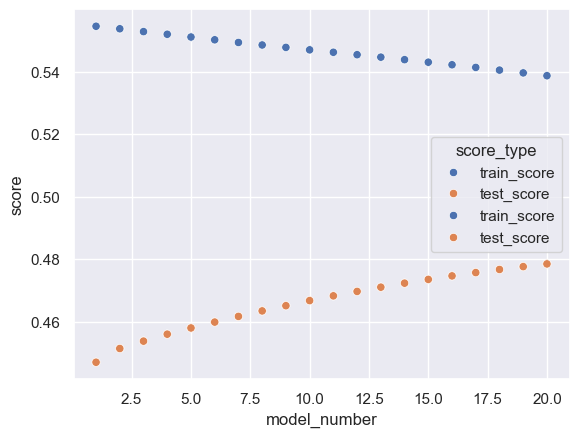

In [316]:
sns.scatterplot(data = gsCV_lasso_train_vs_test_df, y = 'score', x = 'model_number', hue = 'score_type')
plt.show()


In [318]:
print('Best estimators: ' + str(gsCV.best_estimator_))
print('Best score: ' + str(gsCV.best_score_))

Best estimators: Lasso(alpha=0.005, random_state=0)
Best score: 0.47853910800394817


In [320]:
from sklearn.linear_model import LassoCV
from sklearn.metrics import r2_score

# Assuming 'X' is your feature matrix and 'y' is your target variable

lasso_cv = LassoCV(alphas=None)

scaler = StandardScaler()

model_pipeline = Pipeline([('scaler', scaler), ('lasso_cv', lasso_cv)])
# Perform cross-validation

cv_models = []

for train_index, test_index in kf.split(features_dum_drop):
    X_train, X_test = features_dum_drop.iloc[train_index,:], features_dum_drop.iloc[test_index,:]
    y_train, y_test = response.iloc[train_index], response.iloc[test_index]
    # Fit the pipeline on the training data
    model_pipeline.fit(X_train, np.log(y_train))
    # Make predictions on the test set
    y_pred = model_pipeline.predict(X_test)
    # Calculate R-squared for the fold
    r2 = r2_score(np.log(y_test), y_pred)
    # Append the fitted model and R-squared to the list
    cv_models.append((model_pipeline.named_steps['lasso_cv'], r2))
# Access the optimal alpha and R-squared for each fold
optimal_alphas = [model[0].alpha_ for model in cv_models]
r2_scores = [model[1] for model in cv_models]
# Print the optimal alphas and R-squared for each fold
for fold, (alpha, r2) in enumerate(zip(optimal_alphas, r2_scores), 1):
    print(f"Fold {fold}: Optimal alpha = {alpha}, R-squared = {r2}")
print()
print(sum(r2_scores)/len(r2_scores))

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:1656: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:1656: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:1656: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:1656: DataConversionWarning: A column-vector y was passed when 

Fold 1: Optimal alpha = 0.004861473885862222, R-squared = 0.5099581302766107
Fold 2: Optimal alpha = 0.004861473885862222, R-squared = 0.5106581572299886
Fold 3: Optimal alpha = 0.004861473885862222, R-squared = 0.49546821622538173
Fold 4: Optimal alpha = 0.004861473885862222, R-squared = 0.5170226199788568
Fold 5: Optimal alpha = 0.004861473885862222, R-squared = 0.5209883402737714

0.5108190927969218


In [322]:
lasso.set_params(alpha = 0.004861473885862222)
lasso.fit(X = X_train_drop_scaled,y = np.log(y_train_drop_scaled))
print('Best train score: ' + str(lasso.score(X = X_train_drop_scaled,y = np.log(y_train_drop_scaled))))
print('Best test score: ' + str(lasso.score(X = X_test_drop_scaled,y = np.log(y_test_drop_scaled))))


Best train score: 0.5350881893017783
Best test score: 0.5086724198655757


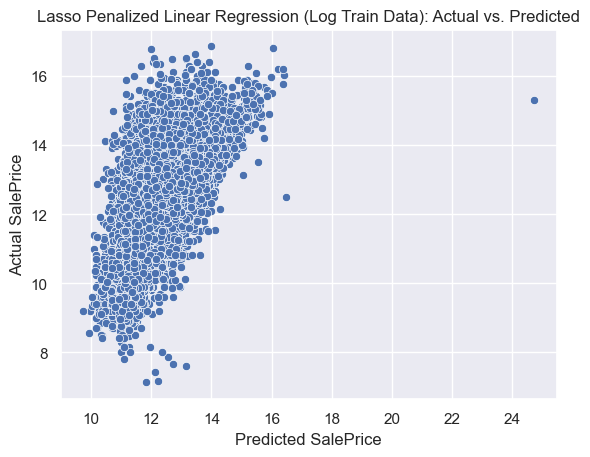

In [324]:
sns.scatterplot(x = lasso.predict(X_train_drop_scaled), y = np.log(y_train_drop_scaled))
plt.title('Lasso Penalized Linear Regression (Log Train Data): Actual vs. Predicted')
plt.xlabel('Predicted SalePrice')
plt.ylabel('Actual SalePrice')
plt.show()


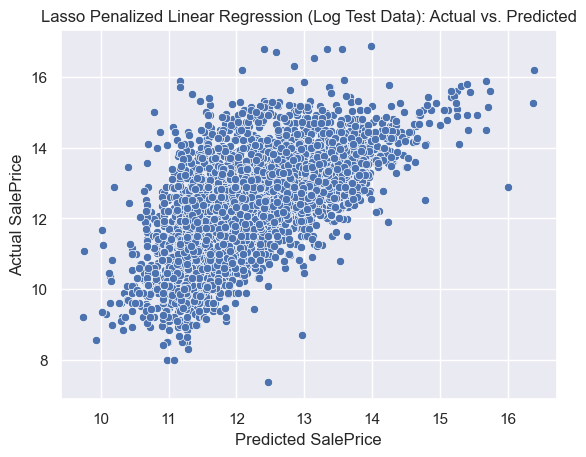

In [326]:
sns.scatterplot(x = lasso.predict(X_test_drop_scaled), y = np.log(y_test_drop_scaled))
plt.title('Lasso Penalized Linear Regression (Log Test Data): Actual vs. Predicted')
plt.xlabel('Predicted SalePrice')
plt.ylabel('Actual SalePrice')
plt.show()


# Lasso - Post Tuning - Cross Validation

In [329]:

lasso = Lasso(alpha = 0.004861473885862222, random_state = 0)

scaler = StandardScaler()

pipe = Pipeline([('scaler',scaler),('model',lasso)])

lasso_drop_scaled_cv_tuned_r2 = cross_val_score(estimator = pipe, X = features_dum_drop, y = np.log(response), cv = kf, scoring = 'r2')
lasso_drop_scaled_cv_tuned_mae = cross_val_score(estimator = pipe, X = features_dum_drop, y = np.log(response), cv = kf, scoring = 'neg_mean_absolute_error')
lasso_drop_scaled_cv_tuned_rmse = cross_val_score(estimator = pipe, X = features_dum_drop, y = np.log(response), cv = kf, scoring = 'neg_root_mean_squared_error')
lasso_drop_scaled_cv_tuned_mape = cross_val_score(estimator = pipe, X = features_dum_drop, y = np.log(response), cv = kf, scoring = 'neg_mean_absolute_percentage_error')



In [331]:
print('Mean cross-validation R2 score: ' + str(lasso_drop_scaled_cv_tuned_r2.mean()))
print('Std dev cross-validation R2 score: ' + str(lasso_drop_scaled_cv_tuned_r2.std()))

Mean cross-validation R2 score: 0.5104085761452107
Std dev cross-validation R2 score: 0.00820740194939667


In [333]:
print('Mean cross-validation MAE score: ' + str((lasso_drop_scaled_cv_tuned_mae * -1).mean()))
print('Std dev cross-validation MAE score: ' + str((lasso_drop_scaled_cv_tuned_mae * -1).std()))

Mean cross-validation MAE score: 0.6525319106622104
Std dev cross-validation MAE score: 0.002756924618491527


In [335]:
print('Mean cross-validation RMSE score: ' + str((lasso_drop_scaled_cv_tuned_rmse * -1).mean()))
print('Std dev cross-validation RMSE score: ' + str((lasso_drop_scaled_cv_tuned_rmse * -1).std()))

Mean cross-validation RMSE score: 0.9009782522540684
Std dev cross-validation RMSE score: 0.006275004321529047


In [337]:
print('Mean cross-validation MAPE score: ' + str((lasso_drop_scaled_cv_tuned_mape * -1).mean()))
print('Std dev cross-validation MAPE score: ' + str((lasso_drop_scaled_cv_tuned_mape * -1).std()))

Mean cross-validation MAPE score: 0.05416975238408748
Std dev cross-validation MAPE score: 0.0002315795410581352


In [339]:
lasso_drop_scaled_cv_tuned_mae = lasso_drop_scaled_cv_tuned_mae * -1
lasso_drop_scaled_cv_tuned_rmse = lasso_drop_scaled_cv_tuned_rmse * -1
lasso_drop_scaled_cv_tuned_mape = lasso_drop_scaled_cv_tuned_mape * -1

# No Zip

## Lasso - No Zip - Base Model - Cross Validation

In [343]:


scaler = StandardScaler()

lasso = Lasso(random_state = 0, alpha = 0.005)

pipe = Pipeline([('scaler',scaler),('model',lasso)])

lasso_drop_scaled_cv_nozip_r2 = cross_val_score(estimator = pipe, X = features_dum_drop_nozip, y = np.log(response), cv = kf, scoring = 'r2')
lasso_drop_scaled_cv_nozip_mae = cross_val_score(estimator = pipe, X = features_dum_drop_nozip, y = np.log(response), cv = kf, scoring = 'neg_mean_absolute_error')
lasso_drop_scaled_cv_nozip_rmse = cross_val_score(estimator = pipe, X = features_dum_drop_nozip, y = np.log(response), cv = kf, scoring = 'neg_root_mean_squared_error')
lasso_drop_scaled_cv_nozip_mape = cross_val_score(estimator = pipe, X = features_dum_drop_nozip, y = np.log(response), cv = kf, scoring = 'neg_mean_absolute_percentage_error')


In [344]:
print('Mean cross-validation R2 score: ' + str(lasso_drop_scaled_cv_nozip_r2.mean()))
print('Std dev cross-validation R2 score: ' + str(lasso_drop_scaled_cv_nozip_r2.std()))
print('Mean cross-validation MAE score: ' + str((lasso_drop_scaled_cv_nozip_mae * -1).mean()))
print('Std dev cross-validation MAE score: ' + str((lasso_drop_scaled_cv_nozip_mae * -1).std()))
print('Mean cross-validation RMSE score: ' + str((lasso_drop_scaled_cv_nozip_rmse * -1).mean()))
print('Std dev cross-validation RMSE score: ' + str((lasso_drop_scaled_cv_nozip_rmse * -1).std()))
print('Mean cross-validation MAPE score: ' + str((lasso_drop_scaled_cv_nozip_mape * -1).mean()))
print('Std dev cross-validation MAPE score: ' + str((lasso_drop_scaled_cv_nozip_mape * -1).std()))

Mean cross-validation R2 score: 0.5048671889005683
Std dev cross-validation R2 score: 0.008239028805349517
Mean cross-validation MAE score: 0.6574930324040493
Std dev cross-validation MAE score: 0.0023467788200517595
Mean cross-validation RMSE score: 0.9060648546170056
Std dev cross-validation RMSE score: 0.0064731013761378286
Mean cross-validation MAPE score: 0.05457294052284545
Std dev cross-validation MAPE score: 0.0001997381310712756


## Lasso - No Zip - Hyperparameter Tuning

In [348]:

# Assuming 'X' is your feature matrix and 'y' is your target variable

lasso_cv = LassoCV(alphas=None)

scaler = StandardScaler()

model_pipeline = Pipeline([('scaler', scaler), ('lasso_cv', lasso_cv)])
# Perform cross-validation

cv_models = []

for train_index, test_index in kf.split(features_dum_drop_nozip):
    X_train, X_test = features_dum_drop_nozip.iloc[train_index,:], features_dum_drop_nozip.iloc[test_index,:]
    y_train, y_test = response.iloc[train_index], response.iloc[test_index]
    # Fit the pipeline on the training data
    model_pipeline.fit(X_train, np.log(y_train))
    # Make predictions on the test set
    y_pred = model_pipeline.predict(X_test)
    # Calculate R-squared for the fold
    r2 = r2_score(np.log(y_test), y_pred)
    # Append the fitted model and R-squared to the list
    cv_models.append((model_pipeline.named_steps['lasso_cv'], r2))
# Access the optimal alpha and R-squared for each fold
optimal_alphas = [model[0].alpha_ for model in cv_models]
r2_scores = [model[1] for model in cv_models]
# Print the optimal alphas and R-squared for each fold
for fold, (alpha, r2) in enumerate(zip(optimal_alphas, r2_scores), 1):
    print(f"Fold {fold}: Optimal alpha = {alpha}, R-squared = {r2}")
print()
print(sum(r2_scores)/len(r2_scores))

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:1656: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:1656: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:1656: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:1656: DataConversionWarning: A column-vector y was passed when 

Fold 1: Optimal alpha = 0.004533826816740481, R-squared = 0.5043391207772572
Fold 2: Optimal alpha = 0.004533826816740481, R-squared = 0.506719892159168
Fold 3: Optimal alpha = 0.004533826816740481, R-squared = 0.49048204082484137
Fold 4: Optimal alpha = 0.004533826816740481, R-squared = 0.5109294836216867
Fold 5: Optimal alpha = 0.004533826816740481, R-squared = 0.5162709331788375

0.5057482941123581


In [350]:
lasso.set_params(alpha = 0.004533826816740481)
lasso.fit(X = X_train_drop_scaled_nozip,y = np.log(y_train_drop_scaled_nozip))
print('Best train score: ' + str(lasso.score(X = X_train_drop_scaled_nozip,y = np.log(y_train_drop_scaled_nozip))))
print('Best test score: ' + str(lasso.score(X = X_test_drop_scaled_nozip,y = np.log(y_test_drop_scaled_nozip))))


Best train score: 0.5280619030133118
Best test score: 0.5034076360600276


## Lasso - No Zip - Post Tuning - Cross Validation

In [353]:

lasso = Lasso(alpha = 0.004533826816740481, random_state = 0)

scaler = StandardScaler()

pipe = Pipeline([('scaler',scaler),('model',lasso)])

lasso_drop_scaled_cv_tuned_nozip_r2 = cross_val_score(estimator = pipe, X = features_dum_drop_nozip, y = np.log(response), cv = kf, scoring = 'r2')
lasso_drop_scaled_cv_tuned_nozip_mae = cross_val_score(estimator = pipe, X = features_dum_drop_nozip, y = np.log(response), cv = kf, scoring = 'neg_mean_absolute_error')
lasso_drop_scaled_cv_tuned_nozip_rmse = cross_val_score(estimator = pipe, X = features_dum_drop_nozip, y = np.log(response), cv = kf, scoring = 'neg_root_mean_squared_error')
lasso_drop_scaled_cv_tuned_nozip_mape = cross_val_score(estimator = pipe, X = features_dum_drop_nozip, y = np.log(response), cv = kf, scoring = 'neg_mean_absolute_percentage_error')



In [355]:
print('Mean cross-validation R2 score: ' + str(lasso_drop_scaled_cv_tuned_nozip_r2.mean()))
print('Std dev cross-validation R2 score: ' + str(lasso_drop_scaled_cv_tuned_nozip_r2.std()))
print('Mean cross-validation MAE score: ' + str((lasso_drop_scaled_cv_tuned_nozip_mae * -1).mean()))
print('Std dev cross-validation MAE score: ' + str((lasso_drop_scaled_cv_tuned_nozip_mae * -1).std()))
print('Mean cross-validation RMSE score: ' + str((lasso_drop_scaled_cv_tuned_nozip_rmse * -1).mean()))
print('Std dev cross-validation RMSE score: ' + str((lasso_drop_scaled_cv_tuned_nozip_rmse * -1).std()))
print('Mean cross-validation MAPE score: ' + str((lasso_drop_scaled_cv_tuned_nozip_mape * -1).mean()))
print('Std dev cross-validation MAPE score: ' + str((lasso_drop_scaled_cv_tuned_nozip_mape * -1).std()))

Mean cross-validation R2 score: 0.5054676951571183
Std dev cross-validation R2 score: 0.00847052559555566
Mean cross-validation MAE score: 0.6569878104041156
Std dev cross-validation MAE score: 0.002388606440439805
Mean cross-validation RMSE score: 0.9055129886244309
Std dev cross-validation RMSE score: 0.006668105394541225
Mean cross-validation MAPE score: 0.05452426652916914
Std dev cross-validation MAPE score: 0.00020472526763719287


In [357]:
lasso_drop_scaled_cv_tuned_nozip_mae = lasso_drop_scaled_cv_tuned_nozip_mae * -1
lasso_drop_scaled_cv_tuned_nozip_rmse = lasso_drop_scaled_cv_tuned_nozip_rmse * -1
lasso_drop_scaled_cv_tuned_nozip_mape = lasso_drop_scaled_cv_tuned_nozip_mape * -1

# Time Trials for Models

In [360]:
import time

i = 1
lasso_times = []
lasso = Lasso(alpha = 0.004533826816740481, random_state = 0)


while i <= 5:
    start = time.time()

    lasso.fit(X = features_dum_drop_scaled, y = np.log(response))
    
    end = time.time()
    
    lasso_time = end - start
    lasso_times.append(lasso_time)
    
    i = i + 1

lasso_times

[7.324054956436157,
 7.084093809127808,
 5.964875936508179,
 5.994190692901611,
 6.303085088729858]

In [363]:

i = 1
lasso_times_nozip = []
lasso = Lasso(alpha = 0.004533826816740481, random_state = 0)


while i <= 5:
    start = time.time()

    lasso.fit(X = features_dum_drop_scaled_nozip, y = np.log(response))
    
    end = time.time()
    
    lasso_time = end - start
    lasso_times_nozip.append(lasso_time)
    
    i = i + 1

lasso_times_nozip

[2.381561040878296,
 2.3152310848236084,
 2.636178970336914,
 2.1284677982330322,
 2.1085081100463867]

# Model Results

In [366]:
lasso_results = pd.DataFrame(data = {'Model Number': np.linspace(1,5,5),
                                     'Model Durations': lasso_times,
                                      'Lasso Penalized Regression_Drop_Scaled R2': lasso_drop_scaled_cv_tuned_r2,
                                      'Lasso Penalized Regression_Drop_Scaled MAE': lasso_drop_scaled_cv_tuned_mae,
                                      'Lasso Penalized Regression_Drop_Scaled RMSE': lasso_drop_scaled_cv_tuned_rmse,
                                      'Lasso Penalized Regression_Drop_Scaled MAPE': lasso_drop_scaled_cv_tuned_mape,
                                     }
                             )

lasso_results

,Model Number,Model Durations,Lasso Penalized Regression_Drop_Scaled R2,Lasso Penalized Regression_Drop_Scaled MAE,Lasso Penalized Regression_Drop_Scaled RMSE,Lasso Penalized Regression_Drop_Scaled MAPE
0,1.0,7.324055,0.508672,0.653847,0.901829,0.054372
1,2.0,7.084094,0.509713,0.652289,0.898756,0.054168
2,3.0,5.964876,0.496634,0.656140,0.911606,0.054367
3,4.0,5.994191,0.516034,0.652665,0.900559,0.054204
4,5.0,6.303085,0.520988,0.647718,0.892141,0.053737


In [368]:
lasso_nozip_results = pd.DataFrame(data = {'Model Number': np.linspace(1,5,5),
                                     'Model Durations': lasso_times_nozip,
                                      'Lasso Penalized Regression_Drop_Scaled_NoZip R2': lasso_drop_scaled_cv_tuned_nozip_r2,
                                      'Lasso Penalized Regression_Drop_Scaled_NoZip MAE': lasso_drop_scaled_cv_tuned_nozip_mae,
                                      'Lasso Penalized Regression_Drop_Scaled_NoZip RMSE': lasso_drop_scaled_cv_tuned_nozip_rmse,
                                      'Lasso Penalized Regression_Drop_Scaled_NoZip MAPE': lasso_drop_scaled_cv_tuned_nozip_mape,
                                     }
                             )

lasso_nozip_results

,Model Number,Model Durations,Lasso Penalized Regression_Drop_Scaled_NoZip R2,Lasso Penalized Regression_Drop_Scaled_NoZip MAE,Lasso Penalized Regression_Drop_Scaled_NoZip RMSE,Lasso Penalized Regression_Drop_Scaled_NoZip MAPE
0,1.0,2.381561,0.503408,0.658181,0.906648,0.054742
1,2.0,2.315231,0.506296,0.656443,0.901883,0.054499
2,3.0,2.636179,0.490902,0.660229,0.916782,0.054672
3,4.0,2.128468,0.510462,0.657134,0.905729,0.054556
4,5.0,2.108508,0.516271,0.652953,0.896523,0.054152


In [370]:

current_directory = os.getcwd()

dataframes = {'lasso_results': lasso_results,
              'lasso_results_nozip': lasso_nozip_results,
             }


for name, df in dataframes.items():

    file_path = os.path.join(current_directory, f"{name}.csv")
    
    df.to_csv(file_path, sep='\t', index=False)

# XGBoost

# XGBoost - Base Model

In [178]:
from xgboost import XGBRegressor
from sklearn.metrics import r2_score

xgb = XGBRegressor(objective ='reg:squarederror', random_state=0)


xgb.fit(X_train_encoded, np.log(y_train_encoded))


print('Best train score: ' + str(r2_score(np.log(y_train_encoded), xgb.predict(X_train_encoded))))
print('Best test score: ' + str(r2_score(np.log(y_test_encoded), xgb.predict(X_test_encoded))))


Best train score: 0.8753694479082693
Best test score: 0.7963258786276279


# XGBoost - Base Model - Cross Validation


In [179]:

xgb = XGBRegressor(objective ='reg:squarederror', random_state=0)

xgb_encoded_cv_r2 = cross_val_score(estimator = xgb, X = features_encoded, y = np.log(response), cv = kf, scoring = 'r2')
xgb_encoded_cv_mae = cross_val_score(estimator = xgb, X = features_encoded, y = np.log(response), cv = kf, scoring = 'neg_mean_absolute_error')
xgb_encoded_cv_rmse = cross_val_score(estimator = xgb, X = features_encoded, y = np.log(response), cv = kf, scoring = 'neg_root_mean_squared_error')
xgb_encoded_cv_mape = cross_val_score(estimator = xgb, X = features_encoded, y = np.log(response), cv = kf, scoring = 'neg_mean_absolute_percentage_error')



In [180]:

print('Mean cross-validation score: ' + str(xgb_encoded_cv_r2.mean()))
print('Std dev cross-validation score: ' + str(xgb_encoded_cv_r2.std()))

Mean cross-validation score: 0.7923457590487253
Std dev cross-validation score: 0.0061155519773659055


In [181]:

print('Mean cross-validation score: ' + str((xgb_encoded_cv_mae * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_encoded_cv_mae * -1).std()))

Mean cross-validation score: 0.40270806607270515
Std dev cross-validation score: 0.003717862839569678


In [182]:

print('Mean cross-validation score: ' + str((xgb_encoded_cv_rmse * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_encoded_cv_rmse * -1).std()))

Mean cross-validation score: 0.5867305547201859
Std dev cross-validation score: 0.007575453786573618


In [183]:

print('Mean cross-validation score: ' + str((xgb_encoded_cv_mape * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_encoded_cv_mape * -1).std()))

Mean cross-validation score: 0.03339075074142921
Std dev cross-validation score: 0.00027162750343162986


# XGBoost - Hyperparameter Tuning 

In [ ]:
xgb = XGBRegressor(objective ='reg:squarederror', random_state=0)

param = {'learning_rate': [0.2, 0.3, 0.4],
         'subsample': [0.3, 0.6, 1],
         #'colsample_bytree': [0.7, 0.8, 0.9],
         'n_estimators': [60, 80, 100],
         'max_depth':range(4,17,4),
         #'min_child_weight':range(1,6,2)
        }

gsCV = GridSearchCV(xgb, param, cv = kf, return_train_score = True)
gsCV.fit(X_train_encoded, np.log(y_train_encoded))


In [190]:
xgb = XGBRegressor(objective ='reg:squarederror', random_state=0)

param = {'learning_rate': [0.033, 0.1, 0.133, 0.3, 0.4],
         'subsample': [0.3, 0.6, 1],
         'n_estimators': [40, 50, 60],
         'max_depth':range(3,10,2)
        }

gsCV = GridSearchCV(xgb, param, cv = kf, return_train_score = True)
gsCV.fit(X_train_encoded, np.log(y_train_encoded))


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    inter...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=0, ...),
             param_grid={'learning_rate': [0.033, 0.1, 0.133, 0.3, 0.4],
                         'max_depth': range(3, 10, 2),
                         'n_estimators': [40, 50, 60],
                         'subsample': [0.3, 0.6, 1]},
             return_train_score=True)

In [191]:
gsCV_xgb_train_vs_test_df = pd.DataFrame(data = {'train_score': gsCV.cv_results_['mean_train_score'],\
                                               'test_score': gsCV.cv_results_['mean_test_score']}).reset_index().rename(columns = {'index': 'model_number'})
gsCV_xgb_train_vs_test_df['model_number'] = gsCV_xgb_train_vs_test_df['model_number'] + 1
gsCV_xgb_train_vs_test_df['score_difference'] = gsCV_xgb_train_vs_test_df['train_score'] - gsCV_xgb_train_vs_test_df['test_score']

gsCV_xgb_train_vs_test_df = gsCV_xgb_train_vs_test_df.melt(id_vars = ['model_number','score_difference'], value_vars = ['train_score', 'test_score'], var_name = 'score_type', value_name = 'score')

gsCV_xgb_train_vs_test_df


,model_number,score_difference,score_type,score
0,1,0.003247,train_score,0.526724
1,2,0.003399,train_score,0.525902
2,3,0.003830,train_score,0.524607
3,4,0.003577,train_score,0.562791
4,5,0.003973,train_score,0.561826
5,6,0.004301,train_score,0.560169
6,7,0.003939,train_score,0.588200
7,8,0.004475,train_score,0.587527
8,9,0.004935,train_score,0.586269
9,10,0.010037,train_score,0.613578


Text(0, 0.5, 'R2')

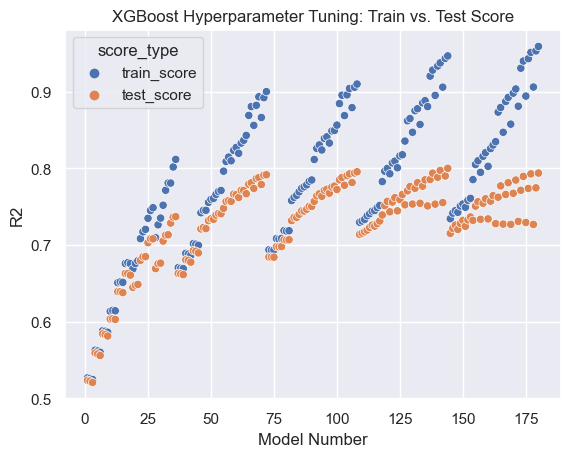

In [192]:
sns.scatterplot(data = gsCV_xgb_train_vs_test_df.loc[gsCV_xgb_train_vs_test_df['score'] > 0,:], y = 'score', x = 'model_number', hue = 'score_type')
plt.title('XGBoost Hyperparameter Tuning: Train vs. Test Score')
plt.xlabel('Model Number')
plt.ylabel('R2')

In [193]:
print('Best score: ' + str(gsCV.best_score_))
print('Best parameters: ' + str(gsCV.best_params_))


Best score: 0.8000175932613971
Best parameters: {'learning_rate': 0.3, 'max_depth': 9, 'n_estimators': 60, 'subsample': 1}


In [194]:
# Testing colsample_bytree and min_child_weight

xgb = XGBRegressor(objective ='reg:squarederror', random_state=0)

param = {'learning_rate': [0.3],
         'subsample': [1],
         'colsample_bytree': [0.7, 0.8, 0.9],
         'n_estimators': [60, 80, 100],
         'max_depth':range(4,17,4),
         'min_child_weight':range(1,6,2)
        }

gsCV = GridSearchCV(xgb, param, cv = kf, return_train_score = True)
gsCV.fit(X_train_encoded, np.log(y_train_encoded))


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    inter...
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=0, ...),
             param_grid={'colsample_bytree': [0.7, 0.8, 0.9],
                         'learning_rate': [0.3], 'max_depth': range(4, 17, 4),
                         'min_child_weight': range(1, 6, 2),
                         'n_estimators': [60, 80, 100], 'subsample': [1]},
             return_train_score=True)

In [196]:
gsCV_xgb_train_vs_test_df = pd.DataFrame(data = {'train_score': gsCV.cv_results_['mean_train_score'],\
                                               'test_score': gsCV.cv_results_['mean_test_score']}).reset_index().rename(columns = {'index': 'model_number'})
gsCV_xgb_train_vs_test_df['model_number'] = gsCV_xgb_train_vs_test_df['model_number'] + 1
gsCV_xgb_train_vs_test_df['score_difference'] = gsCV_xgb_train_vs_test_df['train_score'] - gsCV_xgb_train_vs_test_df['test_score']

gsCV_xgb_train_vs_test_df = gsCV_xgb_train_vs_test_df.melt(id_vars = ['model_number','score_difference'], value_vars = ['train_score', 'test_score'], var_name = 'score_type', value_name = 'score')

gsCV_xgb_train_vs_test_df


,model_number,score_difference,score_type,score
0,1,0.033656,train_score,0.784833
1,2,0.038693,train_score,0.796179
2,3,0.043990,train_score,0.806455
3,4,0.033862,train_score,0.784745
4,5,0.038717,train_score,0.796694
5,6,0.044730,train_score,0.807265
6,7,0.032149,train_score,0.783607
7,8,0.038037,train_score,0.795935
8,9,0.043069,train_score,0.805972
9,10,0.122826,train_score,0.916160


Text(0, 0.5, 'R2')

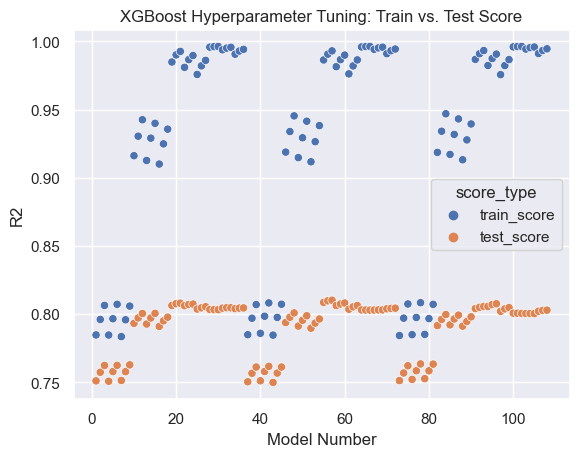

In [197]:
sns.scatterplot(data = gsCV_xgb_train_vs_test_df.loc[gsCV_xgb_train_vs_test_df['score'] > 0,:], y = 'score', x = 'model_number', hue = 'score_type')
plt.title('XGBoost Hyperparameter Tuning: Train vs. Test Score')
plt.xlabel('Model Number')
plt.ylabel('R2')

In [195]:
print('Best score: ' + str(gsCV.best_score_))
print('Best parameters: ' + str(gsCV.best_params_))


Best score: 0.8102577857739861
Best parameters: {'colsample_bytree': 0.8, 'learning_rate': 0.3, 'max_depth': 12, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 1}


In [237]:
xgb.set_params(
    colsample_bytree = 0.8,
    min_child_weight = 1,
    learning_rate = 0.3, 
    max_depth = 12, 
    subsample = 1, 
    n_estimators = 100)
xgb.fit(X = X_train_encoded, y = np.log(y_train_encoded))
print('Best train score: ' + str(xgb.score(X = X_train_encoded,y = np.log(y_train_encoded))))
print('Best test score: ' + str(xgb.score(X = X_test_encoded,y = np.log(y_test_encoded))))


Best train score: 0.9908289799935789
Best test score: 0.8345086662645498


Text(0, 0.5, 'Actual SalePrice')

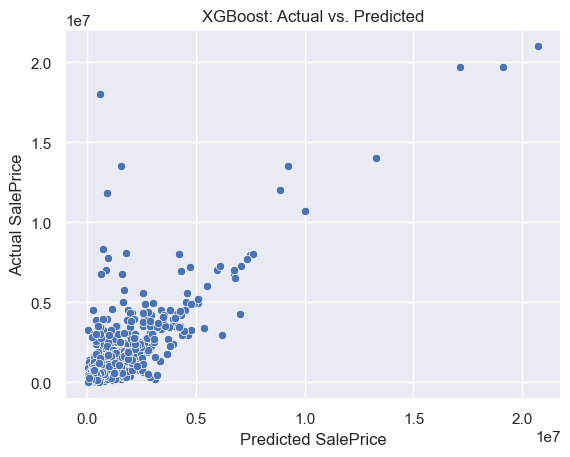

In [248]:
sns.scatterplot(x = np.exp(xgb.predict(X_test_encoded)), y = y_test_encoded)
plt.title('XGBoost: Actual vs. Predicted')
plt.xlabel('Predicted SalePrice')
plt.ylabel('Actual SalePrice')

Text(0, 0.5, 'Actual SalePrice')

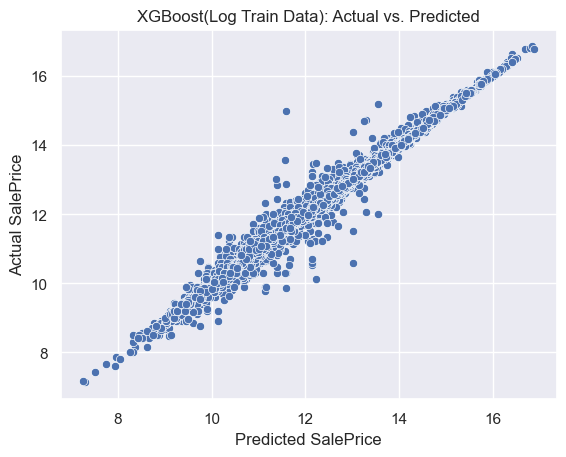

In [200]:
sns.scatterplot(x = xgb.predict(X_train_encoded), y = np.log(y_train_encoded))
plt.title('XGBoost(Log Train Data): Actual vs. Predicted')
plt.xlabel('Predicted SalePrice')
plt.ylabel('Actual SalePrice')

Text(0, 0.5, 'Actual SalePrice')

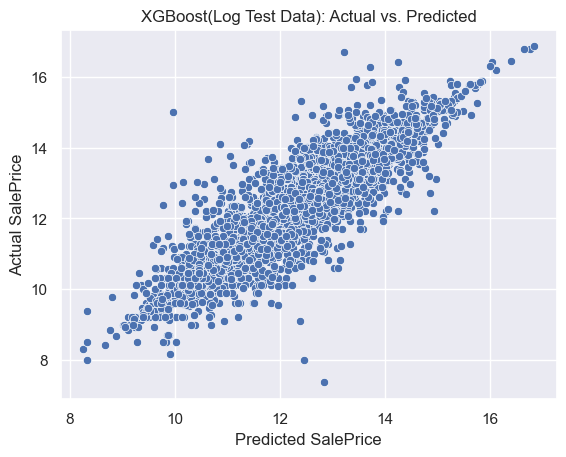

In [201]:
sns.scatterplot(x = xgb.predict(X_test_encoded), y = np.log(y_test_encoded))
plt.title('XGBoost(Log Test Data): Actual vs. Predicted')
plt.xlabel('Predicted SalePrice')
plt.ylabel('Actual SalePrice')

# XGBoost - Post Tuning - Cross Validation


In [203]:

xgb = XGBRegressor(objective ='reg:squarederror', 
                   random_state=0, 
                   colsample_bytree = 0.8,
                   min_child_weight = 1,
                   learning_rate = 0.3, 
                   max_depth = 12, 
                   subsample = 1, 
                   n_estimators = 100)

xgb_encoded_cv_tuned_r2 = cross_val_score(estimator = xgb, X = features_encoded, y = np.log(response), cv = kf, scoring = 'r2')
xgb_encoded_cv_tuned_mae = cross_val_score(estimator = xgb, X = features_encoded, y = np.log(response), cv = kf, scoring = 'neg_mean_absolute_error')
xgb_encoded_cv_tuned_rmse = cross_val_score(estimator = xgb, X = features_encoded, y = np.log(response), cv = kf, scoring = 'neg_root_mean_squared_error')
xgb_encoded_cv_tuned_mape = cross_val_score(estimator = xgb, X = features_encoded, y = np.log(response), cv = kf, scoring = 'neg_mean_absolute_percentage_error')


In [204]:

print('Mean cross-validation score: ' + str(xgb_encoded_cv_tuned_r2.mean()))
print('Std dev cross-validation score: ' + str(xgb_encoded_cv_tuned_r2.std()))

Mean cross-validation score: 0.8272512606167199
Std dev cross-validation score: 0.004816478523822384


In [205]:

print('Mean cross-validation score: ' + str((xgb_encoded_cv_tuned_mae * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_encoded_cv_tuned_mae * -1).std()))

Mean cross-validation score: 0.32052630492757006
Std dev cross-validation score: 0.003880278360661483


In [206]:

print('Mean cross-validation score: ' + str((xgb_encoded_cv_tuned_rmse * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_encoded_cv_tuned_rmse * -1).std()))

Mean cross-validation score: 0.5351570740637298
Std dev cross-validation score: 0.006552716013906641


In [207]:

print('Mean cross-validation score: ' + str((xgb_encoded_cv_tuned_mape * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_encoded_cv_tuned_mape * -1).std()))

Mean cross-validation score: 0.02631710024563777
Std dev cross-validation score: 0.00027590391662970994


In [208]:
xgb_encoded_cv_tuned_mae = xgb_encoded_cv_tuned_mae * -1
xgb_encoded_cv_tuned_rmse = xgb_encoded_cv_tuned_rmse * -1
xgb_encoded_cv_tuned_mape = xgb_encoded_cv_tuned_mape * -1

# No Zip

## XGBoost - No Zip - Base Model - Cross Validation

In [209]:

xgb = XGBRegressor(objective ='reg:squarederror', random_state=0)

xgb_encoded_cv_nozip_r2 = cross_val_score(estimator = xgb, X = features_encoded_nozip, y = np.log(response), cv = kf, scoring = 'r2')
xgb_encoded_cv_nozip_mae = cross_val_score(estimator = xgb, X = features_encoded_nozip, y = np.log(response), cv = kf, scoring = 'neg_mean_absolute_error')
xgb_encoded_cv_nozip_rmse = cross_val_score(estimator = xgb, X = features_encoded_nozip, y = np.log(response), cv = kf, scoring = 'neg_root_mean_squared_error')
xgb_encoded_cv_nozip_mape = cross_val_score(estimator = xgb, X = features_encoded_nozip, y = np.log(response), cv = kf, scoring = 'neg_mean_absolute_percentage_error')



In [210]:

print('Mean cross-validation score: ' + str(xgb_encoded_cv_nozip_r2.mean()))
print('Std dev cross-validation score: ' + str(xgb_encoded_cv_nozip_r2.std()))

print('Mean cross-validation score: ' + str((xgb_encoded_cv_nozip_mae * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_encoded_cv_nozip_mae * -1).std()))

print('Mean cross-validation score: ' + str((xgb_encoded_cv_nozip_rmse * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_encoded_cv_nozip_rmse * -1).std()))

print('Mean cross-validation score: ' + str((xgb_encoded_cv_nozip_mape * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_encoded_cv_nozip_mape * -1).std()))

Mean cross-validation score: 0.7908118304003251
Std dev cross-validation score: 0.006274178149198061
Mean cross-validation score: 0.40479946692607927
Std dev cross-validation score: 0.0037572418039924947
Mean cross-validation score: 0.5888900262471738
Std dev cross-validation score: 0.007729016339440031
Mean cross-validation score: 0.03355743529543326
Std dev cross-validation score: 0.00028030415585155957


## XGBoost - No Zip - Hyperparameter Tuning

In [140]:
xgb = XGBRegressor(objective ='reg:squarederror', random_state=0)

param = {'learning_rate': [0.033, 0.1, 0.133, 0.3, 0.4],
         'subsample': [0.3, 0.6, 1],
         'n_estimators': [40, 50, 60],
         'max_depth':range(3,10,2)
        }

gsCV = GridSearchCV(xgb, param, cv = kf, return_train_score = True)
gsCV.fit(X_train_encoded_nozip, np.log(y_train_encoded_nozip))


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    inter...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=0, ...),
             param_grid={'learning_rate': [0.033, 0.1, 0.133, 0.3, 0.4],
                         'max_depth': range(3, 10, 2),
                         'n_estimators': [40, 50, 60],
                         'subsample': [0.3, 0.6, 1]},
             return_train_score=True)

In [215]:
print('Best score: ' + str(gsCV.best_score_))
print('Best parameters: ' + str(gsCV.best_params_))


Best score: 0.8086826569287521
Best parameters: {'colsample_bytree': 0.9, 'learning_rate': 0.3, 'max_depth': 12, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 1}


In [143]:
xgb.set_params(learning_rate = 0.3, max_depth = 9, subsample = 1, n_estimators = 60)
xgb.fit(X = X_train_encoded_nozip, y = np.log(y_train_encoded_nozip))
print('Best train score: ' + str(xgb.score(X = X_train_encoded_nozip,y = np.log(y_train_encoded_nozip))))
print('Best test score: ' + str(xgb.score(X = X_test_encoded_nozip,y = np.log(y_test_encoded_nozip))))


Best train score: 0.9366689536207193
Best test score: 0.8197994852390064


In [213]:
# Testing colsample_bytree and min_child_weight

xgb = XGBRegressor(objective ='reg:squarederror', random_state=0)

param = {'learning_rate': [0.3],
         'subsample': [1],
         'colsample_bytree': [0.7, 0.8, 0.9],
         'n_estimators': [60, 80, 100],
         'max_depth':range(4,17,4),
         'min_child_weight':range(1,6,2)
        }


gsCV = GridSearchCV(xgb, param, cv = kf, return_train_score = True)
gsCV.fit(X_train_encoded_nozip, np.log(y_train_encoded_nozip))


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    inter...
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=0, ...),
             param_grid={'colsample_bytree': [0.7, 0.8, 0.9],
                         'learning_rate': [0.3], 'max_depth': range(4, 17, 4),
                         'min_child_weight': range(1, 6, 2),
                         'n_estimators': [60, 80, 100], 'subsample': [1]},
             return_train_score=True)

In [214]:
print('Best score: ' + str(gsCV.best_score_))
print('Best parameters: ' + str(gsCV.best_params_))


Best score: 0.8086826569287521
Best parameters: {'colsample_bytree': 0.9, 'learning_rate': 0.3, 'max_depth': 12, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 1}


In [236]:
xgb.set_params(
    learning_rate = 0.3,
    #subsample = 1,
    colsample_bytree = 0.9,
    min_child_weight = 3,
    max_depth = 12, 
    subsample = 1, 
    n_estimators = 100)
xgb.fit(X = X_train_encoded_nozip, y = np.log(y_train_encoded_nozip))
print('Best train score: ' + str(xgb.score(X = X_train_encoded_nozip,y = np.log(y_train_encoded_nozip))))
print('Best test score: ' + str(xgb.score(X = X_test_encoded_nozip,y = np.log(y_test_encoded_nozip))))


Best train score: 0.988566444797917
Best test score: 0.8291870884132587


## XGBoost - No Zip - Post Tuning - Cross Validation

In [225]:

xgb = XGBRegressor(objective ='reg:squarederror', random_state=0, 
                   learning_rate = 0.3,
                   #subsample = 1,
                   colsample_bytree = 0.9,
                   min_child_weight = 3,
                   max_depth = 12, 
                   subsample = 1, 
                   n_estimators = 100           
                  )

xgb_encoded_cv_tuned_nozip_r2 = cross_val_score(estimator = xgb, X = features_encoded_nozip, y = np.log(response), cv = kf, scoring = 'r2')
xgb_encoded_cv_tuned_nozip_mae = cross_val_score(estimator = xgb, X = features_encoded_nozip, y = np.log(response), cv = kf, scoring = 'neg_mean_absolute_error')
xgb_encoded_cv_tuned_nozip_rmse = cross_val_score(estimator = xgb, X = features_encoded_nozip, y = np.log(response), cv = kf, scoring = 'neg_root_mean_squared_error')
xgb_encoded_cv_tuned_nozip_mape = cross_val_score(estimator = xgb, X = features_encoded_nozip, y = np.log(response), cv = kf, scoring = 'neg_mean_absolute_percentage_error')


In [226]:

print('Mean cross-validation score: ' + str(xgb_encoded_cv_tuned_nozip_r2.mean()))
print('Std dev cross-validation score: ' + str(xgb_encoded_cv_tuned_nozip_r2.std()))

print('Mean cross-validation score: ' + str((xgb_encoded_cv_tuned_nozip_mae * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_encoded_cv_tuned_nozip_mae * -1).std()))

print('Mean cross-validation score: ' + str((xgb_encoded_cv_tuned_nozip_rmse * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_encoded_cv_tuned_nozip_rmse * -1).std()))

print('Mean cross-validation score: ' + str((xgb_encoded_cv_tuned_nozip_mape * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_encoded_cv_tuned_nozip_mape * -1).std()))

Mean cross-validation score: 0.8249396016820496
Std dev cross-validation score: 0.004791194060303983
Mean cross-validation score: 0.32728689863017096
Std dev cross-validation score: 0.003257916898729245
Mean cross-validation score: 0.5387268508191279
Std dev cross-validation score: 0.006328543302348645
Mean cross-validation score: 0.02690683285528226
Std dev cross-validation score: 0.0002403718807305546


In [227]:
xgb_encoded_cv_tuned_nozip_mae = xgb_encoded_cv_tuned_nozip_mae * -1
xgb_encoded_cv_tuned_nozip_rmse = xgb_encoded_cv_tuned_nozip_rmse * -1
xgb_encoded_cv_tuned_nozip_mape = xgb_encoded_cv_tuned_nozip_mape * -1

# Time Trials for Models

In [228]:
import time

i = 1
xgb_times = []
xgb.set_params(learning_rate = 0.3, max_depth = 9, subsample = 1, n_estimators = 60)

while i <= 5:
    start = time.time()

    xgb.fit(X = features_encoded, y = np.log(response))
    
    end = time.time()
    
    xgb_time = end - start
    xgb_times.append(xgb_time)
    
    i = i + 1

xgb_times

[0.33836913108825684,
 0.3149068355560303,
 0.3289501667022705,
 0.30922389030456543,
 0.29729795455932617]

In [229]:
i = 1
xgb_times_nozip = []
xgb.set_params(learning_rate = 0.3, max_depth = 9, subsample = 1, n_estimators = 60)

while i <= 5:
    start = time.time()

    xgb.fit(X = features_encoded_nozip, y = np.log(response))
    
    end = time.time()
    
    xgb_time = end - start
    xgb_times_nozip.append(xgb_time)
    
    i = i + 1

xgb_times_nozip

[0.3384208679199219,
 0.30631494522094727,
 0.3411531448364258,
 0.31656813621520996,
 0.3342580795288086]

# Model Results

In [233]:
xgb_results = pd.DataFrame(data = {'Model Number': np.linspace(1,5,5),
                                     'Model Durations': xgb_times,
                                      'XGBoost_Encoded R2': xgb_encoded_cv_tuned_r2,
                                      'XGBoost_Encoded MAE': xgb_encoded_cv_tuned_mae,
                                      'XGBoost_Encoded RMSE': xgb_encoded_cv_tuned_rmse,
                                      'XGBoost_Encoded MAPE': xgb_encoded_cv_tuned_mape  
                                     }
                             )

xgb_results

,Model Number,Model Durations,XGBoost_Encoded R2,XGBoost_Encoded MAE,XGBoost_Encoded RMSE,XGBoost_Encoded MAPE
0,1.0,0.338369,0.833458,0.317842,0.531037,0.026179
1,2.0,0.314907,0.828713,0.314847,0.527930,0.025868
2,3.0,0.328950,0.823975,0.322906,0.538598,0.026519
3,4.0,0.309224,0.819813,0.325994,0.546266,0.026660
4,5.0,0.297298,0.830297,0.321043,0.531955,0.026359


In [234]:
xgb_nozip_results = pd.DataFrame(data = {'Model Number': np.linspace(1,5,5),
                                     'Model Durations': xgb_times_nozip,
                                      'XGBoost_Encoded_NoZip R2': xgb_encoded_cv_tuned_nozip_r2,
                                      'XGBoost_Encoded_NoZip MAE': xgb_encoded_cv_tuned_nozip_mae,
                                      'XGBoost_Encoded_NoZip RMSE': xgb_encoded_cv_tuned_nozip_rmse,
                                      'XGBoost_Encoded_NoZip MAPE': xgb_encoded_cv_tuned_nozip_mape  
                                     }
                             )

xgb_nozip_results

,Model Number,Model Durations,XGBoost_Encoded_NoZip R2,XGBoost_Encoded_NoZip MAE,XGBoost_Encoded_NoZip RMSE,XGBoost_Encoded_NoZip MAPE
0,1.0,0.338421,0.830817,0.327425,0.535230,0.026996
1,2.0,0.306315,0.823493,0.321489,0.535915,0.026454
2,3.0,0.341153,0.827028,0.326866,0.533907,0.026885
3,4.0,0.316568,0.816555,0.330948,0.551182,0.027128
4,5.0,0.334258,0.826805,0.329707,0.537401,0.027071


In [235]:

current_directory = os.getcwd()

dataframes = {'xgb_results': xgb_results,
              'xgb_nozip_results': xgb_nozip_results
             }


for name, df in dataframes.items():

    file_path = os.path.join(current_directory, f"{name}.csv")
    
    df.to_csv(file_path, sep='\t', index=False)

# SHAP Analysis

In [153]:
import shap
shap. initjs()

xgb.set_params(learning_rate = 0.3, max_depth = 9, subsample = 1, n_estimators = 60)


shap_model = xgb.fit(X = features_encoded, y = (response))

explainer = shap.TreeExplainer(shap_model)
shap_values = explainer(features_encoded)


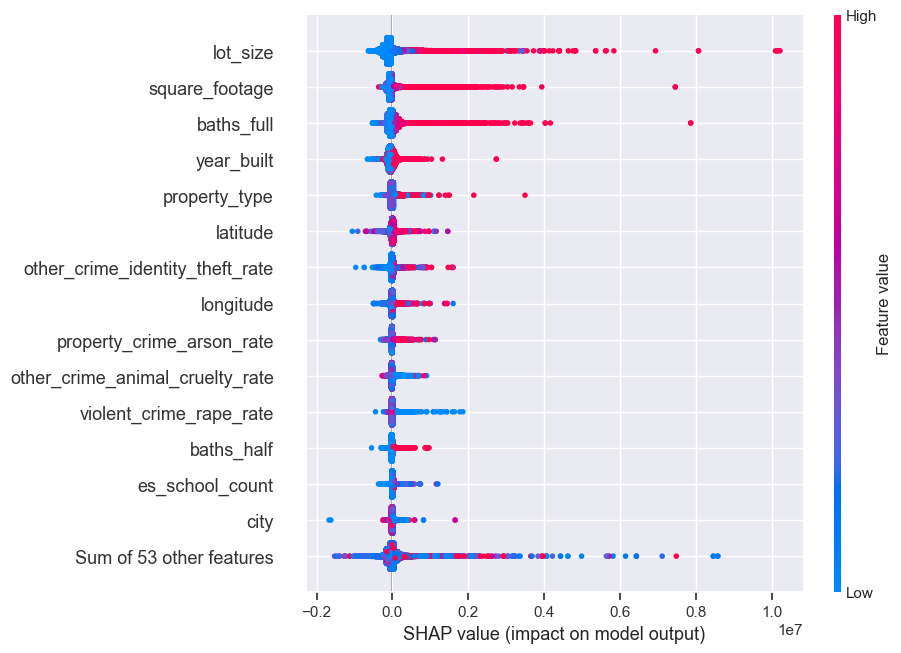

In [154]:
shap.plots.beeswarm(shap_values, max_display = 15)

# Assessing Outlier Removal


In [64]:
# Calculate quantiles and maximum/minimum values for Price

q1 = np.percentile(GA_listings_crime_schools_merged['price'], 25)
q3 = np.percentile(GA_listings_crime_schools_merged['price'], 75)
IQR = q3 - q1

outlier_maximum_level_price = q3 + 1.5*IQR
outlier_minimum_level_price = q1 - 1.5*IQR

print("Maximum level: " + str(outlier_maximum_level_price))
print("Minimum level: " + str(outlier_minimum_level_price))



Maximum level: 1171447.5
Minimum level: -558868.5


In [190]:
# Install seaborn
!pip install seaborn

  Using cached seaborn-0.13.2-py3-none-any.whl.metadata (5.4 kB)
Using cached seaborn-0.13.2-py3-none-any.whl (294 kB)


In [191]:
import seaborn as sns

Text(0.5, 1.0, 'Distribution of Listing Prices')

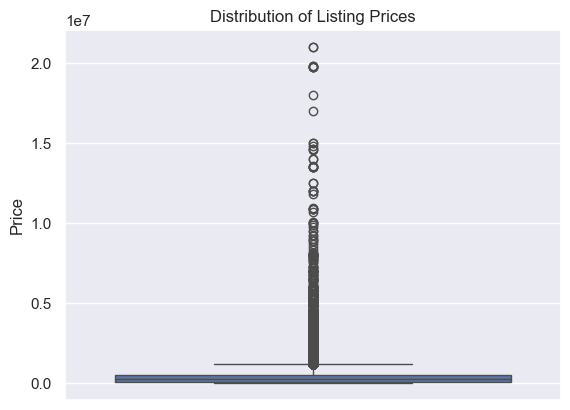

In [215]:
sns.boxplot(data = GA_listings_crime_schools_merged, y = 'price')
plt.ylabel('Price')
plt.title('Distribution of Listing Prices')

Text(0.5, 1.0, 'Distribution of Listing Prices')

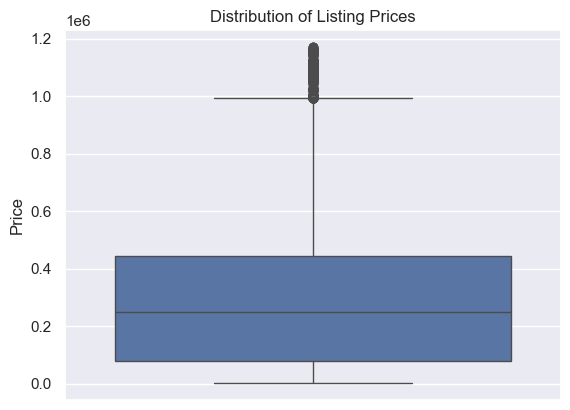

In [216]:
sns.boxplot(data = GA_listings_crime_schools_merged.loc[GA_listings_crime_schools_merged['price'] < outlier_maximum_level, :] , y = 'price')
plt.ylabel('Price')
plt.title('Distribution of Listing Prices')

Text(0.5, 1.0, 'Distribution of Listing Prices')

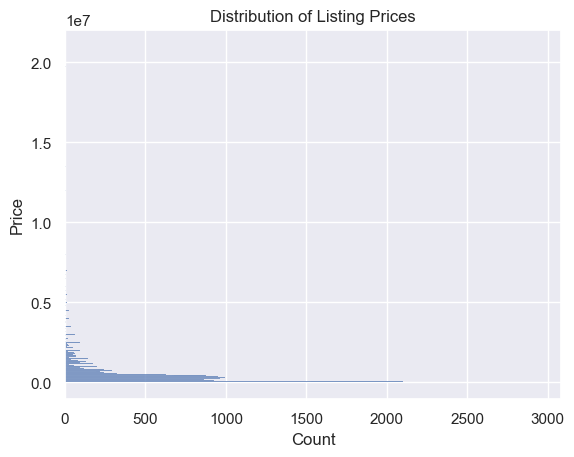

In [8]:
sns.histplot(data = GA_listings_crime_schools_merged, y = 'price', log_scale = False)
plt.ylabel('Price')
plt.title('Distribution of Listing Prices')

Text(0.5, 1.0, 'Distribution of Listing Prices')

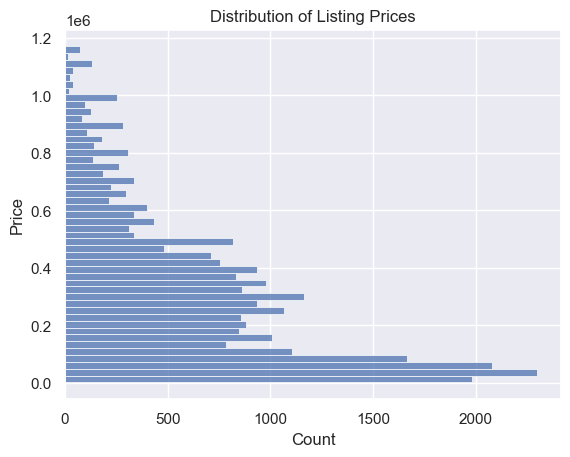

In [13]:
sns.histplot(data = GA_listings_crime_schools_merged.loc[GA_listings_crime_schools_merged['price'] < outlier_maximum_level, :] , y = 'price', log_scale = False)
plt.ylabel('Price')
plt.title('Distribution of Listing Prices')

Text(0.5, 1.0, 'Distribution of Listing Prices')

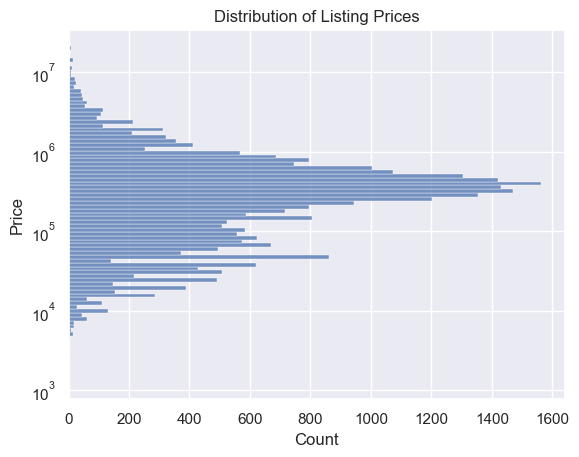

In [37]:
sns.histplot(data = GA_listings_crime_schools_merged, y = 'price', log_scale = True)
plt.ylabel('Price')
plt.title('Distribution of Listing Prices')

Text(0.5, 1.0, 'Distribution of Listing Prices')

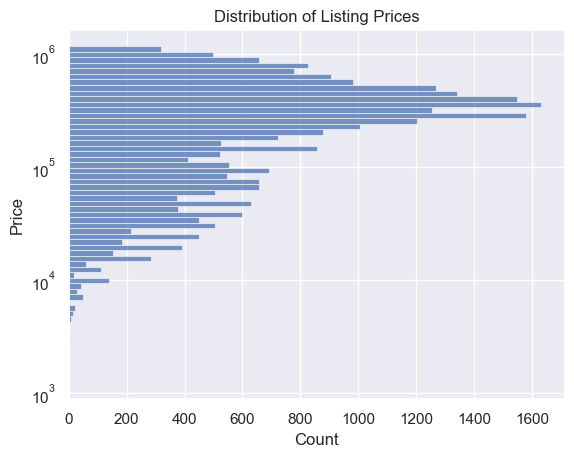

In [14]:
sns.histplot(data = GA_listings_crime_schools_merged.loc[GA_listings_crime_schools_merged['price'] < outlier_maximum_level, :] , y = 'price', log_scale = True)
plt.ylabel('Price')
plt.title('Distribution of Listing Prices')

In [56]:
print("Rows removed for Price: ", + GA_listings_crime_schools_merged.loc[GA_listings_crime_schools_merged['price'] > outlier_maximum_level_price, :].shape[0])



Rows removed for Price:  2549


In [65]:
# Removing extremely low log data points due to sparcity

GA_listings_crime_schools_merged = GA_listings_crime_schools_merged[np.log(GA_listings_crime_schools_merged['price']) > 5]

GA_listings_crime_schools_merged.shape

(31006, 76)

In [66]:
# Calculate quantiles and maximum/minimum values for square_footage

q1 = np.percentile(GA_listings_crime_schools_merged['square_footage'], 25)
q3 = np.percentile(GA_listings_crime_schools_merged['square_footage'], 75)
IQR = q3 - q1

outlier_maximum_level_square_footage = q3 + 1.5*IQR
outlier_minimum_level_square_footage = q1 - 1.5*IQR

print("Maximum level: " + str(outlier_maximum_level_square_footage))
print("Minimum level: " + str(outlier_minimum_level_square_footage))



Maximum level: 4428.75
Minimum level: -2657.25


Text(0.5, 1.0, "Distribution of Listings' Square Footage")

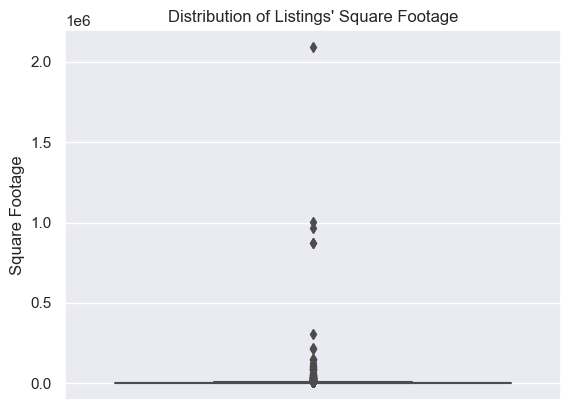

In [67]:
sns.boxplot(data = GA_listings_crime_schools_merged, y = 'square_footage')
plt.ylabel('Square Footage')
plt.title("Distribution of Listings' Square Footage")

Text(0.5, 1.0, "Distribution of Listings' Square Footage")

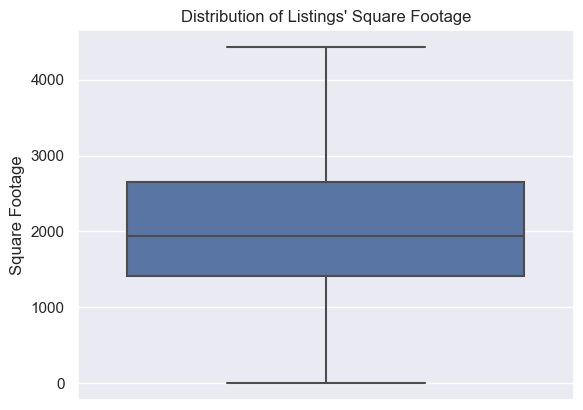

In [68]:
sns.boxplot(data = GA_listings_crime_schools_merged.loc[(GA_listings_crime_schools_merged['square_footage'] < outlier_maximum_level_square_footage) & (GA_listings_crime_schools_merged['square_footage'] > 0), :], y = ('square_footage'))
plt.ylabel('Square Footage')
plt.title("Distribution of Listings' Square Footage")

Text(0.5, 1.0, "Distribution of Listings' Square Footage")

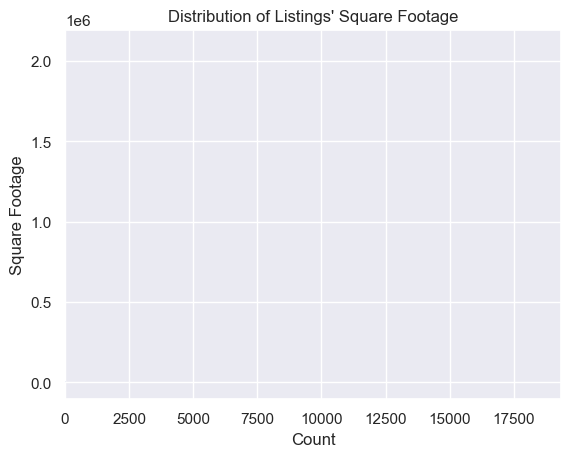

In [69]:
sns.histplot(data = GA_listings_crime_schools_merged, y = 'square_footage', log_scale = False)
plt.ylabel('Square Footage')
plt.title("Distribution of Listings' Square Footage")

Text(0.5, 1.0, "Distribution of Listings' Square Footage")

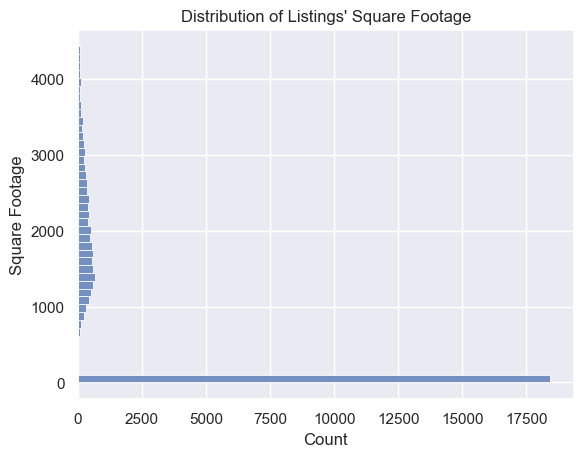

In [70]:
sns.histplot(data = GA_listings_crime_schools_merged.loc[GA_listings_crime_schools_merged['square_footage'] < outlier_maximum_level_square_footage, :], y = 'square_footage', log_scale = False)
plt.ylabel('Square Footage')
plt.title("Distribution of Listings' Square Footage")

Text(0.5, 1.0, "Distribution of Listings' Square Footage")

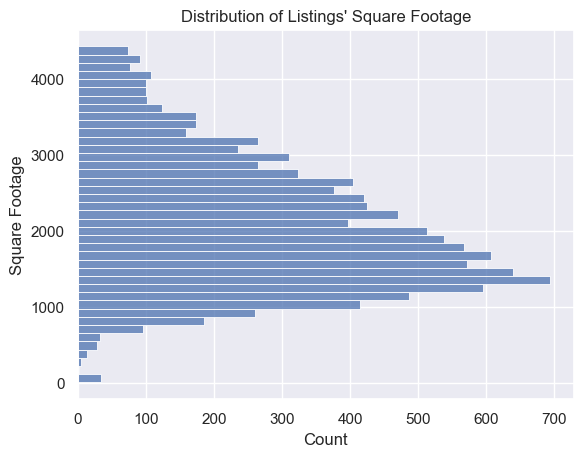

In [71]:
sns.histplot(data = GA_listings_crime_schools_merged.loc[(GA_listings_crime_schools_merged['square_footage'] < outlier_maximum_level_square_footage) & (GA_listings_crime_schools_merged['square_footage'] > 0), :], y = ('square_footage'))
plt.ylabel('Square Footage')
plt.title("Distribution of Listings' Square Footage")

In [72]:
print("Rows removed by Square Footage: " + str(GA_listings_crime_schools_merged.loc[GA_listings_crime_schools_merged['square_footage'] > outlier_maximum_level_square_footage, :].shape[0]))

Rows removed by Square Footage: 1160


In [73]:

GA_listings_crime_schools_merged_outliers = GA_listings_crime_schools_merged.loc[
    (GA_listings_crime_schools_merged['price'] < outlier_maximum_level_price) &
    (GA_listings_crime_schools_merged['square_footage'] < outlier_maximum_level_square_footage),
    :
]

Text(0.5, 1.0, 'Distribution of Listing Prices')

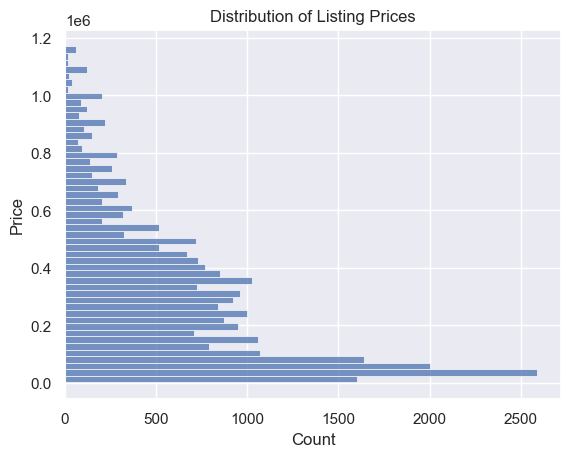

In [74]:
sns.histplot(data = GA_listings_crime_schools_merged_outliers, y = 'price', log_scale = False)
plt.ylabel('Price')
plt.title('Distribution of Listing Prices')

Skewness: 1.03
Kurtosis: 0.579


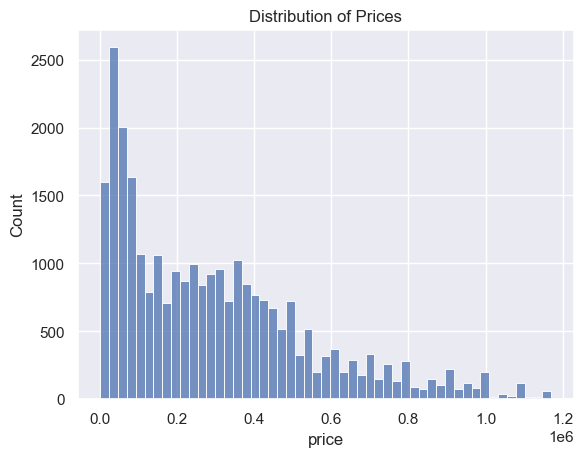

In [75]:

sns.histplot(data = GA_listings_crime_schools_merged_outliers, x = 'price')
plt.title('Distribution of Prices')

print('Skewness: ' + str(round(scipy.stats.skew(GA_listings_crime_schools_merged_outliers['price'], axis=0, bias=True),3)))
print('Kurtosis: ' + str(round(scipy.stats.kurtosis(GA_listings_crime_schools_merged_outliers['price'], axis=0, fisher=True, bias=True),3)))

# Skewness > 0 signifies more weight on the left tail of the distribution, so it is positively skewed.
# Kurtosis > 0 signifies it's a leptokurtic distribution, meaning there's a greater chance of extreme 
# positive or negative values




Skewness: -0.683
Kurtosis: -0.311


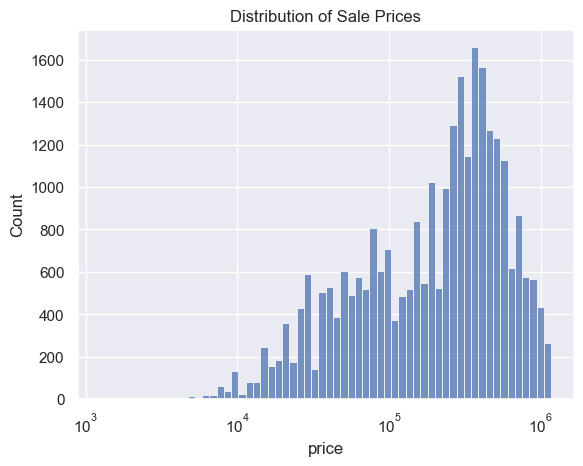

In [76]:

sns.histplot(data = GA_listings_crime_schools_merged_outliers, x = 'price', log_scale = True)
plt.title('Distribution of Sale Prices')

print('Skewness: ' + str(round(scipy.stats.skew(np.log10(GA_listings_crime_schools_merged_outliers['price']), axis=0, bias=True),3)))
print('Kurtosis: ' + str(round(scipy.stats.kurtosis(np.log10(GA_listings_crime_schools_merged_outliers['price']), axis=0, fisher=True, bias=True),3)))

# Skewness > 0 signifies more weight on the left tail of the distribution, so it is positively skewed.
# Kurtosis > 0 signifies it's a leptokurtic distribution, meaning there's a greater chance of extreme 
# positive or negative values
# Overall, both metrics were significantly reduce by getting the log of price


# Feature Reduction

In [77]:
GA_listings_crime_schools_merged_outliers_reduced = GA_listings_crime_schools_merged_outliers.drop(columns = ['home_index', 'full_street_address','details','census_state_name','census_county_name','census_state_abbr','census_zcta5_geoid','census_cbsa_geoid_count'])

GA_listings_crime_schools_merged_outliers_reduced.shape

(27980, 68)

# Multicolinearity


<Axes: >

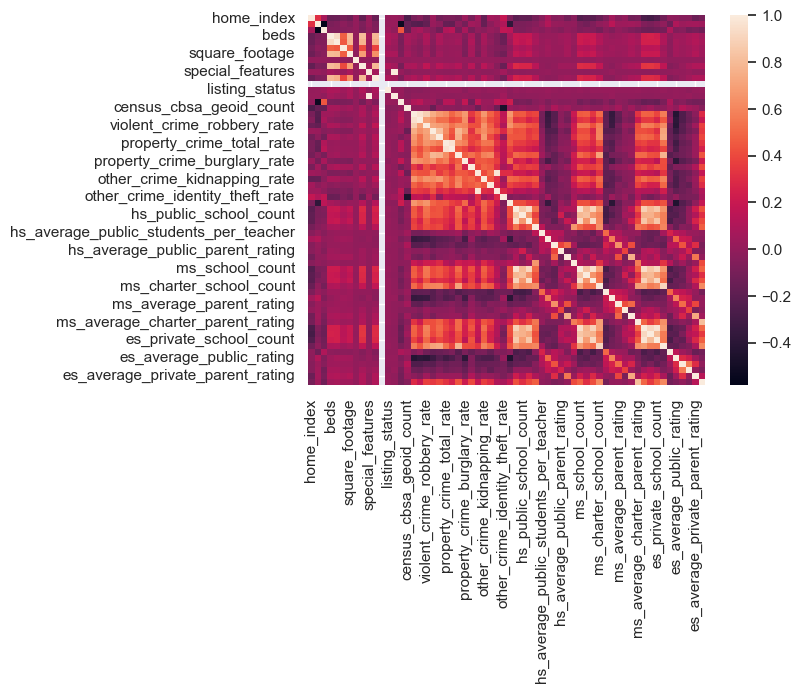

In [74]:
numerical_cols = []

for col in GA_listings_crime_schools_merged_outliers.drop(columns= 'price').columns:
    if str(GA_listings_crime_schools_merged_outliers[col].dtype) == 'float64' or str(GA_listings_crime_schools_merged_outliers[col].dtype) == 'int64':
        numerical_cols.append(col)


sns.heatmap(GA_listings_crime_schools_merged_outliers[numerical_cols].corr())

In [75]:
correlations = []
corr_threshold = 0.70

for i, col_x in enumerate(GA_listings_crime_schools_merged_outliers[numerical_cols].columns):
    for col_y in GA_listings_crime_schools_merged_outliers[numerical_cols].columns[i+1:]:
        correlation = GA_listings_crime_schools_merged_outliers[numerical_cols][col_x].corr(GA_listings_crime_schools_merged_outliers[numerical_cols][col_y])
        if abs(correlation) >= corr_threshold:
            correlations.append((col_x, col_y, correlation))
        
correlations

[('beds', 'baths_full', 0.9280667466355056),
 ('beds', 'square_footage', 0.7963723928905333),
 ('beds', 'year_built', 0.8054982890592769),
 ('beds', 'unit_count', 0.7908697738573598),
 ('baths_full', 'square_footage', 0.7870814881347453),
 ('baths_full', 'year_built', 0.7732037201641839),
 ('baths_full', 'unit_count', 0.7544151609480446),
 ('year_built', 'unit_count', 0.7928549651113116),
 ('special_features', 'listing_special_features', 1.0),
 ('violent_crime_total_rate',
  'violent_crime_assault_rate',
  0.9508539893141322),
 ('violent_crime_total_rate',
  'violent_crime_robbery_rate',
  0.8790733452872009),
 ('violent_crime_total_rate', 'violent_crime_rape_rate', 0.7463871661414462),
 ('violent_crime_robbery_rate', 'violent_crime_rape_rate', 0.7070803150906816),
 ('violent_crime_rape_rate', 'violent_crime_murder_rate', 0.8306781481584569),
 ('violent_crime_rape_rate',
  'property_crime_vehicle_theft_rate',
  0.785815198468307),
 ('violent_crime_rape_rate', 'es_harter_school_count', 

# Exploratory Data Analysis


Skewness: 1.03
Kurtosis: 0.579


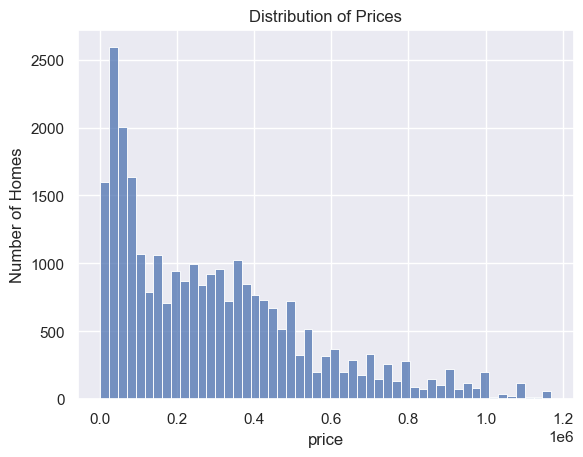

In [76]:

sns.histplot(data = GA_listings_crime_schools_merged_outliers, x = 'price')
plt.ylabel('Number of Homes')
plt.title('Distribution of Prices')

print('Skewness: ' + str(round(scipy.stats.skew(GA_listings_crime_schools_merged_outliers['price'], axis=0, bias=True),3)))
print('Kurtosis: ' + str(round(scipy.stats.kurtosis(GA_listings_crime_schools_merged_outliers['price'], axis=0, fisher=True, bias=True),3)))

# Skewness > 0 signifies more weight on the left tail of the distribution, so it is positively skewed.
# Kurtosis > 0 signifies it's a leptokurtic distribution, meaning there's a greater chance of extreme 
# positive or negative values

Skewness: -0.683
Kurtosis: -0.311


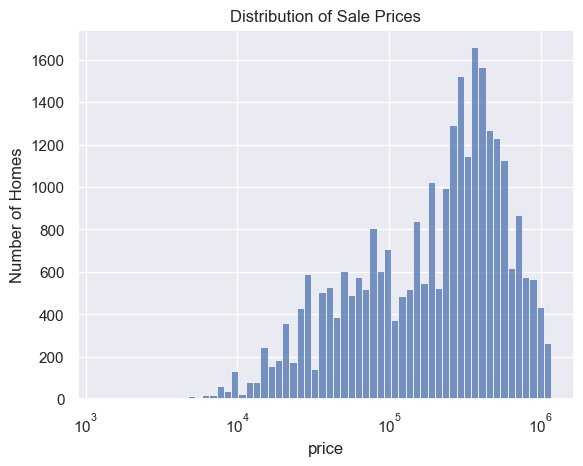

In [77]:

sns.histplot(data = GA_listings_crime_schools_merged_outliers, x = 'price', log_scale = True)
plt.ylabel('Number of Homes')
plt.title('Distribution of Sale Prices')

print('Skewness: ' + str(round(scipy.stats.skew(np.log10(GA_listings_crime_schools_merged_outliers['price']), axis=0, bias=True),3)))
print('Kurtosis: ' + str(round(scipy.stats.kurtosis(np.log10(GA_listings_crime_schools_merged_outliers['price']), axis=0, fisher=True, bias=True),3)))

# Skewness > 0 signifies more weight on the left tail of the distribution, so it is positively skewed.
# Kurtosis > 0 signifies it's a leptokurtic distribution, meaning there's a greater chance of extreme 
# positive or negative values
# Overall, both metrics were significantly reduce by getting the log of price


In [78]:
# Cycle through each column, fit an OLS model, and save the R2 value

import statsmodels.api as sm

rsquared_list = []
pvalue_list = []

for col in GA_listings_crime_schools_merged_outliers_reduced.drop(columns = ['price']).columns:
    temp_df = GA_listings_crime_schools_merged_outliers_reduced[[col]]
    if str(GA_listings_crime_schools_merged_outliers_reduced[col].dtype) == 'object':
        temp_df = pd.get_dummies(temp_df, columns=[col], drop_first=True)
        temp_df = temp_df.replace({False: 0, True: 1})
        
    temp_df = sm.add_constant(temp_df)
    model = sm.OLS(GA_listings_crime_schools_merged_outliers_reduced['price'], temp_df).fit()
    rsquared_list.append((col, model.rsquared))  
    pvalue_list.append((col, model.f_pvalue))
    
sorted_rsquared_list = sorted(rsquared_list, key=lambda x: x[1],reverse= True)
sorted_pvalue_list = sorted(pvalue_list, key=lambda x: x[1],reverse= False)

# Create column list for top x% of R2 values

top_percent = 0.25
top_rsquared_list = []

for i in list(range(round(top_percent * len(sorted_rsquared_list)))):
    top_rsquared_list.append(sorted_rsquared_list[i][0])

top_rsquared_list

['zip',
 'baths_full',
 'city',
 'property_type',
 'square_footage',
 'year_built',
 'beds',
 'county_name',
 'unit_count',
 'baths_half',
 'other_crime_grade',
 'overall_crime_grade',
 'violent_crime_grade',
 'es_private_school_count',
 'ms_private_school_count',
 'es_school_count',
 'hs_private_school_count']

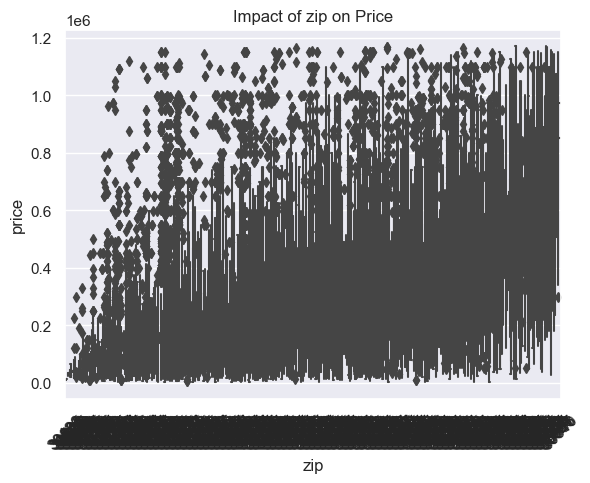

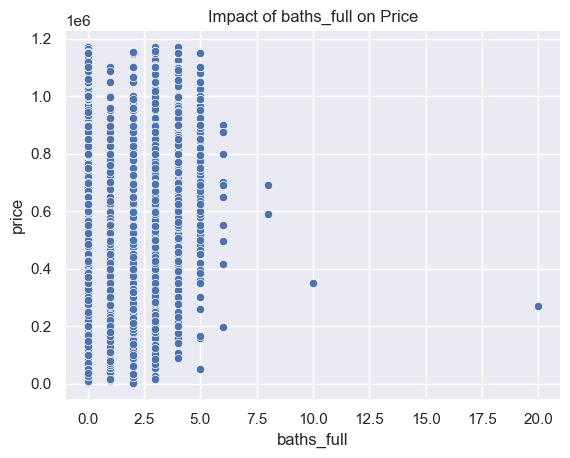

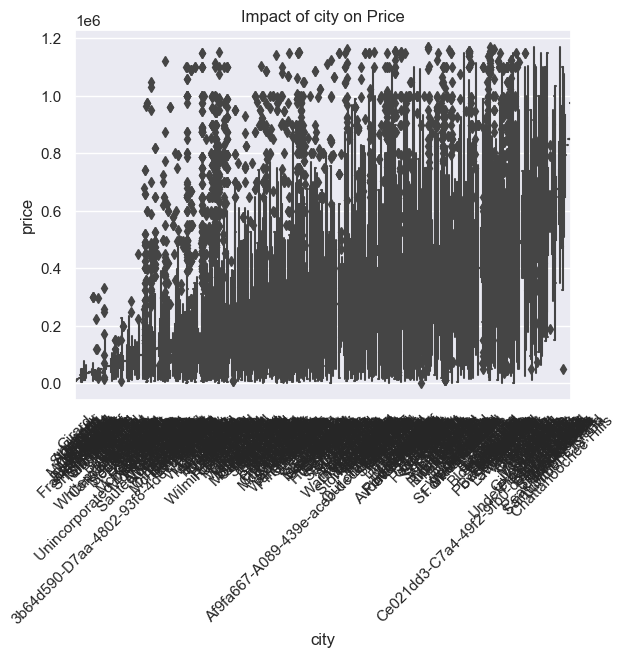

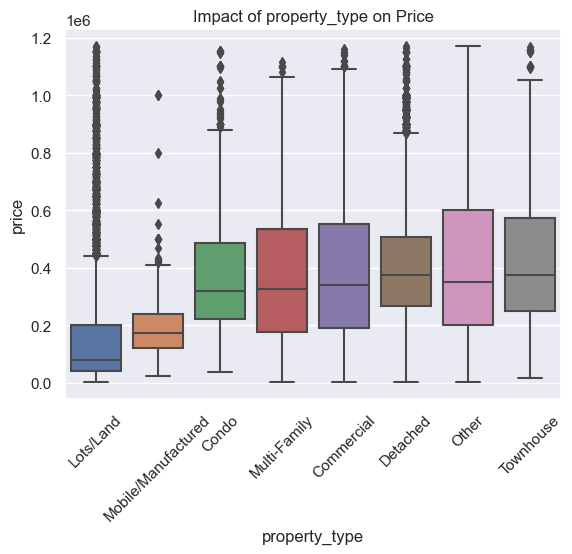

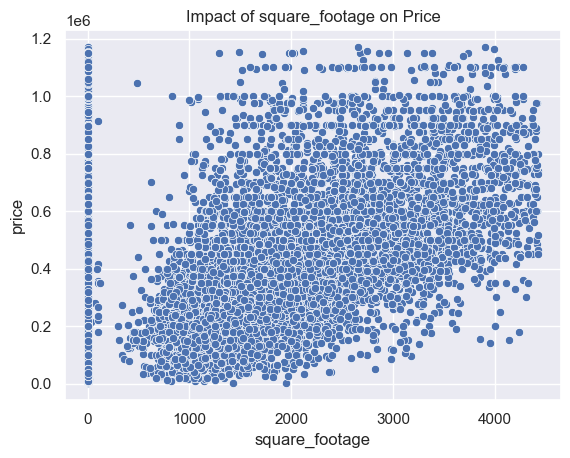

...

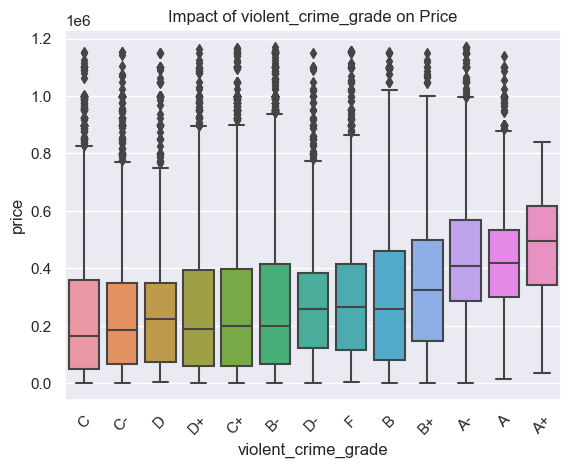

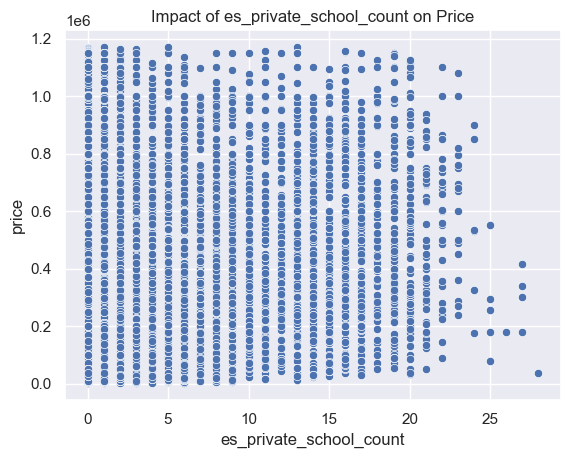

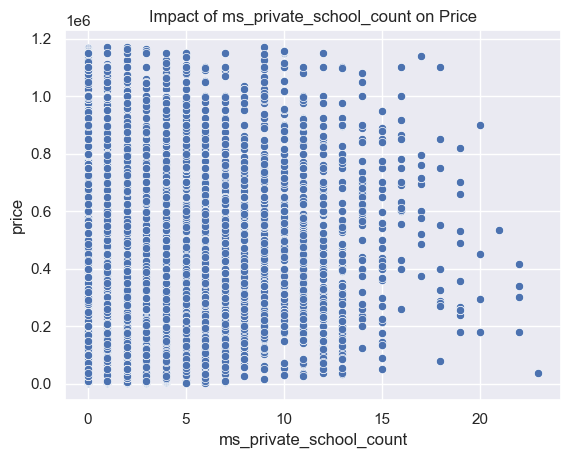

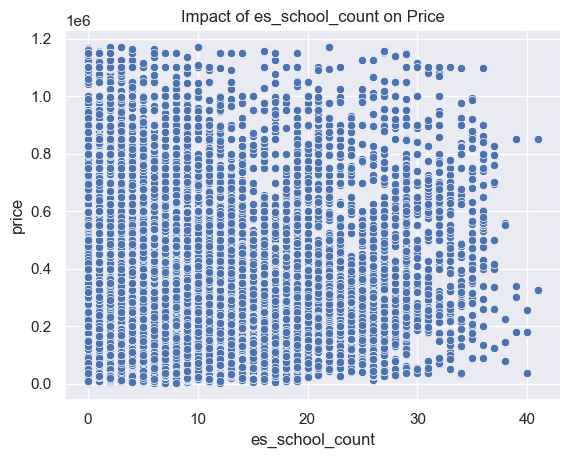

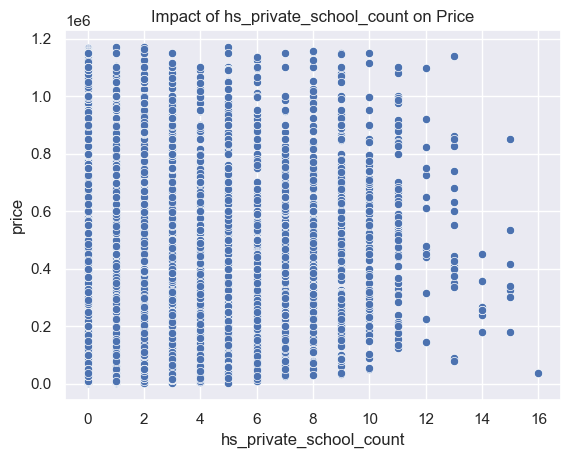

In [79]:
# Looping through top_rsquared_list and creating boxplots for categorical variables and 
# scatterplots for numerical variables

for col in top_rsquared_list:
    if GA_listings_crime_schools_merged_outliers_reduced[col].dtype == 'object':
        temp_df = GA_listings_crime_schools_merged_outliers_reduced.loc[:, [col,'price']]
        sorted_categories = temp_df.groupby(col)['price'].mean().sort_values().index
        temp_df[col] = pd.Categorical(temp_df[col], categories=sorted_categories, ordered=True)
        temp_df_sorted = temp_df.sort_values(by=col)
        plot = sns.boxplot(data = temp_df_sorted, x = col, y = 'price' )
        plot.set_xticklabels(plot.get_xticklabels(), rotation=45)
        plt.title('Impact of ' + col + ' on Price')
        plt.show()
        
    elif GA_listings_crime_schools_merged_outliers_reduced[col].dtype in ['int64', 'float64']:
        temp_df = GA_listings_crime_schools_merged_outliers.loc[:, [col,'price']]
        sns.scatterplot(data = temp_df, x = col, y = 'price' )
        plt.title('Impact of ' + col + ' on Price')
        plt.show()

# Separation of Response and Features


In [78]:
# Create features and response columns for modeling

features_outliers = GA_listings_crime_schools_merged_outliers_reduced.drop(columns = 'price')

response_outliers = GA_listings_crime_schools_merged_outliers_reduced['price']

In [79]:
# Create a no zip code feature dataframe
features_outliers_nozip = features_outliers.drop(columns = 'zip')

# Dummification for Linear Model

In [80]:
#Dummification of Categorical Features

cat_features_outliers = features_outliers.select_dtypes(include=['object'])
cat_features_outliers = pd.get_dummies(data = cat_features_outliers, drop_first = True)
cat_features_outliers = cat_features_outliers.replace({False: 0, True: 1})

# Separating numerical features from dataframe 

num_features_outliers = features_outliers.select_dtypes(include=['int64', 'float64'])
num_features_outliers.shape

# Concatenating dummified categorical features with numerical features

features_outliers_dum_drop = pd.concat([cat_features_outliers, num_features_outliers],axis = 1)
features_outliers_dum_drop.shape

(27980, 1408)

In [81]:
#Dummification of Categorical Features for No Zip Dataframe

cat_features_outliers_nozip = features_outliers_nozip.select_dtypes(include=['object'])
cat_features_outliers_nozip = pd.get_dummies(data = cat_features_outliers_nozip, drop_first = True)
cat_features_outliers_nozip = cat_features_outliers_nozip.replace({False: 0, True: 1})

# Separating numerical features from dataframe 

num_features_outliers_nozip = features_outliers_nozip.select_dtypes(include=['int64', 'float64'])
num_features_outliers_nozip.shape

# Concatenating dummified categorical features with numerical features

features_outliers_dum_drop_nozip = pd.concat([cat_features_outliers_nozip, num_features_outliers_nozip],axis = 1)
features_outliers_dum_drop_nozip.shape

(27980, 824)

In [82]:
features_outliers_dum_drop.head()

,city_Abbeville,city_Acworth,city_Adairsville,city_Adrian,city_Af9fa667-A089-439e-aceb-dece9bbc6457,city_Alamo,city_Alanta,city_Albany,city_Allenhurst,city_Alma,city_Alpharetta,city_Alto,city_Americus,city_Appling,city_Arabi,city_Aragon,city_Arcade,city_Arlington,city_Armuchee,city_Arnoldsville,city_Ashburn,city_Athens,city_Atlanta,city_Attapulgus,city_Auburn,city_Augusta,city_Austell,city_Avalon,city_Avera,city_Avondale Estates,city_Baconton,city_Bainbridge,city_Baldwin,city_Ball Ground,city_Ballground,city_Barnesville,city_Bartow,city_Baxley,city_Berkeley Lake,city_Bethlehem,city_Big Canoe,city_Bishop,city_Blackshear,city_Blairesville,city_Blairsville,city_Blakely,city_Blalirsville,city_Bloomingdale,city_Blue Ridge,city_Bogart,city_Bonaire,city_Bowdon,city_Bowersville,city_Bowman,city_Box Springs,city_Braselton,city_Braswell,city_Bremen,city_Bridgeboro,city_Brookhaven,city_Brooklet,city_Brooks,city_Brunswick,city_Buchanan,city_Buckhead,city_Buena Vista,city_Buford,city_Butler,city_Byron,city_Cadwell,city_Cairo,city_Calhoun,city_Camilla,city_Candall,city_Candler-McAfee,city_Canon,city_Canton,city_Carlton,city_Carnesville,city_Carrollton,city_Cartersville,city_Cataula,city_Cave Spring,city_Ce021dd3-C7a4-49f2-9fb0-d06df67b6323,city_Cedartown,city_Centerville,city_Chamblee,city_Chatsworth,city_Chatt Hills,city_Chattahoochee Hills,city_Cherry Log,city_Chester,city_Chickamauga,city_Chula,city_Clarkesville,city_Clarkston,city_Clarksville,city_Claxton,city_Clayton,city_Clermont,city_Cleveland,city_Clevleand,city_Clevlen,city_Cliftondale,city_Cloudland,city_Clyo,city_Cobb,city_Cobbtown,city_Cochran,city_Cohutta,city_Colbert,city_Coleman,city_College Park,city_Columbus,city_Comer,city_Commerce,city_Concord,city_Conley,city_Conyers,city_Cordele,city_Cornelia,city_Covington,city_Crandall,city_Crawford,city_Crawfordville,city_Culloden,city_Cumming,city_Cusseta,city_Dacula,city_Dahlonega,city_Dallas,city_Dalton,city_Damascus,city_Danielsville,city_Danville,city_Darien,city_Davisboro,city_Dawson,city_Dawsonville,city_Decatur,city_Dekalb,city_Demorest,city_Dewy Rose,city_Dexter,city_Dillard,city_Dock Junction,city_Doraville,city_Douglas,city_Douglasville,city_Dry Branch,city_Dublin,city_Dudley,city_Duluth,city_Dunwoody,city_East Baldwin,city_East Dublin,city_East Ellijay,city_East Point,city_Eastanollee,city_Eastman,city_Eatonton,city_Elberton,city_Elko,city_Ellabell,city_Ellaville,city_Ellenwood,city_Ellerslie,city_Elliajy,city_Ellijay,city_Emerson,city_Epworth,city_Euharlee,city_Evans,city_Experiment,city_Fairburn,city_Fairmount,city_Farmington,city_Fayetteville,city_Fitzgerald,city_Flintstone,city_Flovilla,city_Flowery Br,city_Flowery Branch,city_Folkston,city_Forest Park,city_Forsyth,city_Fort Gaines,city_Fort Oglethorpe,city_Fort Valley,city_Fortson,city_Forysth,city_Franklin,city_Franklin Springs,city_Gainesville,city_Garden City,city_Garfield,city_Gay,city_Georgetown,city_Gibson,city_Gillem Enclave,city_Gillsville,city_Girard,city_Glennville,city_Good Hope,city_Gordon,city_Grantville,city_Gray,city_Grayson,city_Greensboro,city_Greenville,city_Griffin,city_Grovetown,city_Gumbranch,city_Gumlog,city_Guyton,city_Haddock,city_Hagan,city_Hahira,city_Hamilton,city_Hampton,city_Hapeville,city_Harlem,city_Harrison,city_Hartsfield,city_Hartwell,city_Hawkinsville,city_Hazlehurst,city_Helen,city_Helena,city_Hephzibah,city_Hiawassee,city_Hillsboro,city_Hinesville,city_Hiram,city_Hoboken,city_Hogansville,city_Holly Springs,city_Homer,city_Homerville,city_Hortense,city_Hoschton,city_Huber,city_Hull,city_Ideal,city_Irondale,city_Irwinton,city_Jackson,city_Jasper,city_Jefferson,city_Jeffersonville,city_Jenkinsburg,city_Jesup,city_Johns Creek,city_Jonesboro,city_Juliette,city_Junction City,city_Juniper,city_Kathleen,city_Kennesaw,city_Kingsland,city_Kingston,city_Kite,city_La Fayette,city_La Grange,city_Lafayette,city_Lagrange,city_Lake Park,city_Lakeland,city_Lakemont,city_Laurens,city_Lavonia,city_Lawrenceville,city_Leesburg,city_Lexington,city_Lilb

In [83]:
features_outliers_dum_drop_nozip.head()

,city_Abbeville,city_Acworth,city_Adairsville,city_Adrian,city_Af9fa667-A089-439e-aceb-dece9bbc6457,city_Alamo,city_Alanta,city_Albany,city_Allenhurst,city_Alma,city_Alpharetta,city_Alto,city_Americus,city_Appling,city_Arabi,city_Aragon,city_Arcade,city_Arlington,city_Armuchee,city_Arnoldsville,city_Ashburn,city_Athens,city_Atlanta,city_Attapulgus,city_Auburn,city_Augusta,city_Austell,city_Avalon,city_Avera,city_Avondale Estates,city_Baconton,city_Bainbridge,city_Baldwin,city_Ball Ground,city_Ballground,city_Barnesville,city_Bartow,city_Baxley,city_Berkeley Lake,city_Bethlehem,city_Big Canoe,city_Bishop,city_Blackshear,city_Blairesville,city_Blairsville,city_Blakely,city_Blalirsville,city_Bloomingdale,city_Blue Ridge,city_Bogart,city_Bonaire,city_Bowdon,city_Bowersville,city_Bowman,city_Box Springs,city_Braselton,city_Braswell,city_Bremen,city_Bridgeboro,city_Brookhaven,city_Brooklet,city_Brooks,city_Brunswick,city_Buchanan,city_Buckhead,city_Buena Vista,city_Buford,city_Butler,city_Byron,city_Cadwell,city_Cairo,city_Calhoun,city_Camilla,city_Candall,city_Candler-McAfee,city_Canon,city_Canton,city_Carlton,city_Carnesville,city_Carrollton,city_Cartersville,city_Cataula,city_Cave Spring,city_Ce021dd3-C7a4-49f2-9fb0-d06df67b6323,city_Cedartown,city_Centerville,city_Chamblee,city_Chatsworth,city_Chatt Hills,city_Chattahoochee Hills,city_Cherry Log,city_Chester,city_Chickamauga,city_Chula,city_Clarkesville,city_Clarkston,city_Clarksville,city_Claxton,city_Clayton,city_Clermont,city_Cleveland,city_Clevleand,city_Clevlen,city_Cliftondale,city_Cloudland,city_Clyo,city_Cobb,city_Cobbtown,city_Cochran,city_Cohutta,city_Colbert,city_Coleman,city_College Park,city_Columbus,city_Comer,city_Commerce,city_Concord,city_Conley,city_Conyers,city_Cordele,city_Cornelia,city_Covington,city_Crandall,city_Crawford,city_Crawfordville,city_Culloden,city_Cumming,city_Cusseta,city_Dacula,city_Dahlonega,city_Dallas,city_Dalton,city_Damascus,city_Danielsville,city_Danville,city_Darien,city_Davisboro,city_Dawson,city_Dawsonville,city_Decatur,city_Dekalb,city_Demorest,city_Dewy Rose,city_Dexter,city_Dillard,city_Dock Junction,city_Doraville,city_Douglas,city_Douglasville,city_Dry Branch,city_Dublin,city_Dudley,city_Duluth,city_Dunwoody,city_East Baldwin,city_East Dublin,city_East Ellijay,city_East Point,city_Eastanollee,city_Eastman,city_Eatonton,city_Elberton,city_Elko,city_Ellabell,city_Ellaville,city_Ellenwood,city_Ellerslie,city_Elliajy,city_Ellijay,city_Emerson,city_Epworth,city_Euharlee,city_Evans,city_Experiment,city_Fairburn,city_Fairmount,city_Farmington,city_Fayetteville,city_Fitzgerald,city_Flintstone,city_Flovilla,city_Flowery Br,city_Flowery Branch,city_Folkston,city_Forest Park,city_Forsyth,city_Fort Gaines,city_Fort Oglethorpe,city_Fort Valley,city_Fortson,city_Forysth,city_Franklin,city_Franklin Springs,city_Gainesville,city_Garden City,city_Garfield,city_Gay,city_Georgetown,city_Gibson,city_Gillem Enclave,city_Gillsville,city_Girard,city_Glennville,city_Good Hope,city_Gordon,city_Grantville,city_Gray,city_Grayson,city_Greensboro,city_Greenville,city_Griffin,city_Grovetown,city_Gumbranch,city_Gumlog,city_Guyton,city_Haddock,city_Hagan,city_Hahira,city_Hamilton,city_Hampton,city_Hapeville,city_Harlem,city_Harrison,city_Hartsfield,city_Hartwell,city_Hawkinsville,city_Hazlehurst,city_Helen,city_Helena,city_Hephzibah,city_Hiawassee,city_Hillsboro,city_Hinesville,city_Hiram,city_Hoboken,city_Hogansville,city_Holly Springs,city_Homer,city_Homerville,city_Hortense,city_Hoschton,city_Huber,city_Hull,city_Ideal,city_Irondale,city_Irwinton,city_Jackson,city_Jasper,city_Jefferson,city_Jeffersonville,city_Jenkinsburg,city_Jesup,city_Johns Creek,city_Jonesboro,city_Juliette,city_Junction City,city_Juniper,city_Kathleen,city_Kennesaw,city_Kingsland,city_Kingston,city_Kite,city_La Fayette,city_La Grange,city_Lafayette,city_Lagrange,city_Lake Park,city_Lakeland,city_Lakemont,city_Laurens,city_Lavonia,city_Lawrenceville,city_Leesburg,city_Lexington,city_Lilb

# LabelEncoding and OrdinalEncoding

In [84]:
features_outliers.select_dtypes(include=['object']).head()

,city,county_name,zip,property_type,overall_crime_grade,violent_crime_grade,property_crime_grade,other_crime_grade
0,Quitman,Brooks-County,31643,Lots/Land,D-,D,D-,D+
1,Quitman,Brooks-County,31643,Detached,D-,D,D-,D+
2,Woodbine,Camden-County,31569,Detached,D+,C+,D-,B+
3,Kingsland,Camden-County,31548,Townhouse,B-,C-,C+,B+
4,Kingsland,Camden-County,31548,Detached,B-,C-,C+,B+


In [85]:
features_outliers_encoded = features_outliers.copy()
features_outliers_encoded_nozip = features_outliers_nozip.copy()

In [86]:
# OrdinalEncoding for crime grades

from sklearn.preprocessing import OrdinalEncoder

grade_order = [['F', 'D-', 'D', 'D+', 'C-', 'C', 'C+', 'B-', 'B', 'B+', 'A-', 'A', 'A+'],
              ['F', 'D-', 'D', 'D+', 'C-', 'C', 'C+', 'B-', 'B', 'B+', 'A-', 'A', 'A+'],
              ['F', 'D-', 'D', 'D+', 'C-', 'C', 'C+', 'B-', 'B', 'B+', 'A-', 'A', 'A+'],
              ['F', 'D-', 'D', 'D+', 'C-', 'C', 'C+', 'B-', 'B', 'B+', 'A-', 'A', 'A+']]

grades_ord_enc = OrdinalEncoder(categories= grade_order)

features_outliers_encoded[['overall_crime_grade', 'violent_crime_grade', 'property_crime_grade', 'other_crime_grade']] = grades_ord_enc.fit_transform(features_outliers_encoded[['overall_crime_grade', 'violent_crime_grade', 'property_crime_grade', 'other_crime_grade']])
features_outliers_encoded_nozip[['overall_crime_grade', 'violent_crime_grade', 'property_crime_grade', 'other_crime_grade']] = grades_ord_enc.fit_transform(features_outliers_encoded_nozip[['overall_crime_grade', 'violent_crime_grade', 'property_crime_grade', 'other_crime_grade']])

In [87]:
features_outliers_encoded[['overall_crime_grade', 'violent_crime_grade', 'property_crime_grade', 'other_crime_grade']].head()

,overall_crime_grade,violent_crime_grade,property_crime_grade,other_crime_grade
0,1.0,2.0,1.0,3.0
1,1.0,2.0,1.0,3.0
2,3.0,6.0,1.0,9.0
3,7.0,4.0,6.0,9.0
4,7.0,4.0,6.0,9.0


In [88]:
# LabelEncoding remaining categorical variables

from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

nominal_columns = ['city','county_name', 'property_type']

for col in nominal_columns:
    features_outliers_encoded[col] = le.fit_transform(features_outliers_encoded[col])
    features_outliers_encoded_nozip[col] = le.fit_transform(features_outliers_encoded_nozip[col])



In [89]:
print(features_outliers_encoded.shape)
print(features_outliers_encoded_nozip.shape)


(27980, 67)
(27980, 66)


In [90]:
features_outliers_encoded.head()

,latitude,longitude,city,county_name,beds,baths_full,baths_half,square_footage,lot_size,year_built,special_features,unit_count,transaction_type,listing_status,listing_special_features,zip,property_type,overall_crime_grade,violent_crime_grade,violent_crime_total_rate,violent_crime_assault_rate,violent_crime_robbery_rate,violent_crime_rape_rate,violent_crime_murder_rate,property_crime_grade,property_crime_total_rate,property_crime_theft_rate,property_crime_vehicle_theft_rate,property_crime_burglary_rate,property_crime_arson_rate,other_crime_grade,other_crime_total_rate,other_crime_kidnapping_rate,other_crime_drug_crimes_rate,other_crime_vandalism_rate,other_crime_identity_theft_rate,other_crime_animal_cruelty_rate,hs_school_count,hs_public_school_count,hs_private_school_count,hs_charter_school_count,hs_average_public_students_per_teacher,hs_average_public_rating,hs_average_parent_rating,hs_average_public_parent_rating,hs_average_private_parent_rating,hs_average_charter_parent_rating,ms_school_count,ms_public_school_count,ms_private_school_count,ms_charter_school_count,ms_average_public_students_per_teacher,ms_average_public_rating,ms_average_parent_rating,ms_average_public_parent_rating,ms_average_private_parent_rating,ms_average_charter_parent_rating,es_school_count,es_public_school_count,es_private_school_count,es_harter_school_count,es_average_public_students_per_teacher,es_average_public_rating,es_average_parent_rating,es_average_public_parent_rating,es_average_private_parent_rating,es_average_charter_parent_rating
0,30.725605,-83.671772,388,13,0.0,0.0,0.0,0.0,4.93,0.0,0,0.0,1,0,0,31643,3,1.0,2.0,4.708,3.334,1.0670,0.2660,0.0411,1.0,38.96,28.720,1.422,8.751,0.0656,3.0,14.060,0.1256,1.8120,11.280,0.7543,0.0842,0,0,0,0,15.955085,5.234779,2.657919,2.293245,1.708425,0.301406,0,0,0,0,14.683154,5.436526,2.682301,2.257071,1.78669,0.628315,0,0,0,0,14.462740,5.390942,2.95628,3.299,1.554568,0.527959
1,30.781796,-83.558475,388,13,3.0,1.0,0.0,1460.0,0.00,1910.0,0,1.0,1,1,0,31643,2,1.0,2.0,4.708,3.334,1.0670,0.2660,0.0411,1.0,38.96,28.720,1.422,8.751,0.0656,3.0,14.060,0.1256,1.8120,11.280,0.7543,0.0842,2,2,0,0,19.500000,2.500000,2.000000,2.000000,0.000000,0.000000,2,2,0,0,18.500000,2.000000,1.500000,1.500000,0.00000,0.000000,3,1,2,0,14.000000,1.000000,3.00000,4.000,2.500000,0.000000
2,30.864096,-81.622765,547,19,3.0,2.0,0.0,1254.0,0.00,1985.0,0,1.0,1,1,0,31569,2,3.0,6.0,2.600,1.778,0.5553,0.2425,0.0247,1.0,32.39,26.210,1.025,5.105,0.0454,9.0,5.921,0.0802,1.9190,2.944,0.9281,0.0502,0,0,0,0,15.955085,5.234779,2.657919,2.293245,1.708425,0.301406,0,0,0,0,14.683154,5.436526,2.682301,2.257071,1.78669,0.628315,0,0,0,0,14.462740,5.390942,2.95628,3.299,1.554568,0.527959
3,30.796300,-81.681675,260,19,2.0,2.0,0.0,1016.0,0.00,2005.0,0,1.0,1,1,0,31548,7,7.0,4.0,3.523,2.798,0.4458,0.2418,0.0372,6.0,14.37,9.055,1.113,4.111,0.0887,9.0,6.365,0.0730,0.6743,4.642,0.9703,0.0057,2,0,2,0,15.955085,5.234779,2.500000,0.000000,2.500000,0.000000,3,1,2,0,16.000000,6.000000,2.666667,3.000000,2.50000,0.000000,6,3,3,0,16.666667,7.333333,3.00000,4.000,2.000000,0.000000
4,30.762972,-81.660240,260,19,3.0,2.0,0.0,1618.0,0.00,1986.0,0,1.0,1,1,0,31548,2,7.0,4.0,3.523,2.798,0.4458,0.2418,0.0372,6.0,14.37,9.055,1.113,4.111,0.0887,9.0,6.365,0.0730,0.6743,4.642,0.9703,0.0057,0,0,0,0,15.955085,5.234779,2.657919,2.293245,1.708425,0.301406,1,1,0,0,16.000000,6.000000,3.000000,3.000000,0.00000,0.000000,2,2,0,0,16.500000,7.500000,4.00000,4.000,0.000000,0.000000


In [91]:
features_outliers_encoded_nozip.head()

,latitude,longitude,city,county_name,beds,baths_full,baths_half,square_footage,lot_size,year_built,special_features,unit_count,transaction_type,listing_status,listing_special_features,property_type,overall_crime_grade,violent_crime_grade,violent_crime_total_rate,violent_crime_assault_rate,violent_crime_robbery_rate,violent_crime_rape_rate,violent_crime_murder_rate,property_crime_grade,property_crime_total_rate,property_crime_theft_rate,property_crime_vehicle_theft_rate,property_crime_burglary_rate,property_crime_arson_rate,other_crime_grade,other_crime_total_rate,other_crime_kidnapping_rate,other_crime_drug_crimes_rate,other_crime_vandalism_rate,other_crime_identity_theft_rate,other_crime_animal_cruelty_rate,hs_school_count,hs_public_school_count,hs_private_school_count,hs_charter_school_count,hs_average_public_students_per_teacher,hs_average_public_rating,hs_average_parent_rating,hs_average_public_parent_rating,hs_average_private_parent_rating,hs_average_charter_parent_rating,ms_school_count,ms_public_school_count,ms_private_school_count,ms_charter_school_count,ms_average_public_students_per_teacher,ms_average_public_rating,ms_average_parent_rating,ms_average_public_parent_rating,ms_average_private_parent_rating,ms_average_charter_parent_rating,es_school_count,es_public_school_count,es_private_school_count,es_harter_school_count,es_average_public_students_per_teacher,es_average_public_rating,es_average_parent_rating,es_average_public_parent_rating,es_average_private_parent_rating,es_average_charter_parent_rating
0,30.725605,-83.671772,388,13,0.0,0.0,0.0,0.0,4.93,0.0,0,0.0,1,0,0,3,1.0,2.0,4.708,3.334,1.0670,0.2660,0.0411,1.0,38.96,28.720,1.422,8.751,0.0656,3.0,14.060,0.1256,1.8120,11.280,0.7543,0.0842,0,0,0,0,15.955085,5.234779,2.657919,2.293245,1.708425,0.301406,0,0,0,0,14.683154,5.436526,2.682301,2.257071,1.78669,0.628315,0,0,0,0,14.462740,5.390942,2.95628,3.299,1.554568,0.527959
1,30.781796,-83.558475,388,13,3.0,1.0,0.0,1460.0,0.00,1910.0,0,1.0,1,1,0,2,1.0,2.0,4.708,3.334,1.0670,0.2660,0.0411,1.0,38.96,28.720,1.422,8.751,0.0656,3.0,14.060,0.1256,1.8120,11.280,0.7543,0.0842,2,2,0,0,19.500000,2.500000,2.000000,2.000000,0.000000,0.000000,2,2,0,0,18.500000,2.000000,1.500000,1.500000,0.00000,0.000000,3,1,2,0,14.000000,1.000000,3.00000,4.000,2.500000,0.000000
2,30.864096,-81.622765,547,19,3.0,2.0,0.0,1254.0,0.00,1985.0,0,1.0,1,1,0,2,3.0,6.0,2.600,1.778,0.5553,0.2425,0.0247,1.0,32.39,26.210,1.025,5.105,0.0454,9.0,5.921,0.0802,1.9190,2.944,0.9281,0.0502,0,0,0,0,15.955085,5.234779,2.657919,2.293245,1.708425,0.301406,0,0,0,0,14.683154,5.436526,2.682301,2.257071,1.78669,0.628315,0,0,0,0,14.462740,5.390942,2.95628,3.299,1.554568,0.527959
3,30.796300,-81.681675,260,19,2.0,2.0,0.0,1016.0,0.00,2005.0,0,1.0,1,1,0,7,7.0,4.0,3.523,2.798,0.4458,0.2418,0.0372,6.0,14.37,9.055,1.113,4.111,0.0887,9.0,6.365,0.0730,0.6743,4.642,0.9703,0.0057,2,0,2,0,15.955085,5.234779,2.500000,0.000000,2.500000,0.000000,3,1,2,0,16.000000,6.000000,2.666667,3.000000,2.50000,0.000000,6,3,3,0,16.666667,7.333333,3.00000,4.000,2.000000,0.000000
4,30.762972,-81.660240,260,19,3.0,2.0,0.0,1618.0,0.00,1986.0,0,1.0,1,1,0,2,7.0,4.0,3.523,2.798,0.4458,0.2418,0.0372,6.0,14.37,9.055,1.113,4.111,0.0887,9.0,6.365,0.0730,0.6743,4.642,0.9703,0.0057,0,0,0,0,15.955085,5.234779,2.657919,2.293245,1.708425,0.301406,1,1,0,0,16.000000,6.000000,3.000000,3.000000,0.00000,0.000000,2,2,0,0,16.500000,7.500000,4.00000,4.000,0.000000,0.000000


# Train-Test-Split

In [92]:
# Train_test_split: test dataset is 20% of original dataframe, random_state turned on to ensure reproducibility

from sklearn.model_selection import train_test_split

X_train_outliers, X_test_outliers, y_train_outliers, y_test_outliers = train_test_split(features_outliers, response_outliers, test_size=0.2, random_state=0)
X_train_outliers_drop, X_test_outliers_drop, y_train_outliers_drop, y_test_outliers_drop = train_test_split(features_outliers_dum_drop, response_outliers, test_size=0.2, random_state=0)
X_train_outliers_encoded, X_test_outliers_encoded, y_train_outliers_encoded, y_test_outliers_encoded = train_test_split(features_outliers_encoded, response_outliers, test_size=0.2, random_state=0)


X_train_outliers_nozip, X_test_outliers_nozip, y_train_outliers_nozip, y_test_outliers_nozip = train_test_split(features_outliers_nozip, response_outliers, test_size=0.2, random_state=0)
X_train_outliers_drop_nozip, X_test_outliers_drop_nozip, y_train_outliers_drop_nozip, y_test_outliers_drop_nozip = train_test_split(features_outliers_dum_drop_nozip, response_outliers, test_size=0.2, random_state=0)
X_train_outliers_encoded_nozip, X_test_outliers_encoded_nozip, y_train_outliers_encoded_nozip, y_test_outliers_encoded_nozip = train_test_split(features_outliers_encoded_nozip, response_outliers, test_size=0.2, random_state=0)


# StandardScaler for Features_Encoded


In [93]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

features_outliers_encoded_scaled = scaler.fit_transform(features_outliers_encoded)
features_outliers_encoded_scaled = pd.DataFrame(data=features_outliers_encoded_scaled, columns=features_outliers_encoded.columns)

features_outliers_encoded_scaled_nozip = scaler.fit_transform(features_outliers_encoded_nozip)
features_outliers_encoded_scaled_nozip = pd.DataFrame(data=features_outliers_encoded_scaled_nozip, columns=features_outliers_encoded_nozip.columns)


# StandardScaler for Linear Models

In [94]:

scaler = StandardScaler()

X_train_outliers_drop_scaled = scaler.fit_transform(X_train_outliers_drop)
X_train_outliers_drop_scaled = pd.DataFrame(data=X_train_outliers_drop_scaled, columns=X_train_outliers_drop.columns)

X_test_outliers_drop_scaled = scaler.transform(X_test_outliers_drop)
X_test_outliers_drop_scaled = pd.DataFrame(data=X_test_outliers_drop_scaled, columns=X_test_outliers_drop.columns)


y_train_outliers_drop_scaled = y_train_outliers_drop.copy()
y_test_outliers_drop_scaled = y_test_outliers_drop.copy()


# No zip dataframes

X_train_outliers_drop_scaled_nozip = scaler.fit_transform(X_train_outliers_drop_nozip)
X_train_outliers_drop_scaled_nozip = pd.DataFrame(data=X_train_outliers_drop_scaled_nozip, columns=X_train_outliers_drop_nozip.columns)

X_test_outliers_drop_scaled_nozip = scaler.transform(X_test_outliers_drop_nozip)
X_test_outliers_drop_scaled_nozip = pd.DataFrame(data=X_test_outliers_drop_scaled_nozip, columns=X_test_outliers_drop_nozip.columns)


y_train_outliers_drop_scaled_nozip = y_train_outliers_drop_nozip.copy()
y_test_outliers_drop_scaled_nozip = y_test_outliers_drop_nozip.copy()


# StandardScaler for PyTorch Models

In [95]:

scaler = StandardScaler()

X_train_outliers_encoded_scaled = scaler.fit_transform(X_train_outliers_encoded)
X_train_outliers_encoded_scaled = pd.DataFrame(data=X_train_outliers_encoded_scaled, columns=X_train_outliers_encoded.columns)

X_test_outliers_encoded_scaled = scaler.transform(X_test_outliers_encoded)
X_test_outliers_encoded_scaled = pd.DataFrame(data=X_test_outliers_encoded_scaled, columns=X_test_outliers_encoded.columns)


y_train_outliers_encoded_scaled = y_train_outliers_encoded.copy()
y_test_outliers_encoded_scaled = y_test_outliers_encoded.copy()


# No zip dataframes

X_train_outliers_encoded_scaled_nozip = scaler.fit_transform(X_train_outliers_encoded_nozip)
X_train_outliers_encoded_scaled_nozip = pd.DataFrame(data=X_train_outliers_encoded_scaled_nozip, columns=X_train_outliers_encoded_nozip.columns)

X_test_outliers_encoded_scaled_nozip = scaler.transform(X_test_outliers_encoded_nozip)
X_test_outliers_encoded_scaled_nozip = pd.DataFrame(data=X_test_outliers_encoded_scaled_nozip, columns=X_test_outliers_encoded_nozip.columns)


y_train_outliers_encoded_scaled_nozip = y_train_outliers_encoded_nozip.copy()
y_test_outliers_encoded_scaled_nozip = y_test_outliers_encoded_nozip.copy()

# StandardScaler for Full Feature DataFrame

In [96]:
scaler = StandardScaler()

features_outliers_dum_drop_scaled = scaler.fit_transform(features_outliers_dum_drop)
features_outliers_dum_drop_scaled = pd.DataFrame(data=features_outliers_dum_drop_scaled, columns=features_outliers_dum_drop.columns)

features_outliers_dum_drop_scaled_nozip = scaler.fit_transform(features_outliers_dum_drop_nozip)
features_outliers_dum_drop_scaled_nozip = pd.DataFrame(data=features_outliers_dum_drop_scaled_nozip, columns=features_outliers_dum_drop_nozip.columns)


# Data Export

In [103]:

current_directory = os.getcwd()

dataframes = {'X_train_outliers_drop_scaled': X_train_outliers_drop_scaled,
              'X_test_outliers_drop_scaled': X_test_outliers_drop_scaled,
              'y_train_outliers_drop_scaled': y_train_outliers_drop_scaled,
              'y_test_outliers_drop_scaled': y_test_outliers_drop_scaled,
              'X_train_outliers_encoded': X_train_outliers_encoded,
              'X_test_outliers_encoded': X_test_outliers_encoded, 
              'y_train_outliers_encoded': y_train_outliers_encoded, 
              'y_test_outliers_encoded': y_test_outliers_encoded, 
              'X_train_outliers_encoded_scaled': X_train_outliers_encoded_scaled,
              'X_test_outliers_encoded_scaled': X_test_outliers_encoded_scaled, 
              'y_train_outliers_encoded_scaled': y_train_outliers_encoded_scaled, 
              'y_test_outliers_encoded_scaled': y_test_outliers_encoded_scaled,
              'X_train_outliers': X_train_outliers,
              'X_test_outliers': X_test_outliers,
              'y_train_outliers': y_train_outliers,
              'y_test_outliers': y_test_outliers,
              'features_outliers': features_outliers,
              'response_outliers': response_outliers,
              'features_outliers_dum_drop': features_outliers_dum_drop,
              'features_outliers_encoded': features_outliers_encoded,
              'features_outliers_dum_drop_scaled': features_outliers_dum_drop_scaled,
              'features_outliers_encoded_scaled': features_outliers_encoded_scaled,
              
              'X_train_outliers_drop_scaled_nozip': X_train_outliers_drop_scaled_nozip,
              'X_test_outliers_drop_scaled_nozip': X_test_outliers_drop_scaled_nozip,
              'y_train_outliers_drop_scaled_nozip': y_train_outliers_drop_scaled_nozip,
              'y_test_outliers_drop_scaled_nozip': y_test_outliers_drop_scaled_nozip,
              'X_train_outliers_encoded_nozip': X_train_outliers_encoded_nozip,
              'X_test_outliers_encoded_nozip': X_test_outliers_encoded_nozip, 
              'y_train_outliers_encoded_nozip': y_train_outliers_encoded_nozip, 
              'y_test_outliers_encoded_nozip': y_test_outliers_encoded_nozip, 
              'X_train_outliers_encoded_scaled_nozip': X_train_outliers_encoded_scaled_nozip,
              'X_test_outliers_encoded_scaled_nozip': X_test_outliers_encoded_scaled_nozip, 
              'y_train_outliers_encoded_scaled_nozip': y_train_outliers_encoded_scaled_nozip, 
              'y_test_outliers_encoded_scaled_nozip': y_test_outliers_encoded_scaled_nozip,
              'X_train_outliers_nozip': X_train_outliers_nozip,
              'X_test_outliers_nozip': X_test_outliers_nozip,
              'y_train_outliers_nozip': y_train_outliers_nozip,
              'y_test_outliers_nozip': y_test_outliers_nozip,
              'features_outliers_nozip': features_outliers_nozip,
              'features_outliers_dum_drop_nozip': features_outliers_dum_drop_nozip,
              'features_outliers_encoded_nozip': features_outliers_encoded_nozip,
              'features_outliers_dum_drop_scaled_nozip': features_outliers_dum_drop_scaled_nozip,
              'features_outliers_encoded_scaled_nozip': features_outliers_encoded_scaled_nozip,
             }


for name, df in dataframes.items():

    file_path = os.path.join(current_directory, f"{name}.csv")
    
    # Save the dataframe to a CSV file
    df.to_csv(file_path, sep='\t', index=False)

# Data Import

In [132]:
import os

current_directory = os.getcwd()

dataframes = ['X_train_outliers_drop_scaled.csv', 'X_test_outliers_drop_scaled.csv', 'y_train_outliers_drop_scaled.csv', 'y_test_outliers_drop_scaled.csv',
              'X_train_outliers_encoded.csv',
              'X_test_outliers_encoded.csv', 'y_train_outliers_encoded.csv', 'y_test_outliers_encoded.csv', 'X_train_outliers_encoded_scaled.csv',
              'X_test_outliers_encoded_scaled.csv', 'y_train_outliers_encoded_scaled.csv', 'y_test_outliers_encoded_scaled.csv', 'X_train_outliers.csv',
              'X_test_outliers.csv', 'y_train_outliers.csv', 'y_test_outliers.csv', 'features_outliers.csv',
              'response_outliers.csv', 'features_outliers_dum_drop.csv',
              'features_outliers_encoded.csv', 'features_outliers_dum_drop_scaled.csv', 'features_outliers_encoded_scaled.csv',
             
             'X_train_outliers_drop_scaled_nozip.csv', 'X_test_outliers_drop_scaled_nozip.csv', 'y_train_outliers_drop_scaled_nozip.csv', 'y_test_outliers_drop_scaled_nozip.csv',
              'X_train_outliers_encoded_nozip.csv',
              'X_test_outliers_encoded_nozip.csv', 'y_train_outliers_encoded_nozip.csv', 'y_test_outliers_encoded_nozip.csv', 'X_train_outliers_encoded_scaled_nozip.csv',
              'X_test_outliers_encoded_scaled_nozip.csv', 'y_train_outliers_encoded_scaled_nozip.csv', 'y_test_outliers_encoded_scaled_nozip.csv', 'X_train_outliers_nozip.csv',
              'X_test_outliers_nozip.csv', 'y_train_outliers_nozip.csv', 'y_test_outliers_nozip.csv', 'features_outliers_nozip.csv',
              'features_outliers_dum_drop_nozip.csv',
              'features_outliers_encoded_nozip.csv', 'features_outliers_dum_drop_scaled_nozip.csv', 'features_outliers_encoded_scaled_nozip.csv']

loaded_dataframes = {}

for file_name in dataframes:
    
    df_name = file_name.split('.csv')[0]
    file_path = os.path.join(current_directory, file_name)
    loaded_dataframes[df_name] = pd.read_csv(file_path, sep='\t')



In [133]:
features_outliers = loaded_dataframes['features_outliers']
features_outliers_dum_drop = loaded_dataframes['features_outliers_dum_drop']
features_outliers_encoded = loaded_dataframes['features_outliers_encoded']
features_outliers_dum_drop_scaled = loaded_dataframes['features_outliers_dum_drop_scaled']
features_outliers_encoded_scaled = loaded_dataframes['features_outliers_encoded_scaled']

response_outliers = loaded_dataframes['response_outliers']


X_train_outliers_drop_scaled = loaded_dataframes['X_train_outliers_drop_scaled']
X_test_outliers_drop_scaled = loaded_dataframes['X_test_outliers_drop_scaled']
y_train_outliers_drop_scaled = loaded_dataframes['y_train_outliers_drop_scaled']['price']
y_test_outliers_drop_scaled = loaded_dataframes['y_test_outliers_drop_scaled']['price']

X_train_outliers_encoded = loaded_dataframes['X_train_outliers_encoded']
X_test_outliers_encoded = loaded_dataframes['X_test_outliers_encoded']
y_train_outliers_encoded = loaded_dataframes['y_train_outliers_encoded']['price']
y_test_outliers_encoded = loaded_dataframes['y_test_outliers_encoded']['price']

X_train_outliers_encoded_scaled = loaded_dataframes['X_train_outliers_encoded_scaled']
X_test_outliers_encoded_scaled = loaded_dataframes['X_test_outliers_encoded_scaled']
y_train_outliers_encoded_scaled = loaded_dataframes['y_train_outliers_encoded_scaled']['price']
y_test_outliers_encoded_scaled = loaded_dataframes['y_test_outliers_encoded_scaled']['price']

In [134]:
features_outliers_nozip = loaded_dataframes['features_outliers_nozip']
features_outliers_dum_drop_nozip = loaded_dataframes['features_outliers_dum_drop_nozip']
features_outliers_encoded_nozip = loaded_dataframes['features_outliers_encoded_nozip']
features_outliers_dum_drop_scaled_nozip = loaded_dataframes['features_outliers_dum_drop_scaled_nozip']
features_outliers_encoded_scaled_nozip = loaded_dataframes['features_outliers_encoded_scaled_nozip']



X_train_outliers_drop_scaled_nozip = loaded_dataframes['X_train_outliers_drop_scaled_nozip']
X_test_outliers_drop_scaled_nozip = loaded_dataframes['X_test_outliers_drop_scaled_nozip']
y_train_outliers_drop_scaled_nozip = loaded_dataframes['y_train_outliers_drop_scaled_nozip']['price']
y_test_outliers_drop_scaled_nozip = loaded_dataframes['y_test_outliers_drop_scaled_nozip']['price']

X_train_outliers_encoded_nozip = loaded_dataframes['X_train_outliers_encoded_nozip']
X_test_outliers_encoded_nozip = loaded_dataframes['X_test_outliers_encoded_nozip']
y_train_outliers_encoded_nozip = loaded_dataframes['y_train_outliers_encoded_nozip']['price']
y_test_outliers_encoded_nozip = loaded_dataframes['y_test_outliers_encoded_nozip']['price']

X_train_outliers_encoded_scaled_nozip = loaded_dataframes['X_train_outliers_encoded_scaled_nozip']
X_test_outliers_encoded_scaled_nozip = loaded_dataframes['X_test_outliers_encoded_scaled_nozip']
y_train_outliers_encoded_scaled_nozip = loaded_dataframes['y_train_outliers_encoded_scaled_nozip']['price']
y_test_outliers_encoded_scaled_nozip = loaded_dataframes['y_test_outliers_encoded_scaled_nozip']['price']

# No Zip

## XGBoost - No Zip - Base Model - Cross Validation

In [209]:

xgb = XGBRegressor(objective ='reg:squarederror', random_state=0)

xgb_encoded_cv_nozip_r2 = cross_val_score(estimator = xgb, X = features_encoded_nozip, y = np.log(response), cv = kf, scoring = 'r2')
xgb_encoded_cv_nozip_mae = cross_val_score(estimator = xgb, X = features_encoded_nozip, y = np.log(response), cv = kf, scoring = 'neg_mean_absolute_error')
xgb_encoded_cv_nozip_rmse = cross_val_score(estimator = xgb, X = features_encoded_nozip, y = np.log(response), cv = kf, scoring = 'neg_root_mean_squared_error')
xgb_encoded_cv_nozip_mape = cross_val_score(estimator = xgb, X = features_encoded_nozip, y = np.log(response), cv = kf, scoring = 'neg_mean_absolute_percentage_error')



In [210]:

print('Mean cross-validation score: ' + str(xgb_encoded_cv_nozip_r2.mean()))
print('Std dev cross-validation score: ' + str(xgb_encoded_cv_nozip_r2.std()))

print('Mean cross-validation score: ' + str((xgb_encoded_cv_nozip_mae * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_encoded_cv_nozip_mae * -1).std()))

print('Mean cross-validation score: ' + str((xgb_encoded_cv_nozip_rmse * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_encoded_cv_nozip_rmse * -1).std()))

print('Mean cross-validation score: ' + str((xgb_encoded_cv_nozip_mape * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_encoded_cv_nozip_mape * -1).std()))

Mean cross-validation score: 0.7908118304003251
Std dev cross-validation score: 0.006274178149198061
Mean cross-validation score: 0.40479946692607927
Std dev cross-validation score: 0.0037572418039924947
Mean cross-validation score: 0.5888900262471738
Std dev cross-validation score: 0.007729016339440031
Mean cross-validation score: 0.03355743529543326
Std dev cross-validation score: 0.00028030415585155957


## XGBoost - No Zip - Hyperparameter Tuning

In [140]:
xgb = XGBRegressor(objective ='reg:squarederror', random_state=0)

param = {'learning_rate': [0.033, 0.1, 0.133, 0.3, 0.4],
         'subsample': [0.3, 0.6, 1],
         'n_estimators': [40, 50, 60],
         'max_depth':range(3,10,2)
        }

gsCV = GridSearchCV(xgb, param, cv = kf, return_train_score = True)
gsCV.fit(X_train_encoded_nozip, np.log(y_train_encoded_nozip))


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    inter...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=0, ...),
             param_grid={'learning_rate': [0.033, 0.1, 0.133, 0.3, 0.4],
                         'max_depth': range(3, 10, 2),
                         'n_estimators': [40, 50, 60],
                         'subsample': [0.3, 0.6, 1]},
             return_train_score=True)

In [215]:
print('Best score: ' + str(gsCV.best_score_))
print('Best parameters: ' + str(gsCV.best_params_))


Best score: 0.8086826569287521
Best parameters: {'colsample_bytree': 0.9, 'learning_rate': 0.3, 'max_depth': 12, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 1}


In [143]:
xgb.set_params(learning_rate = 0.3, max_depth = 9, subsample = 1, n_estimators = 60)
xgb.fit(X = X_train_encoded_nozip, y = np.log(y_train_encoded_nozip))
print('Best train score: ' + str(xgb.score(X = X_train_encoded_nozip,y = np.log(y_train_encoded_nozip))))
print('Best test score: ' + str(xgb.score(X = X_test_encoded_nozip,y = np.log(y_test_encoded_nozip))))


Best train score: 0.9366689536207193
Best test score: 0.8197994852390064


In [213]:
# Testing colsample_bytree and min_child_weight

xgb = XGBRegressor(objective ='reg:squarederror', random_state=0)

param = {'learning_rate': [0.3],
         'subsample': [1],
         'colsample_bytree': [0.7, 0.8, 0.9],
         'n_estimators': [60, 80, 100],
         'max_depth':range(4,17,4),
         'min_child_weight':range(1,6,2)
        }


gsCV = GridSearchCV(xgb, param, cv = kf, return_train_score = True)
gsCV.fit(X_train_encoded_nozip, np.log(y_train_encoded_nozip))


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    inter...
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=0, ...),
             param_grid={'colsample_bytree': [0.7, 0.8, 0.9],
                         'learning_rate': [0.3], 'max_depth': range(4, 17, 4),
                         'min_child_weight': range(1, 6, 2),
                         'n_estimators': [60, 80, 100], 'subsample': [1]},
             return_train_score=True)

In [214]:
print('Best score: ' + str(gsCV.best_score_))
print('Best parameters: ' + str(gsCV.best_params_))


Best score: 0.8086826569287521
Best parameters: {'colsample_bytree': 0.9, 'learning_rate': 0.3, 'max_depth': 12, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 1}


In [236]:
xgb.set_params(
    learning_rate = 0.3,
    #subsample = 1,
    colsample_bytree = 0.9,
    min_child_weight = 3,
    max_depth = 12, 
    subsample = 1, 
    n_estimators = 100)
xgb.fit(X = X_train_encoded_nozip, y = np.log(y_train_encoded_nozip))
print('Best train score: ' + str(xgb.score(X = X_train_encoded_nozip,y = np.log(y_train_encoded_nozip))))
print('Best test score: ' + str(xgb.score(X = X_test_encoded_nozip,y = np.log(y_test_encoded_nozip))))


Best train score: 0.988566444797917
Best test score: 0.8291870884132587


## XGBoost - No Zip - Post Tuning - Cross Validation

In [225]:

xgb = XGBRegressor(objective ='reg:squarederror', random_state=0, 
                   learning_rate = 0.3,
                   #subsample = 1,
                   colsample_bytree = 0.9,
                   min_child_weight = 3,
                   max_depth = 12, 
                   subsample = 1, 
                   n_estimators = 100           
                  )

xgb_encoded_cv_tuned_nozip_r2 = cross_val_score(estimator = xgb, X = features_encoded_nozip, y = np.log(response), cv = kf, scoring = 'r2')
xgb_encoded_cv_tuned_nozip_mae = cross_val_score(estimator = xgb, X = features_encoded_nozip, y = np.log(response), cv = kf, scoring = 'neg_mean_absolute_error')
xgb_encoded_cv_tuned_nozip_rmse = cross_val_score(estimator = xgb, X = features_encoded_nozip, y = np.log(response), cv = kf, scoring = 'neg_root_mean_squared_error')
xgb_encoded_cv_tuned_nozip_mape = cross_val_score(estimator = xgb, X = features_encoded_nozip, y = np.log(response), cv = kf, scoring = 'neg_mean_absolute_percentage_error')


In [226]:

print('Mean cross-validation score: ' + str(xgb_encoded_cv_tuned_nozip_r2.mean()))
print('Std dev cross-validation score: ' + str(xgb_encoded_cv_tuned_nozip_r2.std()))

print('Mean cross-validation score: ' + str((xgb_encoded_cv_tuned_nozip_mae * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_encoded_cv_tuned_nozip_mae * -1).std()))

print('Mean cross-validation score: ' + str((xgb_encoded_cv_tuned_nozip_rmse * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_encoded_cv_tuned_nozip_rmse * -1).std()))

print('Mean cross-validation score: ' + str((xgb_encoded_cv_tuned_nozip_mape * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_encoded_cv_tuned_nozip_mape * -1).std()))

Mean cross-validation score: 0.8249396016820496
Std dev cross-validation score: 0.004791194060303983
Mean cross-validation score: 0.32728689863017096
Std dev cross-validation score: 0.003257916898729245
Mean cross-validation score: 0.5387268508191279
Std dev cross-validation score: 0.006328543302348645
Mean cross-validation score: 0.02690683285528226
Std dev cross-validation score: 0.0002403718807305546


In [227]:
xgb_encoded_cv_tuned_nozip_mae = xgb_encoded_cv_tuned_nozip_mae * -1
xgb_encoded_cv_tuned_nozip_rmse = xgb_encoded_cv_tuned_nozip_rmse * -1
xgb_encoded_cv_tuned_nozip_mape = xgb_encoded_cv_tuned_nozip_mape * -1

# Time Trials for Models

In [228]:
import time

i = 1
xgb_times = []
xgb.set_params(learning_rate = 0.3, max_depth = 9, subsample = 1, n_estimators = 60)

while i <= 5:
    start = time.time()

    xgb.fit(X = features_encoded, y = np.log(response))
    
    end = time.time()
    
    xgb_time = end - start
    xgb_times.append(xgb_time)
    
    i = i + 1

xgb_times

[0.33836913108825684,
 0.3149068355560303,
 0.3289501667022705,
 0.30922389030456543,
 0.29729795455932617]

In [229]:
i = 1
xgb_times_nozip = []
xgb.set_params(learning_rate = 0.3, max_depth = 9, subsample = 1, n_estimators = 60)

while i <= 5:
    start = time.time()

    xgb.fit(X = features_encoded_nozip, y = np.log(response))
    
    end = time.time()
    
    xgb_time = end - start
    xgb_times_nozip.append(xgb_time)
    
    i = i + 1

xgb_times_nozip

[0.3384208679199219,
 0.30631494522094727,
 0.3411531448364258,
 0.31656813621520996,
 0.3342580795288086]

# Model Results

In [233]:
xgb_results = pd.DataFrame(data = {'Model Number': np.linspace(1,5,5),
                                     'Model Durations': xgb_times,
                                      'XGBoost_Encoded R2': xgb_encoded_cv_tuned_r2,
                                      'XGBoost_Encoded MAE': xgb_encoded_cv_tuned_mae,
                                      'XGBoost_Encoded RMSE': xgb_encoded_cv_tuned_rmse,
                                      'XGBoost_Encoded MAPE': xgb_encoded_cv_tuned_mape  
                                     }
                             )

xgb_results

,Model Number,Model Durations,XGBoost_Encoded R2,XGBoost_Encoded MAE,XGBoost_Encoded RMSE,XGBoost_Encoded MAPE
0,1.0,0.338369,0.833458,0.317842,0.531037,0.026179
1,2.0,0.314907,0.828713,0.314847,0.527930,0.025868
2,3.0,0.328950,0.823975,0.322906,0.538598,0.026519
3,4.0,0.309224,0.819813,0.325994,0.546266,0.026660
4,5.0,0.297298,0.830297,0.321043,0.531955,0.026359


In [234]:
xgb_nozip_results = pd.DataFrame(data = {'Model Number': np.linspace(1,5,5),
                                     'Model Durations': xgb_times_nozip,
                                      'XGBoost_Encoded_NoZip R2': xgb_encoded_cv_tuned_nozip_r2,
                                      'XGBoost_Encoded_NoZip MAE': xgb_encoded_cv_tuned_nozip_mae,
                                      'XGBoost_Encoded_NoZip RMSE': xgb_encoded_cv_tuned_nozip_rmse,
                                      'XGBoost_Encoded_NoZip MAPE': xgb_encoded_cv_tuned_nozip_mape  
                                     }
                             )

xgb_nozip_results

,Model Number,Model Durations,XGBoost_Encoded_NoZip R2,XGBoost_Encoded_NoZip MAE,XGBoost_Encoded_NoZip RMSE,XGBoost_Encoded_NoZip MAPE
0,1.0,0.338421,0.830817,0.327425,0.535230,0.026996
1,2.0,0.306315,0.823493,0.321489,0.535915,0.026454
2,3.0,0.341153,0.827028,0.326866,0.533907,0.026885
3,4.0,0.316568,0.816555,0.330948,0.551182,0.027128
4,5.0,0.334258,0.826805,0.329707,0.537401,0.027071


In [235]:

current_directory = os.getcwd()

dataframes = {'xgb_results': xgb_results,
              'xgb_nozip_results': xgb_nozip_results
             }


for name, df in dataframes.items():

    file_path = os.path.join(current_directory, f"{name}.csv")
    
    df.to_csv(file_path, sep='\t', index=False)

# Setting KFold


In [136]:
# Setting KFold for cross-validation

from sklearn.model_selection import KFold

kf = KFold(shuffle = True, random_state = 0)

# PyMC3 - Outliers Removed - With Zip


In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error


cv_test_mse_nozip = []
cv_test_rmse_nozip = []
cv_test_mae_nozip = []
cv_test_mape_nozip = []
cv_test_r2_nozip = []

for train_index, test_index in kf.split(features_outliers_encoded_scaled):
    X_train_split, X_test_split = features_outliers_encoded_scaled.iloc[train_index,:], features_outliers_encoded_scaled.iloc[test_index,:]
    y_train_split, y_test_split = response_outliers.iloc[train_index], response_outliers.iloc[test_index]


    # TRAIN MODEL
    
    # Identify columns with no variation
    constant_columns = X_train_split.columns[X_train_split.nunique() == 1]
    
    # Drop columns with no variation
    df_scaled = X_train_split.drop(columns=constant_columns)
    
    # Extract features and target
    X_train = df_scaled.values
    y_train = np.log(y_train_split.values)
    
    # Verify that no columns have zero variation
    assert not np.any(np.std(X_train, axis=0) == 0), "X_train still contains columns with no variation."
    
    print("Columns with no variation have been removed.")
    
    # Specify the model in PyMC3
    with pm.Model() as linear_model:
        # Priors for the intercept
        intercept = pm.Normal('intercept', mu=0, sigma=10, initval=0)
        
        # Priors for the coefficients
        betas = pm.Normal('betas', mu=0, sigma=10, shape=X_train.shape[1], initval=np.zeros(X_train.shape[1]))
        
        # Priors for the error term
        sigma = pm.HalfNormal('sigma', sigma=1, initval=1)
        
        # Expected value of the outcome (linear model)
        mu = intercept + pm.math.dot(X_train, betas)
        
        # Likelihood (sampling distribution) of observations
        Y_obs = pm.Normal('Y_obs', mu=mu, sigma=sigma, observed=y_train)
        
        # Inference
        trace = pm.sample(1000, tune=500, return_inferencedata=True, init='adapt_diag')
    
    
    
    # TEST MODEL
    
    # Posterior predictive sampling
    with linear_model:
        posterior_predictive = pm.sample_posterior_predictive(trace, var_names=['intercept', 'betas', 'sigma'], random_seed=0)
    
    
    # # Identify columns with no variation
    # constant_columns = X_test_encoded_scaled.columns[X_test_encoded_scaled.nunique() == 1]
    
    # Drop columns with no variation
    df_scaled = X_test_split.drop(columns=constant_columns)
    
    # Extract features and target
    X_test = df_scaled.values
    y_test = np.log(y_test_split.values)
    
    # Verify that no columns have zero variation
    assert not np.any(np.std(X_test, axis=0) == 0), "X_train still contains columns with no variation."
    
    print("Columns with no variation have been removed.")
    
    
    # Get the mean of the posterior predictive samples for the test set
    #X_test = X_test_encoded_scaled.values
    intercept_samples = posterior_predictive['intercept']
    betas_samples = posterior_predictive['betas']
    
    # Calculate the predicted values
    y_pred_samples = intercept_samples[:, None] + np.dot(betas_samples, X_test.T)
    y_pred_mean = y_pred_samples.mean(axis=0)
    
      # Evaluate the performance
    mse = mean_squared_error(y_test, y_pred_mean)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred_mean)
    mape = np.mean(np.abs((y_test - y_pred_mean) / y_test)) * 100
    r2 = r2_score(y_test, y_pred_mean)
    
    print(f"Mean Squared Error: {mse}")
    print(f"Root Mean Squared Error: {rmse}")
    print(f"Mean Absolute Error: {mae}")
    print(f"Mean Absolute Percentage Error: {mape}")
    print(f"R^2 Score: {r2}")

    cv_test_mse_nozip.append(mse)
    cv_test_rmse_nozip.append(rmse)
    cv_test_mae_nozip.append(mae)
    cv_test_mape_nozip.append(mape)
    cv_test_r2_nozip.append(r2)

Columns with no variation have been removed.


# Penalized Linear Regression - Lasso

## Lasso - Base Model - Cross Validation

In [7]:
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score


scaler = StandardScaler()

lasso = Lasso(random_state = 0, alpha = 0.005)

pipe = Pipeline([('scaler',scaler),('model',lasso)])

lasso_outliers_drop_scaled_cv_r2 = cross_val_score(estimator = pipe, X = features_outliers_dum_drop, y = np.log(response_outliers), cv = kf, scoring = 'r2')
lasso_outliers_drop_scaled_cv_mae = cross_val_score(estimator = pipe, X = features_outliers_dum_drop, y = np.log(response_outliers), cv = kf, scoring = 'neg_mean_absolute_error')
lasso_outliers_drop_scaled_cv_rmse = cross_val_score(estimator = pipe, X = features_outliers_dum_drop, y = np.log(response_outliers), cv = kf, scoring = 'neg_root_mean_squared_error')
lasso_outliers_drop_scaled_cv_mape = cross_val_score(estimator = pipe, X = features_outliers_dum_drop, y = np.log(response_outliers), cv = kf, scoring = 'neg_mean_absolute_percentage_error')


In [9]:
print('Mean cross-validation R2 score: ' + str(lasso_outliers_drop_scaled_cv_r2.mean()))
print('Std dev cross-validation R2 score: ' + str(lasso_outliers_drop_scaled_cv_r2.std()))

Mean cross-validation R2 score: 0.5283270507892054
Std dev cross-validation R2 score: 0.0073398302773516316


In [10]:
print('Mean cross-validation MAE score: ' + str((lasso_outliers_drop_scaled_cv_mae * -1).mean()))
print('Std dev cross-validation MAE score: ' + str((lasso_outliers_drop_scaled_cv_mae * -1).std()))

Mean cross-validation MAE score: 0.5715930793808341
Std dev cross-validation MAE score: 0.006042738982193691


In [11]:
print('Mean cross-validation RMSE score: ' + str((lasso_outliers_drop_scaled_cv_rmse * -1).mean()))
print('Std dev cross-validation RMSE score: ' + str((lasso_outliers_drop_scaled_cv_rmse * -1).std()))

Mean cross-validation RMSE score: 0.7803664415574969
Std dev cross-validation RMSE score: 0.006932410443936908


In [12]:
print('Mean cross-validation MAPE score: ' + str((lasso_outliers_drop_scaled_cv_mape * -1).mean()))
print('Std dev cross-validation MAPE score: ' + str((lasso_outliers_drop_scaled_cv_mape * -1).std()))

Mean cross-validation MAPE score: 0.048897255326391394
Std dev cross-validation MAPE score: 0.0005114394722098252


## Lasso - Base Model - Hyperparameter Tuning

In [13]:
from sklearn.model_selection import GridSearchCV

lasso = Lasso(random_state = 0)

grid = {'alpha': np.linspace(0.00001, 0.005, 20)}

gsCV = GridSearchCV(lasso, grid, cv = kf, return_train_score=True, n_jobs=-1)
gsCV.fit(X_train_outliers_drop_scaled, np.log(y_train_outliers_drop_scaled))

/Users/bryceferraro/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.021e+03, tolerance: 2.311e+00
  model = cd_fast.enet_coordinate_descent(
/Users/bryceferraro/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.034e+03, tolerance: 2.309e+00
  model = cd_fast.enet_coordinate_descent(
/Users/bryceferraro/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing 

GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=Lasso(random_state=0), n_jobs=-1,
             param_grid={'alpha': array([1.00000000e-05, 2.72631579e-04, 5.35263158e-04, 7.97894737e-04,
       1.06052632e-03, 1.32315789e-03, 1.58578947e-03, 1.84842105e-03,
       2.11105263e-03, 2.37368421e-03, 2.63631579e-03, 2.89894737e-03,
       3.16157895e-03, 3.42421053e-03, 3.68684211e-03, 3.94947368e-03,
       4.21210526e-03, 4.47473684e-03, 4.73736842e-03, 5.00000000e-03])},
             return_train_score=True)

In [14]:
gsCV_lasso_train_vs_test_df = pd.DataFrame(data = {'train_score': gsCV.cv_results_['mean_train_score'],\
                                               'test_score': gsCV.cv_results_['mean_test_score']}).reset_index().rename(columns = {'index': 'model_number'})
gsCV_lasso_train_vs_test_df['model_number'] = gsCV_lasso_train_vs_test_df['model_number'] + 1
gsCV_lasso_train_vs_test_df['score_difference'] = gsCV_lasso_train_vs_test_df['train_score'] - gsCV_lasso_train_vs_test_df['test_score']

gsCV_lasso_train_vs_test_df = gsCV_lasso_train_vs_test_df.melt(id_vars = ['model_number','score_difference'], value_vars = ['train_score', 'test_score'], var_name = 'score_type', value_name = 'score')

gsCV_lasso_train_vs_test_df.head()


,model_number,score_difference,score_type,score
0,1,0.057732,train_score,0.576303
1,2,0.052010,train_score,0.575215
2,3,0.048860,train_score,0.574081
3,4,0.046399,train_score,0.573130
4,5,0.044306,train_score,0.572173


<Axes: xlabel='model_number', ylabel='score'>

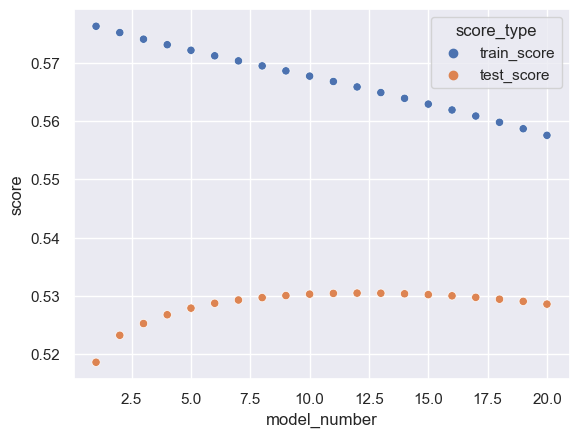

In [15]:
sns.scatterplot(data = gsCV_lasso_train_vs_test_df, y = 'score', x = 'model_number', hue = 'score_type')

In [16]:
print('Best estimators: ' + str(gsCV.best_estimator_))
print('Best score: ' + str(gsCV.best_score_))

Best estimators: Lasso(alpha=0.002898947368421053, random_state=0)
Best score: 0.5304514801253595


In [17]:
from sklearn.linear_model import LassoCV
from sklearn.metrics import r2_score

# Assuming 'X' is your feature matrix and 'y' is your target variable

lasso_cv = LassoCV(alphas=None)

scaler = StandardScaler()

model_pipeline = Pipeline([('scaler', scaler), ('lasso_cv', lasso_cv)])
# Perform cross-validation

cv_models = []

for train_index, test_index in kf.split(features_outliers_dum_drop):
    X_train, X_test = features_outliers_dum_drop.iloc[train_index,:], features_outliers_dum_drop.iloc[test_index,:]
    y_train, y_test = response_outliers.iloc[train_index], response_outliers.iloc[test_index]
    # Fit the pipeline on the training data
    model_pipeline.fit(X_train, np.log(y_train))
    # Make predictions on the test set
    y_pred = model_pipeline.predict(X_test)
    # Calculate R-squared for the fold
    r2 = r2_score(np.log(y_test), y_pred)
    # Append the fitted model and R-squared to the list
    cv_models.append((model_pipeline.named_steps['lasso_cv'], r2))
# Access the optimal alpha and R-squared for each fold
optimal_alphas = [model[0].alpha_ for model in cv_models]
r2_scores = [model[1] for model in cv_models]
# Print the optimal alphas and R-squared for each fold
for fold, (alpha, r2) in enumerate(zip(optimal_alphas, r2_scores), 1):
    print(f"Fold {fold}: Optimal alpha = {alpha}, R-squared = {r2}")
print()
print(sum(r2_scores)/len(r2_scores))

/Users/bryceferraro/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:1563: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/bryceferraro/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:1563: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/bryceferraro/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:1563: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/bryceferraro/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:156

Fold 1: Optimal alpha = 0.0033150408702299124, R-squared = 0.5161263855818881
Fold 2: Optimal alpha = 0.0033150408702299124, R-squared = 0.5397623644795677
Fold 3: Optimal alpha = 0.0033150408702299124, R-squared = 0.5324559575928829
Fold 4: Optimal alpha = 0.0033150408702299124, R-squared = 0.5273858139637098
Fold 5: Optimal alpha = 0.0033150408702299124, R-squared = 0.5355284278173618

0.530251789887082


In [18]:
lasso.set_params(alpha = 0.0033150408702299124)
lasso.fit(X = X_train_outliers_drop_scaled,y = np.log(y_train_outliers_drop_scaled))
print('Best train score: ' + str(lasso.score(X = X_train_outliers_drop_scaled,y = np.log(y_train_outliers_drop_scaled))))
print('Best test score: ' + str(lasso.score(X = X_test_outliers_drop_scaled,y = np.log(y_test_outliers_drop_scaled))))


Best train score: 0.5607284354684834
Best test score: 0.5196843257056921


Text(0, 0.5, 'Actual SalePrice')

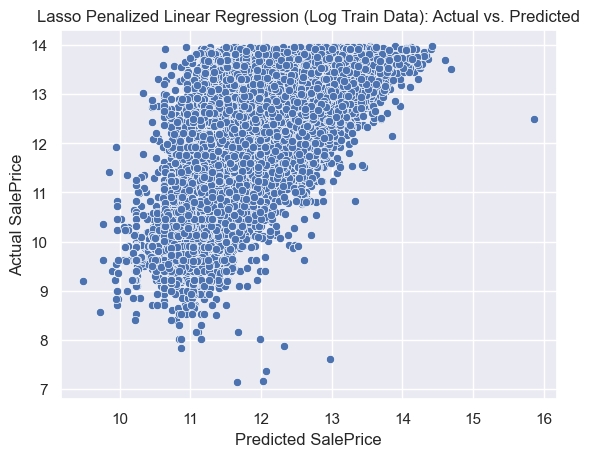

In [19]:
sns.scatterplot(x = lasso.predict(X_train_outliers_drop_scaled), y = np.log(y_train_outliers_drop_scaled))
plt.title('Lasso Penalized Linear Regression (Log Train Data): Actual vs. Predicted')
plt.xlabel('Predicted SalePrice')
plt.ylabel('Actual SalePrice')

Text(0, 0.5, 'Actual SalePrice')

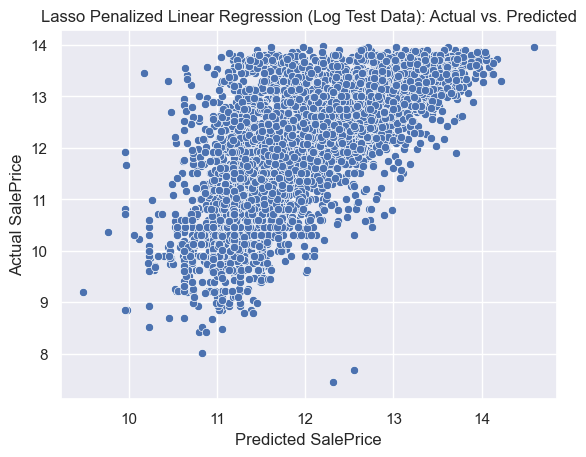

In [20]:
sns.scatterplot(x = lasso.predict(X_test_outliers_drop_scaled), y = np.log(y_test_outliers_drop_scaled))
plt.title('Lasso Penalized Linear Regression (Log Test Data): Actual vs. Predicted')
plt.xlabel('Predicted SalePrice')
plt.ylabel('Actual SalePrice')

# Lasso - Post Tuning - Cross Validation

In [21]:

lasso = Lasso(alpha = 0.0033150408702299124, random_state = 0)

scaler = StandardScaler()

pipe = Pipeline([('scaler',scaler),('model',lasso)])

lasso_outliers_drop_scaled_cv_tuned_r2 = cross_val_score(estimator = pipe, X = features_outliers_dum_drop, y = np.log(response_outliers), cv = kf, scoring = 'r2')
lasso_outliers_drop_scaled_cv_tuned_mae = cross_val_score(estimator = pipe, X = features_outliers_dum_drop, y = np.log(response_outliers), cv = kf, scoring = 'neg_mean_absolute_error')
lasso_outliers_drop_scaled_cv_tuned_rmse = cross_val_score(estimator = pipe, X = features_outliers_dum_drop, y = np.log(response_outliers), cv = kf, scoring = 'neg_root_mean_squared_error')
lasso_outliers_drop_scaled_cv_tuned_mape = cross_val_score(estimator = pipe, X = features_outliers_dum_drop, y = np.log(response_outliers), cv = kf, scoring = 'neg_mean_absolute_percentage_error')



In [22]:
print('Mean cross-validation R2 score: ' + str(lasso_outliers_drop_scaled_cv_tuned_r2.mean()))
print('Std dev cross-validation R2 score: ' + str(lasso_outliers_drop_scaled_cv_tuned_r2.std()))

Mean cross-validation R2 score: 0.5312176769171633
Std dev cross-validation R2 score: 0.007152964784864354


In [23]:
print('Mean cross-validation MAE score: ' + str((lasso_outliers_drop_scaled_cv_tuned_mae * -1).mean()))
print('Std dev cross-validation MAE score: ' + str((lasso_outliers_drop_scaled_cv_tuned_mae * -1).std()))

Mean cross-validation MAE score: 0.5691822494350344
Std dev cross-validation MAE score: 0.005828575579267086


In [24]:
print('Mean cross-validation RMSE score: ' + str((lasso_outliers_drop_scaled_cv_tuned_rmse * -1).mean()))
print('Std dev cross-validation RMSE score: ' + str((lasso_outliers_drop_scaled_cv_tuned_rmse * -1).std()))

Mean cross-validation RMSE score: 0.7779711138087129
Std dev cross-validation RMSE score: 0.006660429724570658


In [25]:
print('Mean cross-validation MAPE score: ' + str((lasso_outliers_drop_scaled_cv_tuned_mape * -1).mean()))
print('Std dev cross-validation MAPE score: ' + str((lasso_outliers_drop_scaled_cv_tuned_mape * -1).std()))

Mean cross-validation MAPE score: 0.04866232908274341
Std dev cross-validation MAPE score: 0.0005003981822871988


In [26]:
lasso_outliers_drop_scaled_cv_tuned_mae = lasso_outliers_drop_scaled_cv_tuned_mae * -1
lasso_outliers_drop_scaled_cv_tuned_rmse = lasso_outliers_drop_scaled_cv_tuned_rmse * -1
lasso_outliers_drop_scaled_cv_tuned_mape = lasso_outliers_drop_scaled_cv_tuned_mape * -1

# No Zip

## Lasso - No Zip - Base Model - Cross Validation

In [27]:


scaler = StandardScaler()

lasso = Lasso(random_state = 0, alpha = 0.005)

pipe = Pipeline([('scaler',scaler),('model',lasso)])

lasso_outliers_drop_scaled_cv_nozip_r2 = cross_val_score(estimator = pipe, X = features_outliers_dum_drop_nozip, y = np.log(response_outliers), cv = kf, scoring = 'r2')
lasso_outliers_drop_scaled_cv_nozip_mae = cross_val_score(estimator = pipe, X = features_outliers_dum_drop_nozip, y = np.log(response_outliers), cv = kf, scoring = 'neg_mean_absolute_error')
lasso_outliers_drop_scaled_cv_nozip_rmse = cross_val_score(estimator = pipe, X = features_outliers_dum_drop_nozip, y = np.log(response_outliers), cv = kf, scoring = 'neg_root_mean_squared_error')
lasso_outliers_drop_scaled_cv_nozip_mape = cross_val_score(estimator = pipe, X = features_outliers_dum_drop_nozip, y = np.log(response_outliers), cv = kf, scoring = 'neg_mean_absolute_percentage_error')


In [28]:
print('Mean cross-validation R2 score: ' + str(lasso_outliers_drop_scaled_cv_nozip_r2.mean()))
print('Std dev cross-validation R2 score: ' + str(lasso_outliers_drop_scaled_cv_nozip_r2.std()))
print('Mean cross-validation MAE score: ' + str((lasso_outliers_drop_scaled_cv_nozip_mae * -1).mean()))
print('Std dev cross-validation MAE score: ' + str((lasso_outliers_drop_scaled_cv_nozip_mae * -1).std()))
print('Mean cross-validation RMSE score: ' + str((lasso_outliers_drop_scaled_cv_nozip_rmse * -1).mean()))
print('Std dev cross-validation RMSE score: ' + str((lasso_outliers_drop_scaled_cv_nozip_rmse * -1).std()))
print('Mean cross-validation MAPE score: ' + str((lasso_outliers_drop_scaled_cv_nozip_mape * -1).mean()))
print('Std dev cross-validation MAPE score: ' + str((lasso_outliers_drop_scaled_cv_nozip_mape * -1).std()))

Mean cross-validation R2 score: 0.5223564879232888
Std dev cross-validation R2 score: 0.006681292612046193
Mean cross-validation MAE score: 0.5763729783881889
Std dev cross-validation MAE score: 0.005629004195404613
Mean cross-validation RMSE score: 0.7852954331773331
Std dev cross-validation RMSE score: 0.006553274737988688
Mean cross-validation MAPE score: 0.0493006353283555
Std dev cross-validation MAPE score: 0.00047167197184776953


## Lasso - No Zip - Hyperparameter Tuning

In [29]:

# Assuming 'X' is your feature matrix and 'y' is your target variable

lasso_cv = LassoCV(alphas=None)

scaler = StandardScaler()

model_pipeline = Pipeline([('scaler', scaler), ('lasso_cv', lasso_cv)])
# Perform cross-validation

cv_models = []

for train_index, test_index in kf.split(features_outliers_dum_drop_nozip):
    X_train, X_test = features_outliers_dum_drop_nozip.iloc[train_index,:], features_outliers_dum_drop_nozip.iloc[test_index,:]
    y_train, y_test = response_outliers.iloc[train_index], response_outliers.iloc[test_index]
    # Fit the pipeline on the training data
    model_pipeline.fit(X_train, np.log(y_train))
    # Make predictions on the test set
    y_pred = model_pipeline.predict(X_test)
    # Calculate R-squared for the fold
    r2 = r2_score(np.log(y_test), y_pred)
    # Append the fitted model and R-squared to the list
    cv_models.append((model_pipeline.named_steps['lasso_cv'], r2))
# Access the optimal alpha and R-squared for each fold
optimal_alphas = [model[0].alpha_ for model in cv_models]
r2_scores = [model[1] for model in cv_models]
# Print the optimal alphas and R-squared for each fold
for fold, (alpha, r2) in enumerate(zip(optimal_alphas, r2_scores), 1):
    print(f"Fold {fold}: Optimal alpha = {alpha}, R-squared = {r2}")
print()
print(sum(r2_scores)/len(r2_scores))

/Users/bryceferraro/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:1563: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/bryceferraro/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:1563: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/bryceferraro/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:1563: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/bryceferraro/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:156

Fold 1: Optimal alpha = 0.0033150408702299124, R-squared = 0.5112323712289506
Fold 2: Optimal alpha = 0.0033150408702299124, R-squared = 0.532991483423085
Fold 3: Optimal alpha = 0.0033150408702299124, R-squared = 0.525231298171029
Fold 4: Optimal alpha = 0.0033150408702299124, R-squared = 0.5202749911195109
Fold 5: Optimal alpha = 0.0033150408702299124, R-squared = 0.5301484281631237

0.5239757144211399


In [30]:
lasso.set_params(alpha = 0.0033150408702299124)
lasso.fit(X = X_train_outliers_drop_scaled_nozip,y = np.log(y_train_outliers_drop_scaled_nozip))
print('Best train score: ' + str(lasso.score(X = X_train_outliers_drop_scaled_nozip,y = np.log(y_train_outliers_drop_scaled_nozip))))
print('Best test score: ' + str(lasso.score(X = X_test_outliers_drop_scaled_nozip,y = np.log(y_test_outliers_drop_scaled_nozip))))


Best train score: 0.5520179629332602
Best test score: 0.5154059797058804


## Lasso - No Zip - Post Tuning - Cross Validation

In [31]:

lasso = Lasso(alpha = 0.0033150408702299124, random_state = 0)

scaler = StandardScaler()

pipe = Pipeline([('scaler',scaler),('model',lasso)])

lasso_outliers_drop_scaled_cv_tuned_nozip_r2 = cross_val_score(estimator = pipe, X = features_outliers_dum_drop_nozip, y = np.log(response_outliers), cv = kf, scoring = 'r2')
lasso_outliers_drop_scaled_cv_tuned_nozip_mae = cross_val_score(estimator = pipe, X = features_outliers_dum_drop_nozip, y = np.log(response_outliers), cv = kf, scoring = 'neg_mean_absolute_error')
lasso_outliers_drop_scaled_cv_tuned_nozip_rmse = cross_val_score(estimator = pipe, X = features_outliers_dum_drop_nozip, y = np.log(response_outliers), cv = kf, scoring = 'neg_root_mean_squared_error')
lasso_outliers_drop_scaled_cv_tuned_nozip_mape = cross_val_score(estimator = pipe, X = features_outliers_dum_drop_nozip, y = np.log(response_outliers), cv = kf, scoring = 'neg_mean_absolute_percentage_error')



In [32]:
print('Mean cross-validation R2 score: ' + str(lasso_outliers_drop_scaled_cv_tuned_nozip_r2.mean()))
print('Std dev cross-validation R2 score: ' + str(lasso_outliers_drop_scaled_cv_tuned_nozip_r2.std()))
print('Mean cross-validation MAE score: ' + str((lasso_outliers_drop_scaled_cv_tuned_nozip_mae * -1).mean()))
print('Std dev cross-validation MAE score: ' + str((lasso_outliers_drop_scaled_cv_tuned_nozip_mae * -1).std()))
print('Mean cross-validation RMSE score: ' + str((lasso_outliers_drop_scaled_cv_tuned_nozip_rmse * -1).mean()))
print('Std dev cross-validation RMSE score: ' + str((lasso_outliers_drop_scaled_cv_tuned_nozip_rmse * -1).std()))
print('Mean cross-validation MAPE score: ' + str((lasso_outliers_drop_scaled_cv_tuned_nozip_mape * -1).mean()))
print('Std dev cross-validation MAPE score: ' + str((lasso_outliers_drop_scaled_cv_tuned_nozip_mape * -1).std()))

Mean cross-validation R2 score: 0.5253175131370773
Std dev cross-validation R2 score: 0.006361936509590148
Mean cross-validation MAE score: 0.5736063483110981
Std dev cross-validation MAE score: 0.0050656883895597435
Mean cross-validation RMSE score: 0.7828574387386605
Std dev cross-validation RMSE score: 0.006140915249574737
Mean cross-validation MAPE score: 0.049036128494355555
Std dev cross-validation MAPE score: 0.00042551219008912897


In [33]:
lasso_outliers_drop_scaled_cv_tuned_nozip_mae = lasso_outliers_drop_scaled_cv_tuned_nozip_mae * -1
lasso_outliers_drop_scaled_cv_tuned_nozip_rmse = lasso_outliers_drop_scaled_cv_tuned_nozip_rmse * -1
lasso_outliers_drop_scaled_cv_tuned_nozip_mape = lasso_outliers_drop_scaled_cv_tuned_nozip_mape * -1

# Time Trials for Models

In [35]:
import time

i = 1
lasso_outliers_times = []
lasso = Lasso(alpha = 0.0033150408702299124, random_state = 0)


while i <= 5:
    start = time.time()

    lasso.fit(X = features_outliers_dum_drop_scaled, y = np.log(response_outliers))
    
    end = time.time()
    
    lasso_time = end - start
    lasso_outliers_times.append(lasso_time)
    
    i = i + 1

lasso_outliers_times

[5.917644023895264,
 5.559537172317505,
 5.133396148681641,
 5.062541961669922,
 6.073022842407227]

In [36]:

i = 1
lasso_outliers_times_nozip = []
lasso = Lasso(alpha = 0.0033150408702299124, random_state = 0)


while i <= 5:
    start = time.time()

    lasso.fit(X = features_outliers_dum_drop_scaled_nozip, y = np.log(response_outliers))
    
    end = time.time()
    
    lasso_time = end - start
    lasso_outliers_times_nozip.append(lasso_time)
    
    i = i + 1

lasso_outliers_times_nozip

[2.088386058807373,
 2.3956711292266846,
 2.4725329875946045,
 2.598400115966797,
 2.8122410774230957]

# Model Results

In [37]:
lasso_outliers_results = pd.DataFrame(data = {'Model Number': np.linspace(1,5,5),
                                     'Model Durations': lasso_outliers_times,
                                      'Lasso Penalized Regression_Outliers_Drop_Scaled R2': lasso_outliers_drop_scaled_cv_tuned_r2,
                                      'Lasso Penalized Regression_Outliers_Drop_Scaled MAE': lasso_outliers_drop_scaled_cv_tuned_mae,
                                      'Lasso Penalized Regression_Outliers_Drop_Scaled RMSE': lasso_outliers_drop_scaled_cv_tuned_rmse,
                                      'Lasso Penalized Regression_Outliers_Drop_Scaled MAPE': lasso_outliers_drop_scaled_cv_tuned_mape,
                                     }
                             )

lasso_outliers_results

,Model Number,Model Durations,Lasso Penalized Regression_Outliers_Drop_Scaled R2,Lasso Penalized Regression_Outliers_Drop_Scaled MAE,Lasso Penalized Regression_Outliers_Drop_Scaled RMSE,Lasso Penalized Regression_Outliers_Drop_Scaled MAPE
0,1.0,5.917644,0.519684,0.579179,0.790405,0.049560
1,2.0,5.559537,0.540524,0.566867,0.775043,0.048403
2,3.0,5.133396,0.532955,0.561294,0.775865,0.048047
3,4.0,5.062542,0.527397,0.570364,0.777932,0.048643
4,5.0,6.073023,0.535528,0.568207,0.770610,0.048658


In [38]:
lasso_outliers_nozip_results = pd.DataFrame(data = {'Model Number': np.linspace(1,5,5),
                                     'Model Durations': lasso_outliers_times_nozip,
                                      'Lasso Penalized Regression_Outliers_Drop_Scaled_NoZip R2': lasso_outliers_drop_scaled_cv_tuned_nozip_r2,
                                      'Lasso Penalized Regression_Outliers_Drop_Scaled_NoZip MAE': lasso_outliers_drop_scaled_cv_tuned_nozip_mae,
                                      'Lasso Penalized Regression_Outliers_Drop_Scaled_NoZip RMSE': lasso_outliers_drop_scaled_cv_tuned_nozip_rmse,
                                      'Lasso Penalized Regression_OUltiers_Drop_Scaled_NoZip MAPE': lasso_outliers_drop_scaled_cv_tuned_nozip_mape,
                                     }
                             )

lasso_outliers_nozip_results

,Model Number,Model Durations,Lasso Penalized Regression_Outliers_Drop_Scaled_NoZip R2,Lasso Penalized Regression_Outliers_Drop_Scaled_NoZip MAE,Lasso Penalized Regression_Outliers_Drop_Scaled_NoZip RMSE,Lasso Penalized Regression_OUltiers_Drop_Scaled_NoZip MAPE
0,1.0,2.088386,0.515406,0.581486,0.793918,0.049762
1,2.0,2.395671,0.533326,0.572490,0.781090,0.048890
2,3.0,2.472533,0.526340,0.566018,0.781340,0.048444
3,4.0,2.598400,0.521367,0.575897,0.782879,0.049101
4,5.0,2.812241,0.530148,0.572142,0.775060,0.048983


In [39]:

current_directory = os.getcwd()

dataframes = {'lasso_outliers_results': lasso_outliers_results,
              'lasso_outliers_results_nozip': lasso_outliers_nozip_results,
             }


for name, df in dataframes.items():

    file_path = os.path.join(current_directory, f"{name}.csv")
    
    df.to_csv(file_path, sep='\t', index=False)

# XGBoost

# XGBoost - Base Model

In [112]:
from xgboost import XGBRegressor
from sklearn.metrics import r2_score

xgb = XGBRegressor(objective ='reg:squarederror', random_state=0)


xgb.fit(X_train_outliers_encoded, np.log(y_train_outliers_encoded))


print('Best train score: ' + str(r2_score(np.log(y_train_outliers_encoded), xgb.predict(X_train_outliers_encoded))))
print('Best test score: ' + str(r2_score(np.log(y_test_outliers_encoded), xgb.predict(X_test_outliers_encoded))))


Best train score: 0.8704813019869976
Best test score: 0.7825090754207404


# XGBoost - Base Model - Cross Validation


In [114]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV


xgb = XGBRegressor(objective ='reg:squarederror', random_state=0)

xgb_outliers_encoded_cv_r2 = cross_val_score(estimator = xgb, X = features_outliers_encoded, y = np.log(response_outliers), cv = kf, scoring = 'r2')
xgb_outliers_encoded_cv_mae = cross_val_score(estimator = xgb, X = features_outliers_encoded, y = np.log(response_outliers), cv = kf, scoring = 'neg_mean_absolute_error')
xgb_outliers_encoded_cv_rmse = cross_val_score(estimator = xgb, X = features_outliers_encoded, y = np.log(response_outliers), cv = kf, scoring = 'neg_root_mean_squared_error')
xgb_outliers_encoded_cv_mape = cross_val_score(estimator = xgb, X = features_outliers_encoded, y = np.log(response_outliers), cv = kf, scoring = 'neg_mean_absolute_percentage_error')



In [116]:

print('Mean cross-validation score: ' + str(xgb_outliers_encoded_cv_r2.mean()))
print('Std dev cross-validation score: ' + str(xgb_outliers_encoded_cv_r2.std()))

Mean cross-validation score: 0.7874568796022835
Std dev cross-validation score: 0.005782076590935587


In [117]:

print('Mean cross-validation score: ' + str((xgb_outliers_encoded_cv_mae * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_outliers_encoded_cv_mae * -1).std()))

Mean cross-validation score: 0.3611562987952569
Std dev cross-validation score: 0.005036333173385007


In [118]:

print('Mean cross-validation score: ' + str((xgb_outliers_encoded_cv_rmse * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_outliers_encoded_cv_rmse * -1).std()))

Mean cross-validation score: 0.5238002537197545
Std dev cross-validation score: 0.0067400865244222575


In [119]:

print('Mean cross-validation score: ' + str((xgb_outliers_encoded_cv_mape * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_outliers_encoded_cv_mape * -1).std()))

Mean cross-validation score: 0.030824125435526168
Std dev cross-validation score: 0.00042615477388842945


# XGBoost - Hyperparameter Tuning 

In [120]:
xgb = XGBRegressor(objective ='reg:squarederror', random_state=0)

param = {'learning_rate': [0.2, 0.3, 0.4],
         'subsample': [0.3, 0.6, 1],
         #'colsample_bytree': [0.7, 0.8, 0.9],
         'n_estimators': [60, 80, 100],
         'max_depth':range(4,17,4),
         #'min_child_weight':range(1,6,2)
        }

gsCV = GridSearchCV(xgb, param, cv = kf, return_train_score = True)
gsCV.fit(X_train_outliers_encoded, np.log(y_train_outliers_encoded))


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    inter...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=0, ...),
             param_grid={'learning_rate': [0.2, 0.3, 0.4],
                         'max_depth': range(4, 17, 4),
                         'n_estimators': [60, 80, 100],
                         'subsample': [0.3, 0.6, 1]},
             return_train_score=True)

In [190]:
# xgb = XGBRegressor(objective ='reg:squarederror', random_state=0)

# param = {'learning_rate': [0.033, 0.1, 0.133, 0.3, 0.4],
#          'subsample': [0.3, 0.6, 1],
#          'n_estimators': [40, 50, 60],
#          'max_depth':range(3,10,2)
#         }

# gsCV = GridSearchCV(xgb, param, cv = kf, return_train_score = True)
# gsCV.fit(X_train_outliers_encoded, np.log(y_train_outliers_encoded))


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    inter...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=0, ...),
             param_grid={'learning_rate': [0.033, 0.1, 0.133, 0.3, 0.4],
                         'max_depth': range(3, 10, 2),
                         'n_estimators': [40, 50, 60],
                         'subsample': [0.3, 0.6, 1]},
             return_train_score=True)

In [124]:
gsCV_xgb_train_vs_test_df = pd.DataFrame(data = {'train_score': gsCV.cv_results_['mean_train_score'],\
                                               'test_score': gsCV.cv_results_['mean_test_score']}).reset_index().rename(columns = {'index': 'model_number'})
gsCV_xgb_train_vs_test_df['model_number'] = gsCV_xgb_train_vs_test_df['model_number'] + 1
gsCV_xgb_train_vs_test_df['score_difference'] = gsCV_xgb_train_vs_test_df['train_score'] - gsCV_xgb_train_vs_test_df['test_score']

gsCV_xgb_train_vs_test_df = gsCV_xgb_train_vs_test_df.melt(id_vars = ['model_number','score_difference'], value_vars = ['train_score', 'test_score'], var_name = 'score_type', value_name = 'score')

gsCV_xgb_train_vs_test_df


,model_number,score_difference,score_type,score
0,1,0.027155,train_score,0.755098
1,2,0.029317,train_score,0.761343
2,3,0.026736,train_score,0.758820
3,4,0.033020,train_score,0.767969
4,5,0.035017,train_score,0.774676
5,6,0.031934,train_score,0.771947
6,7,0.038521,train_score,0.777351
7,8,0.040135,train_score,0.785718
8,9,0.036644,train_score,0.782658
9,10,0.107059,train_score,0.871223


Text(0, 0.5, 'R2')

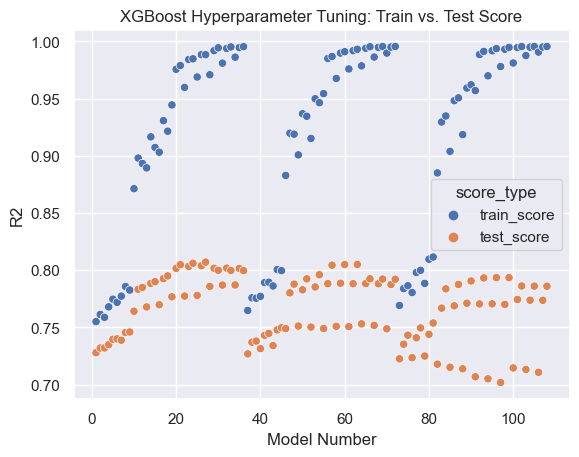

In [125]:
sns.scatterplot(data = gsCV_xgb_train_vs_test_df.loc[gsCV_xgb_train_vs_test_df['score'] > 0,:], y = 'score', x = 'model_number', hue = 'score_type')
plt.title('XGBoost Hyperparameter Tuning: Train vs. Test Score')
plt.xlabel('Model Number')
plt.ylabel('R2')

In [126]:
print('Best score: ' + str(gsCV.best_score_))
print('Best parameters: ' + str(gsCV.best_params_))


Best score: 0.8071074173118367
Best parameters: {'learning_rate': 0.2, 'max_depth': 12, 'n_estimators': 100, 'subsample': 1}


In [127]:
# Testing colsample_bytree and min_child_weight

xgb = XGBRegressor(objective ='reg:squarederror', random_state=0)

param = {'learning_rate': [0.2],
         'subsample': [1],
         'colsample_bytree': [0.7, 0.8, 0.9],
         'n_estimators': [60, 80, 100],
         'max_depth':range(4,17,4),
         'min_child_weight':range(1,6,2)
        }

gsCV = GridSearchCV(xgb, param, cv = kf, return_train_score = True)
gsCV.fit(X_train_outliers_encoded, np.log(y_train_outliers_encoded))


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    inter...
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=0, ...),
             param_grid={'colsample_bytree': [0.7, 0.8, 0.9],
                         'learning_rate': [0.2], 'max_depth': range(4, 17, 4),
                         'min_child_weight': range(1, 6, 2),
                         'n_estimators': [60, 80, 100], 'subsample': [1]},
             return_train_score=True)

In [128]:
gsCV_xgb_train_vs_test_df = pd.DataFrame(data = {'train_score': gsCV.cv_results_['mean_train_score'],\
                                               'test_score': gsCV.cv_results_['mean_test_score']}).reset_index().rename(columns = {'index': 'model_number'})
gsCV_xgb_train_vs_test_df['model_number'] = gsCV_xgb_train_vs_test_df['model_number'] + 1
gsCV_xgb_train_vs_test_df['score_difference'] = gsCV_xgb_train_vs_test_df['train_score'] - gsCV_xgb_train_vs_test_df['test_score']

gsCV_xgb_train_vs_test_df = gsCV_xgb_train_vs_test_df.melt(id_vars = ['model_number','score_difference'], value_vars = ['train_score', 'test_score'], var_name = 'score_type', value_name = 'score')

gsCV_xgb_train_vs_test_df


,model_number,score_difference,score_type,score
0,1,0.026956,train_score,0.757376
1,2,0.031629,train_score,0.770773
2,3,0.036022,train_score,0.780668
3,4,0.027646,train_score,0.758012
4,5,0.032342,train_score,0.771326
5,6,0.036200,train_score,0.781135
6,7,0.026947,train_score,0.757769
7,8,0.031610,train_score,0.770733
8,9,0.035918,train_score,0.781044
9,10,0.104001,train_score,0.891843


Text(0, 0.5, 'R2')

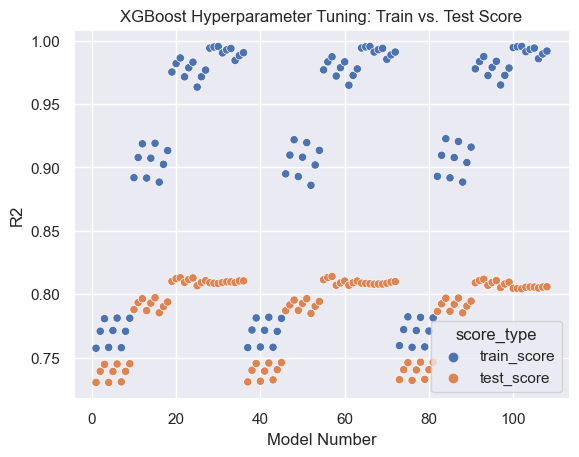

In [129]:
sns.scatterplot(data = gsCV_xgb_train_vs_test_df.loc[gsCV_xgb_train_vs_test_df['score'] > 0,:], y = 'score', x = 'model_number', hue = 'score_type')
plt.title('XGBoost Hyperparameter Tuning: Train vs. Test Score')
plt.xlabel('Model Number')
plt.ylabel('R2')

In [130]:
print('Best score: ' + str(gsCV.best_score_))
print('Best parameters: ' + str(gsCV.best_params_))


Best score: 0.8139597034448596
Best parameters: {'colsample_bytree': 0.8, 'learning_rate': 0.2, 'max_depth': 12, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 1}


In [131]:
xgb.set_params(
    colsample_bytree = 0.8,
    min_child_weight = 1,
    learning_rate = 0.2, 
    max_depth = 12, 
    subsample = 1, 
    n_estimators = 100)
xgb.fit(X = X_train_outliers_encoded, y = np.log(y_train_outliers_encoded))
print('Best train score: ' + str(xgb.score(X = X_train_outliers_encoded,y = np.log(y_train_outliers_encoded))))
print('Best test score: ' + str(xgb.score(X = X_test_outliers_encoded,y = np.log(y_test_outliers_encoded))))


Best train score: 0.9854765063390001
Best test score: 0.8296178957290354


Text(0, 0.5, 'Actual SalePrice')

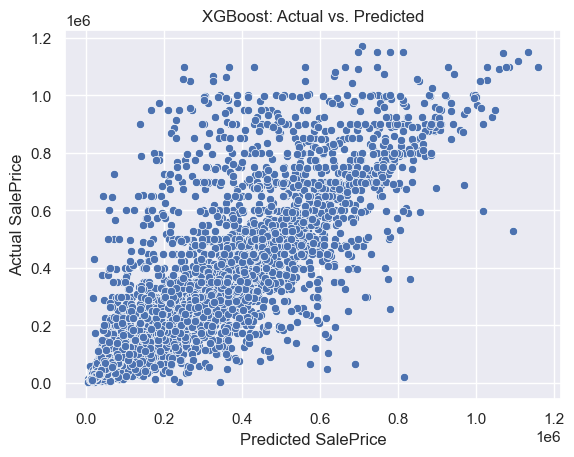

In [132]:
sns.scatterplot(x = np.exp(xgb.predict(X_test_outliers_encoded)), y = y_test_outliers_encoded)
plt.title('XGBoost: Actual vs. Predicted')
plt.xlabel('Predicted SalePrice')
plt.ylabel('Actual SalePrice')

Text(0, 0.5, 'Actual SalePrice')

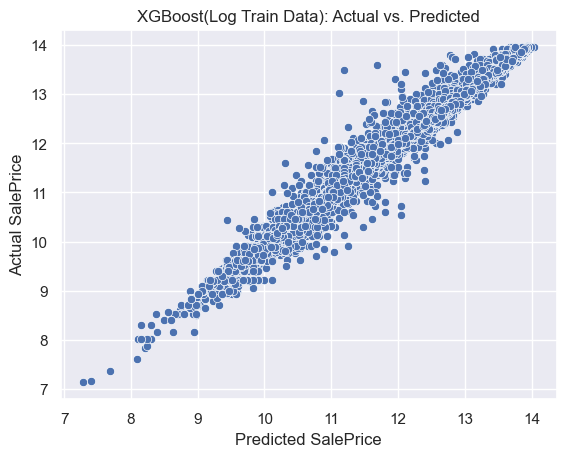

In [133]:
sns.scatterplot(x = xgb.predict(X_train_outliers_encoded), y = np.log(y_train_outliers_encoded))
plt.title('XGBoost(Log Train Data): Actual vs. Predicted')
plt.xlabel('Predicted SalePrice')
plt.ylabel('Actual SalePrice')

Text(0, 0.5, 'Actual SalePrice')

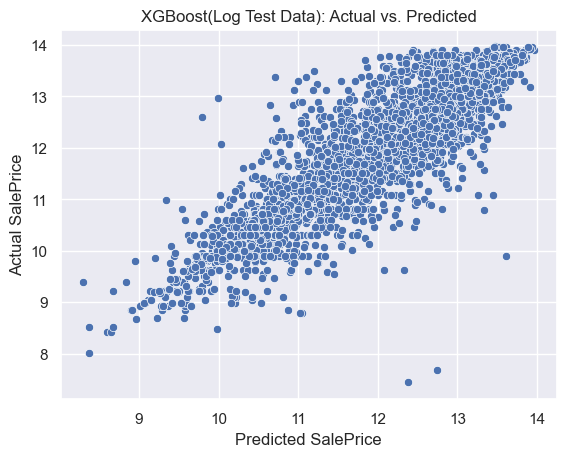

In [134]:
sns.scatterplot(x = xgb.predict(X_test_outliers_encoded), y = np.log(y_test_outliers_encoded))
plt.title('XGBoost(Log Test Data): Actual vs. Predicted')
plt.xlabel('Predicted SalePrice')
plt.ylabel('Actual SalePrice')

# XGBoost - Post Tuning - Cross Validation


In [57]:

xgb = XGBRegressor(objective ='reg:squarederror', 
                   random_state=0, 
                   colsample_bytree = 0.8,
                   min_child_weight = 1,
                   learning_rate = 0.2, 
                   max_depth = 12, 
                   subsample = 1, 
                   n_estimators = 100)

xgb_outliers_encoded_cv_tuned_r2 = cross_val_score(estimator = xgb, X = features_outliers_encoded, y = np.log(response_outliers), cv = kf, scoring = 'r2')
xgb_outliers_encoded_cv_tuned_mae = cross_val_score(estimator = xgb, X = features_outliers_encoded, y = np.log(response_outliers), cv = kf, scoring = 'neg_mean_absolute_error')
xgb_outliers_encoded_cv_tuned_rmse = cross_val_score(estimator = xgb, X = features_outliers_encoded, y = np.log(response_outliers), cv = kf, scoring = 'neg_root_mean_squared_error')
xgb_outliers_encoded_cv_tuned_mape = cross_val_score(estimator = xgb, X = features_outliers_encoded, y = np.log(response_outliers), cv = kf, scoring = 'neg_mean_absolute_percentage_error')


In [58]:

print('Mean cross-validation score: ' + str(xgb_outliers_encoded_cv_tuned_r2.mean()))
print('Std dev cross-validation score: ' + str(xgb_outliers_encoded_cv_tuned_r2.std()))

Mean cross-validation score: 0.8326258284843187
Std dev cross-validation score: 0.004799403598388228


In [59]:

print('Mean cross-validation score: ' + str((xgb_outliers_encoded_cv_tuned_mae * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_outliers_encoded_cv_tuned_mae * -1).std()))

Mean cross-validation score: 0.2860369514585259
Std dev cross-validation score: 0.004219776759971992


In [60]:

print('Mean cross-validation score: ' + str((xgb_outliers_encoded_cv_tuned_rmse * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_outliers_encoded_cv_tuned_rmse * -1).std()))

Mean cross-validation score: 0.4648283702394312
Std dev cross-validation score: 0.0070967866686795795


In [61]:

print('Mean cross-validation score: ' + str((xgb_outliers_encoded_cv_tuned_mape * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_outliers_encoded_cv_tuned_mape * -1).std()))

Mean cross-validation score: 0.024294331044913253
Std dev cross-validation score: 0.0003665059710031864


In [62]:
xgb_outliers_encoded_cv_tuned_mae = xgb_outliers_encoded_cv_tuned_mae * -1
xgb_outliers_encoded_cv_tuned_rmse = xgb_outliers_encoded_cv_tuned_rmse * -1
xgb_outliers_encoded_cv_tuned_mape = xgb_outliers_encoded_cv_tuned_mape * -1

# SHAP Analysis

In [147]:
import shap
shap. initjs()

xgb.set_params(objective ='reg:squarederror', 
                   random_state=0, 
                   colsample_bytree = 0.8,
                   min_child_weight = 1,
                   learning_rate = 0.2, 
                   max_depth = 12, 
                   subsample = 1, 
                   n_estimators = 100)


shap_model = xgb.fit(X = features_outliers_encoded, y = (response_outliers))

explainer = shap.TreeExplainer(shap_model)
shap_values = explainer(features_outliers_encoded)


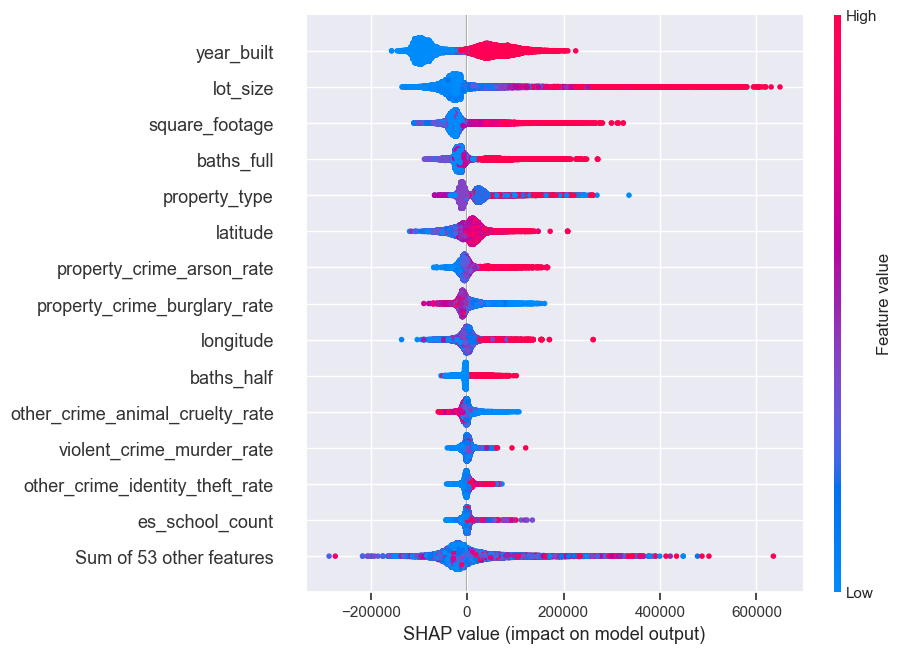

In [148]:
shap.plots.beeswarm(shap_values, max_display = 15)

# No Zip

## XGBoost - No Zip - Base Model - Cross Validation

In [41]:

xgb = XGBRegressor(objective ='reg:squarederror', random_state=0)

xgb_outliers_encoded_cv_nozip_r2 = cross_val_score(estimator = xgb, X = features_outliers_encoded_nozip, y = np.log(response_outliers), cv = kf, scoring = 'r2')
xgb_outliers_encoded_cv_nozip_mae = cross_val_score(estimator = xgb, X = features_outliers_encoded_nozip, y = np.log(response_outliers), cv = kf, scoring = 'neg_mean_absolute_error')
xgb_outliers_encoded_cv_nozip_rmse = cross_val_score(estimator = xgb, X = features_outliers_encoded_nozip, y = np.log(response_outliers), cv = kf, scoring = 'neg_root_mean_squared_error')
xgb_outliers_encoded_cv_nozip_mape = cross_val_score(estimator = xgb, X = features_outliers_encoded_nozip, y = np.log(response_outliers), cv = kf, scoring = 'neg_mean_absolute_percentage_error')



In [42]:

print('Mean cross-validation score: ' + str(xgb_outliers_encoded_cv_nozip_r2.mean()))
print('Std dev cross-validation score: ' + str(xgb_outliers_encoded_cv_nozip_r2.std()))

print('Mean cross-validation score: ' + str((xgb_outliers_encoded_cv_nozip_mae * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_outliers_encoded_cv_nozip_mae * -1).std()))

print('Mean cross-validation score: ' + str((xgb_outliers_encoded_cv_nozip_rmse * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_outliers_encoded_cv_nozip_rmse * -1).std()))

print('Mean cross-validation score: ' + str((xgb_outliers_encoded_cv_nozip_mape * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_outliers_encoded_cv_nozip_mape * -1).std()))

Mean cross-validation score: 0.7866623516854976
Std dev cross-validation score: 0.0055055012466225595
Mean cross-validation score: 0.36269307428857966
Std dev cross-validation score: 0.0041636739991000125
Mean cross-validation score: 0.5247819070150117
Std dev cross-validation score: 0.006244548047397122
Mean cross-validation score: 0.030941195001349085
Std dev cross-validation score: 0.0003399098609216833


## XGBoost - No Zip - Hyperparameter Tuning

In [43]:
xgb = XGBRegressor(objective ='reg:squarederror', random_state=0)

param = {'learning_rate': [0.033, 0.1, 0.133, 0.3, 0.4],
         'subsample': [0.3, 0.6, 1],
         'n_estimators': [40, 50, 60],
         'max_depth':range(3,10,2)
        }

gsCV = GridSearchCV(xgb, param, cv = kf, return_train_score = True)
gsCV.fit(X_train_outliers_encoded_nozip, np.log(y_train_outliers_encoded_nozip))


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    inter...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=0, ...),
             param_grid={'learning_rate': [0.033, 0.1, 0.133, 0.3, 0.4],
                         'max_depth': range(3, 10, 2),
                         'n_estimators': [40, 50, 60],
                         'subsample': [0.3, 0.6, 1]},
             return_train_score=True)

In [44]:
print('Best score: ' + str(gsCV.best_score_))
print('Best parameters: ' + str(gsCV.best_params_))


Best score: 0.7969702103980583
Best parameters: {'learning_rate': 0.3, 'max_depth': 9, 'n_estimators': 60, 'subsample': 1}


In [45]:
xgb.set_params(learning_rate = 0.3, max_depth = 9, subsample = 1, n_estimators = 60)
xgb.fit(X = X_train_outliers_encoded_nozip, y = np.log(y_train_outliers_encoded_nozip))
print('Best train score: ' + str(xgb.score(X = X_train_outliers_encoded_nozip,y = np.log(y_train_outliers_encoded_nozip))))
print('Best test score: ' + str(xgb.score(X = X_test_outliers_encoded_nozip,y = np.log(y_test_outliers_encoded_nozip))))


Best train score: 0.9365150865103378
Best test score: 0.8084392712503801


In [46]:
# Testing colsample_bytree and min_child_weight

xgb = XGBRegressor(objective ='reg:squarederror', random_state=0)

param = {'learning_rate': [0.3],
         'subsample': [1],
         'colsample_bytree': [0.7, 0.8, 0.9],
         'n_estimators': [60, 80, 100],
         'max_depth':range(4,17,4),
         'min_child_weight':range(1,6,2)
        }


gsCV = GridSearchCV(xgb, param, cv = kf, return_train_score = True)
gsCV.fit(X_train_outliers_encoded_nozip, np.log(y_train_outliers_encoded_nozip))


GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    inter...
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=0, ...),
             param_grid={'colsample_bytree': [0.7, 0.8, 0.9],
                         'learning_rate': [0.3], 'max_depth': range(4, 17, 4),
                         'min_child_weight': range(1, 6, 2),
                         'n_estimators': [60, 80, 100], 'subsample': [1]},
             return_train_score=True)

In [47]:
print('Best score: ' + str(gsCV.best_score_))
print('Best parameters: ' + str(gsCV.best_params_))


Best score: 0.8048421926182769
Best parameters: {'colsample_bytree': 0.8, 'learning_rate': 0.3, 'max_depth': 12, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 1}


In [48]:
xgb.set_params(
    learning_rate = 0.3,
    #subsample = 1,
    colsample_bytree = 0.8,
    min_child_weight = 3,
    max_depth = 12, 
    subsample = 1, 
    n_estimators = 100)
xgb.fit(X = X_train_outliers_encoded_nozip, y = np.log(y_train_outliers_encoded_nozip))
print('Best train score: ' + str(xgb.score(X = X_train_outliers_encoded_nozip,y = np.log(y_train_outliers_encoded_nozip))))
print('Best test score: ' + str(xgb.score(X = X_test_outliers_encoded_nozip,y = np.log(y_test_outliers_encoded_nozip))))


Best train score: 0.9877246749632399
Best test score: 0.8218186848896649


## XGBoost - No Zip - Post Tuning - Cross Validation

In [50]:

xgb = XGBRegressor(objective ='reg:squarederror', random_state=0, 
                   learning_rate = 0.3,
                   #subsample = 1,
                   colsample_bytree = 0.8,
                   min_child_weight = 3,
                   max_depth = 12, 
                   subsample = 1, 
                   n_estimators = 100)          
                  

xgb_outliers_encoded_cv_tuned_nozip_r2 = cross_val_score(estimator = xgb, X = features_outliers_encoded_nozip, y = np.log(response_outliers), cv = kf, scoring = 'r2')
xgb_outliers_encoded_cv_tuned_nozip_mae = cross_val_score(estimator = xgb, X = features_outliers_encoded_nozip, y = np.log(response_outliers), cv = kf, scoring = 'neg_mean_absolute_error')
xgb_outliers_encoded_cv_tuned_nozip_rmse = cross_val_score(estimator = xgb, X = features_outliers_encoded_nozip, y = np.log(response_outliers), cv = kf, scoring = 'neg_root_mean_squared_error')
xgb_outliers_encoded_cv_tuned_nozip_mape = cross_val_score(estimator = xgb, X = features_outliers_encoded_nozip, y = np.log(response_outliers), cv = kf, scoring = 'neg_mean_absolute_percentage_error')


In [51]:

print('Mean cross-validation score: ' + str(xgb_outliers_encoded_cv_tuned_nozip_r2.mean()))
print('Std dev cross-validation score: ' + str(xgb_outliers_encoded_cv_tuned_nozip_r2.std()))

print('Mean cross-validation score: ' + str((xgb_outliers_encoded_cv_tuned_nozip_mae * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_outliers_encoded_cv_tuned_nozip_mae * -1).std()))

print('Mean cross-validation score: ' + str((xgb_outliers_encoded_cv_tuned_nozip_rmse * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_outliers_encoded_cv_tuned_nozip_rmse * -1).std()))

print('Mean cross-validation score: ' + str((xgb_outliers_encoded_cv_tuned_nozip_mape * -1).mean()))
print('Std dev cross-validation score: ' + str((xgb_outliers_encoded_cv_tuned_nozip_mape * -1).std()))

Mean cross-validation score: 0.8256505376322105
Std dev cross-validation score: 0.007074560908024434
Mean cross-validation score: 0.29079950253816644
Std dev cross-validation score: 0.0064107623469656025
Mean cross-validation score: 0.4743539259936365
Std dev cross-validation score: 0.009403606622436363
Mean cross-validation score: 0.02464389221934534
Std dev cross-validation score: 0.0005289441839980269


In [52]:
xgb_outliers_encoded_cv_tuned_nozip_mae = xgb_outliers_encoded_cv_tuned_nozip_mae * -1
xgb_outliers_encoded_cv_tuned_nozip_rmse = xgb_outliers_encoded_cv_tuned_nozip_rmse * -1
xgb_outliers_encoded_cv_tuned_nozip_mape = xgb_outliers_encoded_cv_tuned_nozip_mape * -1

# Time Trials for Models

In [53]:
import time

i = 1
xgb_outliers_times = []

xgb.set_params(
    colsample_bytree = 0.8,
    min_child_weight = 1,
    learning_rate = 0.2, 
    max_depth = 12, 
    subsample = 1, 
    n_estimators = 100)

while i <= 5:
    start = time.time()

    xgb.fit(X = features_outliers_encoded, y = np.log(response_outliers))
    
    end = time.time()
    
    xgb_time = end - start
    xgb_outliers_times.append(xgb_time)
    
    i = i + 1

xgb_outliers_times

[1.3199880123138428,
 1.3125357627868652,
 1.3235697746276855,
 1.3268849849700928,
 1.454617977142334]

In [55]:
i = 1
xgb_outliers_times_nozip = []

xgb.set_params(
    learning_rate = 0.3,
    #subsample = 1,
    colsample_bytree = 0.8,
    min_child_weight = 3,
    max_depth = 12, 
    subsample = 1, 
    n_estimators = 100)

while i <= 5:
    start = time.time()

    xgb.fit(X = features_outliers_encoded_nozip, y = np.log(response_outliers))
    
    end = time.time()
    
    xgb_time = end - start
    xgb_outliers_times_nozip.append(xgb_time)
    
    i = i + 1

xgb_outliers_times_nozip

[0.9521737098693848,
 0.9451069831848145,
 0.9881401062011719,
 0.9417171478271484,
 0.9433639049530029]

# Model Results

In [63]:
xgb_outliers_results = pd.DataFrame(data = {'Model Number': np.linspace(1,5,5),
                                     'Model Durations': xgb_outliers_times,
                                      'XGBoost_Outliers_Encoded R2': xgb_outliers_encoded_cv_tuned_r2,
                                      'XGBoost_Outliers_Encoded MAE': xgb_outliers_encoded_cv_tuned_mae,
                                      'XGBoost_Outliers_Encoded RMSE': xgb_outliers_encoded_cv_tuned_rmse,
                                      'XGBoost_Outliers_Encoded MAPE': xgb_outliers_encoded_cv_tuned_mape  
                                     }
                             )

xgb_outliers_results

,Model Number,Model Durations,XGBoost_Outliers_Encoded R2,XGBoost_Outliers_Encoded MAE,XGBoost_Outliers_Encoded RMSE,XGBoost_Outliers_Encoded MAPE
0,1.0,1.319988,0.827025,0.291196,0.474327,0.024714
1,2.0,1.312536,0.836865,0.283056,0.461814,0.024065
2,3.0,1.323570,0.831975,0.284275,0.465365,0.024148
3,4.0,1.326885,0.828002,0.290846,0.469304,0.024731
4,5.0,1.454618,0.839261,0.280812,0.453331,0.023814


In [64]:
xgb_outliers_nozip_results = pd.DataFrame(data = {'Model Number': np.linspace(1,5,5),
                                     'Model Durations': xgb_outliers_times_nozip,
                                      'XGBoost_Outliers_Encoded_NoZip R2': xgb_outliers_encoded_cv_tuned_nozip_r2,
                                      'XGBoost_Outliers_Encoded_NoZip MAE': xgb_outliers_encoded_cv_tuned_nozip_mae,
                                      'XGBoost_Outliers_Encoded_NoZip RMSE': xgb_outliers_encoded_cv_tuned_nozip_rmse,
                                      'XGBoost_Outliers_Encoded_NoZip MAPE': xgb_outliers_encoded_cv_tuned_nozip_mape  
                                     }
                             )

xgb_outliers_nozip_results

,Model Number,Model Durations,XGBoost_Outliers_Encoded_NoZip R2,XGBoost_Outliers_Encoded_NoZip MAE,XGBoost_Outliers_Encoded_NoZip RMSE,XGBoost_Outliers_Encoded_NoZip MAPE
0,1.0,0.952174,0.820992,0.297113,0.482528,0.025134
1,2.0,0.945107,0.835036,0.281587,0.464397,0.023918
2,3.0,0.988140,0.819750,0.292362,0.481997,0.024819
3,4.0,0.941717,0.818993,0.297690,0.481438,0.025221
4,5.0,0.943364,0.833482,0.285246,0.461409,0.024127


In [65]:

current_directory = os.getcwd()

dataframes = {'xgb_outliers_results': xgb_outliers_results,
              'xgb_outliers_nozip_results': xgb_outliers_nozip_results
             }


for name, df in dataframes.items():

    file_path = os.path.join(current_directory, f"{name}.csv")
    
    df.to_csv(file_path, sep='\t', index=False)

# Transform DataFrame to Tensor


In [ ]:
# Transforming dataframes to ndarrays and then into tensors

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.utils import data
from tqdm.notebook import tqdm


X_train_tensor = torch.tensor(X_train_encoded_scaled.values).type(torch.float32)
y_train_tensor = torch.log(torch.tensor(y_train_encoded_scaled.values)).type(torch.float32)
X_test_tensor = torch.tensor(X_test_encoded_scaled.values).type(torch.float32)
y_test_tensor = torch.log(torch.tensor(y_test_encoded_scaled.values)).type(torch.float32)

# Construct Regression Model with PyTorch

In [1]:
# Set input dimension
n_input = X_train_tensor.shape[1]

# Set hidden dimension
n_hidden = 64
# Set output dimension
n_output = 1

# Define Regression model with PyTorch
class Net(nn.Module):
    def __init__(self,n_input,n_output,n_hidden):
        super().__init__()
        
        # Hidden layer
        self.l1 = nn.Linear(n_input,n_hidden)
        # Output layer
        self.l2 = nn.Linear(n_hidden,n_output)
        # ReLU func
        self.relu = nn.ReLU(inplace=True)

        self.features = nn.Sequential(
            self.l1,
            self.relu,
            self.l2
        )
        
    def forward(self,x):
        x = x.to(self.l1.weight.dtype)
        
        x1 = self.features(x)
        return x1

NameError: name 'X_train_tensor' is not defined

In [ ]:
# Print model outline
net = Net(n_input, n_output, n_hidden)
print(net)

# Learning

In [ ]:
# Lock random seed
torch.manual_seed(20220214)
torch.cuda.manual_seed(20220214)
torch.backends.cudnn.deterministic = True
torch.use_deterministic_algorithms = True

In [ ]:
# Allocate device to use GPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
# Transfer model to GPU
net = net.to(device)
# Transfer data to GPU
X_train_tensor = X_train_tensor.to(device)
y_train_tensor = y_train_tensor.to(device)
X_test_tensor = X_test_tensor.to(device)

In [ ]:
train_tensor = data.TensorDataset(X_train_tensor, y_train_tensor)
# mini-batch size
batch_size = 100 # <- free to modify
# Train dataloader
train_loader = DataLoader(train_tensor,batch_size=batch_size,shuffle=True)

# Base Model

In [ ]:
# Learning rate
lr = 0.01

# Initialize instance
net = Net(n_input, n_output, n_hidden).to(device)

# Set loss func
criterion = nn.MSELoss()

# Set optimizer
optimizer = optim.Adam(net.parameters(),lr=lr)

# Set epochs
num_epochs = 500

# Create array to save learning process
learn_pro = np.zeros((0,2))

## Iteration=================
for epoch in range(num_epochs):
    train_loss = 0
    

    # Transfer data to GPU
    x = X_train_tensor.to(device)
    y = y_train_tensor.to(device)

    # Initialize grad
    optimizer.zero_grad()

    # Predict in train data
    y_pred = net(x)

    # Convert y to the same data type as y_predict
    y = y.type_as(y_pred)

    # Calculating loss
    loss = torch.sqrt(criterion(y_pred,y))# <- RMSE

    # clear the previous gradient from the optimizer
    optimizer.zero_grad()

    # Calculating grad
    loss.backward()

  # Modify params
    optimizer.step()
    learn_pro = np.vstack((learn_pro,np.array([epoch,loss.item()])))
    print(f'Epoch {epoch} loss: {loss.item():.5f}')
    


In [ ]:
# visulize loss
fig, axes = plt.subplots(1,1,figsize=(10,6))
axes.plot(learn_pro[:,0],learn_pro[:,1],color='green')
axes.set_title('Loss curve (RMSE)',size=16)
axes.set_xlabel('Epochs',size=16)
axes.set_ylabel('RMSE',size=16)

In [ ]:
with torch.no_grad():
    y_pred_test = net(X_test_tensor)

# Calculate evaluation metrics
mse = nn.functional.mse_loss(y_pred_test, y_test_tensor)
rmse = torch.sqrt(mse)
#mae = nn.functional.l1_loss(y_pred_test, y_test)
mae = torch.mean(torch.abs(y_test_tensor - y_pred_test))

print("Mean Squared Error (MSE):", mse.item())
print("Root Mean Squared Error (RMSE):", rmse.item())
print("Mean Absolute Error (MAE):", mae.item())

# Learning Rates

In [485]:
# Learning rate
lrs = [0.01, 0.1, 1]
learn_pro_all_lr = []

for lr in lrs:
    # Initialize instance
    net = Net(n_input, n_output, n_hidden).to(device)

    # Set loss func
    criterion = nn.MSELoss()

    # Set optimizer
    optimizer = optim.Adam(net.parameters(),lr=lr)

    # Set epochs
    num_epochs = 500

    # Create array to save learning process
    learn_pro = np.zeros((0,2))

    ## Iteration=================
    for epoch in range(num_epochs):
        train_loss = 0
    
        

        # Transfer data to GPU
        x = X_train_tensor.to(device)
        y = y_train_tensor.to(device)


        # Initialize grad
        optimizer.zero_grad()

        # Predict in train data
        y_pred = net(x)

        # Convert y to the same data type as y_predict
        y = y.type_as(y_pred)

        # Calculating loss
        loss = torch.sqrt(criterion(y_pred,y))# <- RMSE

        # clear the previous gradient from the optimizer
        optimizer.zero_grad()

        # Calculating grad
        loss.backward()

        # Modify params
        optimizer.step()
        learn_pro = np.vstack((learn_pro,np.array([epoch,loss.item()])))
        print(f'Epoch {epoch} loss: {loss.item():.5f}')
    
    learn_pro_all_lr.append(learn_pro)


Epoch 0 loss: 12.32170
Epoch 1 loss: 11.97627
Epoch 2 loss: 11.61612
Epoch 3 loss: 11.22373
Epoch 4 loss: 10.78805
Epoch 5 loss: 10.30491
Epoch 6 loss: 9.77718
Epoch 7 loss: 9.21256
Epoch 8 loss: 8.62034
Epoch 9 loss: 8.00751
Epoch 10 loss: 7.37570
Epoch 11 loss: 6.72185
Epoch 12 loss: 6.04977
Epoch 13 loss: 5.38882
Epoch 14 loss: 4.80732
Epoch 15 loss: 4.40692
Epoch 16 loss: 4.25283
Epoch 17 loss: 4.27912
Epoch 18 loss: 4.32721
Epoch 19 loss: 4.27863
Epoch 20 loss: 4.09684
Epoch 21 loss: 3.80155
Epoch 22 loss: 3.44668
Epoch 23 loss: 3.10583
Epoch 24 loss: 2.85615
Epoch 25 loss: 2.73994
Epoch 26 loss: 2.72875
Epoch 27 loss: 2.75566
Epoch 28 loss: 2.77209
Epoch 29 loss: 2.75741
Epoch 30 loss: 2.70374
Epoch 31 loss: 2.60901
Epoch 32 loss: 2.48408
Epoch 33 loss: 2.35849
Epoch 34 loss: 2.27055
Epoch 35 loss: 2.24047
Epoch 36 loss: 2.25031
Epoch 37 loss: 2.26173
Epoch 38 loss: 2.24704
Epoch 39 loss: 2.19942
Epoch 40 loss: 2.12840
Epoch 41 loss: 2.05307
Epoch 42 loss: 1.99434
Epoch 43 loss: 

Epoch 346 loss: 1.30250
Epoch 347 loss: 1.30280
Epoch 348 loss: 1.30344
Epoch 349 loss: 1.30378
Epoch 350 loss: 1.30347
Epoch 351 loss: 1.30279
Epoch 352 loss: 1.30220
Epoch 353 loss: 1.30205
Epoch 354 loss: 1.30227
Epoch 355 loss: 1.30256
Epoch 356 loss: 1.30266
Epoch 357 loss: 1.30245
Epoch 358 loss: 1.30208
Epoch 359 loss: 1.30174
Epoch 360 loss: 1.30157
Epoch 361 loss: 1.30158
Epoch 362 loss: 1.30169
Epoch 363 loss: 1.30178
Epoch 364 loss: 1.30179
Epoch 365 loss: 1.30169
Epoch 366 loss: 1.30151
Epoch 367 loss: 1.30132
Epoch 368 loss: 1.30114
Epoch 369 loss: 1.30102
Epoch 370 loss: 1.30095
Epoch 371 loss: 1.30093
Epoch 372 loss: 1.30092
Epoch 373 loss: 1.30093
Epoch 374 loss: 1.30093
Epoch 375 loss: 1.30092
Epoch 376 loss: 1.30091
Epoch 377 loss: 1.30088
Epoch 378 loss: 1.30086
Epoch 379 loss: 1.30083
Epoch 380 loss: 1.30082
Epoch 381 loss: 1.30081
Epoch 382 loss: 1.30082
Epoch 383 loss: 1.30085
Epoch 384 loss: 1.30091
Epoch 385 loss: 1.30101
Epoch 386 loss: 1.30116
Epoch 387 loss: 

Epoch 192 loss: 1.33229
Epoch 193 loss: 1.33156
Epoch 194 loss: 1.32478
Epoch 195 loss: 1.31869
Epoch 196 loss: 1.31239
Epoch 197 loss: 1.31036
Epoch 198 loss: 1.31139
Epoch 199 loss: 1.31787
Epoch 200 loss: 1.33161
Epoch 201 loss: 1.34313
Epoch 202 loss: 1.35635
Epoch 203 loss: 1.33616
Epoch 204 loss: 1.31358
Epoch 205 loss: 1.29771
Epoch 206 loss: 1.30066
Epoch 207 loss: 1.31418
Epoch 208 loss: 1.31628
Epoch 209 loss: 1.30848
Epoch 210 loss: 1.29920
Epoch 211 loss: 1.30246
Epoch 212 loss: 1.31387
Epoch 213 loss: 1.32281
Epoch 214 loss: 1.32610
Epoch 215 loss: 1.34028
Epoch 216 loss: 1.36337
Epoch 217 loss: 1.38909
Epoch 218 loss: 1.37593
Epoch 219 loss: 1.34931
Epoch 220 loss: 1.32082
Epoch 221 loss: 1.30730
Epoch 222 loss: 1.30181
Epoch 223 loss: 1.30105
Epoch 224 loss: 1.30437
Epoch 225 loss: 1.31037
Epoch 226 loss: 1.31984
Epoch 227 loss: 1.32711
Epoch 228 loss: 1.33309
Epoch 229 loss: 1.32673
Epoch 230 loss: 1.31884
Epoch 231 loss: 1.30739
Epoch 232 loss: 1.29954
Epoch 233 loss: 

Epoch 34 loss: 9.14142
Epoch 35 loss: 12.68423
Epoch 36 loss: 11.49765
Epoch 37 loss: 6.13750
Epoch 38 loss: 6.21925
Epoch 39 loss: 6.91987
Epoch 40 loss: 7.01273
Epoch 41 loss: 5.11335
Epoch 42 loss: 4.16292
Epoch 43 loss: 4.22273
Epoch 44 loss: 3.76184
Epoch 45 loss: 4.02462
Epoch 46 loss: 3.55665
Epoch 47 loss: 2.97901
Epoch 48 loss: 2.70387
Epoch 49 loss: 2.59470
Epoch 50 loss: 2.37719
Epoch 51 loss: 2.26028
Epoch 52 loss: 2.02120
Epoch 53 loss: 1.99767
Epoch 54 loss: 2.35147
Epoch 55 loss: 2.58733
Epoch 56 loss: 1.87925
Epoch 57 loss: 2.09699
Epoch 58 loss: 1.74991
Epoch 59 loss: 1.94033
Epoch 60 loss: 2.02793
Epoch 61 loss: 2.17401
Epoch 62 loss: 1.75029
Epoch 63 loss: 1.62589
Epoch 64 loss: 1.67576
Epoch 65 loss: 1.80898
Epoch 66 loss: 1.76179
Epoch 67 loss: 1.53298
Epoch 68 loss: 1.41178
Epoch 69 loss: 1.38274
Epoch 70 loss: 1.42005
Epoch 71 loss: 1.43790
Epoch 72 loss: 1.38853
Epoch 73 loss: 1.34581
Epoch 74 loss: 1.33829
Epoch 75 loss: 1.34348
Epoch 76 loss: 1.33194
Epoch 77 

Epoch 379 loss: 1.28441
Epoch 380 loss: 1.28441
Epoch 381 loss: 1.28441
Epoch 382 loss: 1.28441
Epoch 383 loss: 1.28441
Epoch 384 loss: 1.28441
Epoch 385 loss: 1.28441
Epoch 386 loss: 1.28441
Epoch 387 loss: 1.28441
Epoch 388 loss: 1.28441
Epoch 389 loss: 1.28441
Epoch 390 loss: 1.28441
Epoch 391 loss: 1.28441
Epoch 392 loss: 1.28441
Epoch 393 loss: 1.28441
Epoch 394 loss: 1.28441
Epoch 395 loss: 1.28441
Epoch 396 loss: 1.28441
Epoch 397 loss: 1.28441
Epoch 398 loss: 1.28441
Epoch 399 loss: 1.28441
Epoch 400 loss: 1.28441
Epoch 401 loss: 1.28441
Epoch 402 loss: 1.28441
Epoch 403 loss: 1.28441
Epoch 404 loss: 1.28441
Epoch 405 loss: 1.28441
Epoch 406 loss: 1.28441
Epoch 407 loss: 1.28441
Epoch 408 loss: 1.28441
Epoch 409 loss: 1.28441
Epoch 410 loss: 1.28441
Epoch 411 loss: 1.28441
Epoch 412 loss: 1.28441
Epoch 413 loss: 1.28441
Epoch 414 loss: 1.28441
Epoch 415 loss: 1.28441
Epoch 416 loss: 1.28441
Epoch 417 loss: 1.28441
Epoch 418 loss: 1.28441
Epoch 419 loss: 1.28441
Epoch 420 loss: 

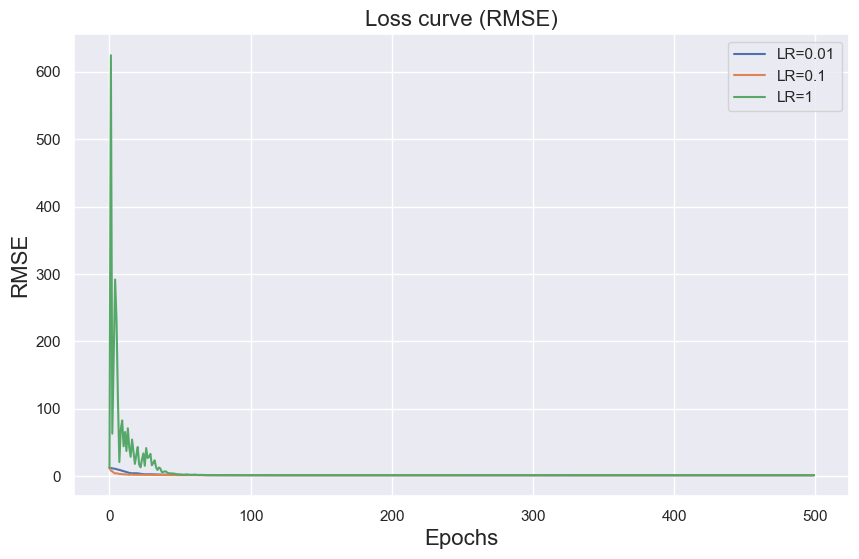

In [486]:

# Iterate over the results for each learning rate
fig, axes = plt.subplots(1, 1, figsize=(10, 6))
for idx, learning_rate in enumerate(lrs):
    learn_pro = learn_pro_all_lr[idx]
    axes.plot(learn_pro[:, 0], learn_pro[:, 1], label=f'LR={learning_rate}')

axes.set_title('Loss curve (RMSE)', size=16)
axes.set_xlabel('Epochs', size=16)
axes.set_ylabel('RMSE', size=16)
axes.legend()
plt.show()

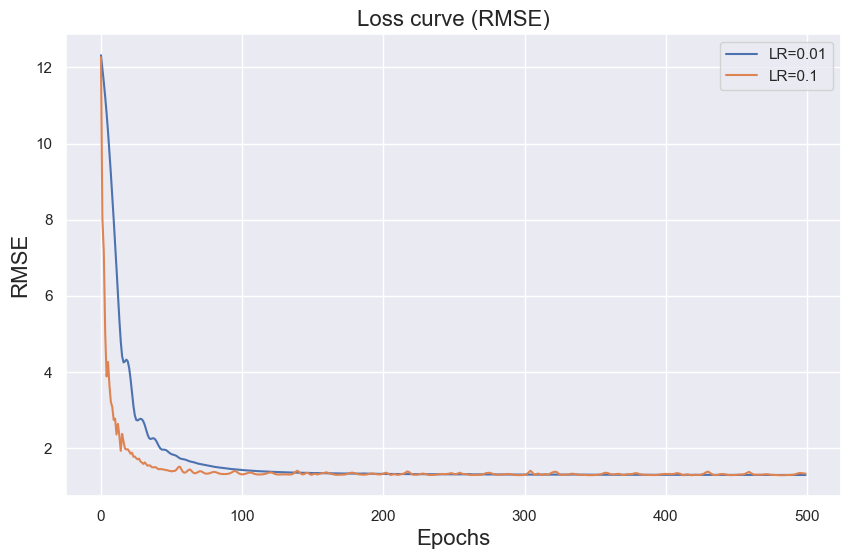

In [488]:

# Choose two learning rates you want to plot
selected_learning_rates = [0.01, 0.1]

fig, axes = plt.subplots(1, 1, figsize=(10, 6))
for idx, learning_rate in enumerate(lrs):
    if learning_rate in selected_learning_rates:
        learn_pro = learn_pro_all_lr[idx]
        axes.plot(learn_pro[:, 0], learn_pro[:, 1], label=f'LR={learning_rate}')

axes.set_title('Loss curve (RMSE)', size=16)
axes.set_xlabel('Epochs', size=16)
axes.set_ylabel('RMSE', size=16)
axes.legend()
plt.show()

# n_Hidden Dimensions

In [489]:



n_hidden_list = [16, 32, 64, 128, 256]
learn_pro_all_n_hidden = []

for n_hidden in n_hidden_list:

    # Set input dimension
    n_input = X_train_tensor.shape[1]
    
    # Set output dimension
    n_output = 1

    # Define Regression model with PyTorch
    class Net(nn.Module):
        def __init__(self,n_input,n_output,n_hidden):
            super().__init__()

            # Hidden layer
            self.l1 = nn.Linear(n_input,n_hidden)
            # Output layer
            self.l2 = nn.Linear(n_hidden,n_output)
            # ReLU func
            self.relu = nn.ReLU(inplace=True)

            self.features = nn.Sequential(
                self.l1,
                self.relu,
                self.l2
            )

        def forward(self,x):
            x = x.to(self.l1.weight.dtype)

            x1 = self.features(x)
            return x1
    
    
    # Learning rate
    lr = 0.1

    # Initialize instance
    net = Net(n_input, n_output, n_hidden).to(device)

    # Set loss func
    criterion = nn.MSELoss()

    # Set optimizer
    optimizer = optim.Adam(net.parameters(),lr=lr)

    # Set epochs
    num_epochs = 500

    # Create array to save learning process
    learn_pro = np.zeros((0,2))

    ## Iteration=================
    for epoch in range(num_epochs):
        train_loss = 0


           # Transfer data to GPU
        x = X_train_tensor.to(device)
        y = y_train_tensor.to(device)


        # Initialize grad
        optimizer.zero_grad()

        # Predict in train data
        y_pred = net(x)

        # Convert y to the same data type as y_predict
        y = y.type_as(y_pred)

        # Calculating loss
        loss = torch.sqrt(criterion(y_pred,y))# <- RMSE

        # clear the previous gradient from the optimizer
        optimizer.zero_grad()

        # Calculating grad
        loss.backward()

      # Modify params
        optimizer.step()
        learn_pro = np.vstack((learn_pro,np.array([epoch,loss.item()])))
        print(f'Epoch {epoch} loss: {loss.item():.5f}')


    learn_pro_all_n_hidden.append(learn_pro)



Epoch 0 loss: 12.54603
Epoch 1 loss: 10.76341
Epoch 2 loss: 7.99028
Epoch 3 loss: 5.79052
Epoch 4 loss: 6.26930
Epoch 5 loss: 5.59617
Epoch 6 loss: 3.88663
Epoch 7 loss: 3.38990
Epoch 8 loss: 3.96411
Epoch 9 loss: 4.02343
Epoch 10 loss: 3.47763
Epoch 11 loss: 2.87353
Epoch 12 loss: 2.88576
Epoch 13 loss: 3.17579
Epoch 14 loss: 2.93950
Epoch 15 loss: 2.51698
Epoch 16 loss: 2.49311
Epoch 17 loss: 2.52434
Epoch 18 loss: 2.34336
Epoch 19 loss: 2.20143
Epoch 20 loss: 2.19558
Epoch 21 loss: 2.16613
Epoch 22 loss: 2.09995
Epoch 23 loss: 2.04133
Epoch 24 loss: 1.98591
Epoch 25 loss: 1.95532
Epoch 26 loss: 1.97132
Epoch 27 loss: 1.89599
Epoch 28 loss: 1.79163
Epoch 29 loss: 1.82559
Epoch 30 loss: 1.84905
Epoch 31 loss: 1.77086
Epoch 32 loss: 1.73665
Epoch 33 loss: 1.75977
Epoch 34 loss: 1.71652
Epoch 35 loss: 1.68525
Epoch 36 loss: 1.69238
Epoch 37 loss: 1.67789
Epoch 38 loss: 1.63561
Epoch 39 loss: 1.61116
Epoch 40 loss: 1.62428
Epoch 41 loss: 1.62933
Epoch 42 loss: 1.58833
Epoch 43 loss: 1.57

Epoch 346 loss: 1.29443
Epoch 347 loss: 1.29329
Epoch 348 loss: 1.29309
Epoch 349 loss: 1.29350
Epoch 350 loss: 1.29440
Epoch 351 loss: 1.29560
Epoch 352 loss: 1.29652
Epoch 353 loss: 1.29700
Epoch 354 loss: 1.29654
Epoch 355 loss: 1.29576
Epoch 356 loss: 1.29435
Epoch 357 loss: 1.29321
Epoch 358 loss: 1.29215
Epoch 359 loss: 1.29161
Epoch 360 loss: 1.29141
Epoch 361 loss: 1.29154
Epoch 362 loss: 1.29188
Epoch 363 loss: 1.29224
Epoch 364 loss: 1.29256
Epoch 365 loss: 1.29271
Epoch 366 loss: 1.29273
Epoch 367 loss: 1.29255
Epoch 368 loss: 1.29229
Epoch 369 loss: 1.29194
Epoch 370 loss: 1.29160
Epoch 371 loss: 1.29129
Epoch 372 loss: 1.29113
Epoch 373 loss: 1.29121
Epoch 374 loss: 1.29174
Epoch 375 loss: 1.29334
Epoch 376 loss: 1.29677
Epoch 377 loss: 1.30596
Epoch 378 loss: 1.31950
Epoch 379 loss: 1.35100
Epoch 380 loss: 1.35310
Epoch 381 loss: 1.34727
Epoch 382 loss: 1.30711
Epoch 383 loss: 1.29272
Epoch 384 loss: 1.31050
Epoch 385 loss: 1.32240
Epoch 386 loss: 1.31393
Epoch 387 loss: 

Epoch 192 loss: 1.30235
Epoch 193 loss: 1.30238
Epoch 194 loss: 1.30267
Epoch 195 loss: 1.30365
Epoch 196 loss: 1.30611
Epoch 197 loss: 1.31265
Epoch 198 loss: 1.32681
Epoch 199 loss: 1.36056
Epoch 200 loss: 1.39344
Epoch 201 loss: 1.42806
Epoch 202 loss: 1.36488
Epoch 203 loss: 1.31843
Epoch 204 loss: 1.30634
Epoch 205 loss: 1.32193
Epoch 206 loss: 1.34075
Epoch 207 loss: 1.33345
Epoch 208 loss: 1.32594
Epoch 209 loss: 1.32019
Epoch 210 loss: 1.31363
Epoch 211 loss: 1.30718
Epoch 212 loss: 1.31095
Epoch 213 loss: 1.32280
Epoch 214 loss: 1.32116
Epoch 215 loss: 1.30947
Epoch 216 loss: 1.30045
Epoch 217 loss: 1.30341
Epoch 218 loss: 1.31105
Epoch 219 loss: 1.31198
Epoch 220 loss: 1.30793
Epoch 221 loss: 1.30360
Epoch 222 loss: 1.30285
Epoch 223 loss: 1.30325
Epoch 224 loss: 1.30337
Epoch 225 loss: 1.30308
Epoch 226 loss: 1.30292
Epoch 227 loss: 1.30330
Epoch 228 loss: 1.30303
Epoch 229 loss: 1.30223
Epoch 230 loss: 1.30053
Epoch 231 loss: 1.29936
Epoch 232 loss: 1.29896
Epoch 233 loss: 

Epoch 36 loss: 1.51060
Epoch 37 loss: 1.45745
Epoch 38 loss: 1.47437
Epoch 39 loss: 1.48186
Epoch 40 loss: 1.46733
Epoch 41 loss: 1.46779
Epoch 42 loss: 1.44805
Epoch 43 loss: 1.42440
Epoch 44 loss: 1.42765
Epoch 45 loss: 1.40945
Epoch 46 loss: 1.40585
Epoch 47 loss: 1.41247
Epoch 48 loss: 1.39706
Epoch 49 loss: 1.42173
Epoch 50 loss: 1.42775
Epoch 51 loss: 1.46650
Epoch 52 loss: 1.47199
Epoch 53 loss: 1.44074
Epoch 54 loss: 1.39870
Epoch 55 loss: 1.36635
Epoch 56 loss: 1.37540
Epoch 57 loss: 1.38296
Epoch 58 loss: 1.41312
Epoch 59 loss: 1.40991
Epoch 60 loss: 1.38757
Epoch 61 loss: 1.36302
Epoch 62 loss: 1.34834
Epoch 63 loss: 1.35722
Epoch 64 loss: 1.36536
Epoch 65 loss: 1.38321
Epoch 66 loss: 1.38026
Epoch 67 loss: 1.36631
Epoch 68 loss: 1.35196
Epoch 69 loss: 1.33742
Epoch 70 loss: 1.33823
Epoch 71 loss: 1.34020
Epoch 72 loss: 1.34891
Epoch 73 loss: 1.36053
Epoch 74 loss: 1.36392
Epoch 75 loss: 1.36651
Epoch 76 loss: 1.35762
Epoch 77 loss: 1.34696
Epoch 78 loss: 1.33945
Epoch 79 lo

Epoch 381 loss: 1.29789
Epoch 382 loss: 1.30862
Epoch 383 loss: 1.33840
Epoch 384 loss: 1.39885
Epoch 385 loss: 1.47045
Epoch 386 loss: 1.41258
Epoch 387 loss: 1.32975
Epoch 388 loss: 1.30403
Epoch 389 loss: 1.32773
Epoch 390 loss: 1.36077
Epoch 391 loss: 1.32431
Epoch 392 loss: 1.29525
Epoch 393 loss: 1.30516
Epoch 394 loss: 1.33103
Epoch 395 loss: 1.33766
Epoch 396 loss: 1.31522
Epoch 397 loss: 1.32237
Epoch 398 loss: 1.33954
Epoch 399 loss: 1.33750
Epoch 400 loss: 1.31610
Epoch 401 loss: 1.31686
Epoch 402 loss: 1.32401
Epoch 403 loss: 1.32115
Epoch 404 loss: 1.30567
Epoch 405 loss: 1.30409
Epoch 406 loss: 1.31002
Epoch 407 loss: 1.31113
Epoch 408 loss: 1.30278
Epoch 409 loss: 1.29871
Epoch 410 loss: 1.30301
Epoch 411 loss: 1.31009
Epoch 412 loss: 1.30940
Epoch 413 loss: 1.30734
Epoch 414 loss: 1.30834
Epoch 415 loss: 1.31662
Epoch 416 loss: 1.32191
Epoch 417 loss: 1.32734
Epoch 418 loss: 1.32249
Epoch 419 loss: 1.32168
Epoch 420 loss: 1.31837
Epoch 421 loss: 1.31639
Epoch 422 loss: 

Epoch 227 loss: 1.32227
Epoch 228 loss: 1.32679
Epoch 229 loss: 1.33220
Epoch 230 loss: 1.33062
Epoch 231 loss: 1.32948
Epoch 232 loss: 1.32355
Epoch 233 loss: 1.31977
Epoch 234 loss: 1.31639
Epoch 235 loss: 1.31772
Epoch 236 loss: 1.32446
Epoch 237 loss: 1.34393
Epoch 238 loss: 1.36416
Epoch 239 loss: 1.39389
Epoch 240 loss: 1.35959
Epoch 241 loss: 1.32439
Epoch 242 loss: 1.30141
Epoch 243 loss: 1.31122
Epoch 244 loss: 1.33679
Epoch 245 loss: 1.34122
Epoch 246 loss: 1.33842
Epoch 247 loss: 1.34212
Epoch 248 loss: 1.36352
Epoch 249 loss: 1.36762
Epoch 250 loss: 1.36490
Epoch 251 loss: 1.33736
Epoch 252 loss: 1.32651
Epoch 253 loss: 1.32225
Epoch 254 loss: 1.31296
Epoch 255 loss: 1.29822
Epoch 256 loss: 1.29714
Epoch 257 loss: 1.30625
Epoch 258 loss: 1.30830
Epoch 259 loss: 1.30668
Epoch 260 loss: 1.31094
Epoch 261 loss: 1.31910
Epoch 262 loss: 1.31794
Epoch 263 loss: 1.31609
Epoch 264 loss: 1.31323
Epoch 265 loss: 1.31123
Epoch 266 loss: 1.30729
Epoch 267 loss: 1.30595
Epoch 268 loss: 

Epoch 72 loss: 1.33839
Epoch 73 loss: 1.34084
Epoch 74 loss: 1.33823
Epoch 75 loss: 1.33030
Epoch 76 loss: 1.32868
Epoch 77 loss: 1.33163
Epoch 78 loss: 1.33057
Epoch 79 loss: 1.32881
Epoch 80 loss: 1.32357
Epoch 81 loss: 1.32054
Epoch 82 loss: 1.32092
Epoch 83 loss: 1.32132
Epoch 84 loss: 1.32202
Epoch 85 loss: 1.32444
Epoch 86 loss: 1.32394
Epoch 87 loss: 1.32586
Epoch 88 loss: 1.32759
Epoch 89 loss: 1.33167
Epoch 90 loss: 1.33834
Epoch 91 loss: 1.35070
Epoch 92 loss: 1.36728
Epoch 93 loss: 1.38627
Epoch 94 loss: 1.39461
Epoch 95 loss: 1.38909
Epoch 96 loss: 1.36709
Epoch 97 loss: 1.34522
Epoch 98 loss: 1.32739
Epoch 99 loss: 1.31655
Epoch 100 loss: 1.31057
Epoch 101 loss: 1.30762
Epoch 102 loss: 1.30641
Epoch 103 loss: 1.30661
Epoch 104 loss: 1.30756
Epoch 105 loss: 1.31025
Epoch 106 loss: 1.31570
Epoch 107 loss: 1.32643
Epoch 108 loss: 1.34722
Epoch 109 loss: 1.37882
Epoch 110 loss: 1.41636
Epoch 111 loss: 1.42326
Epoch 112 loss: 1.40061
Epoch 113 loss: 1.35851
Epoch 114 loss: 1.32

Epoch 415 loss: 1.30987
Epoch 416 loss: 1.31920
Epoch 417 loss: 1.32177
Epoch 418 loss: 1.32829
Epoch 419 loss: 1.33758
Epoch 420 loss: 1.35368
Epoch 421 loss: 1.35280
Epoch 422 loss: 1.35784
Epoch 423 loss: 1.35445
Epoch 424 loss: 1.35062
Epoch 425 loss: 1.32356
Epoch 426 loss: 1.30660
Epoch 427 loss: 1.30179
Epoch 428 loss: 1.30414
Epoch 429 loss: 1.30116
Epoch 430 loss: 1.29472
Epoch 431 loss: 1.29028
Epoch 432 loss: 1.29163
Epoch 433 loss: 1.29578
Epoch 434 loss: 1.29757
Epoch 435 loss: 1.29703
Epoch 436 loss: 1.29653
Epoch 437 loss: 1.30083
Epoch 438 loss: 1.31011
Epoch 439 loss: 1.32599
Epoch 440 loss: 1.33958
Epoch 441 loss: 1.35868
Epoch 442 loss: 1.36039
Epoch 443 loss: 1.36202
Epoch 444 loss: 1.34249
Epoch 445 loss: 1.32603
Epoch 446 loss: 1.30819
Epoch 447 loss: 1.29808
Epoch 448 loss: 1.29430
Epoch 449 loss: 1.29631
Epoch 450 loss: 1.30205
Epoch 451 loss: 1.31271
Epoch 452 loss: 1.32666
Epoch 453 loss: 1.34797
Epoch 454 loss: 1.35234
Epoch 455 loss: 1.34809
Epoch 456 loss: 

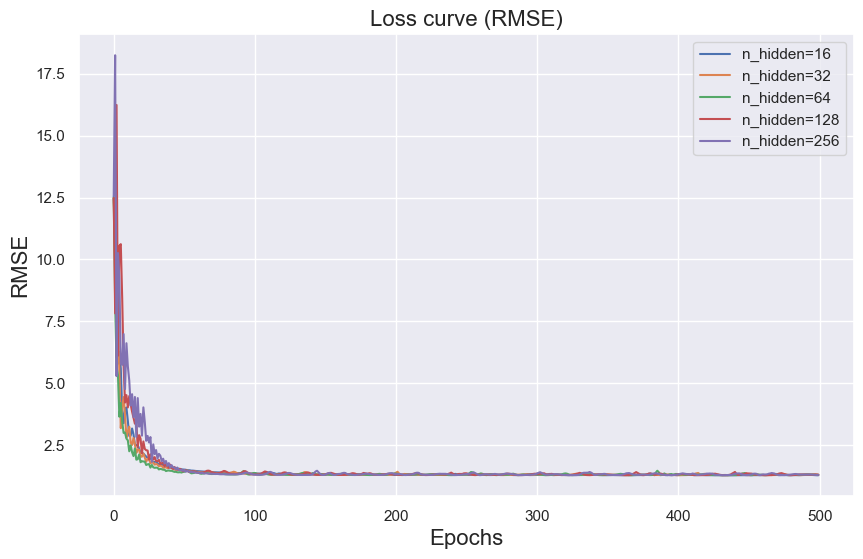

In [490]:

# Iterate over the results for each learning rate
fig, axes = plt.subplots(1, 1, figsize=(10, 6))
for idx, n_hidden in enumerate(n_hidden_list):
    learn_pro = learn_pro_all_n_hidden[idx]
    axes.plot(learn_pro[:, 0], learn_pro[:, 1], label=f'n_hidden={n_hidden}')

axes.set_title('Loss curve (RMSE)', size=16)
axes.set_xlabel('Epochs', size=16)
axes.set_ylabel('RMSE', size=16)
axes.legend()
plt.show()

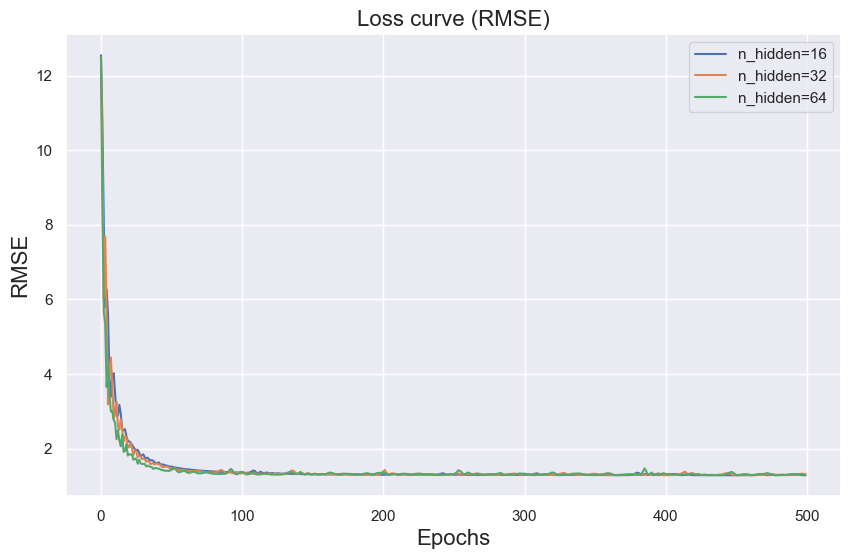

In [494]:

# Choose two learning rates you want to plot
selected_n_hidden = [16, 32, 64]

fig, axes = plt.subplots(1, 1, figsize=(10, 6))
for idx, n_hidden in enumerate(n_hidden_list):
    if n_hidden in selected_n_hidden:
        learn_pro = learn_pro_all_n_hidden[idx]
        axes.plot(learn_pro[:, 0], learn_pro[:, 1], label=f'n_hidden={n_hidden}')

axes.set_title('Loss curve (RMSE)', size=16)
axes.set_xlabel('Epochs', size=16)
axes.set_ylabel('RMSE', size=16)
axes.legend()
plt.show()

The figure layout has changed to tight


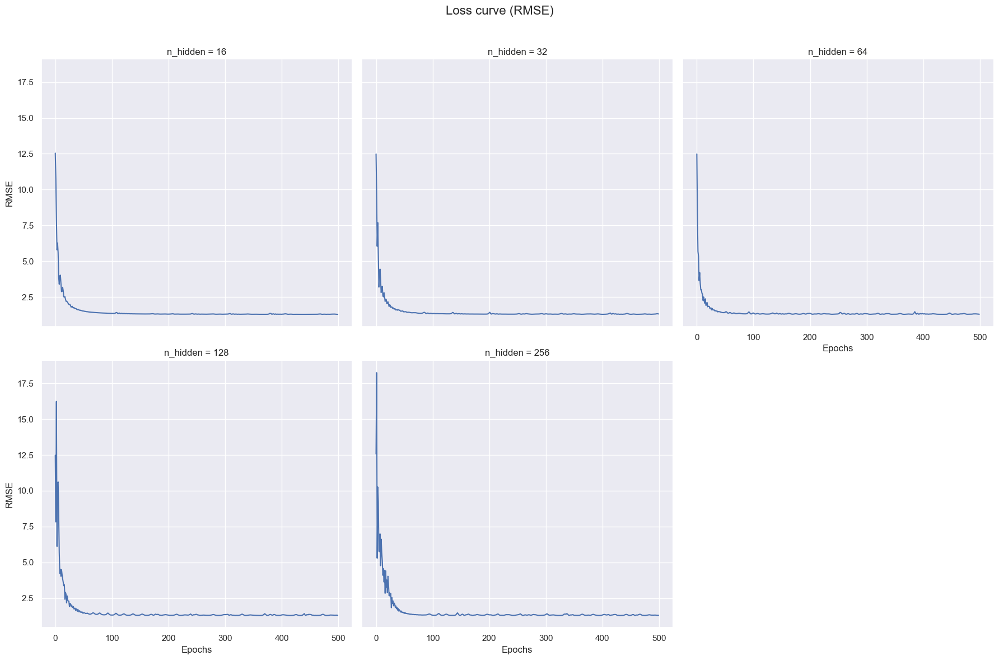

In [491]:
# Convert the results into a DataFrame
data = []
for idx, n_hidden in enumerate(n_hidden_list):
    learn_pro = learn_pro_all_n_hidden[idx]
    for epoch, rmse in learn_pro:
        data.append({'Epochs': epoch, 'RMSE': rmse, 'n_hidden': n_hidden})
df = pd.DataFrame(data)

# Create FacetGrid
g = sns.FacetGrid(df, col="n_hidden", col_wrap=3, height=6)
g.map(sns.lineplot, "Epochs", "RMSE")

# Adjust labels and title
g.set_titles(col_template="n_hidden = {col_name}")
g.set_axis_labels("Epochs", "RMSE")
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Loss curve (RMSE)', size=16)
plt.show()

In [495]:
# Learning rate
lr = 0.1

op1 = optim.Adam(net.parameters(), lr=lr) # The Adam algorithm (adaptive moment estimation)
op2 = optim.NAdam(net.parameters(), lr=lr) # The Adam algorithm with Nesterov momentum
op3 = optim.SGD(net.parameters(), lr=lr) # Stochastic gradient descent
op4 = optim.RMSprop(net.parameters(), lr=lr) # The RMSprop algorithm

ops = [op1, op2, op3, op4]

learn_pro_all_op = []

for optimizer in ops:
    # Initialize instance
    net = Net(n_input, n_output, n_hidden).to(device)

    # Set loss func
    criterion = nn.MSELoss()

    
    # Set epochs
    num_epochs = 500

    # Create array to save learning process
    learn_pro = np.zeros((0,2))

    ## Iteration=================
    for epoch in range(num_epochs):
        train_loss = 0
    
        
           # Transfer data to GPU
        x = X_train_tensor.to(device)
        y = y_train_tensor.to(device)

        # Initialize grad
        optimizer.zero_grad()

        # Predict in train data
        y_pred = net(x)

        # Convert y to the same data type as y_predict
        y = y.type_as(y_pred)

        # Calculating loss
        loss = torch.sqrt(criterion(y_pred,y))# <- RMSE

        # clear the previous gradient from the optimizer
        optimizer.zero_grad()

        # Calculating grad
        loss.backward()

        # Modify params
        optimizer.step()
        learn_pro = np.vstack((learn_pro,np.array([epoch,loss.item()])))
        print(f'Epoch {epoch} loss: {loss.item():.5f}')
    
    learn_pro_all_op.append(learn_pro)


Using a target size (torch.Size([24804])) that is different to the input size (torch.Size([24804, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.


Epoch 0 loss: 12.40687
Epoch 1 loss: 12.40687
Epoch 2 loss: 12.40687
Epoch 3 loss: 12.40687
Epoch 4 loss: 12.40687
Epoch 5 loss: 12.40687
Epoch 6 loss: 12.40687
Epoch 7 loss: 12.40687
Epoch 8 loss: 12.40687
Epoch 9 loss: 12.40687
Epoch 10 loss: 12.40687
Epoch 11 loss: 12.40687
Epoch 12 loss: 12.40687
Epoch 13 loss: 12.40687
Epoch 14 loss: 12.40687
Epoch 15 loss: 12.40687
Epoch 16 loss: 12.40687
Epoch 17 loss: 12.40687
Epoch 18 loss: 12.40687
Epoch 19 loss: 12.40687
Epoch 20 loss: 12.40687
Epoch 21 loss: 12.40687
Epoch 22 loss: 12.40687
Epoch 23 loss: 12.40687
Epoch 24 loss: 12.40687
Epoch 25 loss: 12.40687
Epoch 26 loss: 12.40687
Epoch 27 loss: 12.40687
Epoch 28 loss: 12.40687
Epoch 29 loss: 12.40687
Epoch 30 loss: 12.40687
Epoch 31 loss: 12.40687
Epoch 32 loss: 12.40687
Epoch 33 loss: 12.40687
Epoch 34 loss: 12.40687
Epoch 35 loss: 12.40687
Epoch 36 loss: 12.40687
Epoch 37 loss: 12.40687
Epoch 38 loss: 12.40687
Epoch 39 loss: 12.40687
Epoch 40 loss: 12.40687
Epoch 41 loss: 12.40687
Ep

Epoch 333 loss: 12.40687
Epoch 334 loss: 12.40687
Epoch 335 loss: 12.40687
Epoch 336 loss: 12.40687
Epoch 337 loss: 12.40687
Epoch 338 loss: 12.40687
Epoch 339 loss: 12.40687
Epoch 340 loss: 12.40687
Epoch 341 loss: 12.40687
Epoch 342 loss: 12.40687
Epoch 343 loss: 12.40687
Epoch 344 loss: 12.40687
Epoch 345 loss: 12.40687
Epoch 346 loss: 12.40687
Epoch 347 loss: 12.40687
Epoch 348 loss: 12.40687
Epoch 349 loss: 12.40687
Epoch 350 loss: 12.40687
Epoch 351 loss: 12.40687
Epoch 352 loss: 12.40687
Epoch 353 loss: 12.40687
Epoch 354 loss: 12.40687
Epoch 355 loss: 12.40687
Epoch 356 loss: 12.40687
Epoch 357 loss: 12.40687
Epoch 358 loss: 12.40687
Epoch 359 loss: 12.40687
Epoch 360 loss: 12.40687
Epoch 361 loss: 12.40687
Epoch 362 loss: 12.40687
Epoch 363 loss: 12.40687
Epoch 364 loss: 12.40687
Epoch 365 loss: 12.40687
Epoch 366 loss: 12.40687
Epoch 367 loss: 12.40687
Epoch 368 loss: 12.40687
Epoch 369 loss: 12.40687
Epoch 370 loss: 12.40687
Epoch 371 loss: 12.40687
Epoch 372 loss: 12.40687


Epoch 166 loss: 12.39155
Epoch 167 loss: 12.39155
Epoch 168 loss: 12.39155
Epoch 169 loss: 12.39155
Epoch 170 loss: 12.39155
Epoch 171 loss: 12.39155
Epoch 172 loss: 12.39155
Epoch 173 loss: 12.39155
Epoch 174 loss: 12.39155
Epoch 175 loss: 12.39155
Epoch 176 loss: 12.39155
Epoch 177 loss: 12.39155
Epoch 178 loss: 12.39155
Epoch 179 loss: 12.39155
Epoch 180 loss: 12.39155
Epoch 181 loss: 12.39155
Epoch 182 loss: 12.39155
Epoch 183 loss: 12.39155
Epoch 184 loss: 12.39155
Epoch 185 loss: 12.39155
Epoch 186 loss: 12.39155
Epoch 187 loss: 12.39155
Epoch 188 loss: 12.39155
Epoch 189 loss: 12.39155
Epoch 190 loss: 12.39155
Epoch 191 loss: 12.39155
Epoch 192 loss: 12.39155
Epoch 193 loss: 12.39155
Epoch 194 loss: 12.39155
Epoch 195 loss: 12.39155
Epoch 196 loss: 12.39155
Epoch 197 loss: 12.39155
Epoch 198 loss: 12.39155
Epoch 199 loss: 12.39155
Epoch 200 loss: 12.39155
Epoch 201 loss: 12.39155
Epoch 202 loss: 12.39155
Epoch 203 loss: 12.39155
Epoch 204 loss: 12.39155
Epoch 205 loss: 12.39155


Epoch 494 loss: 12.39155
Epoch 495 loss: 12.39155
Epoch 496 loss: 12.39155
Epoch 497 loss: 12.39155
Epoch 498 loss: 12.39155
Epoch 499 loss: 12.39155
Epoch 0 loss: 12.27013
Epoch 1 loss: 12.27013
Epoch 2 loss: 12.27013
Epoch 3 loss: 12.27013
Epoch 4 loss: 12.27013
Epoch 5 loss: 12.27013
Epoch 6 loss: 12.27013
Epoch 7 loss: 12.27013
Epoch 8 loss: 12.27013
Epoch 9 loss: 12.27013
Epoch 10 loss: 12.27013
Epoch 11 loss: 12.27013
Epoch 12 loss: 12.27013
Epoch 13 loss: 12.27013
Epoch 14 loss: 12.27013
Epoch 15 loss: 12.27013
Epoch 16 loss: 12.27013
Epoch 17 loss: 12.27013
Epoch 18 loss: 12.27013
Epoch 19 loss: 12.27013
Epoch 20 loss: 12.27013
Epoch 21 loss: 12.27013
Epoch 22 loss: 12.27013
Epoch 23 loss: 12.27013
Epoch 24 loss: 12.27013
Epoch 25 loss: 12.27013
Epoch 26 loss: 12.27013
Epoch 27 loss: 12.27013
Epoch 28 loss: 12.27013
Epoch 29 loss: 12.27013
Epoch 30 loss: 12.27013
Epoch 31 loss: 12.27013
Epoch 32 loss: 12.27013
Epoch 33 loss: 12.27013
Epoch 34 loss: 12.27013
Epoch 35 loss: 12.27

Epoch 327 loss: 12.27013
Epoch 328 loss: 12.27013
Epoch 329 loss: 12.27013
Epoch 330 loss: 12.27013
Epoch 331 loss: 12.27013
Epoch 332 loss: 12.27013
Epoch 333 loss: 12.27013
Epoch 334 loss: 12.27013
Epoch 335 loss: 12.27013
Epoch 336 loss: 12.27013
Epoch 337 loss: 12.27013
Epoch 338 loss: 12.27013
Epoch 339 loss: 12.27013
Epoch 340 loss: 12.27013
Epoch 341 loss: 12.27013
Epoch 342 loss: 12.27013
Epoch 343 loss: 12.27013
Epoch 344 loss: 12.27013
Epoch 345 loss: 12.27013
Epoch 346 loss: 12.27013
Epoch 347 loss: 12.27013
Epoch 348 loss: 12.27013
Epoch 349 loss: 12.27013
Epoch 350 loss: 12.27013
Epoch 351 loss: 12.27013
Epoch 352 loss: 12.27013
Epoch 353 loss: 12.27013
Epoch 354 loss: 12.27013
Epoch 355 loss: 12.27013
Epoch 356 loss: 12.27013
Epoch 357 loss: 12.27013
Epoch 358 loss: 12.27013
Epoch 359 loss: 12.27013
Epoch 360 loss: 12.27013
Epoch 361 loss: 12.27013
Epoch 362 loss: 12.27013
Epoch 363 loss: 12.27013
Epoch 364 loss: 12.27013
Epoch 365 loss: 12.27013
Epoch 366 loss: 12.27013


Epoch 160 loss: 12.41385
Epoch 161 loss: 12.41385
Epoch 162 loss: 12.41385
Epoch 163 loss: 12.41385
Epoch 164 loss: 12.41385
Epoch 165 loss: 12.41385
Epoch 166 loss: 12.41385
Epoch 167 loss: 12.41385
Epoch 168 loss: 12.41385
Epoch 169 loss: 12.41385
Epoch 170 loss: 12.41385
Epoch 171 loss: 12.41385
Epoch 172 loss: 12.41385
Epoch 173 loss: 12.41385
Epoch 174 loss: 12.41385
Epoch 175 loss: 12.41385
Epoch 176 loss: 12.41385
Epoch 177 loss: 12.41385
Epoch 178 loss: 12.41385
Epoch 179 loss: 12.41385
Epoch 180 loss: 12.41385
Epoch 181 loss: 12.41385
Epoch 182 loss: 12.41385
Epoch 183 loss: 12.41385
Epoch 184 loss: 12.41385
Epoch 185 loss: 12.41385
Epoch 186 loss: 12.41385
Epoch 187 loss: 12.41385
Epoch 188 loss: 12.41385
Epoch 189 loss: 12.41385
Epoch 190 loss: 12.41385
Epoch 191 loss: 12.41385
Epoch 192 loss: 12.41385
Epoch 193 loss: 12.41385
Epoch 194 loss: 12.41385
Epoch 195 loss: 12.41385
Epoch 196 loss: 12.41385
Epoch 197 loss: 12.41385
Epoch 198 loss: 12.41385
Epoch 199 loss: 12.41385


Epoch 488 loss: 12.41385
Epoch 489 loss: 12.41385
Epoch 490 loss: 12.41385
Epoch 491 loss: 12.41385
Epoch 492 loss: 12.41385
Epoch 493 loss: 12.41385
Epoch 494 loss: 12.41385
Epoch 495 loss: 12.41385
Epoch 496 loss: 12.41385
Epoch 497 loss: 12.41385
Epoch 498 loss: 12.41385
Epoch 499 loss: 12.41385


# Number of Layers

In [501]:

# Define Regression model with PyTorch
class Net3(nn.Module):
    def __init__(self,n_input,n_output,n_hidden):
        super().__init__()
        
        # Hidden layer
        self.l1 = nn.Linear(n_input,n_hidden)
        # Hidden layer
        self.l2 = nn.Linear(n_hidden,n_hidden)
        # Output layer
        self.l3 = nn.Linear(n_hidden,n_output)
        # ReLU func
        self.relu = nn.ReLU(inplace=True)

        self.features = nn.Sequential(
            self.l1,
            self.relu,
            self.l2,
            self.relu,
            self.l3
        )
        
    def forward(self,x):
        x = x.to(self.l1.weight.dtype)
        
        x1 = self.features(x)
        return x1
    
    
# Define Regression model with PyTorch
class Net5(nn.Module):
    def __init__(self,n_input,n_output,n_hidden):
        super().__init__()
        
        # Hidden layer
        self.l1 = nn.Linear(n_input,n_hidden)
        # Hidden layer
        self.l2 = nn.Linear(n_hidden,n_hidden)
        # Hidden layer
        self.l3 = nn.Linear(n_hidden,n_hidden)
        # Hidden layer
        self.l4 = nn.Linear(n_hidden,n_hidden)
        # Output layer
        self.l5 = nn.Linear(n_hidden,n_output)
        # ReLU func
        self.relu = nn.ReLU(inplace=True)

        self.features = nn.Sequential(
            self.l1,
            self.relu,
            self.l2,
            self.relu,
            self.l3,
            self.relu,
            self.l4,
            self.relu,
            self.l5
        )
        
    def forward(self,x):
        x = x.to(self.l1.weight.dtype)
        
        x1 = self.features(x)
        return x1
    
    
# Define Regression model with PyTorch
class Net10(nn.Module):
    def __init__(self,n_input,n_output,n_hidden):
        super().__init__()
        
        # Hidden layer
        self.l1 = nn.Linear(n_input,n_hidden)
        # Hidden layer
        self.l2 = nn.Linear(n_hidden,n_hidden)
        # Hidden layer
        self.l3 = nn.Linear(n_hidden,n_hidden)
        # Hidden layer
        self.l4 = nn.Linear(n_hidden,n_hidden)
        # Hidden layer
        self.l5 = nn.Linear(n_hidden,n_hidden)
        # Hidden layer
        self.l6 = nn.Linear(n_hidden,n_hidden)
        # Hidden layer
        self.l7 = nn.Linear(n_hidden,n_hidden)
        # Hidden layer
        self.l8 = nn.Linear(n_hidden,n_hidden)
        # Hidden layer
        self.l9 = nn.Linear(n_hidden,n_hidden)
        # Output layer
        self.l10 = nn.Linear(n_hidden,n_output)
        # ReLU func
        self.relu = nn.ReLU(inplace=True)

        self.features = nn.Sequential(
            self.l1,
            self.relu,
            self.l2,
            self.relu,
            self.l3,
            self.relu,
            self.l4,
            self.relu,
            self.l5,
            self.relu,
            self.l6,
            self.relu,
            self.l7,
            self.relu,
            self.l8,
            self.relu,
            self.l9,
            self.relu,
            self.l10,
        )
        
    def forward(self,x):
        x = x.to(self.l1.weight.dtype)
        
        x1 = self.features(x)
        return x1

In [503]:
# Learning rate
lr = 0.1

nets = [Net(n_input, n_output, n_hidden).to(device), 
        Net3(n_input, n_output, n_hidden).to(device), 
        Net5(n_input, n_output, n_hidden).to(device), 
        Net10(n_input, n_output, n_hidden).to(device)]

learn_pro_all_nets = []

for nt in nets:
    # Initialize instance
    net = nt

    # Set loss func
    criterion = nn.MSELoss()

    # Set optimizer
    optimizer = optim.Adam(net.parameters(),lr=lr)

    # Set epochs
    num_epochs = 500

    # Create array to save learning process
    learn_pro = np.zeros((0,2))

    ## Iteration=================
    for epoch in range(num_epochs):
        train_loss = 0
    
        

        # Transfer data to GPU
        x = X_train_tensor.to(device)
        y = y_train_tensor.to(device)


        # Initialize grad
        optimizer.zero_grad()

        # Predict in train data
        y_pred = net(x)

        # Convert y to the same data type as y_predict
        y = y.type_as(y_pred)

        # Calculating loss
        loss = torch.sqrt(criterion(y_pred,y))# <- RMSE

        # clear the previous gradient from the optimizer
        optimizer.zero_grad()

        # Calculating grad
        loss.backward()

        # Modify params
        optimizer.step()
        learn_pro = np.vstack((learn_pro,np.array([epoch,loss.item()])))
        print(f'Epoch {epoch} loss: {loss.item():.5f}')
    
    learn_pro_all_nets.append(learn_pro)


Epoch 0 loss: 12.33758
Epoch 1 loss: 7.97919
Epoch 2 loss: 6.83321
Epoch 3 loss: 4.67873
Epoch 4 loss: 3.94069
Epoch 5 loss: 4.33846
Epoch 6 loss: 3.17857
Epoch 7 loss: 3.42351
Epoch 8 loss: 3.40347
Epoch 9 loss: 2.62274
Epoch 10 loss: 2.76850
Epoch 11 loss: 2.75640
Epoch 12 loss: 2.35831
Epoch 13 loss: 2.43520
Epoch 14 loss: 2.23545
Epoch 15 loss: 2.12876
Epoch 16 loss: 2.23828
Epoch 17 loss: 2.01658
Epoch 18 loss: 2.00771
Epoch 19 loss: 1.95191
Epoch 20 loss: 1.78310
Epoch 21 loss: 1.99230
Epoch 22 loss: 1.87591
Epoch 23 loss: 1.67377
Epoch 24 loss: 1.80827
Epoch 25 loss: 1.70207
Epoch 26 loss: 1.69180
Epoch 27 loss: 1.70609
Epoch 28 loss: 1.64837
Epoch 29 loss: 1.61471
Epoch 30 loss: 1.58586
Epoch 31 loss: 1.61626
Epoch 32 loss: 1.54892
Epoch 33 loss: 1.57106
Epoch 34 loss: 1.52290
Epoch 35 loss: 1.51272
Epoch 36 loss: 1.52844
Epoch 37 loss: 1.47366
Epoch 38 loss: 1.49644
Epoch 39 loss: 1.46773
Epoch 40 loss: 1.46455
Epoch 41 loss: 1.46101
Epoch 42 loss: 1.45410
Epoch 43 loss: 1.423

Epoch 346 loss: 1.31105
Epoch 347 loss: 1.31985
Epoch 348 loss: 1.31651
Epoch 349 loss: 1.30501
Epoch 350 loss: 1.29764
Epoch 351 loss: 1.30128
Epoch 352 loss: 1.30897
Epoch 353 loss: 1.31484
Epoch 354 loss: 1.31178
Epoch 355 loss: 1.31198
Epoch 356 loss: 1.31808
Epoch 357 loss: 1.33339
Epoch 358 loss: 1.34028
Epoch 359 loss: 1.34657
Epoch 360 loss: 1.33394
Epoch 361 loss: 1.32611
Epoch 362 loss: 1.31701
Epoch 363 loss: 1.31224
Epoch 364 loss: 1.30659
Epoch 365 loss: 1.30203
Epoch 366 loss: 1.29649
Epoch 367 loss: 1.29258
Epoch 368 loss: 1.29022
Epoch 369 loss: 1.28970
Epoch 370 loss: 1.29065
Epoch 371 loss: 1.29246
Epoch 372 loss: 1.29482
Epoch 373 loss: 1.29684
Epoch 374 loss: 1.29924
Epoch 375 loss: 1.30081
Epoch 376 loss: 1.30321
Epoch 377 loss: 1.30547
Epoch 378 loss: 1.31005
Epoch 379 loss: 1.31628
Epoch 380 loss: 1.32965
Epoch 381 loss: 1.34281
Epoch 382 loss: 1.36766
Epoch 383 loss: 1.37034
Epoch 384 loss: 1.37052
Epoch 385 loss: 1.34897
Epoch 386 loss: 1.32187
Epoch 387 loss: 

Epoch 192 loss: 1.33712
Epoch 193 loss: 1.33313
Epoch 194 loss: 1.32860
Epoch 195 loss: 1.32781
Epoch 196 loss: 1.32692
Epoch 197 loss: 1.32933
Epoch 198 loss: 1.33150
Epoch 199 loss: 1.33831
Epoch 200 loss: 1.34314
Epoch 201 loss: 1.35496
Epoch 202 loss: 1.35757
Epoch 203 loss: 1.36686
Epoch 204 loss: 1.35857
Epoch 205 loss: 1.35676
Epoch 206 loss: 1.34391
Epoch 207 loss: 1.33789
Epoch 208 loss: 1.32960
Epoch 209 loss: 1.32615
Epoch 210 loss: 1.32266
Epoch 211 loss: 1.32212
Epoch 212 loss: 1.32169
Epoch 213 loss: 1.32396
Epoch 214 loss: 1.32625
Epoch 215 loss: 1.33265
Epoch 216 loss: 1.33779
Epoch 217 loss: 1.34929
Epoch 218 loss: 1.35295
Epoch 219 loss: 1.36339
Epoch 220 loss: 1.35652
Epoch 221 loss: 1.35588
Epoch 222 loss: 1.34290
Epoch 223 loss: 1.33676
Epoch 224 loss: 1.32781
Epoch 225 loss: 1.32388
Epoch 226 loss: 1.31994
Epoch 227 loss: 1.31898
Epoch 228 loss: 1.31818
Epoch 229 loss: 1.31985
Epoch 230 loss: 1.32162
Epoch 231 loss: 1.32693
Epoch 232 loss: 1.33148
Epoch 233 loss: 

Epoch 35 loss: 3.39775
Epoch 36 loss: 3.11605
Epoch 37 loss: 3.34228
Epoch 38 loss: 2.87184
Epoch 39 loss: 2.87924
Epoch 40 loss: 2.54999
Epoch 41 loss: 2.68774
Epoch 42 loss: 2.63569
Epoch 43 loss: 2.58211
Epoch 44 loss: 2.58862
Epoch 45 loss: 2.30741
Epoch 46 loss: 2.34183
Epoch 47 loss: 2.22457
Epoch 48 loss: 2.20356
Epoch 49 loss: 2.25132
Epoch 50 loss: 2.10352
Epoch 51 loss: 2.10256
Epoch 52 loss: 2.08230
Epoch 53 loss: 1.96874
Epoch 54 loss: 2.04093
Epoch 55 loss: 2.04062
Epoch 56 loss: 1.89300
Epoch 57 loss: 1.94724
Epoch 58 loss: 1.96258
Epoch 59 loss: 1.80944
Epoch 60 loss: 1.89943
Epoch 61 loss: 1.96199
Epoch 62 loss: 1.75304
Epoch 63 loss: 1.85073
Epoch 64 loss: 1.93858
Epoch 65 loss: 1.70403
Epoch 66 loss: 1.89158
Epoch 67 loss: 1.92295
Epoch 68 loss: 1.67121
Epoch 69 loss: 2.02284
Epoch 70 loss: 1.82569
Epoch 71 loss: 1.73084
Epoch 72 loss: 2.00575
Epoch 73 loss: 1.65294
Epoch 74 loss: 1.76300
Epoch 75 loss: 1.71822
Epoch 76 loss: 1.60330
Epoch 77 loss: 1.71475
Epoch 78 lo

Epoch 380 loss: 1.29373
Epoch 381 loss: 1.29367
Epoch 382 loss: 1.29362
Epoch 383 loss: 1.29357
Epoch 384 loss: 1.29351
Epoch 385 loss: 1.29346
Epoch 386 loss: 1.29341
Epoch 387 loss: 1.29335
Epoch 388 loss: 1.29330
Epoch 389 loss: 1.29325
Epoch 390 loss: 1.29320
Epoch 391 loss: 1.29315
Epoch 392 loss: 1.29310
Epoch 393 loss: 1.29304
Epoch 394 loss: 1.29299
Epoch 395 loss: 1.29294
Epoch 396 loss: 1.29289
Epoch 397 loss: 1.29284
Epoch 398 loss: 1.29280
Epoch 399 loss: 1.29275
Epoch 400 loss: 1.29270
Epoch 401 loss: 1.29265
Epoch 402 loss: 1.29260
Epoch 403 loss: 1.29255
Epoch 404 loss: 1.29251
Epoch 405 loss: 1.29246
Epoch 406 loss: 1.29241
Epoch 407 loss: 1.29236
Epoch 408 loss: 1.29232
Epoch 409 loss: 1.29227
Epoch 410 loss: 1.29222
Epoch 411 loss: 1.29218
Epoch 412 loss: 1.29213
Epoch 413 loss: 1.29209
Epoch 414 loss: 1.29204
Epoch 415 loss: 1.29200
Epoch 416 loss: 1.29195
Epoch 417 loss: 1.29191
Epoch 418 loss: 1.29187
Epoch 419 loss: 1.29182
Epoch 420 loss: 1.29178
Epoch 421 loss: 

Epoch 226 loss: 1.28441
Epoch 227 loss: 1.28441
Epoch 228 loss: 1.28441
Epoch 229 loss: 1.28441
Epoch 230 loss: 1.28441
Epoch 231 loss: 1.28441
Epoch 232 loss: 1.28441
Epoch 233 loss: 1.28441
Epoch 234 loss: 1.28441
Epoch 235 loss: 1.28441
Epoch 236 loss: 1.28441
Epoch 237 loss: 1.28441
Epoch 238 loss: 1.28441
Epoch 239 loss: 1.28441
Epoch 240 loss: 1.28441
Epoch 241 loss: 1.28441
Epoch 242 loss: 1.28441
Epoch 243 loss: 1.28441
Epoch 244 loss: 1.28441
Epoch 245 loss: 1.28441
Epoch 246 loss: 1.28441
Epoch 247 loss: 1.28441
Epoch 248 loss: 1.28441
Epoch 249 loss: 1.28441
Epoch 250 loss: 1.28441
Epoch 251 loss: 1.28441
Epoch 252 loss: 1.28441
Epoch 253 loss: 1.28441
Epoch 254 loss: 1.28441
Epoch 255 loss: 1.28441
Epoch 256 loss: 1.28441
Epoch 257 loss: 1.28441
Epoch 258 loss: 1.28441
Epoch 259 loss: 1.28441
Epoch 260 loss: 1.28441
Epoch 261 loss: 1.28441
Epoch 262 loss: 1.28441
Epoch 263 loss: 1.28441
Epoch 264 loss: 1.28441
Epoch 265 loss: 1.28441
Epoch 266 loss: 1.28441
Epoch 267 loss: 

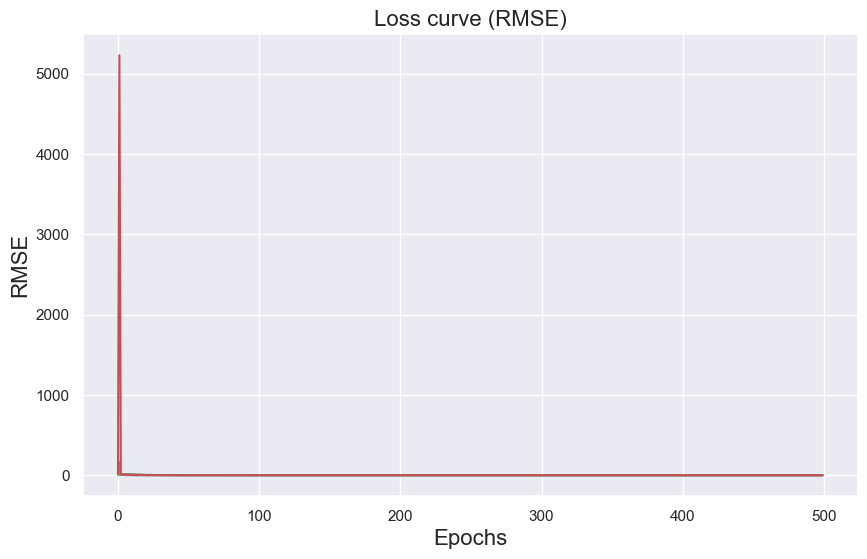

In [505]:

# Iterate over the results for each learning rate
fig, axes = plt.subplots(1, 1, figsize=(10, 6))
for idx, net in enumerate(nets):
    learn_pro = learn_pro_all_nets[idx]
    axes.plot(learn_pro[:, 0], learn_pro[:, 1], label=f'Net={net}')

axes.set_title('Loss curve (RMSE)', size=16)
axes.set_xlabel('Epochs', size=16)
axes.set_ylabel('RMSE', size=16)
#axes.legend()
plt.show()

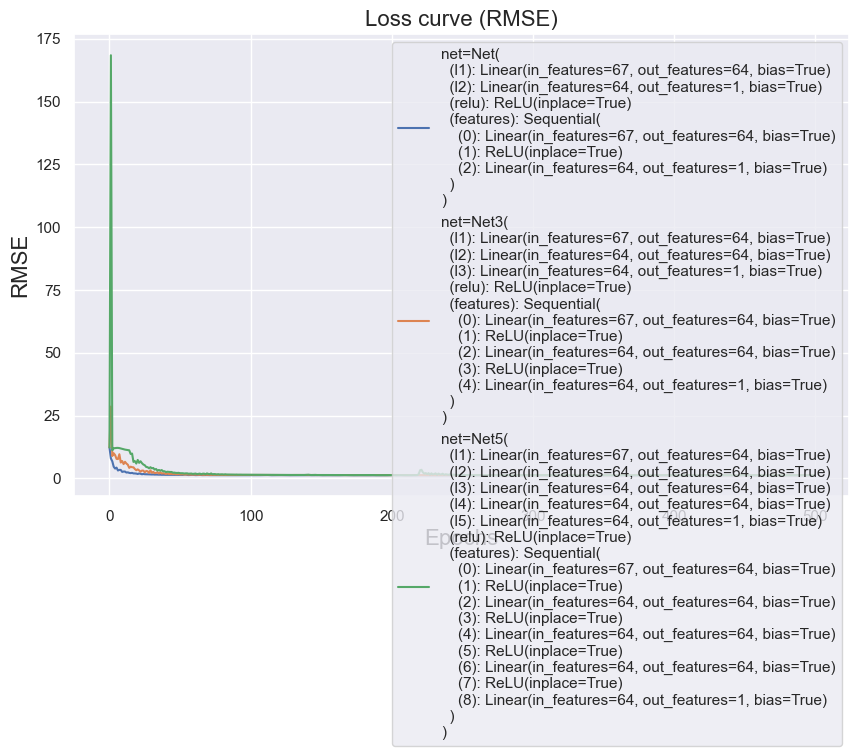

In [510]:
selected_nets = [Net(n_input, n_output, n_hidden).to(device), 
                 Net3(n_input, n_output, n_hidden).to(device),
                 Net5(n_input, n_output, n_hidden).to(device)]

fig, axes = plt.subplots(1, 1, figsize=(10, 6))
for idx, net in enumerate(selected_nets):
    for idx_net, net_all in enumerate(nets):
        if isinstance(net_all, type(net)):
            learn_pro = learn_pro_all_nets[idx_net]
            axes.plot(learn_pro[:, 0], learn_pro[:, 1], label=f'net={net}')

axes.set_title('Loss curve (RMSE)', size=16)
axes.set_xlabel('Epochs', size=16)
axes.set_ylabel('RMSE', size=16)
axes.legend()
plt.show()

The figure layout has changed to tight


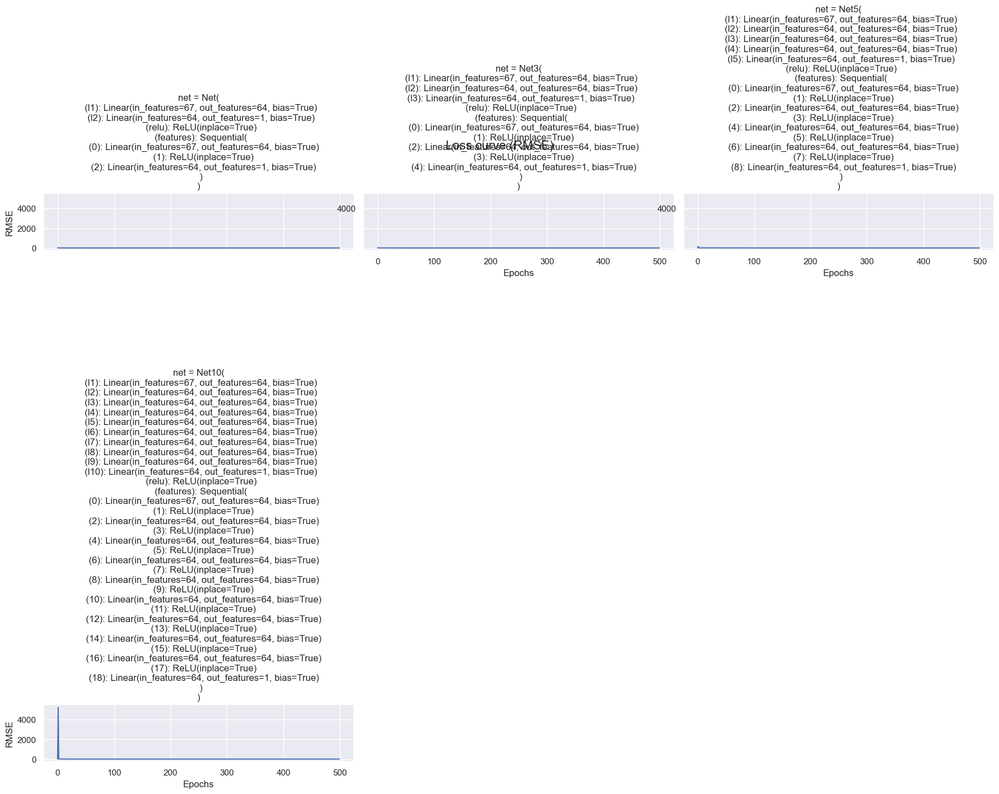

In [506]:
# Convert the results into a DataFrame
data = []
for idx, net in enumerate(nets):
    learn_pro = learn_pro_all_nets[idx]
    for epoch, rmse in learn_pro:
        data.append({'Epochs': epoch, 'RMSE': rmse, 'net': net})
df = pd.DataFrame(data)

# Create FacetGrid
g = sns.FacetGrid(df, col="net", col_wrap=3, height=6)
g.map(sns.lineplot, "Epochs", "RMSE")

# Adjust labels and title
g.set_titles(col_template="net = {col_name}")
g.set_axis_labels("Epochs", "RMSE")
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Loss curve (RMSE)', size=16)
plt.show()

# REVAMP 1

In [423]:
class Net(nn.Module):
    def __init__(self, n_input, n_hidden, n_output):
        super(Net, self).__init__()
        
        self.layer1 = nn.Linear(n_input, n_hidden)
        self.layer2 = nn.Linear(n_hidden, n_hidden)
        self.out = nn.Linear(n_hidden, n_output)
        
    def forward(self, x):
        x = self.layer1(x)
        x = x.to(torch.float)
        x = nn.ReLU(x)
        x = self.layer2(x)
        x = nn.ReLU(x)
        x = self.out(x)
        return x
    


In [424]:
n_hidden = 64  
net = Net(n_input,n_hidden,n_output)
list(net.parameters())

[Parameter containing:
 tensor([[ 0.0832, -0.0704,  0.0125,  ...,  0.1206, -0.0195, -0.0089],
         [ 0.0011,  0.0828,  0.0249,  ...,  0.0660,  0.0935, -0.1156],
         [-0.0712, -0.0063, -0.1032,  ..., -0.0656,  0.1009,  0.1027],
         ...,
         [ 0.0003, -0.0681,  0.0716,  ...,  0.0224,  0.0977,  0.0735],
         [-0.0631,  0.0298, -0.0979,  ..., -0.0101,  0.0463,  0.0106],
         [-0.1107,  0.0244,  0.0733,  ..., -0.0743,  0.0461,  0.0380]],
        requires_grad=True),
 Parameter containing:
 tensor([ 0.0524,  0.0802,  0.1146,  0.0180,  0.0688, -0.1002,  0.0152,  0.0773,
         -0.0026,  0.0757, -0.0055,  0.0768,  0.0644, -0.0362, -0.0062, -0.1094,
          0.0675, -0.0264, -0.0826, -0.0439, -0.0874,  0.0951,  0.0167, -0.0803,
         -0.1063, -0.0270,  0.1184,  0.0329,  0.1177,  0.0731,  0.0113, -0.1098,
          0.0861, -0.0807, -0.0780,  0.0043,  0.0796, -0.0799, -0.0581,  0.1113,
          0.0654, -0.0086,  0.0866, -0.1170,  0.0513, -0.0281, -0.0399, -0.1177

In [425]:
for i in range(len(list(net.parameters()))):
    print(list(net.parameters())[i].shape)

torch.Size([64, 67])
torch.Size([64])
torch.Size([64, 64])
torch.Size([64])
torch.Size([1, 64])
torch.Size([1])


In [443]:
lr = 0.01

optimizer = optim.Adam(net.parameters(), lr=lr) # The Adam algorithm (adaptive moment estimation)
criterion = nn.MSELoss()


In [452]:
for x, target in zip(X_train_tensor,y_train_tensor):
    optimizer.zero_grad()
    output = net(x)
    loss = torch.sqrt(criterion(output,target))# <- RMSE
    loss.backward()
    optimizer.step()

In [453]:
total_loss = 0

for x, target in zip(X_test_tensor, y_test_tensor):
    output = net(x)
    loss = torch.sqrt(criterion(output,target))# <- RMSE
    total_loss += loss
    
avg_loss = total_loss / len(X_test_tensor)

In [454]:
tensor_rmse = torch.sqrt(avg_loss).detach().numpy()

In [456]:
tensor_rmse

array(1.0107512, dtype=float32)

# REVAMP 2




In [309]:
# Transforming dataframes to ndarrays and then into tensors

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.utils import data
from tqdm.notebook import tqdm


X_train_tensor = torch.tensor(X_train_encoded_scaled.values)
y_train_tensor = torch.tensor(y_train_encoded_scaled.values)
X_test_tensor = torch.tensor(X_test_encoded_scaled.values)
y_test_tensor = torch.tensor(y_test_encoded_scaled.values)

In [310]:
# Set input dimension
n_input = X_train_tensor.shape[1]
# Set hidden dimension
n_hidden = 32
# Set output dimension
n_output = 1


class MLP(nn.Module):
  def __init__(self, n_input, n_hidden, n_output):
    super().__init__()
    self.n_input = n_input
    self.n_hidden = n_hidden
    self.n_output = n_output

    self.fc = nn.Sequential(
        nn.Linear(self.n_input, self.n_hidden),
        nn.Sigmoid(),
        nn.Linear(self.n_hidden, self.n_output),
        nn.Sigmoid()
    )
  
  def forward(self, x):
        x = x.to(self.fc[0].weight.dtype)
        # the `Sequential` can just be called on the input
        return self.fc(x)

In [311]:
# get the device we are using and save it for later. change the runtime
# to GPU to see if print `cuda`
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)


cpu


In [312]:
'''
a `Dataset` is an interface for defining data to train on. it requires defining
* __init__
* __len__ to return the number of training examples
* __getitem__ to return an example at a specific index
'''
from torch.utils.data import Dataset

class TrainDataset(Dataset):
  def __init__(self):
    # example inputs
    self.x = X_train_tensor
    # example outputs
    self.y = torch.log(y_train_tensor)
  
  def __len__(self):
    # return the number of training examples
    return len(self.x)
  
  def __getitem__(self, idx):
    # return the input/output for a given example (by index)
    x = self.x[idx]
    y = self.y[idx]
    return {'x': x, 'y': [y]}

train_dataset = TrainDataset()
print(train_dataset[0])

{'x': tensor([-1.1015e-01, -1.5955e-01, -7.2547e-01,  9.2906e-01,  6.6253e-01,
         5.6942e-01, -4.2965e-01,  1.2456e-02, -3.0149e-02,  9.3400e-01,
        -7.5089e-02,  6.3175e-01,  0.0000e+00,  2.0878e-01, -7.5089e-02,
        -8.4528e-01, -5.4273e-01,  8.8447e-01,  1.0599e+00, -6.7489e-01,
        -7.5802e-01, -4.3915e-01, -2.4916e-01, -2.2981e-01,  7.3694e-01,
        -6.7853e-01, -7.2465e-01, -1.3421e-01, -3.7294e-01, -6.5164e-02,
        -7.2358e-02, -1.6063e-01, -5.3014e-01,  5.6081e-01, -3.0170e-01,
        -7.8220e-01,  3.0917e-01, -6.5635e-01, -6.4680e-01, -5.8408e-01,
        -2.7474e-01, -1.6905e-03, -2.7065e-03,  4.7002e-03,  9.5848e-04,
        -5.3457e-04,  1.4910e-03, -1.9071e-01,  8.3623e-01, -6.0229e-01,
        -3.0957e-01,  6.6135e-01, -1.2171e+00, -1.6901e-01,  1.9150e-01,
        -1.2730e+00, -5.5412e-01, -1.8889e-01,  2.8713e-01, -4.1577e-01,
        -2.9185e-01, -9.6256e-02, -1.3701e+00, -6.7880e-01, -2.4191e-01,
        -1.1523e+00, -4.8309e-01], dtype=torc

In [313]:
for tensor in y:
    print(tensor, 'tensor.size()', tensor.size())

tensor(11.3964) tensor.size() torch.Size([])
tensor(12.6916) tensor.size() torch.Size([])
tensor(12.3579) tensor.size() torch.Size([])
tensor(10.7144) tensor.size() torch.Size([])


In [314]:
batch_size = 4

dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, drop_last=True)

for batch in dataloader:
    x = batch['x']
    y = batch['y']
    print(x, 'x.size()', x.size())
    print(y, 'y.size()', y.size())

tensor([[-6.4160e-01,  5.1199e-01,  5.3425e-01, -1.6443e+00, -8.1547e-01,
         -7.5137e-01, -4.2965e-01, -7.4254e-02,  7.2196e-02, -1.0774e+00,
         -7.5089e-02, -5.9151e-01,  0.0000e+00,  2.0878e-01, -7.5089e-02,
          8.0131e-01,  1.9629e-01, -1.2860e+00, -9.9261e-01,  5.4873e-01,
          7.8777e-01,  1.2708e-01,  2.3264e-01, -2.3065e-01, -1.1216e+00,
          1.1445e+00,  1.3529e+00, -7.8520e-02,  3.7503e-01, -3.8308e-01,
         -1.2336e+00,  8.5711e-01,  5.3105e-01, -3.0343e-01,  1.0295e+00,
         -3.3406e-01,  7.4230e-01, -3.4735e-02,  1.5681e-01, -1.0703e-01,
         -2.7474e-01, -3.6903e-01, -2.0250e-01,  8.4393e-01, -2.4080e-01,
          2.5068e+00, -3.5977e-01, -1.9071e-01,  5.8683e-02, -2.3582e-01,
         -3.0957e-01,  6.6135e-01, -1.2171e+00,  3.0306e-01, -9.8793e-01,
          2.2882e+00, -5.5412e-01, -1.8889e-01,  6.6018e-01, -6.3457e-01,
         -2.9185e-01,  2.4910e+00,  2.9071e-03, -1.8789e+00, -1.8663e+00,
         -1.1523e+00, -4.8309e-01],
  

AttributeError: 'list' object has no attribute 'size'

In [315]:
from torch.optim import Adam
from tqdm import trange  # gives us a nice progress bar

epochs = 500# the number of times to iterate through the training data

model = MLP(n_input, n_hidden, n_output)  # create an instance of our model
model = model.to(device)  # send the model to the appropriate device
print(model.train())  # set the model to train mode (default) and print it for good measure
opt = Adam(model.parameters())  # initialize the optimizer with the model parameters
loss_fn = nn.MSELoss()  # create an instance of our loss function
losses = []  # create an empty list for tracking the loss every epoch

for epoch in trange(epochs):  # loop for the number of epochs
  for batch in dataloader:  # iterate through the dataset
  
    # get the inputs and target outputs and send them to the device
    x = batch['x'].to(device)
    y = batch['y'].to(device)

    # run the model and get its prediction
    y_hat = model(x)

    # calculate the loss
    loss = loss_fn(y_hat, y)

    # clear the previous gradient from the optimizer
    opt.zero_grad()
    # calculate the gradient based on the loss
    loss.backward()
    # update the model weights based on the gradient
    opt.step()

    '''
    Store the loss in a list so that we can plot it later.
    When doing so however, we need to call `.detach()` in
    order to remove the gradient, `.cpu()` to make sure it
    is on the CPU, and `.numpy()` to convert it into a numpy
    value because matplotlib doesn't work directly on tensors.
    '''
    losses.append(loss.detach().cpu().numpy())

MLP(
  (fc): Sequential(
    (0): Linear(in_features=67, out_features=32, bias=True)
    (1): Sigmoid()
    (2): Linear(in_features=32, out_features=1, bias=True)
    (3): Sigmoid()
  )
)


  0%|                                                   | 0/500 [00:00<?, ?it/s]


AttributeError: 'list' object has no attribute 'to'

In [ ]:
import matplotlib.pyplot as plt

plt.plot(losses)
plt.show()
